# CMIP5 2071-2100: Spatial Correlation Among Grid Cells

The purpose of this notebook is to undertake a preliminary examination of spatial correlation among precipitation values across CMIP5 grid cells. This is done on a per month basis as the weather patterns are expected to change seasonally.

The products of this notebook are:

1. Data posting plots for a selection of basic, descriptive statistics including L-moments.
    - The underlying DataFrames are exported to pickle format and saved to a spreadsheet
    - The geodataframes could be exported to shapefiles if desired

For CMIP5 due distribution fitting to each grid cell. Prior to distribution fitting, assign the PRISM region to each grid cell in another notebook.

In [1]:
# this tells Jupyter to embed matplotlib plots in the notebook
%matplotlib notebook

In [2]:
from IPython.display import display, HTML
import os
import numpy as np
import pandas as pd
import datetime as dt
import geopandas as gpd
from copy import deepcopy
import statsmodels as sm
import scipy
import matplotlib as mpl
import matplotlib.pyplot as plt
import shapely as sp
from matplotlib.collections import PatchCollection
from matplotlib.lines import Line2D
from shapely.geometry import Point
from shapely.geometry import Polygon
import matplotlib.tri as tri
import matplotlib.path as MPath
import geoplot as gplt
from math import sqrt, pow, ceil
import itertools

In [3]:
CRS_UTMWGS84 = {'init': 'epsg:32614'}

In [4]:
OUT_DIR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
          r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays'

Load the shapefile of the watershed for reference

In [5]:
WS_SHP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\GI' \
         r'S\Shapefiles\UTM14N\Hydrology\Watersheds\Dolan_Creek_Watershed.shp'

In [6]:
DCWS = gpd.read_file( WS_SHP )
UTMCRS = DCWS.crs
UTMCRS

{'init': 'epsg:32614'}

Also load the shapefiles for grid polygons for use in "data posting"-style analysis

In [7]:
IN_POLY_BCCA = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
               r'ta\CMIP5\BCCA_GridPoly_UTM14N.shp'
IN_POLY_LOCA = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
               r'ta\CMIP5\LOCA_GridPoly_UTM14N.shp'

In [8]:
gpdGBCCA = gpd.read_file( IN_POLY_BCCA )
gpdGLOCA = gpd.read_file( IN_POLY_LOCA )

In [9]:
BCCA_START = 169   # starting index for the BCA grid

Have a DataFrames saved as a pickle file of all of the wet days by month. Use these as the basis for the calculations in this notebook

In [10]:
LOINP_JAN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jan_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_FEB = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Feb_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_MAR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Mar_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_APR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Apr_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_MAY = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\May_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_JUN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jun_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_JUL = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jul_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_AUG = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Aug_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_SEP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Sep_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_OCT = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Oct_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_NOV = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Nov_WetDep_CMIP5_LOCA_2071-2100.pickle'
LOINP_DEC = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Dec_WetDep_CMIP5_LOCA_2071-2100.pickle'

In [11]:
BCINP_JAN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jan_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_FEB = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Feb_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_MAR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Mar_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_APR = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Apr_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_MAY = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\May_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_JUN = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jun_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_JUL = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Jul_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_AUG = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Aug_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_SEP = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Sep_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_OCT = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Oct_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_NOV = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Nov_WetDep_CMIP5_BCCA_2071-2100.pickle'
BCINP_DEC = r'\\augustine.space.swri.edu\jdrive\Groundwater\R8937_Stochastic_CC_Recharge\Da' \
            r'ta\JNotes\Processed\CMIP5\CMIP5_2071_WetDays\Dec_WetDep_CMIP5_BCCA_2071-2100.pickle'

In [12]:
LOJanDF = pd.read_pickle( LOINP_JAN  )
LOFebDF = pd.read_pickle( LOINP_FEB  )
LOMarDF = pd.read_pickle( LOINP_MAR  )
LOAprDF = pd.read_pickle( LOINP_APR  )
LOMayDF = pd.read_pickle( LOINP_MAY  )
LOJunDF = pd.read_pickle( LOINP_JUN  )
LOJulDF = pd.read_pickle( LOINP_JUL  )
LOAugDF = pd.read_pickle( LOINP_AUG  )
LOSepDF = pd.read_pickle( LOINP_SEP  )
LOOctDF = pd.read_pickle( LOINP_OCT  )
LONovDF = pd.read_pickle( LOINP_NOV  )
LODecDF = pd.read_pickle( LOINP_DEC  )

In [13]:
BCJanDF = pd.read_pickle( BCINP_JAN  )
BCFebDF = pd.read_pickle( BCINP_FEB  )
BCMarDF = pd.read_pickle( BCINP_MAR  )
BCAprDF = pd.read_pickle( BCINP_APR  )
BCMayDF = pd.read_pickle( BCINP_MAY  )
BCJunDF = pd.read_pickle( BCINP_JUN  )
BCJulDF = pd.read_pickle( BCINP_JUL  )
BCAugDF = pd.read_pickle( BCINP_AUG  )
BCSepDF = pd.read_pickle( BCINP_SEP  )
BCOctDF = pd.read_pickle( BCINP_OCT  )
BCNovDF = pd.read_pickle( BCINP_NOV  )
BCDecDF = pd.read_pickle( BCINP_DEC  )

In [14]:
display( HTML( LOJanDF.head().to_html() ) )

,MGrid_Id,Grid_Id,Model_Id,Precip_mm
0,M10_1,1,10,2.000000
1,M10_1,1,10,2.400875
2,M10_1,1,10,1.000000
3,M10_1,1,10,2.000000
4,M10_1,1,10,1.471055


In [15]:
display( HTML( BCJanDF.head().to_html() ) )

,MGrid_Id,Grid_Id,Model_Id,Precip_mm
0,M100_169,169,100,2.000000
1,M100_169,169,100,1.159693
2,M100_169,169,100,1.000000
3,M100_169,169,100,2.000000
4,M100_169,169,100,1.106775


### Data Postings

This type of analysis is just a series of plots with grid-cell specific values to visually look for any trends in statistical values.



In [16]:
display( HTML( gpdGBCCA.head().to_html() ) )

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry
0,1,0,-101.3125,29.6875,190,38,x190y38,0.0,0.0,-101.3125,29.6875,BCCA,1/8th degree,276238.076726,3.286396e+06,"POLYGON ((282152.6306960447 3279348.606935757,..."
1,1,1,-101.1875,29.6875,191,38,x191y38,0.0,1.0,-101.1875,29.6875,BCCA,1/8th degree,288336.417482,3.286160e+06,"POLYGON ((294258.2042856024 3279120.029244695,..."
2,1,2,-101.0625,29.6875,192,38,x192y38,0.0,2.0,-101.0625,29.6875,BCCA,1/8th degree,300434.241335,3.285938e+06,"POLYGON ((306363.2735738472 3278904.533881099,..."
3,1,3,-100.9375,29.6875,193,38,x193y38,0.0,3.0,-100.9375,29.6875,BCCA,1/8th degree,312531.577810,3.285729e+06,"POLYGON ((318467.8682152383 3278702.117182076,..."
4,1,4,-100.8125,29.6875,194,38,x194y38,0.0,4.0,-100.8125,29.6875,BCCA,1/8th degree,324628.456435,3.285533e+06,"POLYGON ((330572.0178661542 3278512.775707327,..."


In [17]:
display( HTML( gpdGLOCA.head().to_html() ) )

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry
0,1,0,0,0.0,0.0,-101.34375,29.65625,LOCA,1/16th degree,273143.220777,3.282993e+06,"POLYGON ((270046.5231526885 3279590.270839896,..."
1,1,1,0,0.0,1.0,-101.28125,29.65625,LOCA,1/16th degree,279194.400670,3.282872e+06,"POLYGON ((276108.5450722454 3279469.259864336,..."
2,1,2,0,0.0,2.0,-101.21875,29.65625,LOCA,1/16th degree,285245.445512,3.282754e+06,"POLYGON ((282152.6306960452 3279348.606935758,..."
3,1,3,0,0.0,3.0,-101.15625,29.65625,LOCA,1/16th degree,291296.359001,3.282640e+06,"POLYGON ((288197.153551423 3279234.474130105, ..."
4,1,4,0,0.0,4.0,-101.09375,29.65625,LOCA,1/16th degree,297347.144834,3.282529e+06,"POLYGON ((294258.2042856021 3279120.029244695,..."


Need to add in the grid index for these shapefiles

In [18]:
gpdGLOCA['Col'].max(), gpdGBCCA['Col'].max()

(13.0, 6.0)

In [19]:
def SetGridInd( row, col, NCol, StartInd ):
    """Set the grid index for the on CMIP5 shapefiles. BCCA is at the end 
    of the grid indexes and LOCA is at the beginning
    
    Args:
        row (int): row index, 0-ordered
        col (int): col index, 0-ordered
        NCol (int): the number of columns in BCCA
        StartInd (int): the starting index
    """
    CurInd = (row * NCol) + col
    return int( StartInd + CurInd )

In [20]:
gpdGLOCA['Grid_Id'] = gpdGLOCA.apply( lambda row: SetGridInd( row['Row'], row['Col'], 14, 1),
                                      axis=1 )
gpdGBCCA['Grid_Id'] = gpdGBCCA.apply( lambda row: SetGridInd( row['Row'], row['Col'], 7, BCCA_START),
                                      axis=1 )

In [21]:
display( HTML( gpdGLOCA.head().to_html() ) )

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id
0,1,0,0,0.0,0.0,-101.34375,29.65625,LOCA,1/16th degree,273143.220777,3.282993e+06,"POLYGON ((270046.5231526885 3279590.270839896,...",1
1,1,1,0,0.0,1.0,-101.28125,29.65625,LOCA,1/16th degree,279194.400670,3.282872e+06,"POLYGON ((276108.5450722454 3279469.259864336,...",2
2,1,2,0,0.0,2.0,-101.21875,29.65625,LOCA,1/16th degree,285245.445512,3.282754e+06,"POLYGON ((282152.6306960452 3279348.606935758,...",3
3,1,3,0,0.0,3.0,-101.15625,29.65625,LOCA,1/16th degree,291296.359001,3.282640e+06,"POLYGON ((288197.153551423 3279234.474130105, ...",4
4,1,4,0,0.0,4.0,-101.09375,29.65625,LOCA,1/16th degree,297347.144834,3.282529e+06,"POLYGON ((294258.2042856021 3279120.029244695,...",5


In [22]:
display( HTML( gpdGBCCA.head().to_html() ) )

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id
0,1,0,-101.3125,29.6875,190,38,x190y38,0.0,0.0,-101.3125,29.6875,BCCA,1/8th degree,276238.076726,3.286396e+06,"POLYGON ((282152.6306960447 3279348.606935757,...",169
1,1,1,-101.1875,29.6875,191,38,x191y38,0.0,1.0,-101.1875,29.6875,BCCA,1/8th degree,288336.417482,3.286160e+06,"POLYGON ((294258.2042856024 3279120.029244695,...",170
2,1,2,-101.0625,29.6875,192,38,x192y38,0.0,2.0,-101.0625,29.6875,BCCA,1/8th degree,300434.241335,3.285938e+06,"POLYGON ((306363.2735738472 3278904.533881099,...",171
3,1,3,-100.9375,29.6875,193,38,x193y38,0.0,3.0,-100.9375,29.6875,BCCA,1/8th degree,312531.577810,3.285729e+06,"POLYGON ((318467.8682152383 3278702.117182076,...",172
4,1,4,-100.8125,29.6875,194,38,x194y38,0.0,4.0,-100.8125,29.6875,BCCA,1/8th degree,324628.456435,3.285533e+06,"POLYGON ((330572.0178661542 3278512.775707327,...",173


In [23]:
gpdGLOCA[gpdGLOCA.duplicated(subset='Grid_Id') == True]

,Join_Count,TARGET_FID,Id,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id


In [24]:
gpdGBCCA[gpdGBCCA.duplicated(subset='Grid_Id') == True]

,Join_Count,TARGET_FID,CENTERX,CENTERY,NLDAS_X,NLDAS_Y,NLDAS_ID,Row,Col,Longitude,Lattitude,DS_Method,DS_Resolut,utm_x,utm_y,geometry,Grid_Id


In [25]:
gpdGLOCA['Grid_Id'].max(), gpdGLOCA['Grid_Id'].min()

(168, 1)

In [26]:
gpdGBCCA['Grid_Id'].max(), gpdGBCCA['Grid_Id'].min()

(210, 169)

#### Monthly

In [27]:
# make a merge structure
gpdMBCCADF = gpdGBCCA[['Grid_Id', 'Row', 'Col', 'geometry']].copy()
gpdMLOCADF = gpdGLOCA[['Grid_Id', 'Row', 'Col', 'geometry']].copy()

In [28]:
gpdMLOCADF.set_index( keys="Grid_Id", drop=True, inplace=True, verify_integrity=True )
gpdMLOCADF.sort_index( axis=0, ascending=True, inplace=True )

In [29]:
gpdMBCCADF.set_index( keys="Grid_Id", drop=True, inplace=True, verify_integrity=True )
gpdMBCCADF.sort_index( axis=0, ascending=True, inplace=True )

In [30]:
LOmGridIds = gpdMLOCADF.index.tolist()
LOmGridIds[:10]

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

In [31]:
BCmGridIds = gpdMBCCADF.index.tolist()
BCmGridIds[:10]

[169, 170, 171, 172, 173, 174, 175, 176, 177, 178]

Now that have all the needed DataFrames created do some basic descriptive statistics and L-moments characterization to provide the values for "Data Posting". Also output these to a spreadsheet and to pickle files in case that want to use them in the future. Once the statistics are calculated and collated, then do the plots using the grid cells for the values.

Functions to calculate probability weighted moments for use in the L-moments stats

In [32]:
def LMcalcb1(npA):
    """Calculate the b1 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b1
    """
    NumA = len( npA )
    RVect = np.array( range(2, NumA + 1, 1), dtype=np.int32 )
    b1 = ( ( ( RVect - 1 )/( NumA - 1 ) ) * npA[1:] ).sum() / NumA
    return b1

In [33]:
def LMcalcb2(npA):
    """Calculate the b2 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b2
    """
    NumA = len( npA )
    RVect = np.array( range(3, NumA + 1, 1), dtype=np.int32 )
    b2 = ( ( ( ( RVect - 1 ) * ( RVect - 2 ) )/( ( NumA - 1 ) * ( NumA - 2 ) ) ) *
          npA[2:] ).sum() / NumA
    return b2

In [34]:
def LMcalcb3(npA):
    """Calculate the b3 probability weighted moment
    
    Args:
        npA (numpy, 1D array): should already be sorted in ascending order
        
    Returns:
        b3
    """
    NumA = len( npA )
    RVect = np.array( range(4, NumA + 1, 1), dtype=np.int32 )
    b3 = ( ( ( ( ( ( RVect - 1 ) * ( RVect - 2 ) ) * ( RVect - 3 ) )/( 
           ( ( NumA - 1 ) * ( NumA - 2 ) ) * ( NumA - 3 ) ) ) * npA[3:] ).sum() / 
           NumA )
    return b3

Create the GeoDataFrames for population with the desired statistics

In [35]:
LONumGIDs = len( LOmGridIds )
LONumGIDs

168

In [36]:
BCNumGIDs = len( BCmGridIds )
BCNumGIDs

42

In [37]:
# create our Monthly GeoDataFrames for statistics
gpdLOJanDF = gpdMLOCADF.copy()
gpdLOFebDF = gpdMLOCADF.copy()
gpdLOMarDF = gpdMLOCADF.copy()
gpdLOAprDF = gpdMLOCADF.copy()
gpdLOMayDF = gpdMLOCADF.copy()
gpdLOJunDF = gpdMLOCADF.copy()
gpdLOJulDF = gpdMLOCADF.copy()
gpdLOAugDF = gpdMLOCADF.copy()
gpdLOSepDF = gpdMLOCADF.copy()
gpdLOOctDF = gpdMLOCADF.copy()
gpdLONovDF = gpdMLOCADF.copy()
gpdLODecDF = gpdMLOCADF.copy()

In [38]:
gpdBCJanDF = gpdMBCCADF.copy()
gpdBCFebDF = gpdMBCCADF.copy()
gpdBCMarDF = gpdMBCCADF.copy()
gpdBCAprDF = gpdMBCCADF.copy()
gpdBCMayDF = gpdMBCCADF.copy()
gpdBCJunDF = gpdMBCCADF.copy()
gpdBCJulDF = gpdMBCCADF.copy()
gpdBCAugDF = gpdMBCCADF.copy()
gpdBCSepDF = gpdMBCCADF.copy()
gpdBCOctDF = gpdMBCCADF.copy()
gpdBCNovDF = gpdMBCCADF.copy()
gpdBCDecDF = gpdMBCCADF.copy()

In [39]:
# add in the columns
gpdLOJanDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJanDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCJanDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJanDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [40]:
# add in the columns
gpdLOFebDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOFebDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCFebDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCFebDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [41]:
# add in the columns
gpdLOMarDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMarDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCMarDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMarDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [42]:
# add in the columns
gpdLOAprDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAprDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCAprDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAprDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [43]:
# add in the columns
gpdLOMayDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOMayDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCMayDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCMayDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [44]:
# add in the columns
gpdLOJunDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJunDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCJunDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJunDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [45]:
# add in the columns
gpdLOJulDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOJulDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCJulDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCJulDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [46]:
# add in the columns
gpdLOAugDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOAugDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCAugDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCAugDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [47]:
# add in the columns
gpdLOSepDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOSepDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCSepDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCSepDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [48]:
# add in the columns
gpdLOOctDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLOOctDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCOctDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCOctDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [49]:
# add in the columns
gpdLONovDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLONovDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCNovDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCNovDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

In [50]:
# add in the columns
gpdLODecDF["N"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Mean"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Median"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Max"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Min"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["StDev"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Var"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_10"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_20"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_30"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_40"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_50"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_60"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_70"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_80"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_90"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["Perc_100"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["b_0"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["b_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["b_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["b_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["l_1"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["l_2"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["l_3"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["l_4"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["L-CV"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["L-Skewness"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdLODecDF["L-Kurtosis"] = np.zeros( LONumGIDs, dtype=np.float32 )
gpdBCDecDF["N"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Mean"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Median"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Max"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Min"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["StDev"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Var"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_10"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_20"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_30"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_40"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_50"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_60"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_70"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_80"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_90"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["Perc_100"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["b_0"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["b_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["b_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["b_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["l_1"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["l_2"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["l_3"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["l_4"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["L-CV"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["L-Skewness"] = np.zeros( BCNumGIDs, dtype=np.float32 )
gpdBCDecDF["L-Kurtosis"] = np.zeros( BCNumGIDs, dtype=np.float32 )

Now populate each monthly statistics GeoDataFrame

In [51]:
DecNames = ["Perc_0", "Perc_10", "Perc_20", "Perc_30", "Perc_40", "Perc_50",
            "Perc_60", "Perc_70", "Perc_80", "Perc_90", "Perc_100" ]
ODeciles = [ 0.1 * x for x in range(11) ]
NumDecile = len( ODeciles )

In [52]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOJanDF[LOJanDF['Grid_Id'] == tID].copy()
    gpdLOJanDF.at[tID, "N"] = len( SumDF )
    gpdLOJanDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOJanDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOJanDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOJanDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOJanDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOJanDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOJanDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOJanDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOJanDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOJanDF.at[tID, "b_0"] = b_0
    gpdLOJanDF.at[tID, "b_1"] = b_1
    gpdLOJanDF.at[tID, "b_2"] = b_2
    gpdLOJanDF.at[tID, "b_3"] = b_3
    gpdLOJanDF.at[tID, "l_1"] = l_1
    gpdLOJanDF.at[tID, "l_2"] = l_2
    gpdLOJanDF.at[tID, "l_3"] = l_3
    gpdLOJanDF.at[tID, "l_4"] = l_4
    gpdLOJanDF.at[tID, "L-CV"] = t_2
    gpdLOJanDF.at[tID, "L-Skewness"] = t_3
    gpdLOJanDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCJanDF[BCJanDF['Grid_Id'] == tID].copy()
    gpdBCJanDF.at[tID, "N"] = len( SumDF )
    gpdBCJanDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCJanDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCJanDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCJanDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCJanDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCJanDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCJanDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCJanDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCJanDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCJanDF.at[tID, "b_0"] = b_0
    gpdBCJanDF.at[tID, "b_1"] = b_1
    gpdBCJanDF.at[tID, "b_2"] = b_2
    gpdBCJanDF.at[tID, "b_3"] = b_3
    gpdBCJanDF.at[tID, "l_1"] = l_1
    gpdBCJanDF.at[tID, "l_2"] = l_2
    gpdBCJanDF.at[tID, "l_3"] = l_3
    gpdBCJanDF.at[tID, "l_4"] = l_4
    gpdBCJanDF.at[tID, "L-CV"] = t_2
    gpdBCJanDF.at[tID, "L-Skewness"] = t_3
    gpdBCJanDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [53]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOFebDF[LOFebDF['Grid_Id'] == tID].copy()
    gpdLOFebDF.at[tID, "N"] = len( SumDF )
    gpdLOFebDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOFebDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOFebDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOFebDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOFebDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOFebDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOFebDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOFebDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOFebDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOFebDF.at[tID, "b_0"] = b_0
    gpdLOFebDF.at[tID, "b_1"] = b_1
    gpdLOFebDF.at[tID, "b_2"] = b_2
    gpdLOFebDF.at[tID, "b_3"] = b_3
    gpdLOFebDF.at[tID, "l_1"] = l_1
    gpdLOFebDF.at[tID, "l_2"] = l_2
    gpdLOFebDF.at[tID, "l_3"] = l_3
    gpdLOFebDF.at[tID, "l_4"] = l_4
    gpdLOFebDF.at[tID, "L-CV"] = t_2
    gpdLOFebDF.at[tID, "L-Skewness"] = t_3
    gpdLOFebDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCFebDF[BCFebDF['Grid_Id'] == tID].copy()
    gpdBCFebDF.at[tID, "N"] = len( SumDF )
    gpdBCFebDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCFebDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCFebDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCFebDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCFebDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCFebDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCFebDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCFebDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCFebDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCFebDF.at[tID, "b_0"] = b_0
    gpdBCFebDF.at[tID, "b_1"] = b_1
    gpdBCFebDF.at[tID, "b_2"] = b_2
    gpdBCFebDF.at[tID, "b_3"] = b_3
    gpdBCFebDF.at[tID, "l_1"] = l_1
    gpdBCFebDF.at[tID, "l_2"] = l_2
    gpdBCFebDF.at[tID, "l_3"] = l_3
    gpdBCFebDF.at[tID, "l_4"] = l_4
    gpdBCFebDF.at[tID, "L-CV"] = t_2
    gpdBCFebDF.at[tID, "L-Skewness"] = t_3
    gpdBCFebDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [54]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOMarDF[LOMarDF['Grid_Id'] == tID].copy()
    gpdLOMarDF.at[tID, "N"] = len( SumDF )
    gpdLOMarDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOMarDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOMarDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOMarDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOMarDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOMarDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOMarDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOMarDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOMarDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOMarDF.at[tID, "b_0"] = b_0
    gpdLOMarDF.at[tID, "b_1"] = b_1
    gpdLOMarDF.at[tID, "b_2"] = b_2
    gpdLOMarDF.at[tID, "b_3"] = b_3
    gpdLOMarDF.at[tID, "l_1"] = l_1
    gpdLOMarDF.at[tID, "l_2"] = l_2
    gpdLOMarDF.at[tID, "l_3"] = l_3
    gpdLOMarDF.at[tID, "l_4"] = l_4
    gpdLOMarDF.at[tID, "L-CV"] = t_2
    gpdLOMarDF.at[tID, "L-Skewness"] = t_3
    gpdLOMarDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCMarDF[BCMarDF['Grid_Id'] == tID].copy()
    gpdBCMarDF.at[tID, "N"] = len( SumDF )
    gpdBCMarDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCMarDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCMarDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCMarDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCMarDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCMarDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCMarDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCMarDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCMarDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCMarDF.at[tID, "b_0"] = b_0
    gpdBCMarDF.at[tID, "b_1"] = b_1
    gpdBCMarDF.at[tID, "b_2"] = b_2
    gpdBCMarDF.at[tID, "b_3"] = b_3
    gpdBCMarDF.at[tID, "l_1"] = l_1
    gpdBCMarDF.at[tID, "l_2"] = l_2
    gpdBCMarDF.at[tID, "l_3"] = l_3
    gpdBCMarDF.at[tID, "l_4"] = l_4
    gpdBCMarDF.at[tID, "L-CV"] = t_2
    gpdBCMarDF.at[tID, "L-Skewness"] = t_3
    gpdBCMarDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [55]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOAprDF[LOAprDF['Grid_Id'] == tID].copy()
    gpdLOAprDF.at[tID, "N"] = len( SumDF )
    gpdLOAprDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOAprDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOAprDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOAprDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOAprDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOAprDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOAprDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOAprDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOAprDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOAprDF.at[tID, "b_0"] = b_0
    gpdLOAprDF.at[tID, "b_1"] = b_1
    gpdLOAprDF.at[tID, "b_2"] = b_2
    gpdLOAprDF.at[tID, "b_3"] = b_3
    gpdLOAprDF.at[tID, "l_1"] = l_1
    gpdLOAprDF.at[tID, "l_2"] = l_2
    gpdLOAprDF.at[tID, "l_3"] = l_3
    gpdLOAprDF.at[tID, "l_4"] = l_4
    gpdLOAprDF.at[tID, "L-CV"] = t_2
    gpdLOAprDF.at[tID, "L-Skewness"] = t_3
    gpdLOAprDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCAprDF[BCAprDF['Grid_Id'] == tID].copy()
    gpdBCAprDF.at[tID, "N"] = len( SumDF )
    gpdBCAprDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCAprDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCAprDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCAprDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCAprDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCAprDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCAprDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCAprDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCAprDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCAprDF.at[tID, "b_0"] = b_0
    gpdBCAprDF.at[tID, "b_1"] = b_1
    gpdBCAprDF.at[tID, "b_2"] = b_2
    gpdBCAprDF.at[tID, "b_3"] = b_3
    gpdBCAprDF.at[tID, "l_1"] = l_1
    gpdBCAprDF.at[tID, "l_2"] = l_2
    gpdBCAprDF.at[tID, "l_3"] = l_3
    gpdBCAprDF.at[tID, "l_4"] = l_4
    gpdBCAprDF.at[tID, "L-CV"] = t_2
    gpdBCAprDF.at[tID, "L-Skewness"] = t_3
    gpdBCAprDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [56]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOMayDF[LOMayDF['Grid_Id'] == tID].copy()
    gpdLOMayDF.at[tID, "N"] = len( SumDF )
    gpdLOMayDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOMayDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOMayDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOMayDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOMayDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOMayDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOMayDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOMayDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOMayDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOMayDF.at[tID, "b_0"] = b_0
    gpdLOMayDF.at[tID, "b_1"] = b_1
    gpdLOMayDF.at[tID, "b_2"] = b_2
    gpdLOMayDF.at[tID, "b_3"] = b_3
    gpdLOMayDF.at[tID, "l_1"] = l_1
    gpdLOMayDF.at[tID, "l_2"] = l_2
    gpdLOMayDF.at[tID, "l_3"] = l_3
    gpdLOMayDF.at[tID, "l_4"] = l_4
    gpdLOMayDF.at[tID, "L-CV"] = t_2
    gpdLOMayDF.at[tID, "L-Skewness"] = t_3
    gpdLOMayDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCMayDF[BCMayDF['Grid_Id'] == tID].copy()
    gpdBCMayDF.at[tID, "N"] = len( SumDF )
    gpdBCMayDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCMayDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCMayDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCMayDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCMayDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCMayDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCMayDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCMayDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCMayDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCMayDF.at[tID, "b_0"] = b_0
    gpdBCMayDF.at[tID, "b_1"] = b_1
    gpdBCMayDF.at[tID, "b_2"] = b_2
    gpdBCMayDF.at[tID, "b_3"] = b_3
    gpdBCMayDF.at[tID, "l_1"] = l_1
    gpdBCMayDF.at[tID, "l_2"] = l_2
    gpdBCMayDF.at[tID, "l_3"] = l_3
    gpdBCMayDF.at[tID, "l_4"] = l_4
    gpdBCMayDF.at[tID, "L-CV"] = t_2
    gpdBCMayDF.at[tID, "L-Skewness"] = t_3
    gpdBCMayDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [57]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOJunDF[LOJunDF['Grid_Id'] == tID].copy()
    gpdLOJunDF.at[tID, "N"] = len( SumDF )
    gpdLOJunDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOJunDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOJunDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOJunDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOJunDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOJunDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOJunDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOJunDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOJunDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOJunDF.at[tID, "b_0"] = b_0
    gpdLOJunDF.at[tID, "b_1"] = b_1
    gpdLOJunDF.at[tID, "b_2"] = b_2
    gpdLOJunDF.at[tID, "b_3"] = b_3
    gpdLOJunDF.at[tID, "l_1"] = l_1
    gpdLOJunDF.at[tID, "l_2"] = l_2
    gpdLOJunDF.at[tID, "l_3"] = l_3
    gpdLOJunDF.at[tID, "l_4"] = l_4
    gpdLOJunDF.at[tID, "L-CV"] = t_2
    gpdLOJunDF.at[tID, "L-Skewness"] = t_3
    gpdLOJunDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCJunDF[BCJunDF['Grid_Id'] == tID].copy()
    gpdBCJunDF.at[tID, "N"] = len( SumDF )
    gpdBCJunDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCJunDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCJunDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCJunDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCJunDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCJunDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCJunDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCJunDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCJunDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCJunDF.at[tID, "b_0"] = b_0
    gpdBCJunDF.at[tID, "b_1"] = b_1
    gpdBCJunDF.at[tID, "b_2"] = b_2
    gpdBCJunDF.at[tID, "b_3"] = b_3
    gpdBCJunDF.at[tID, "l_1"] = l_1
    gpdBCJunDF.at[tID, "l_2"] = l_2
    gpdBCJunDF.at[tID, "l_3"] = l_3
    gpdBCJunDF.at[tID, "l_4"] = l_4
    gpdBCJunDF.at[tID, "L-CV"] = t_2
    gpdBCJunDF.at[tID, "L-Skewness"] = t_3
    gpdBCJunDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [58]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOJulDF[LOJulDF['Grid_Id'] == tID].copy()
    gpdLOJulDF.at[tID, "N"] = len( SumDF )
    gpdLOJulDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOJulDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOJulDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOJulDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOJulDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOJulDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOJulDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOJulDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOJulDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOJulDF.at[tID, "b_0"] = b_0
    gpdLOJulDF.at[tID, "b_1"] = b_1
    gpdLOJulDF.at[tID, "b_2"] = b_2
    gpdLOJulDF.at[tID, "b_3"] = b_3
    gpdLOJulDF.at[tID, "l_1"] = l_1
    gpdLOJulDF.at[tID, "l_2"] = l_2
    gpdLOJulDF.at[tID, "l_3"] = l_3
    gpdLOJulDF.at[tID, "l_4"] = l_4
    gpdLOJulDF.at[tID, "L-CV"] = t_2
    gpdLOJulDF.at[tID, "L-Skewness"] = t_3
    gpdLOJulDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCJulDF[BCJulDF['Grid_Id'] == tID].copy()
    gpdBCJulDF.at[tID, "N"] = len( SumDF )
    gpdBCJulDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCJulDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCJulDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCJulDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCJulDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCJulDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCJulDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCJulDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCJulDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCJulDF.at[tID, "b_0"] = b_0
    gpdBCJulDF.at[tID, "b_1"] = b_1
    gpdBCJulDF.at[tID, "b_2"] = b_2
    gpdBCJulDF.at[tID, "b_3"] = b_3
    gpdBCJulDF.at[tID, "l_1"] = l_1
    gpdBCJulDF.at[tID, "l_2"] = l_2
    gpdBCJulDF.at[tID, "l_3"] = l_3
    gpdBCJulDF.at[tID, "l_4"] = l_4
    gpdBCJulDF.at[tID, "L-CV"] = t_2
    gpdBCJulDF.at[tID, "L-Skewness"] = t_3
    gpdBCJulDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [59]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOAugDF[LOAugDF['Grid_Id'] == tID].copy()
    gpdLOAugDF.at[tID, "N"] = len( SumDF )
    gpdLOAugDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOAugDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOAugDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOAugDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOAugDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOAugDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOAugDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOAugDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOAugDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOAugDF.at[tID, "b_0"] = b_0
    gpdLOAugDF.at[tID, "b_1"] = b_1
    gpdLOAugDF.at[tID, "b_2"] = b_2
    gpdLOAugDF.at[tID, "b_3"] = b_3
    gpdLOAugDF.at[tID, "l_1"] = l_1
    gpdLOAugDF.at[tID, "l_2"] = l_2
    gpdLOAugDF.at[tID, "l_3"] = l_3
    gpdLOAugDF.at[tID, "l_4"] = l_4
    gpdLOAugDF.at[tID, "L-CV"] = t_2
    gpdLOAugDF.at[tID, "L-Skewness"] = t_3
    gpdLOAugDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCAugDF[BCAugDF['Grid_Id'] == tID].copy()
    gpdBCAugDF.at[tID, "N"] = len( SumDF )
    gpdBCAugDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCAugDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCAugDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCAugDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCAugDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCAugDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCAugDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCAugDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCAugDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCAugDF.at[tID, "b_0"] = b_0
    gpdBCAugDF.at[tID, "b_1"] = b_1
    gpdBCAugDF.at[tID, "b_2"] = b_2
    gpdBCAugDF.at[tID, "b_3"] = b_3
    gpdBCAugDF.at[tID, "l_1"] = l_1
    gpdBCAugDF.at[tID, "l_2"] = l_2
    gpdBCAugDF.at[tID, "l_3"] = l_3
    gpdBCAugDF.at[tID, "l_4"] = l_4
    gpdBCAugDF.at[tID, "L-CV"] = t_2
    gpdBCAugDF.at[tID, "L-Skewness"] = t_3
    gpdBCAugDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [60]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOSepDF[LOSepDF['Grid_Id'] == tID].copy()
    gpdLOSepDF.at[tID, "N"] = len( SumDF )
    gpdLOSepDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOSepDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOSepDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOSepDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOSepDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOSepDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOSepDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOSepDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOSepDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOSepDF.at[tID, "b_0"] = b_0
    gpdLOSepDF.at[tID, "b_1"] = b_1
    gpdLOSepDF.at[tID, "b_2"] = b_2
    gpdLOSepDF.at[tID, "b_3"] = b_3
    gpdLOSepDF.at[tID, "l_1"] = l_1
    gpdLOSepDF.at[tID, "l_2"] = l_2
    gpdLOSepDF.at[tID, "l_3"] = l_3
    gpdLOSepDF.at[tID, "l_4"] = l_4
    gpdLOSepDF.at[tID, "L-CV"] = t_2
    gpdLOSepDF.at[tID, "L-Skewness"] = t_3
    gpdLOSepDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCSepDF[BCSepDF['Grid_Id'] == tID].copy()
    gpdBCSepDF.at[tID, "N"] = len( SumDF )
    gpdBCSepDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCSepDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCSepDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCSepDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCSepDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCSepDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCSepDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCSepDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCSepDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCSepDF.at[tID, "b_0"] = b_0
    gpdBCSepDF.at[tID, "b_1"] = b_1
    gpdBCSepDF.at[tID, "b_2"] = b_2
    gpdBCSepDF.at[tID, "b_3"] = b_3
    gpdBCSepDF.at[tID, "l_1"] = l_1
    gpdBCSepDF.at[tID, "l_2"] = l_2
    gpdBCSepDF.at[tID, "l_3"] = l_3
    gpdBCSepDF.at[tID, "l_4"] = l_4
    gpdBCSepDF.at[tID, "L-CV"] = t_2
    gpdBCSepDF.at[tID, "L-Skewness"] = t_3
    gpdBCSepDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [61]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LOOctDF[LOOctDF['Grid_Id'] == tID].copy()
    gpdLOOctDF.at[tID, "N"] = len( SumDF )
    gpdLOOctDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLOOctDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLOOctDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLOOctDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLOOctDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLOOctDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLOOctDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLOOctDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLOOctDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLOOctDF.at[tID, "b_0"] = b_0
    gpdLOOctDF.at[tID, "b_1"] = b_1
    gpdLOOctDF.at[tID, "b_2"] = b_2
    gpdLOOctDF.at[tID, "b_3"] = b_3
    gpdLOOctDF.at[tID, "l_1"] = l_1
    gpdLOOctDF.at[tID, "l_2"] = l_2
    gpdLOOctDF.at[tID, "l_3"] = l_3
    gpdLOOctDF.at[tID, "l_4"] = l_4
    gpdLOOctDF.at[tID, "L-CV"] = t_2
    gpdLOOctDF.at[tID, "L-Skewness"] = t_3
    gpdLOOctDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCOctDF[BCOctDF['Grid_Id'] == tID].copy()
    gpdBCOctDF.at[tID, "N"] = len( SumDF )
    gpdBCOctDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCOctDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCOctDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCOctDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCOctDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCOctDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCOctDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCOctDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCOctDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCOctDF.at[tID, "b_0"] = b_0
    gpdBCOctDF.at[tID, "b_1"] = b_1
    gpdBCOctDF.at[tID, "b_2"] = b_2
    gpdBCOctDF.at[tID, "b_3"] = b_3
    gpdBCOctDF.at[tID, "l_1"] = l_1
    gpdBCOctDF.at[tID, "l_2"] = l_2
    gpdBCOctDF.at[tID, "l_3"] = l_3
    gpdBCOctDF.at[tID, "l_4"] = l_4
    gpdBCOctDF.at[tID, "L-CV"] = t_2
    gpdBCOctDF.at[tID, "L-Skewness"] = t_3
    gpdBCOctDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [62]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LONovDF[LONovDF['Grid_Id'] == tID].copy()
    gpdLONovDF.at[tID, "N"] = len( SumDF )
    gpdLONovDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLONovDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLONovDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLONovDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLONovDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLONovDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLONovDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLONovDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLONovDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLONovDF.at[tID, "b_0"] = b_0
    gpdLONovDF.at[tID, "b_1"] = b_1
    gpdLONovDF.at[tID, "b_2"] = b_2
    gpdLONovDF.at[tID, "b_3"] = b_3
    gpdLONovDF.at[tID, "l_1"] = l_1
    gpdLONovDF.at[tID, "l_2"] = l_2
    gpdLONovDF.at[tID, "l_3"] = l_3
    gpdLONovDF.at[tID, "l_4"] = l_4
    gpdLONovDF.at[tID, "L-CV"] = t_2
    gpdLONovDF.at[tID, "L-Skewness"] = t_3
    gpdLONovDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCNovDF[BCNovDF['Grid_Id'] == tID].copy()
    gpdBCNovDF.at[tID, "N"] = len( SumDF )
    gpdBCNovDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCNovDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCNovDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCNovDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCNovDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCNovDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCNovDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCNovDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCNovDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCNovDF.at[tID, "b_0"] = b_0
    gpdBCNovDF.at[tID, "b_1"] = b_1
    gpdBCNovDF.at[tID, "b_2"] = b_2
    gpdBCNovDF.at[tID, "b_3"] = b_3
    gpdBCNovDF.at[tID, "l_1"] = l_1
    gpdBCNovDF.at[tID, "l_2"] = l_2
    gpdBCNovDF.at[tID, "l_3"] = l_3
    gpdBCNovDF.at[tID, "l_4"] = l_4
    gpdBCNovDF.at[tID, "L-CV"] = t_2
    gpdBCNovDF.at[tID, "L-Skewness"] = t_3
    gpdBCNovDF.at[tID, "L-Kurtosis"] = t_4
# end of for

In [63]:
for iI in range( LONumGIDs ):
    tID = LOmGridIds[iI]
    SumDF = LODecDF[LODecDF['Grid_Id'] == tID].copy()
    gpdLODecDF.at[tID, "N"] = len( SumDF )
    gpdLODecDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdLODecDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdLODecDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdLODecDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdLODecDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdLODecDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdLODecDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdLODecDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdLODecDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdLODecDF.at[tID, "b_0"] = b_0
    gpdLODecDF.at[tID, "b_1"] = b_1
    gpdLODecDF.at[tID, "b_2"] = b_2
    gpdLODecDF.at[tID, "b_3"] = b_3
    gpdLODecDF.at[tID, "l_1"] = l_1
    gpdLODecDF.at[tID, "l_2"] = l_2
    gpdLODecDF.at[tID, "l_3"] = l_3
    gpdLODecDF.at[tID, "l_4"] = l_4
    gpdLODecDF.at[tID, "L-CV"] = t_2
    gpdLODecDF.at[tID, "L-Skewness"] = t_3
    gpdLODecDF.at[tID, "L-Kurtosis"] = t_4
# end of for
for iI in range( BCNumGIDs ):
    tID = BCmGridIds[iI]
    SumDF = BCDecDF[BCDecDF['Grid_Id'] == tID].copy()
    gpdBCDecDF.at[tID, "N"] = len( SumDF )
    gpdBCDecDF.at[tID, "Mean"] = SumDF['Precip_mm'].mean()
    gpdBCDecDF.at[tID, "Median"] = SumDF['Precip_mm'].median()
    gpdBCDecDF.at[tID, "Max"] = SumDF['Precip_mm'].max()
    gpdBCDecDF.at[tID, "Min"] = SumDF['Precip_mm'].min()
    gpdBCDecDF.at[tID, "StDev"] = SumDF['Precip_mm'].std()
    gpdBCDecDF.at[tID, "Var"] = SumDF['Precip_mm'].var()
    gpdBCDecDF.at[tID, "Skewness"] = SumDF['Precip_mm'].skew()
    gpdBCDecDF.at[tID, "Kurtosis"] = SumDF['Precip_mm'].kurt()
    RetDec = np.array( SumDF['Precip_mm'].quantile( q=ODeciles ), dtype=np.float32 )
    for jJ in range( NumDecile ):
        gpdBCDecDF.at[tID, DecNames[jJ]] = RetDec[jJ]
    OCalcArray = np.sort( np.array( SumDF['Precip_mm'], dtype=np.float32 ) )
    b_0 = SumDF['Precip_mm'].mean()
    b_1 = LMcalcb1(OCalcArray)
    b_2 = LMcalcb2(OCalcArray)
    b_3 = LMcalcb3(OCalcArray)
    l_1 = b_0
    l_2 = (2.0 * b_1) - b_0
    l_3 = (6.0 * b_2) - (6.0 * b_1) + b_0
    l_4 = (20.0 * b_3) - (30.0 * b_2) + (12.0 * b_1) - b_0
    t_2 = l_2 / l_1
    t_3 = l_3 / l_2
    t_4 = l_4 / l_2
    gpdBCDecDF.at[tID, "b_0"] = b_0
    gpdBCDecDF.at[tID, "b_1"] = b_1
    gpdBCDecDF.at[tID, "b_2"] = b_2
    gpdBCDecDF.at[tID, "b_3"] = b_3
    gpdBCDecDF.at[tID, "l_1"] = l_1
    gpdBCDecDF.at[tID, "l_2"] = l_2
    gpdBCDecDF.at[tID, "l_3"] = l_3
    gpdBCDecDF.at[tID, "l_4"] = l_4
    gpdBCDecDF.at[tID, "L-CV"] = t_2
    gpdBCDecDF.at[tID, "L-Skewness"] = t_3
    gpdBCDecDF.at[tID, "L-Kurtosis"] = t_4
# end of for

Output to a spreadsheet

In [64]:
OutGSCols = gpdLOJanDF.columns.tolist()
del OutGSCols[2]
OutGSCols

['Row',
 'Col',
 'N',
 'Mean',
 'Median',
 'Max',
 'Min',
 'StDev',
 'Var',
 'Skewness',
 'Kurtosis',
 'Perc_0',
 'Perc_10',
 'Perc_20',
 'Perc_30',
 'Perc_40',
 'Perc_50',
 'Perc_60',
 'Perc_70',
 'Perc_80',
 'Perc_90',
 'Perc_100',
 'b_0',
 'b_1',
 'b_2',
 'b_3',
 'l_1',
 'l_2',
 'l_3',
 'l_4',
 'L-CV',
 'L-Skewness',
 'L-Kurtosis']

In [65]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "Grid_Monthly_Stats.xlsx" ) )
with pd.ExcelWriter(OutFName) as writer:
    gpdLOJanDF.to_excel( writer, sheet_name="LOCA_Jan", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOFebDF.to_excel( writer, sheet_name="LOCA_Feb", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOMarDF.to_excel( writer, sheet_name="LOCA_Mar", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOAprDF.to_excel( writer, sheet_name="LOCA_Apr", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOMayDF.to_excel( writer, sheet_name="LOCA_May", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOJunDF.to_excel( writer, sheet_name="LOCA_Jun", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOJulDF.to_excel( writer, sheet_name="LOCA_Jul", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOAugDF.to_excel( writer, sheet_name="LOCA_Aug", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOSepDF.to_excel( writer, sheet_name="LOCA_Sep", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLOOctDF.to_excel( writer, sheet_name="LOCA_Oct", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLONovDF.to_excel( writer, sheet_name="LOCA_Nov", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdLODecDF.to_excel( writer, sheet_name="LOCA_Dec", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCJanDF.to_excel( writer, sheet_name="BCCA_Jan", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCFebDF.to_excel( writer, sheet_name="BCCA_Feb", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCMarDF.to_excel( writer, sheet_name="BCCA_Mar", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCAprDF.to_excel( writer, sheet_name="BCCA_Apr", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCMayDF.to_excel( writer, sheet_name="BCCA_May", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCJunDF.to_excel( writer, sheet_name="BCCA_Jun", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCJulDF.to_excel( writer, sheet_name="BCCA_Jul", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCAugDF.to_excel( writer, sheet_name="BCCA_Aug", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCSepDF.to_excel( writer, sheet_name="BCCA_Sep", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCOctDF.to_excel( writer, sheet_name="BCCA_Oct", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCNovDF.to_excel( writer, sheet_name="BCCA_Nov", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
    gpdBCDecDF.to_excel( writer, sheet_name="BCCA_Dec", na_rep=str(np.nan), columns=OutGSCols,
                       index=True, index_label="Grid_Id" )
# end of with    

Save to pickle files

In [66]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Jan_Stats.pickle" ) )
gpdLOJanDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Feb_Stats.pickle" ) )
gpdLOFebDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Mar_Stats.pickle" ) )
gpdLOMarDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Apr_Stats.pickle" ) )
gpdLOAprDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_May_Stats.pickle" ) )
gpdLOMayDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Jun_Stats.pickle" ) )
gpdLOJunDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Jul_Stats.pickle" ) )
gpdLOJulDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Aug_Stats.pickle" ) )
gpdLOAugDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Sep_Stats.pickle" ) )
gpdLOSepDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Oct_Stats.pickle" ) )
gpdLOOctDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Nov_Stats.pickle" ) )
gpdLONovDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "LOCA_Grid_Dec_Stats.pickle" ) )
gpdLODecDF.to_pickle( OutFName )

In [67]:
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Jan_Stats.pickle" ) )
gpdBCJanDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Feb_Stats.pickle" ) )
gpdBCFebDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Mar_Stats.pickle" ) )
gpdBCMarDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Apr_Stats.pickle" ) )
gpdBCAprDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_May_Stats.pickle" ) )
gpdBCMayDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Jun_Stats.pickle" ) )
gpdBCJunDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Jul_Stats.pickle" ) )
gpdBCJulDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Aug_Stats.pickle" ) )
gpdBCAugDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Sep_Stats.pickle" ) )
gpdBCSepDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Oct_Stats.pickle" ) )
gpdBCOctDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Nov_Stats.pickle" ) )
gpdBCNovDF.to_pickle( OutFName )
OutFName = os.path.normpath( os.path.join( OUT_DIR, "BCCA_Grid_Dec_Stats.pickle" ) )
gpdBCDecDF.to_pickle( OutFName )

Now do a test plot

<IPython.core.display.Javascript object>


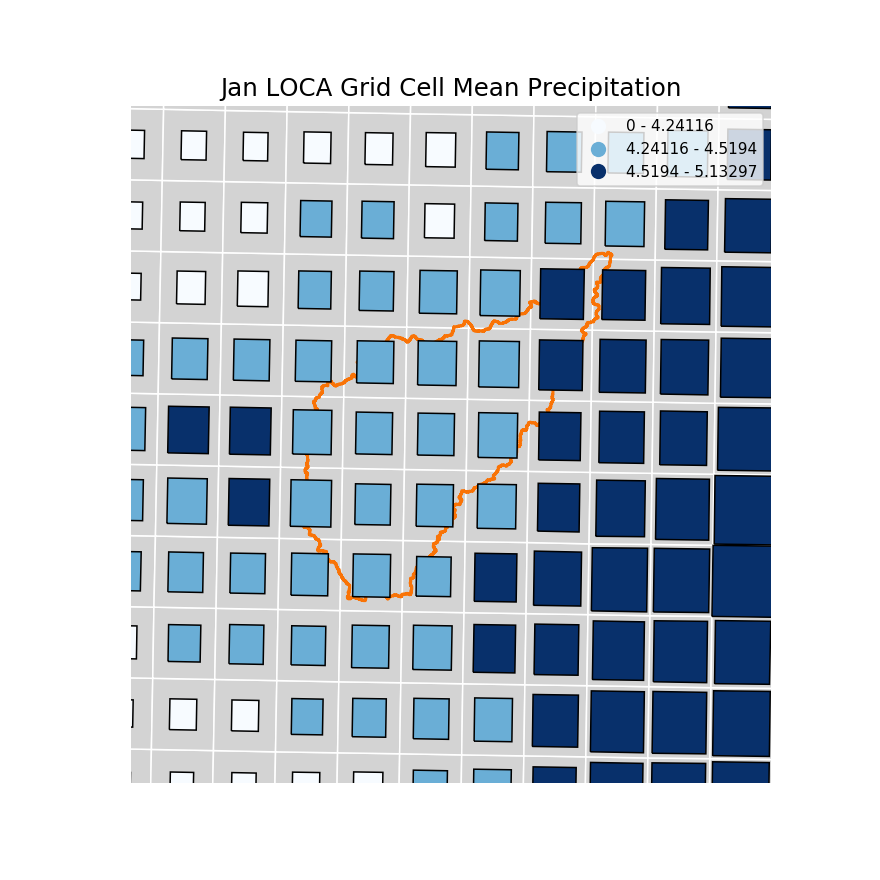

Text(0.5, 1.0, 'Jan LOCA Grid Cell Mean Precipitation')

In [73]:
Monther = "Jan"
VarType = "Mean"
Fig1 = plt.figure()
Fig1.set_size_inches(8.0, 8.0)
ax11 = Fig1.add_subplot(111)
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
gplt.cartogram( gpdLOJanDF, scale="Mean", hue="Mean", cmap="Blues", ax=ax11,
                legend=True, legend_var='hue', k=3 )
gplt.polyplot( gpdLOJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("%s LOCA Grid Cell %s Precipitation" % (Monther, VarType), fontsize=16 )

<IPython.core.display.Javascript object>


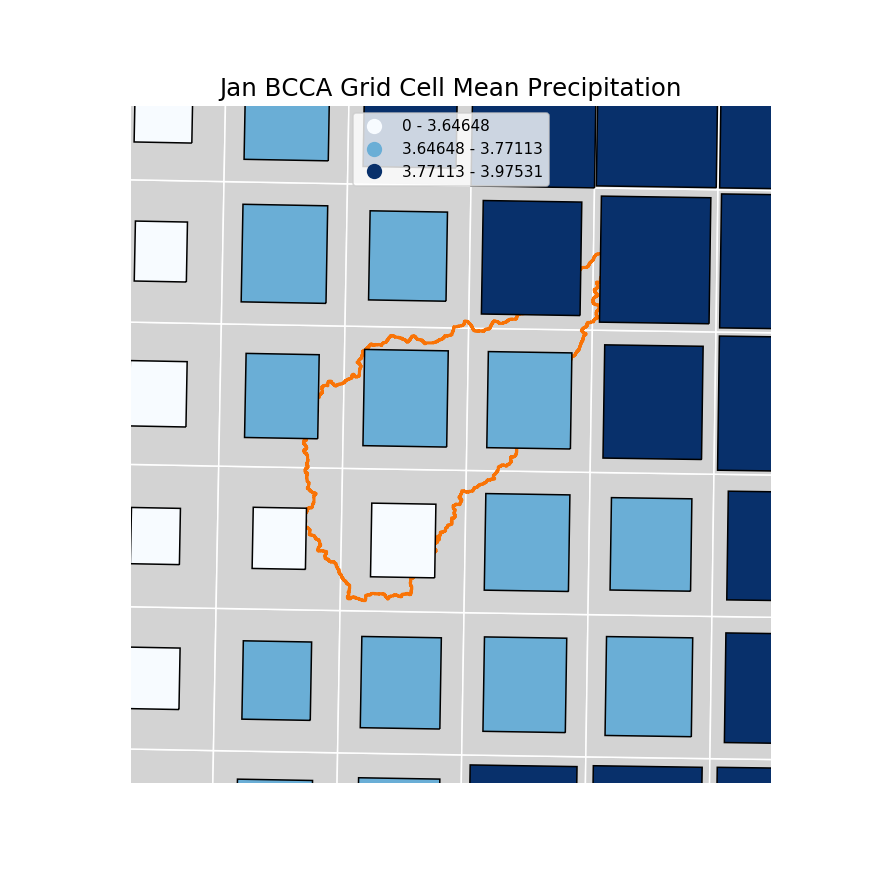

Text(0.5, 1.0, 'Jan BCCA Grid Cell Mean Precipitation')

In [74]:
Monther = "Jan"
VarType = "Mean"
Fig1 = plt.figure()
Fig1.set_size_inches(8.0, 8.0)
ax11 = Fig1.add_subplot(111)
DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', linewidth=2, label="Watershed" )
gplt.cartogram( gpdBCJanDF, scale="Mean", hue="Mean", cmap="Blues", ax=ax11,
                legend=True, legend_var='hue', k=3 )
gplt.polyplot( gpdBCJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
ax11.set_xlim( ( 286500, 348800 ) )
ax11.set_ylim( ( 3289800, 3355800 ) )
ax11.set_title("%s BCCA Grid Cell %s Precipitation" % (Monther, VarType), fontsize=16 )

In [75]:
#PlotColumnsList = [ "Mean", "Median", "Max", "StDev", "Skewness", "Kurtosis",
#                    "l_2", "l_3", "l_4", "L-CV", "L-Skewness", "L-Kurtosis", ]
PlotColumnsList = [ "Mean", "Max", "StDev", "Skewness", "Kurtosis",
                    "l_2", "l_3", "l_4", "L-CV", "L-Skewness", "L-Kurtosis", ]
PlotCmapsList = [ "Blues", "Purples", "Greens", "Oranges", "Reds", "Greys",
                  "viridis", "plasma", "inferno", "magma", "YlOrBr", "BuPu" ]

In [76]:
NumPlotTypes = len( PlotColumnsList )
NumK = 3

<IPython.core.display.Javascript object>


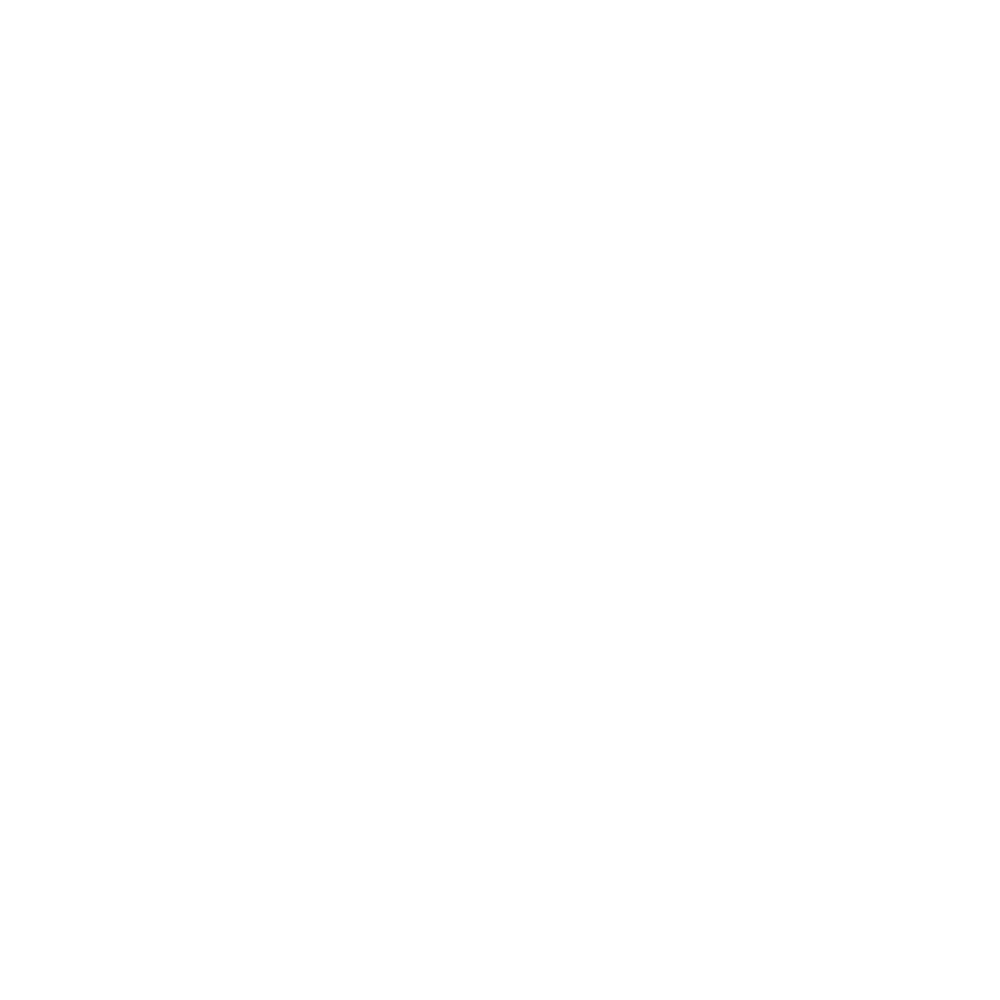

<IPython.core.display.Javascript object>


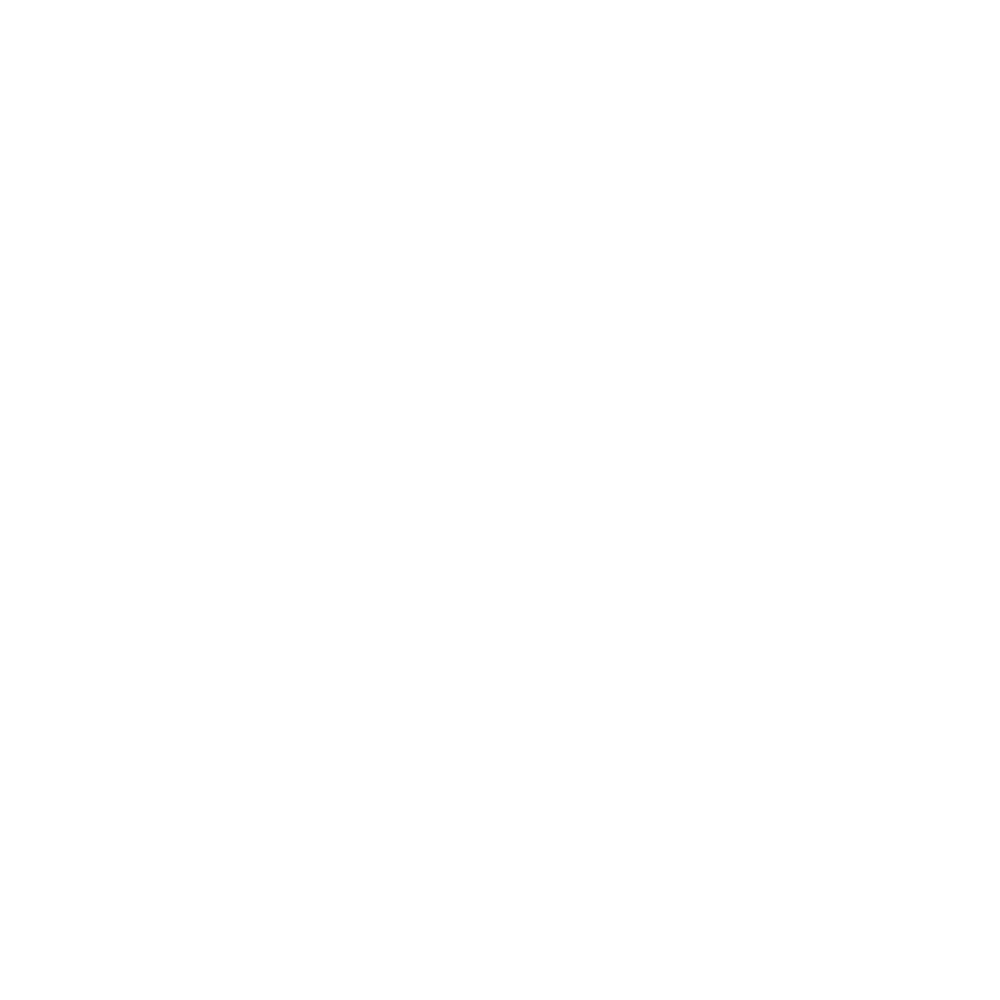

<IPython.core.display.Javascript object>


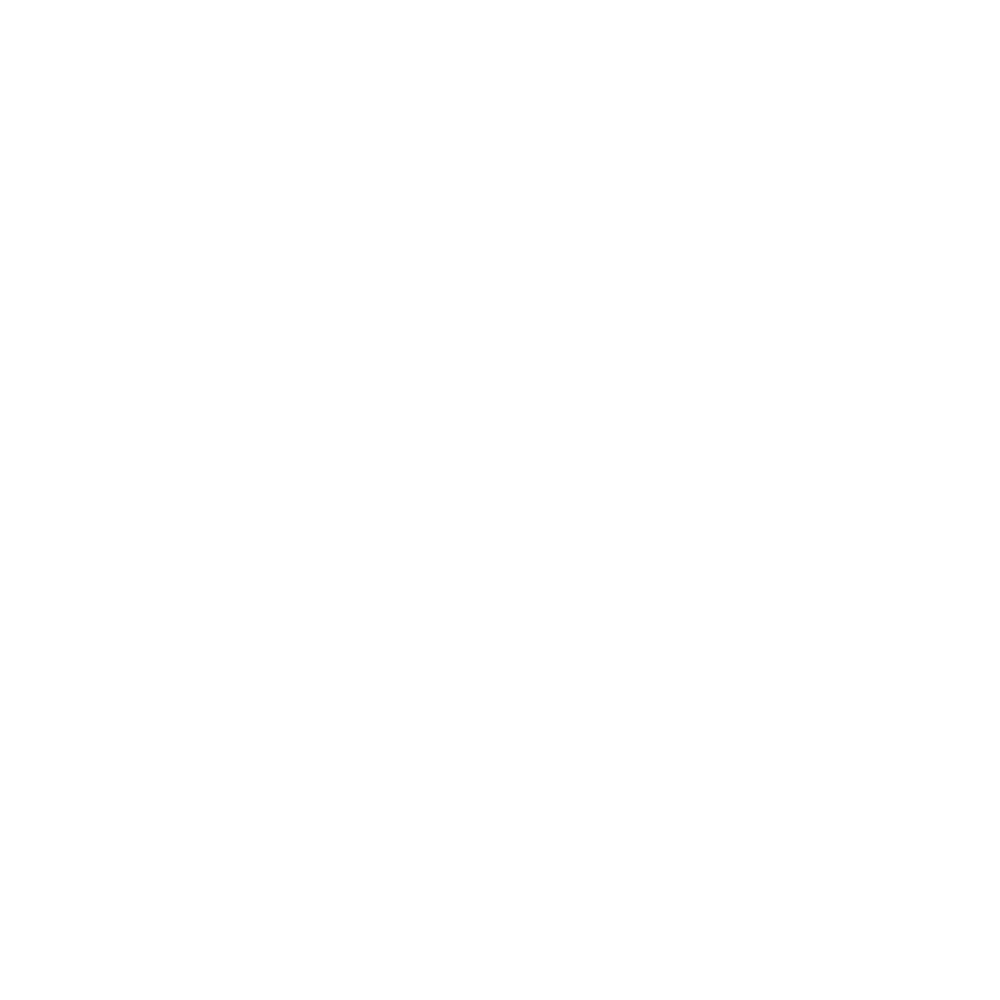

<IPython.core.display.Javascript object>


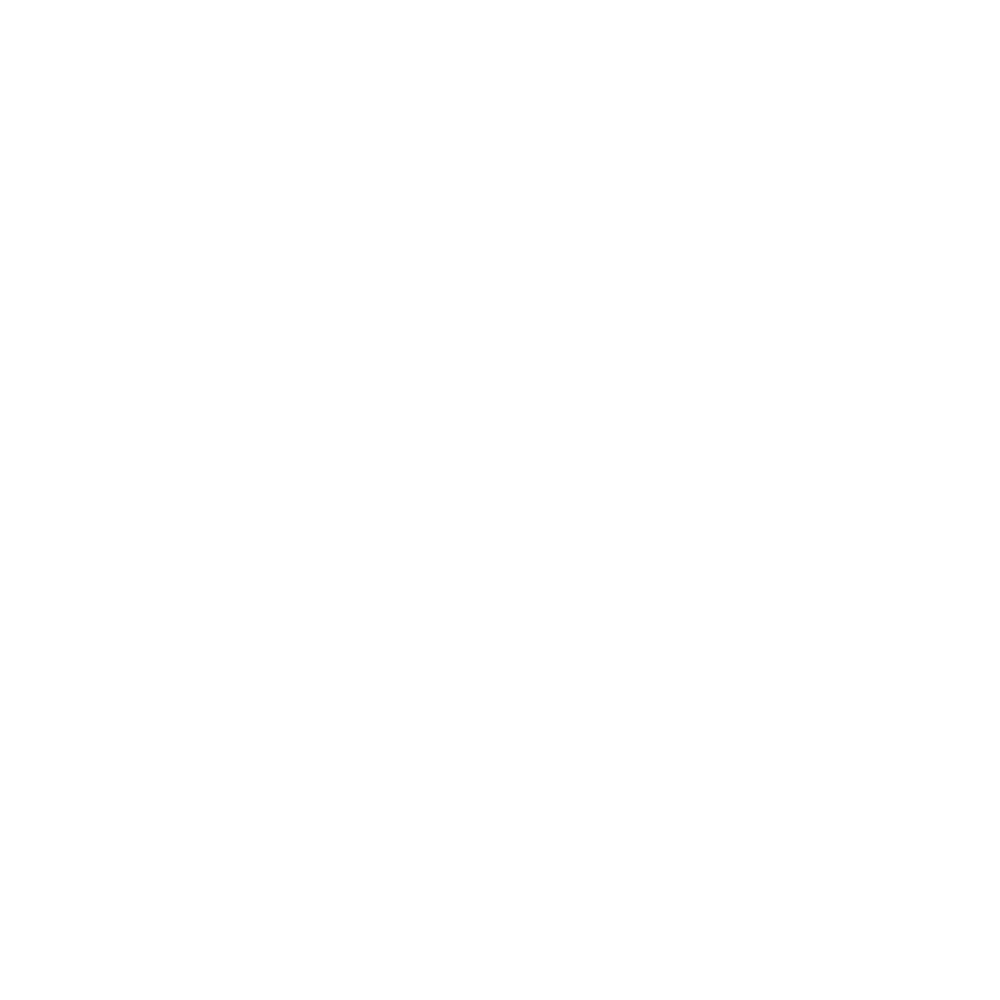

<IPython.core.display.Javascript object>


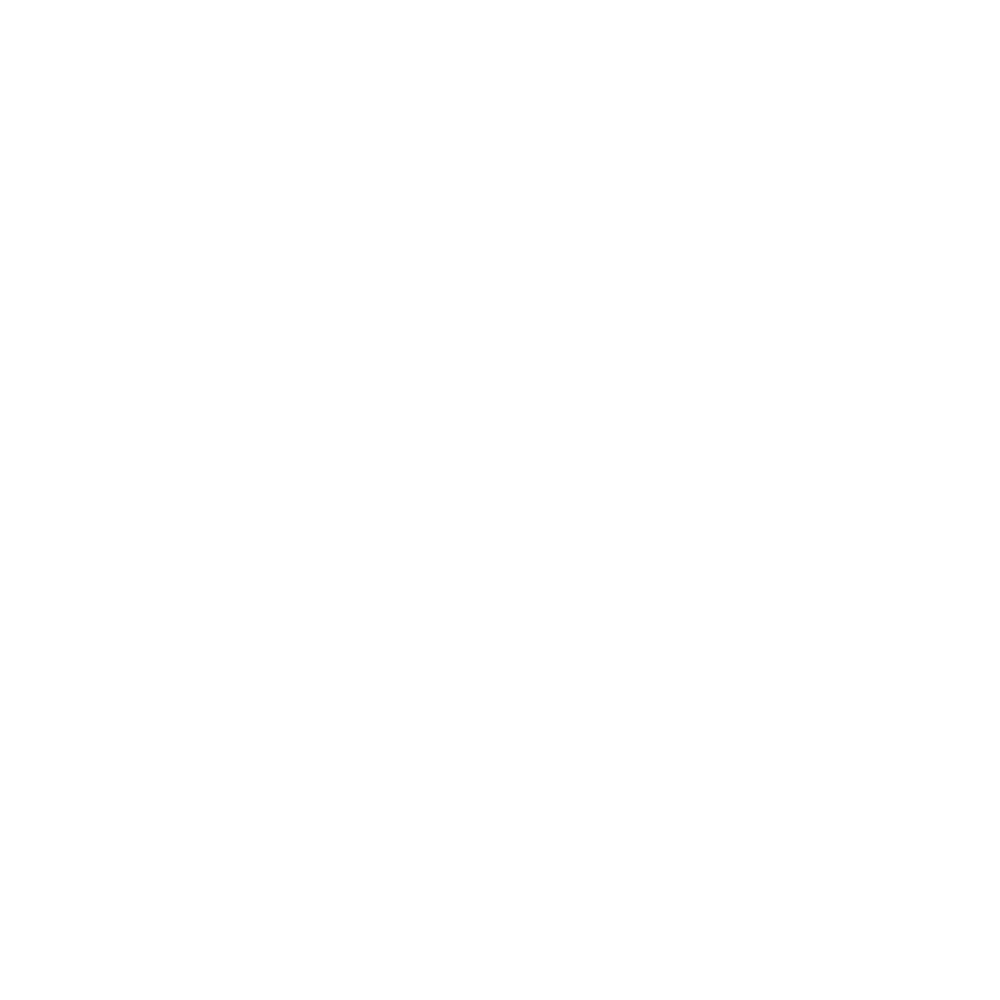

<IPython.core.display.Javascript object>


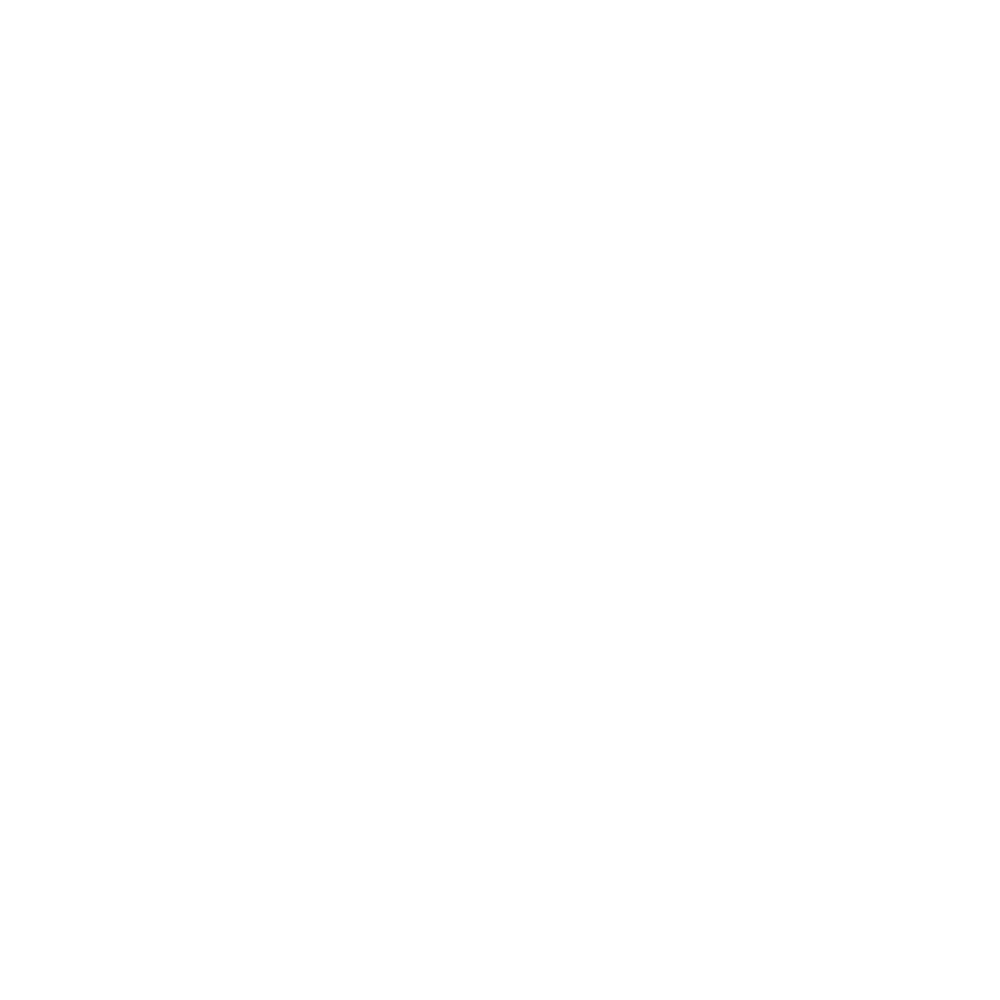

<IPython.core.display.Javascript object>


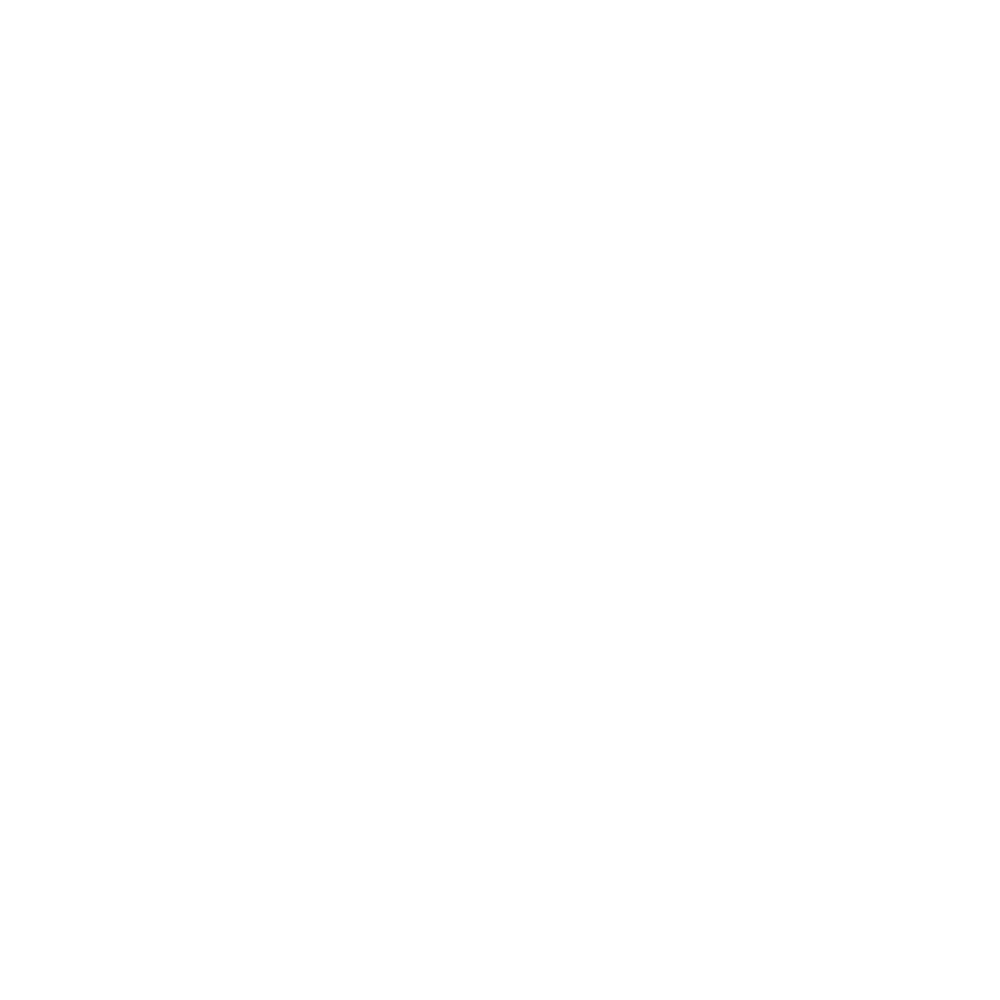

<IPython.core.display.Javascript object>


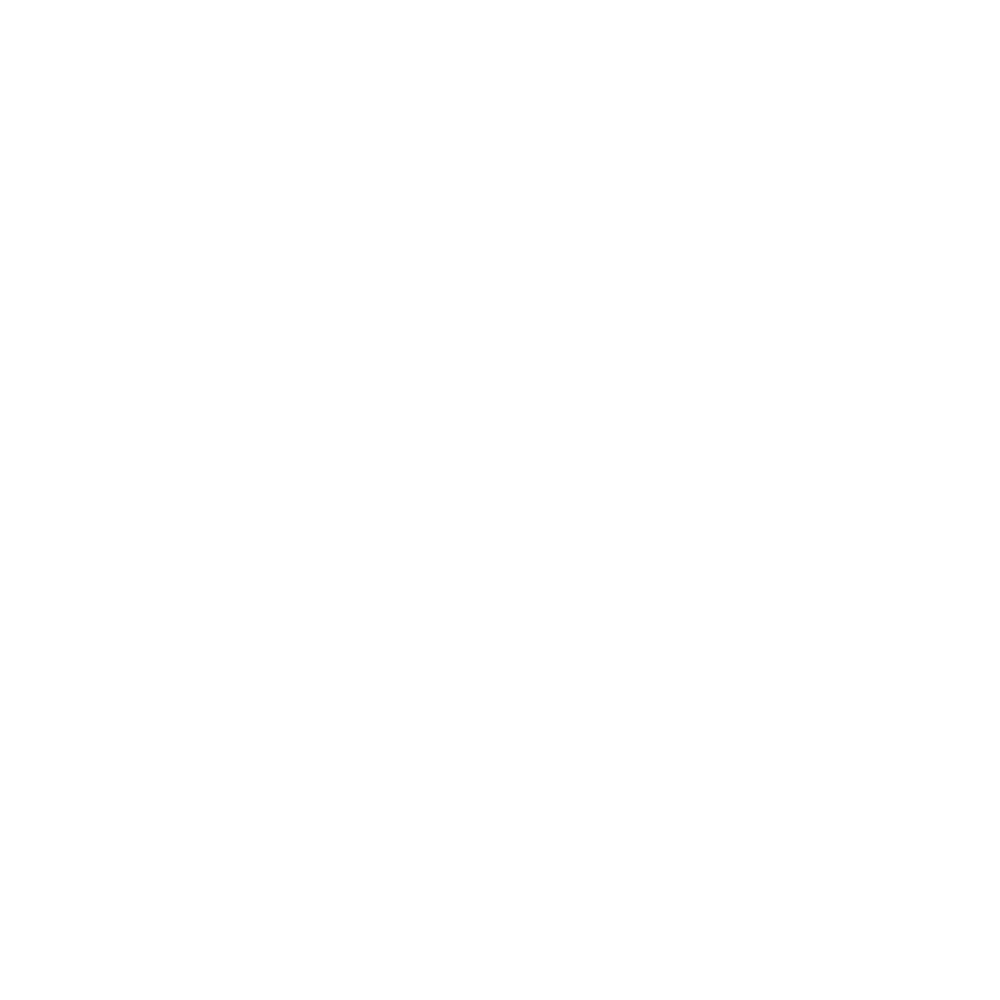

<IPython.core.display.Javascript object>


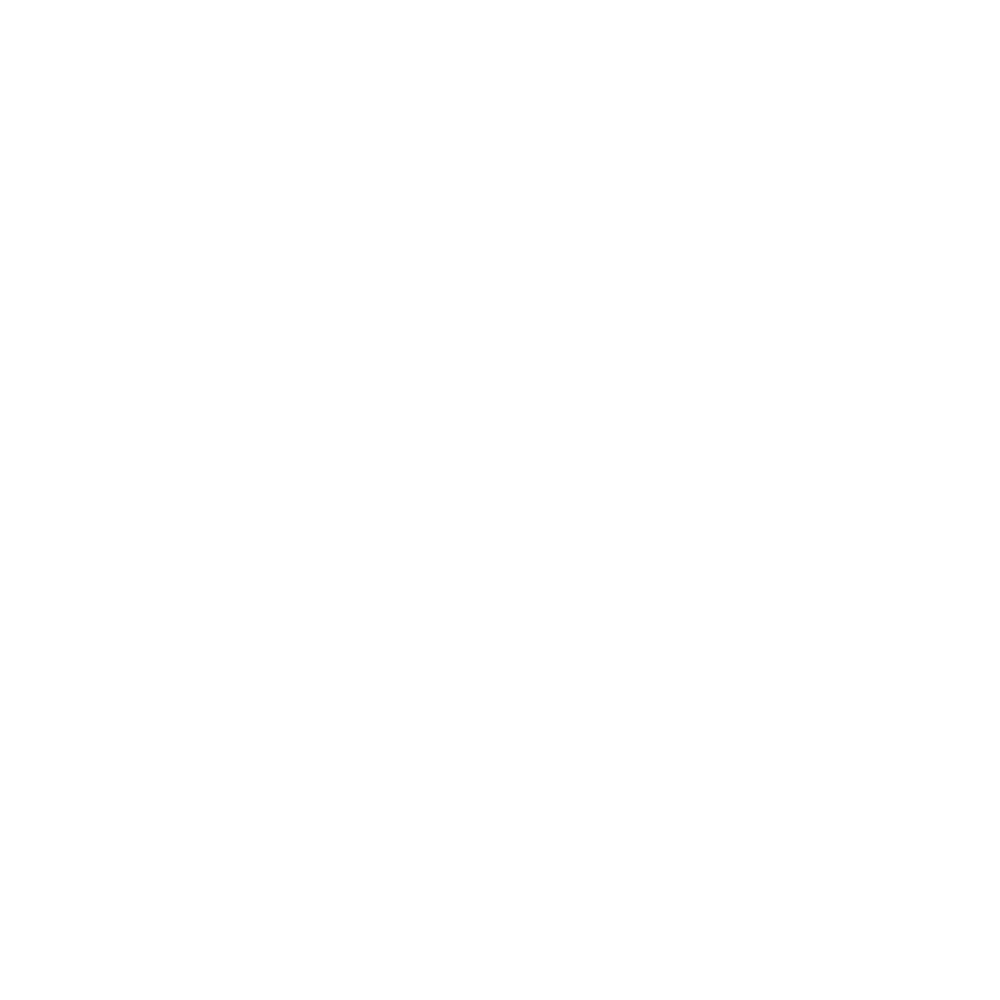

<IPython.core.display.Javascript object>


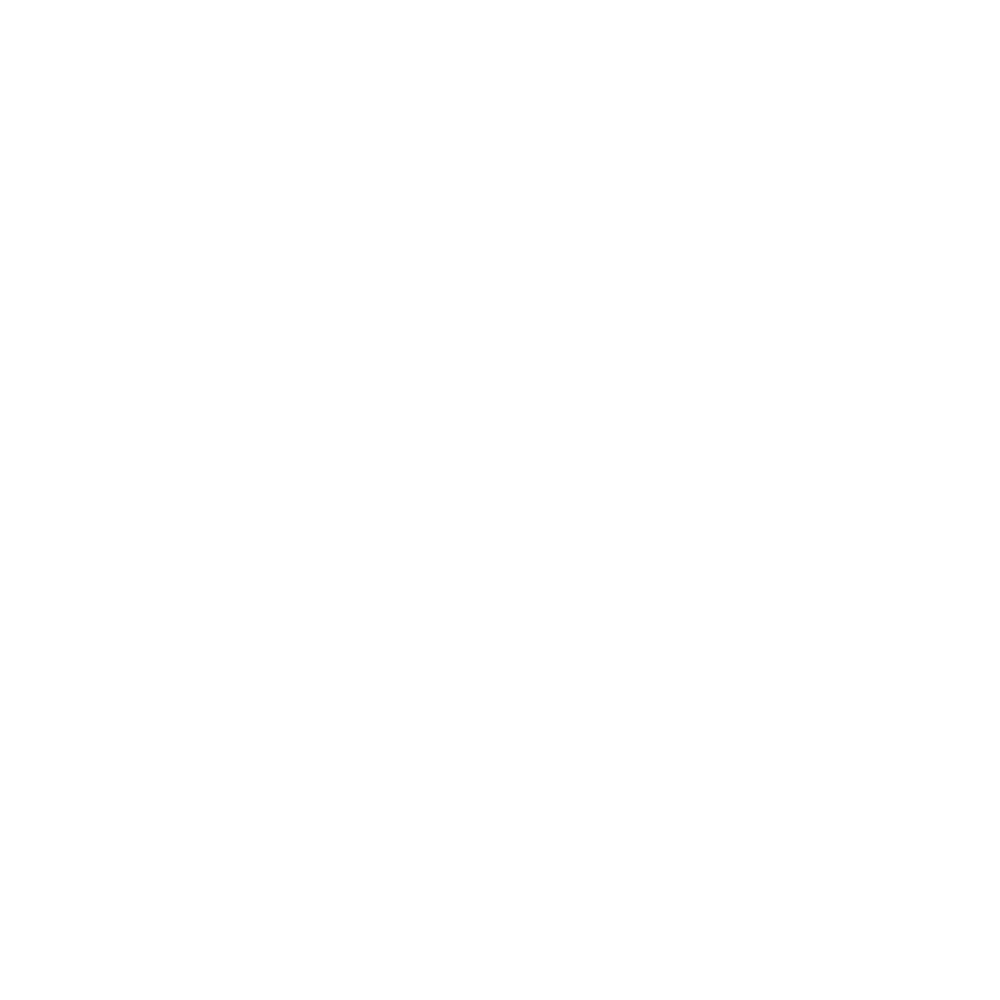

<IPython.core.display.Javascript object>


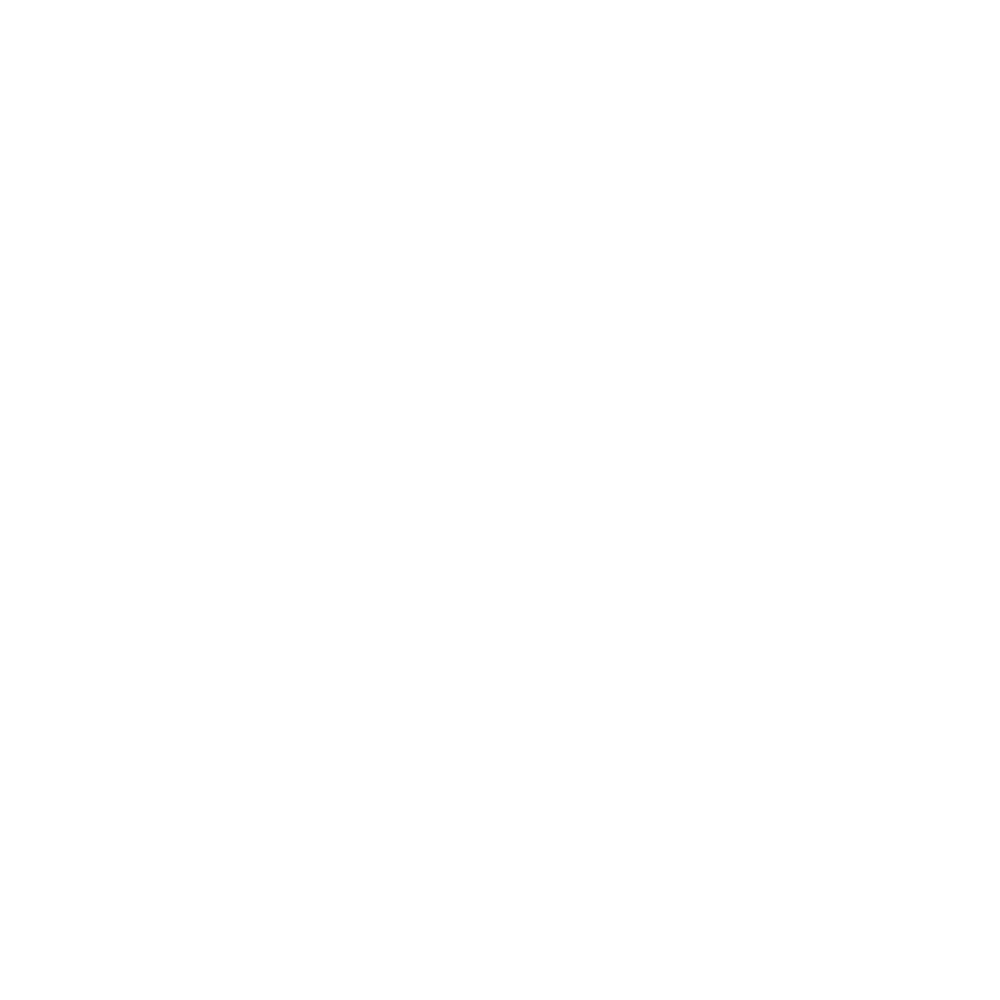

<IPython.core.display.Javascript object>


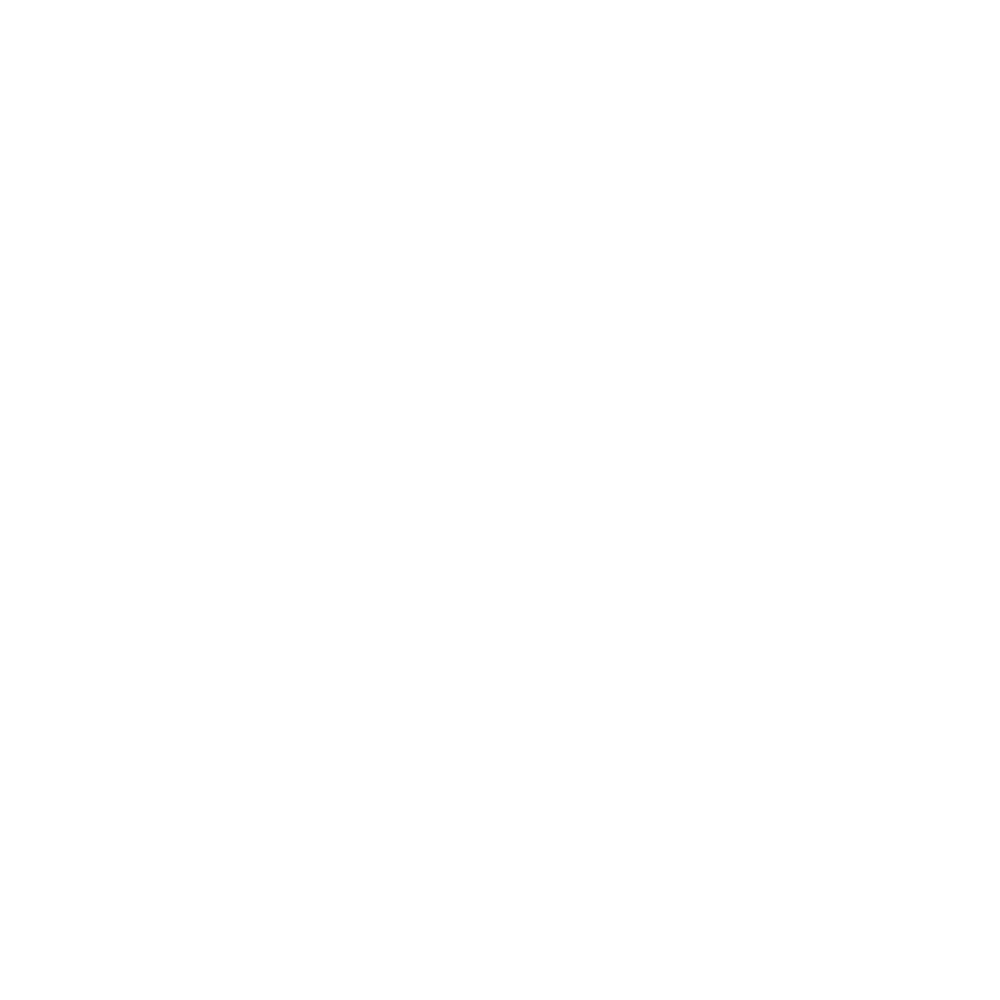

<IPython.core.display.Javascript object>


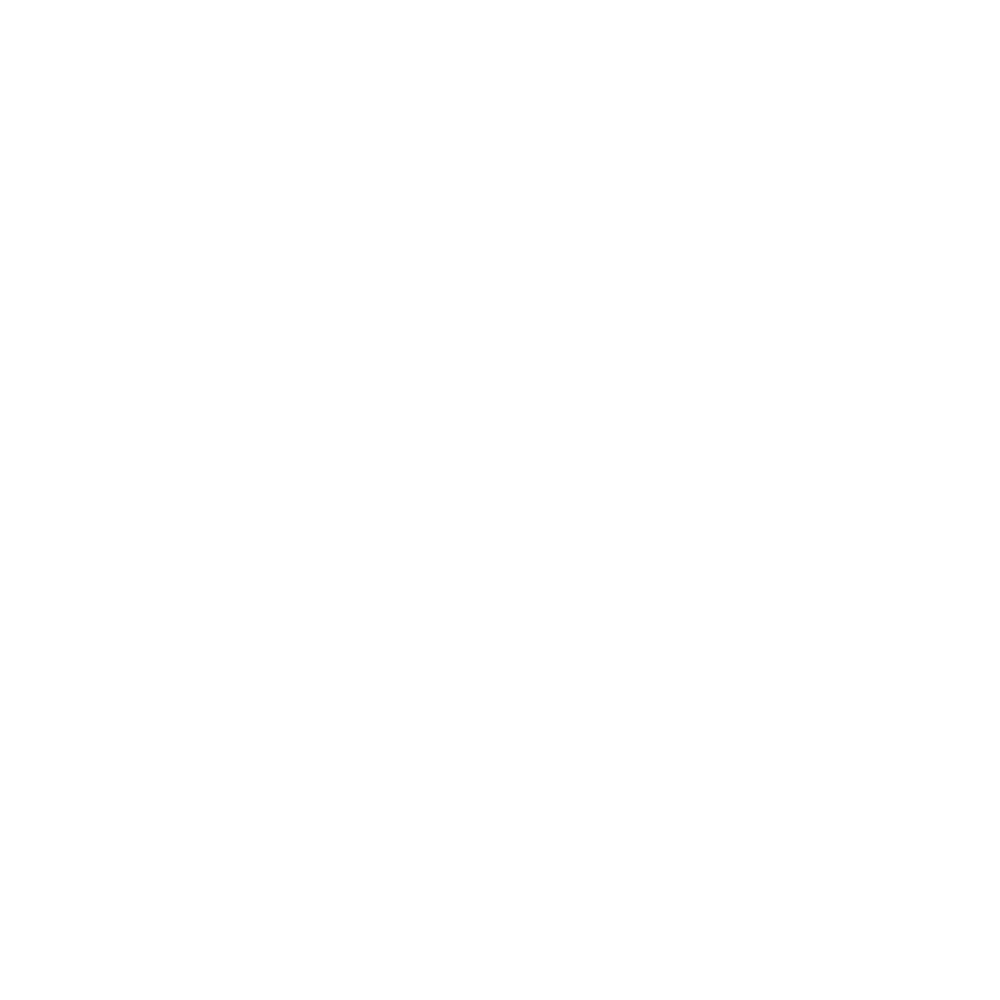

<IPython.core.display.Javascript object>


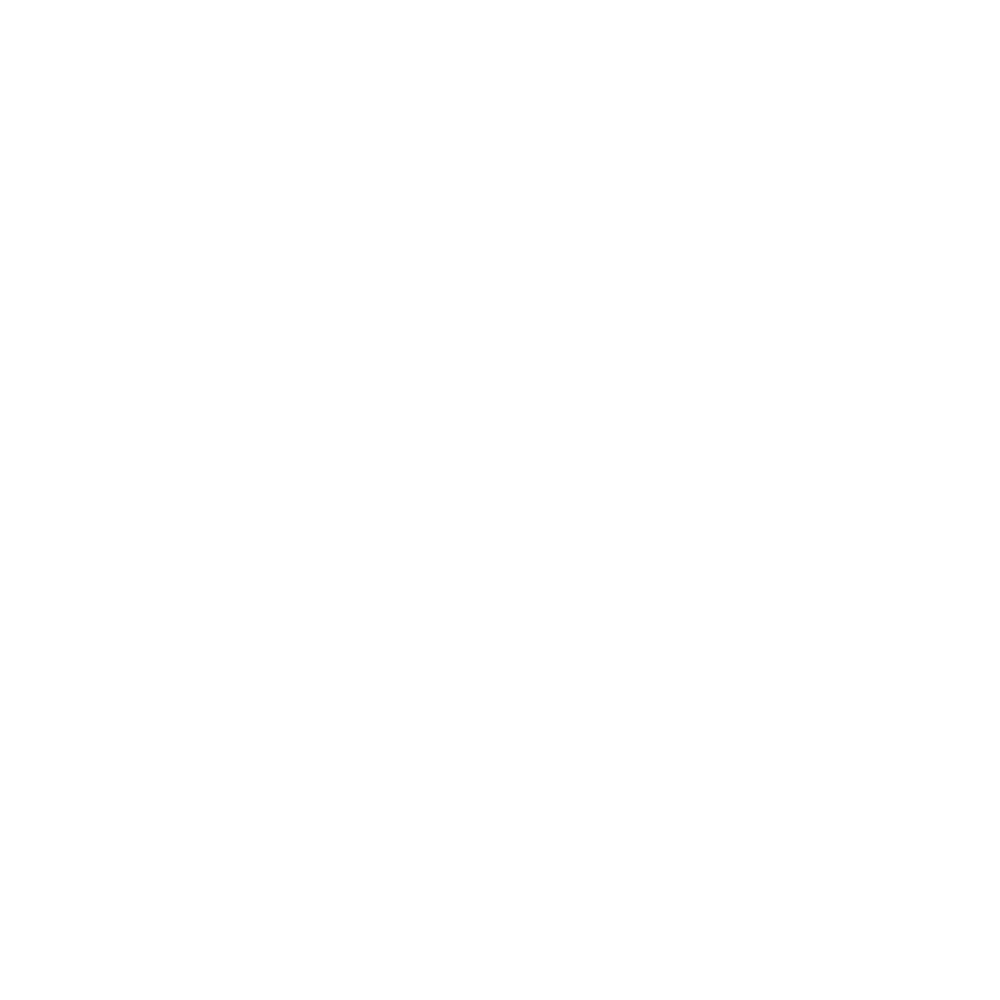

<IPython.core.display.Javascript object>


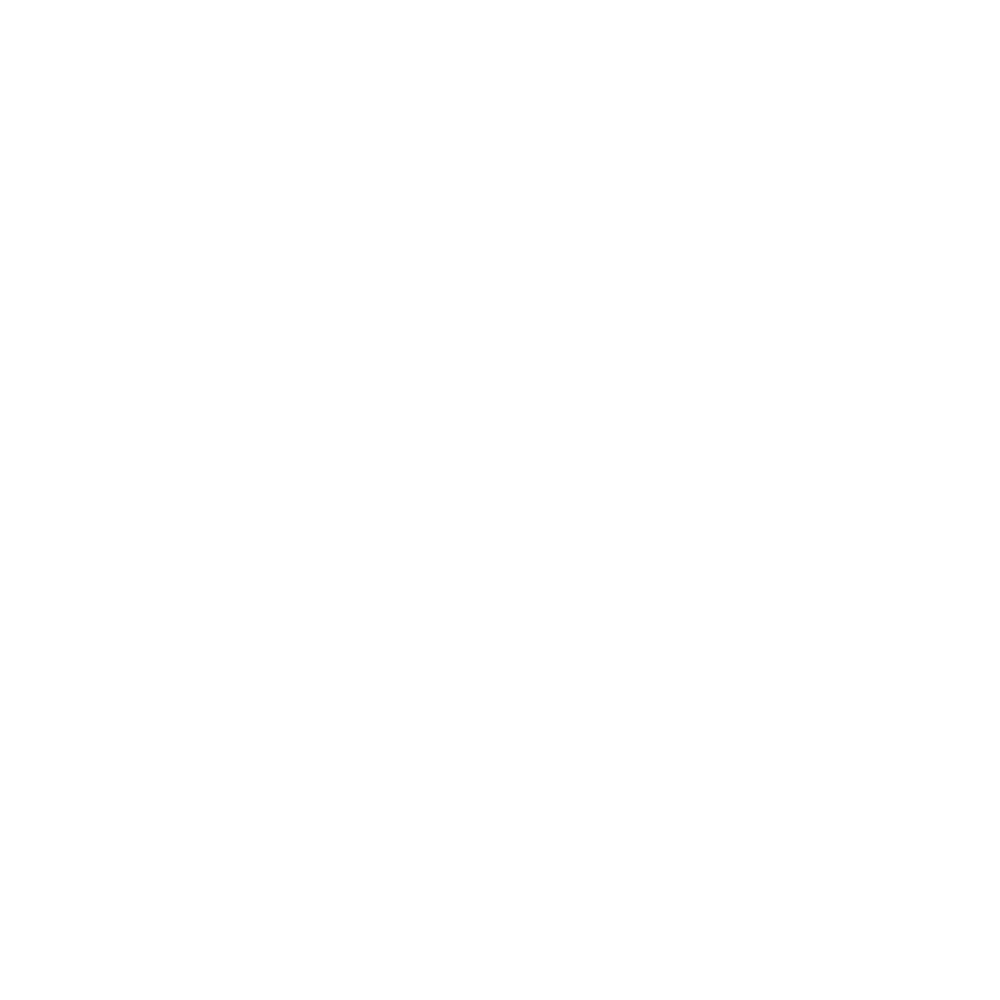

<IPython.core.display.Javascript object>


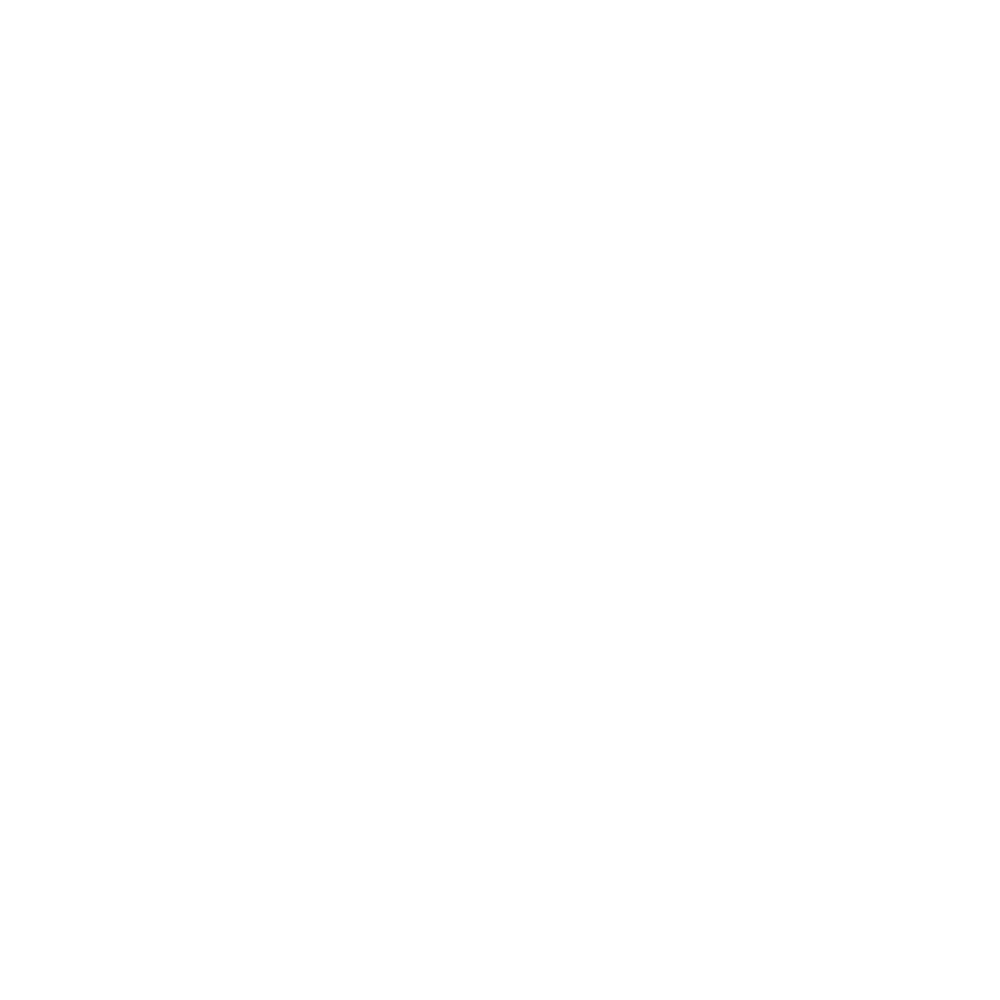

<IPython.core.display.Javascript object>


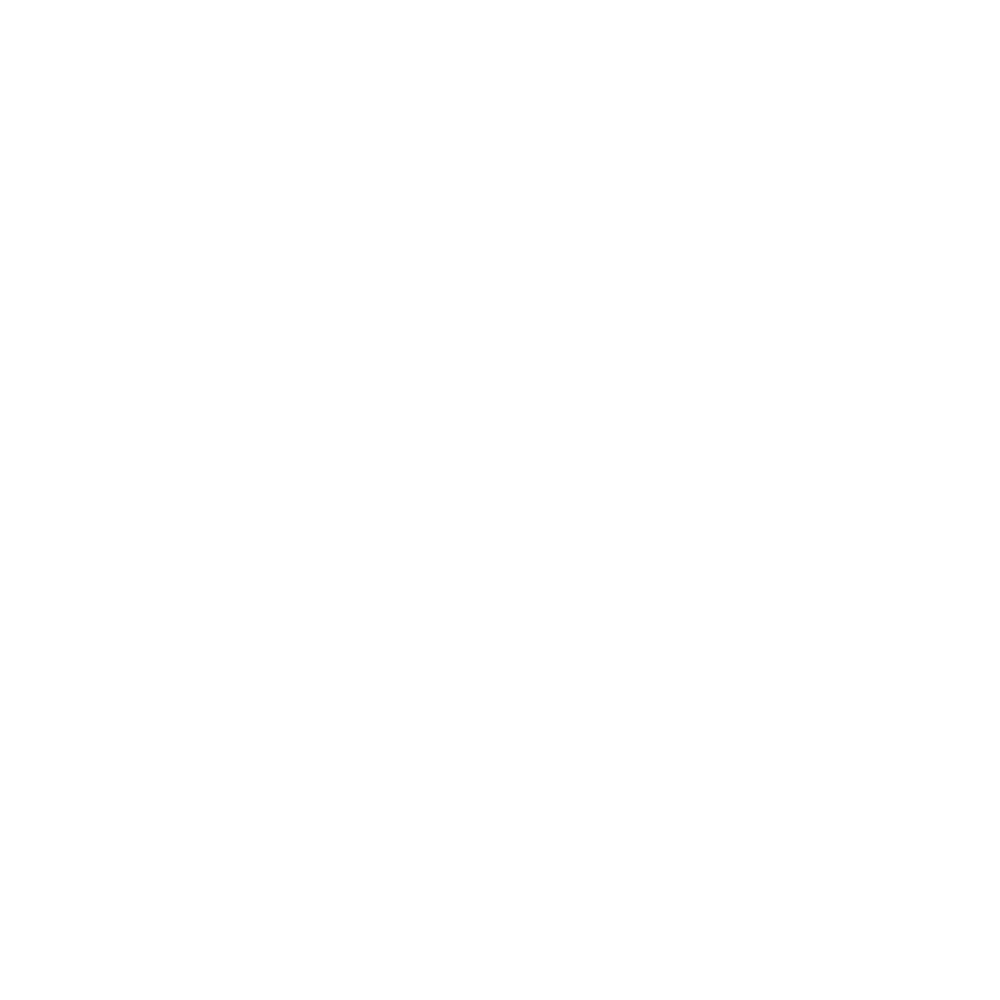

<IPython.core.display.Javascript object>


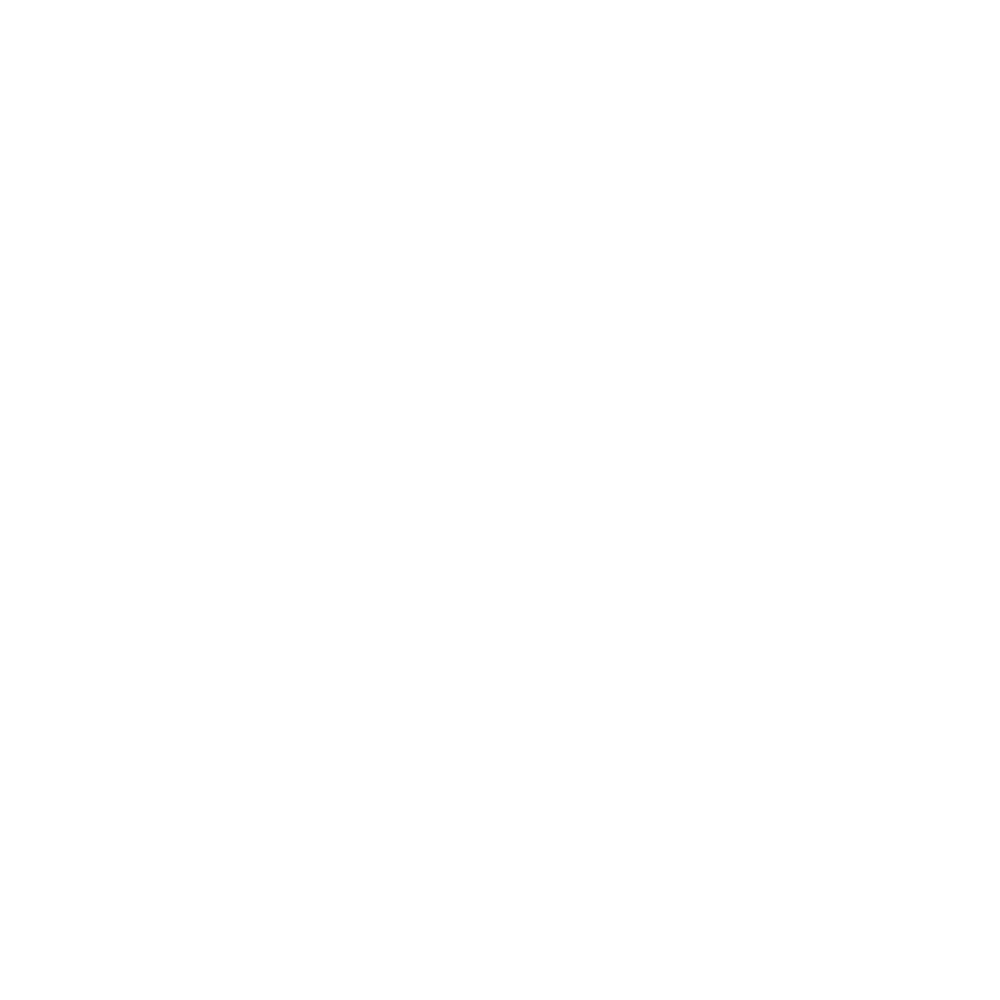

<IPython.core.display.Javascript object>


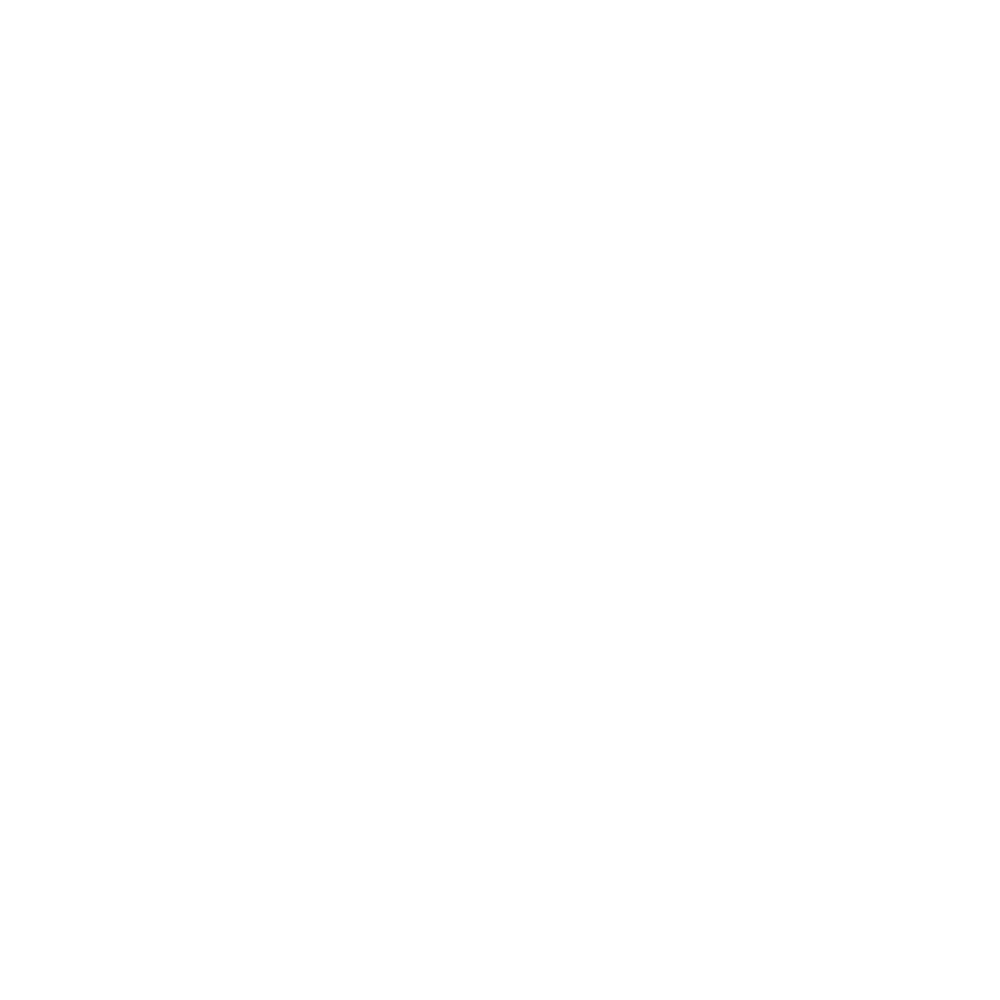

<IPython.core.display.Javascript object>


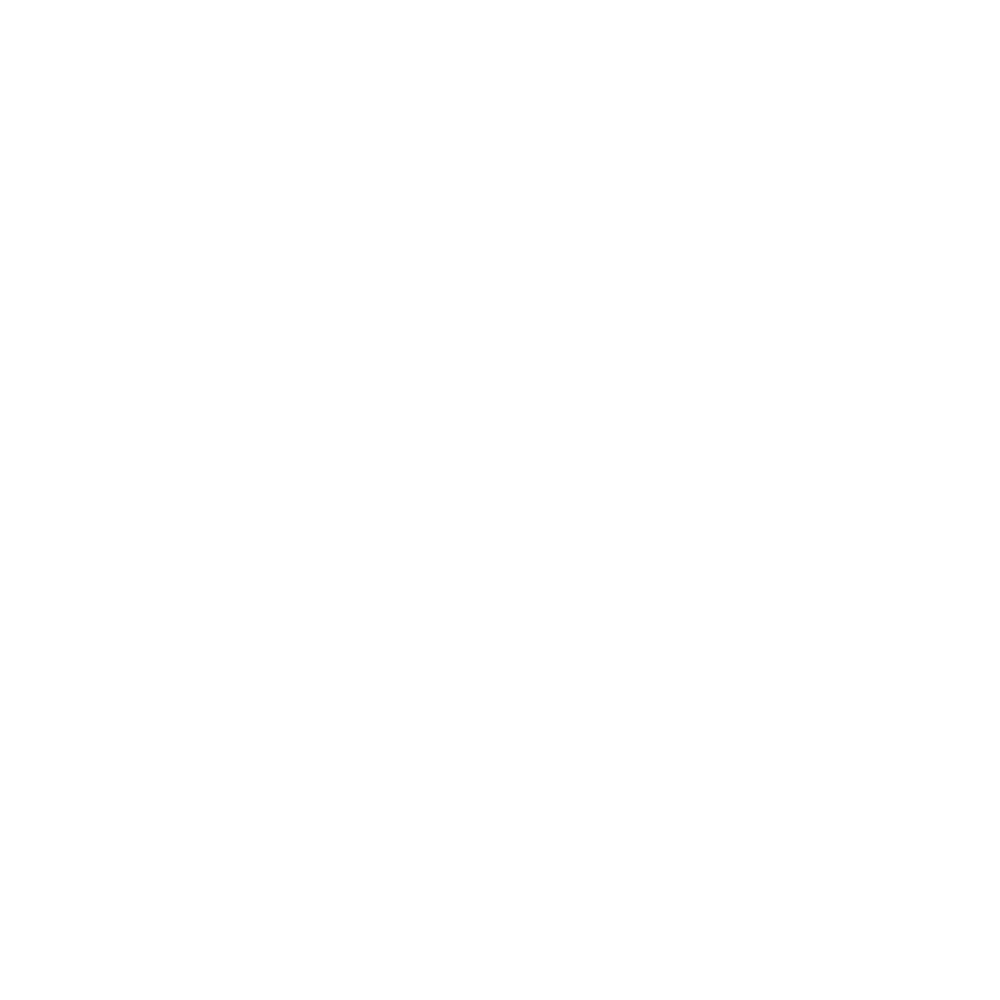

<IPython.core.display.Javascript object>


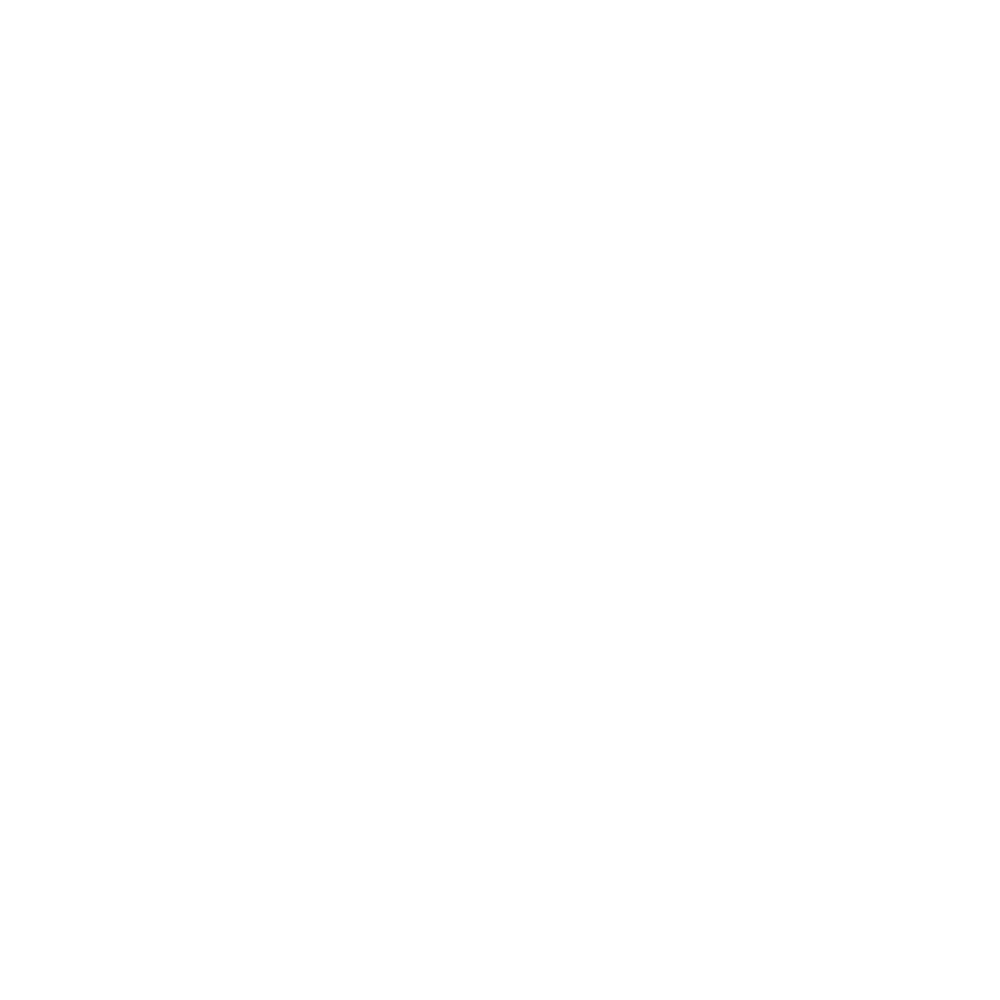

<IPython.core.display.Javascript object>


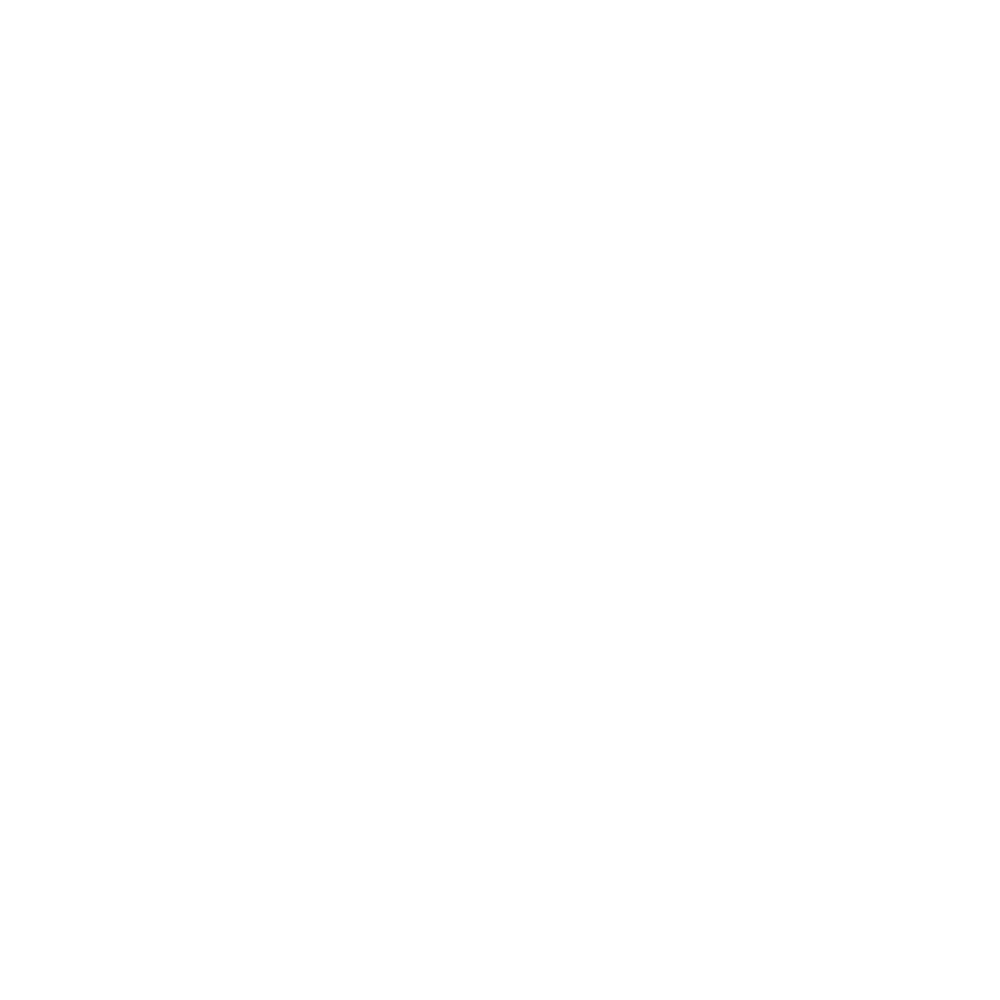

<IPython.core.display.Javascript object>


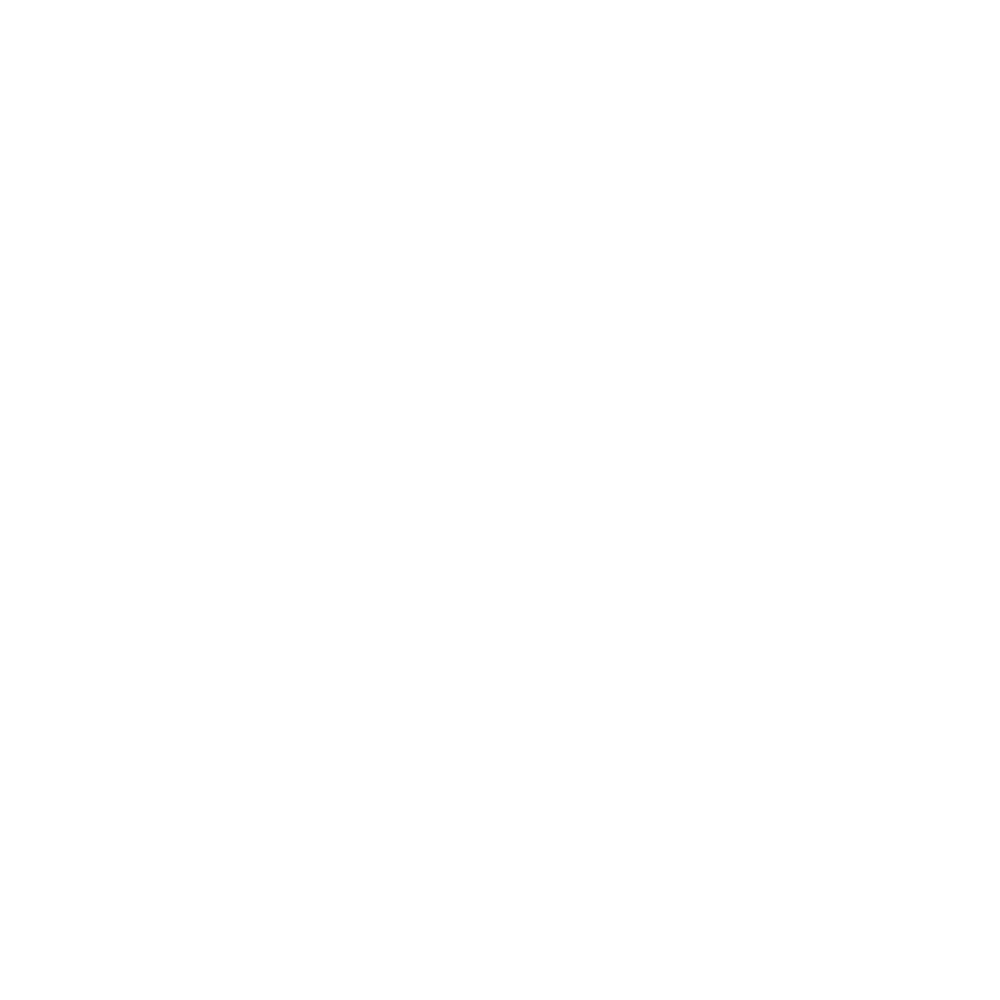

<IPython.core.display.Javascript object>


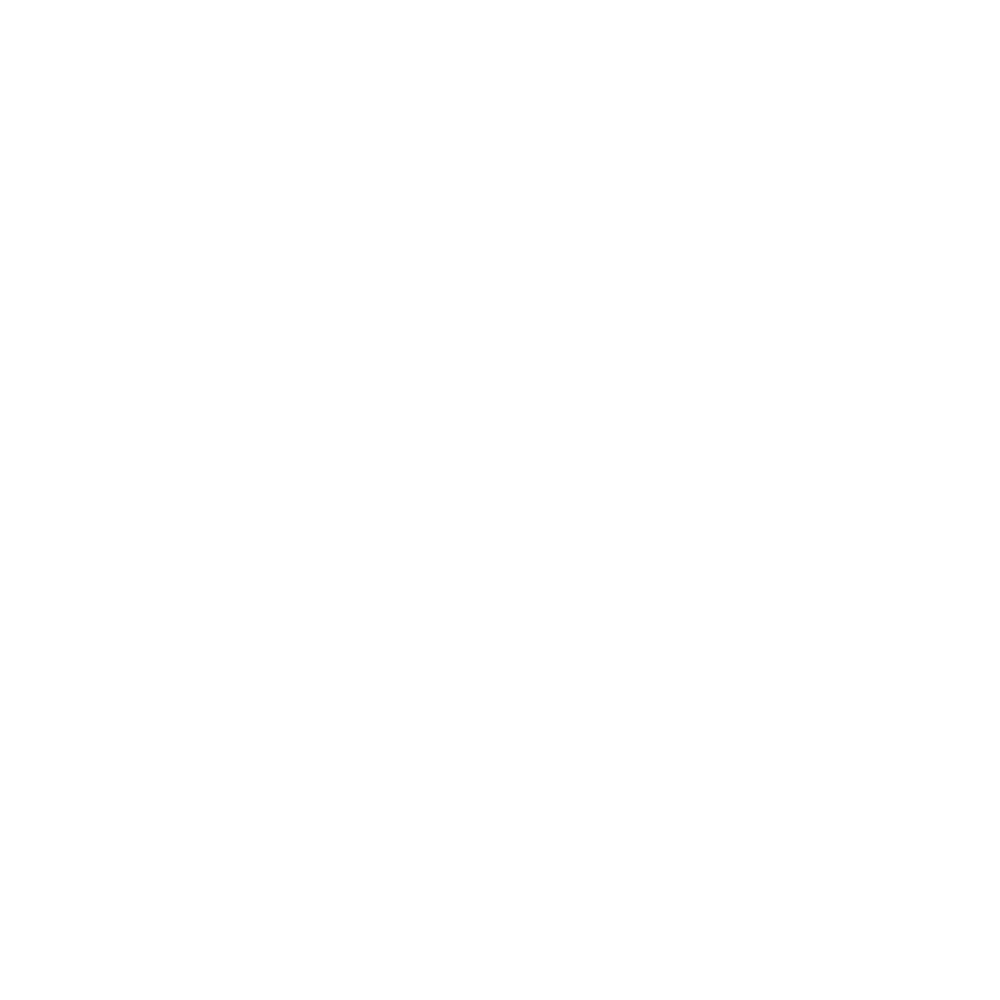

<IPython.core.display.Javascript object>


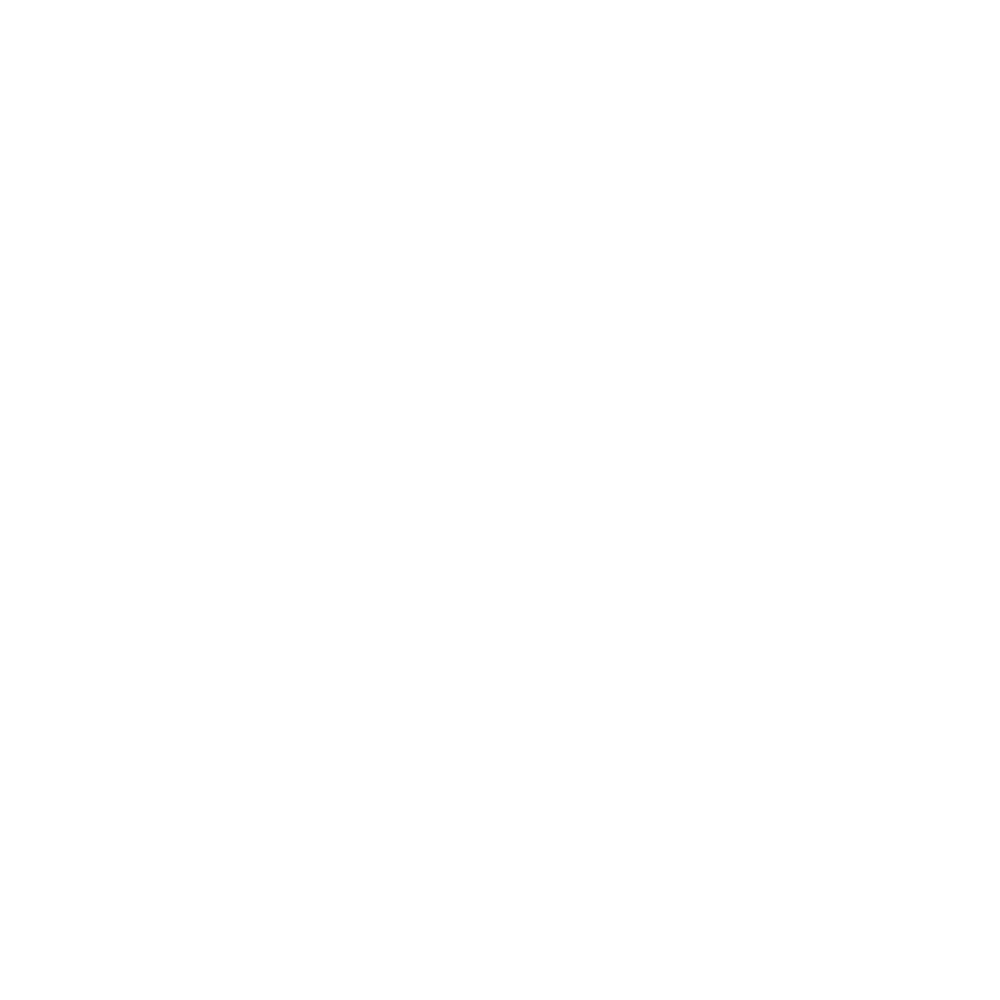

<IPython.core.display.Javascript object>


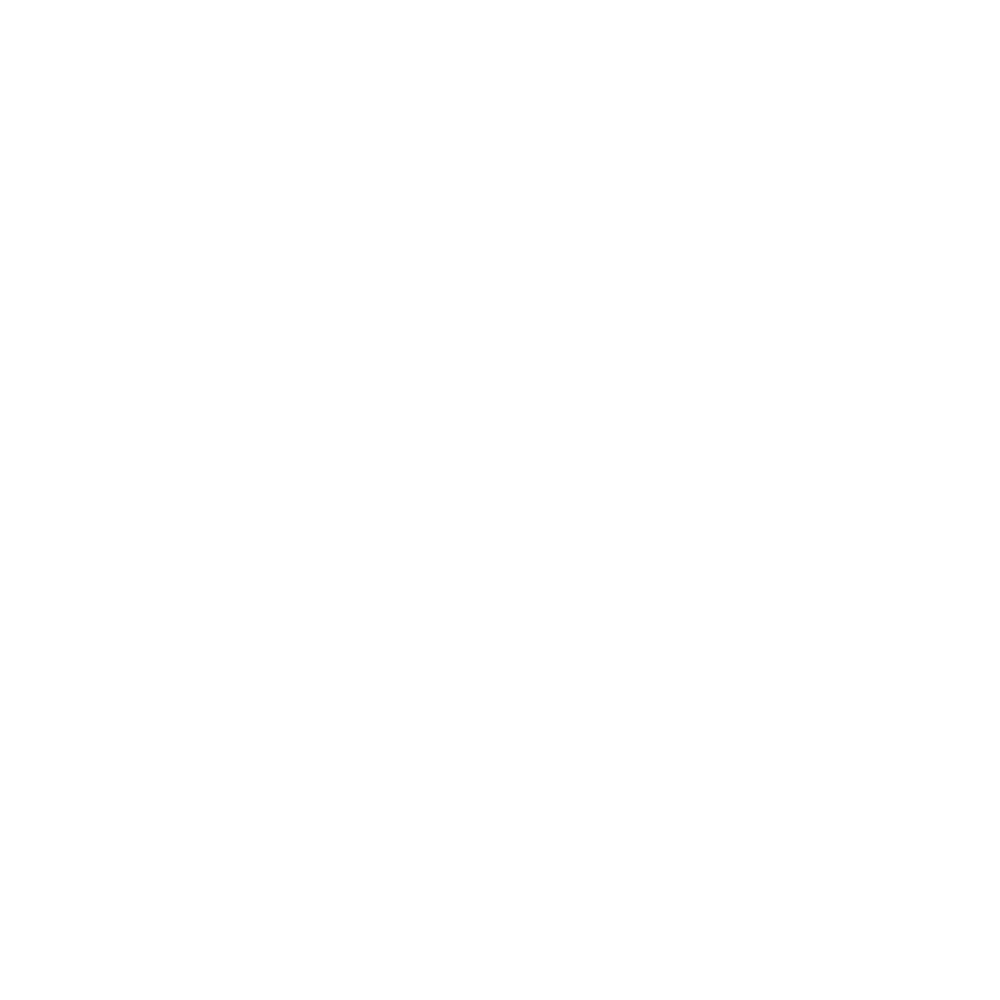

<IPython.core.display.Javascript object>


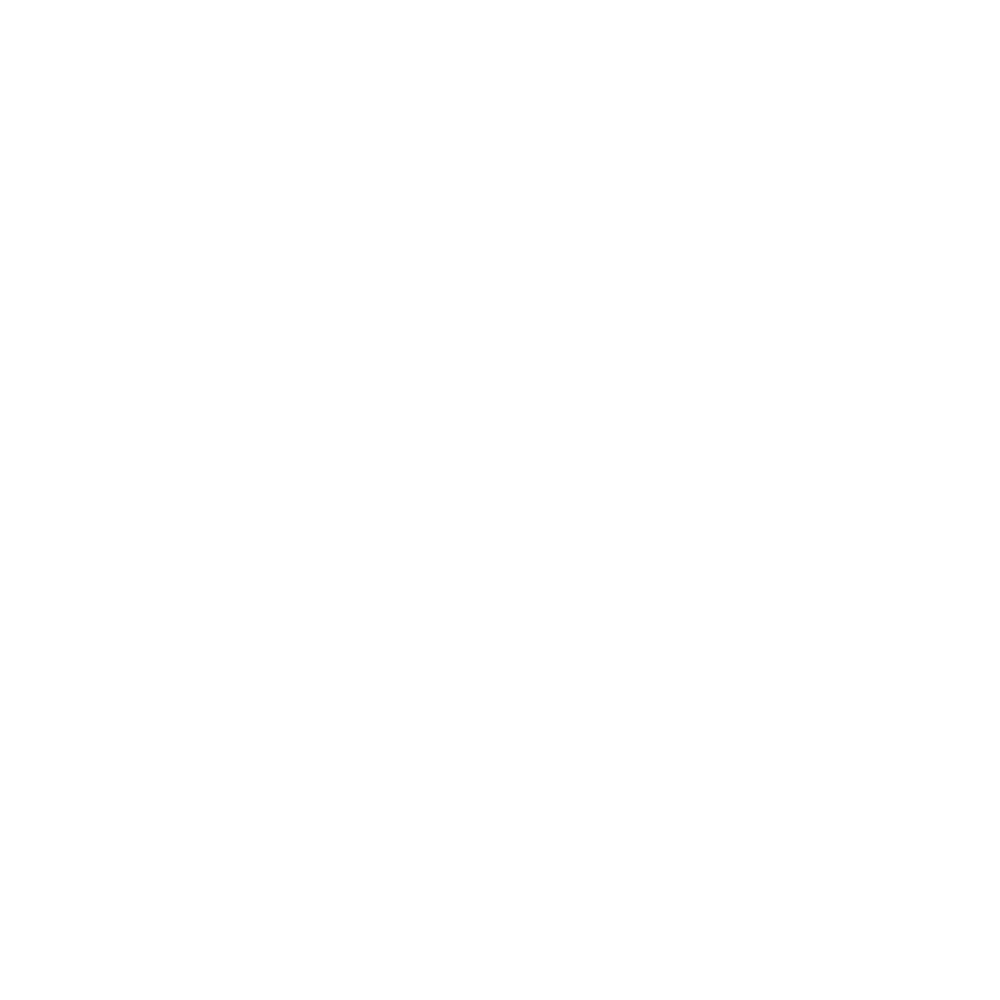

<IPython.core.display.Javascript object>


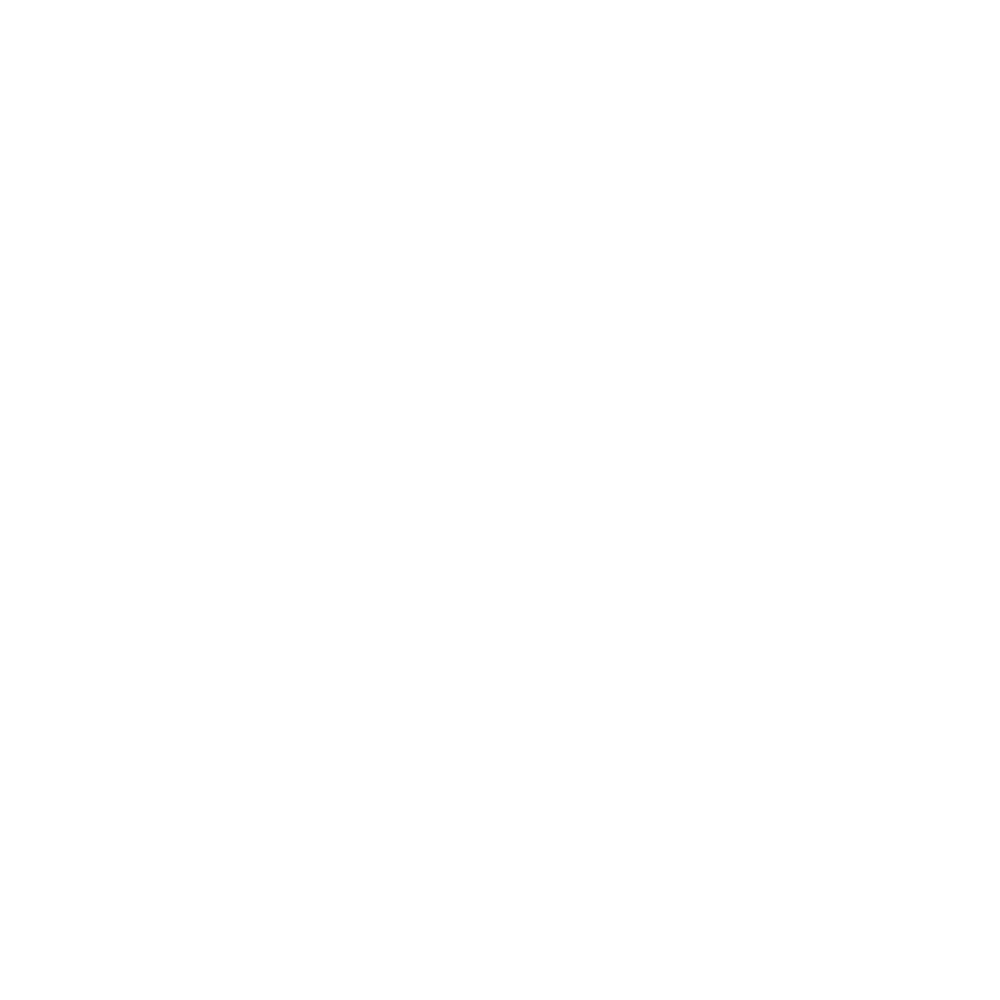

<IPython.core.display.Javascript object>


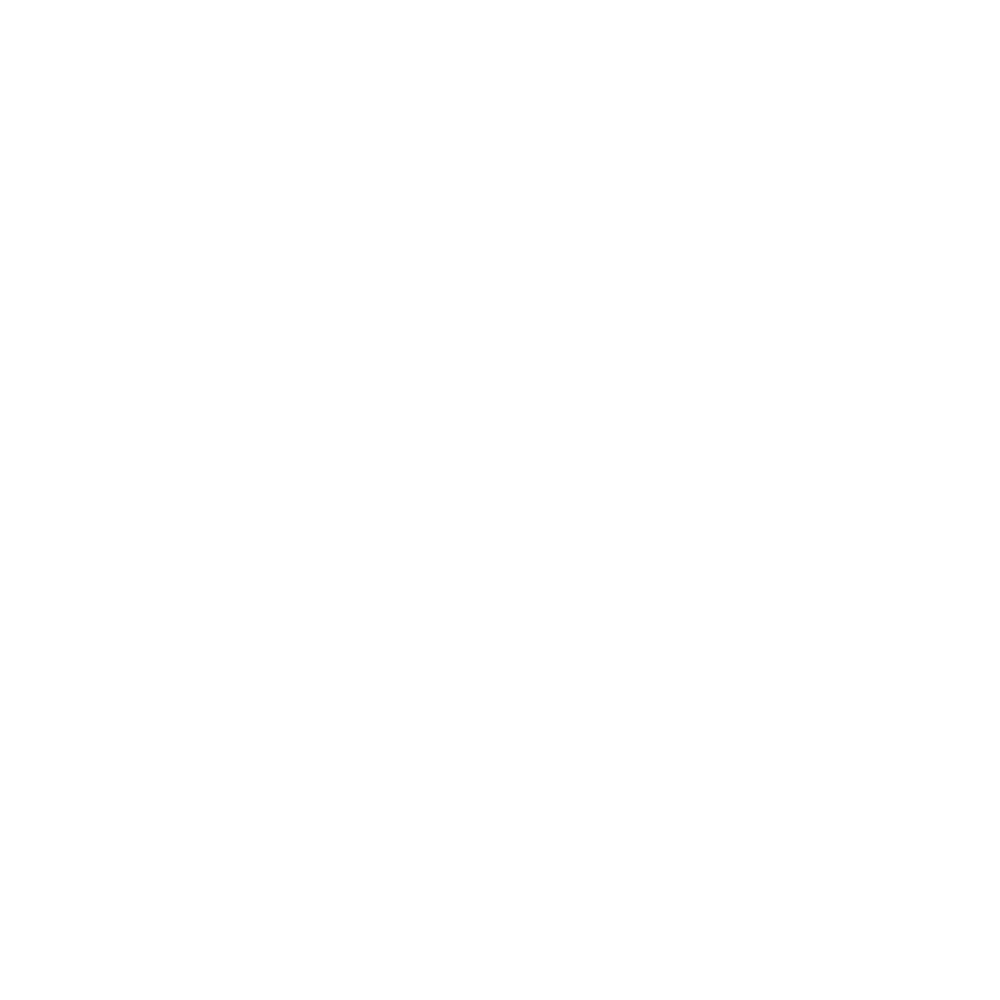

<IPython.core.display.Javascript object>


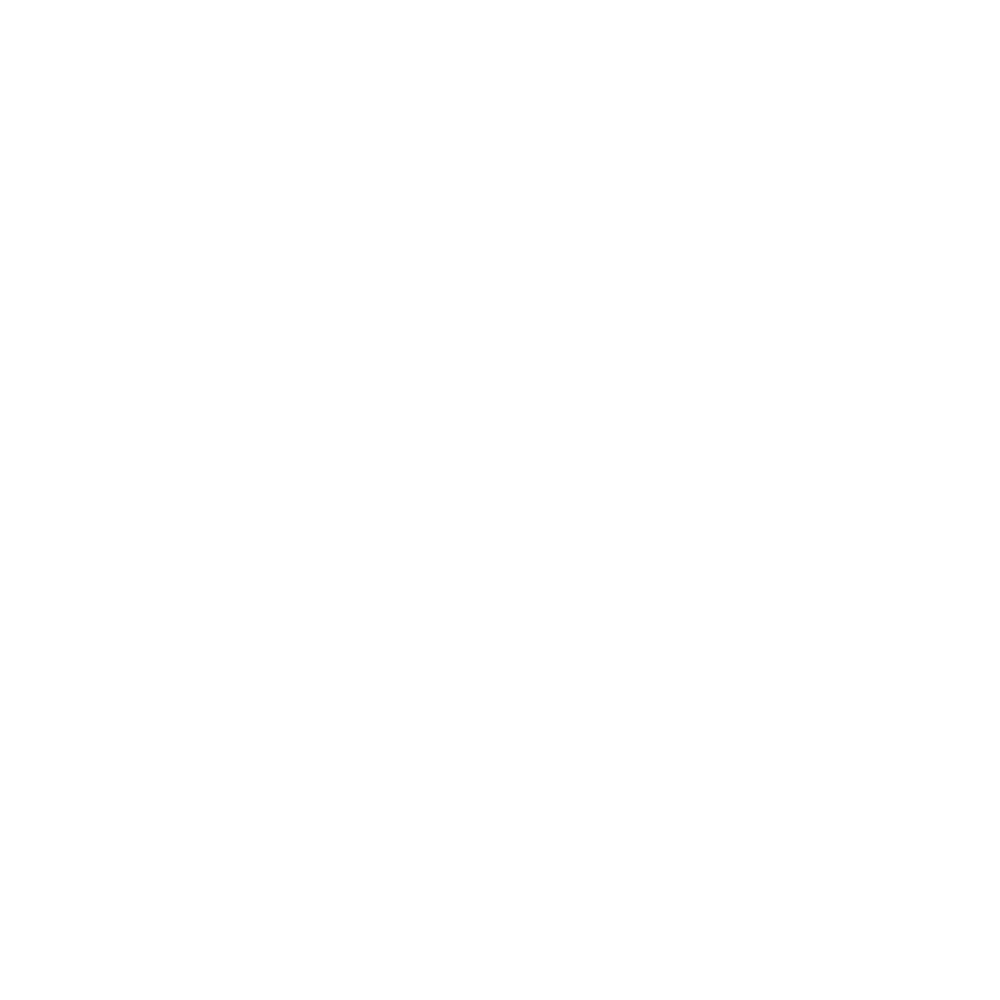

<IPython.core.display.Javascript object>


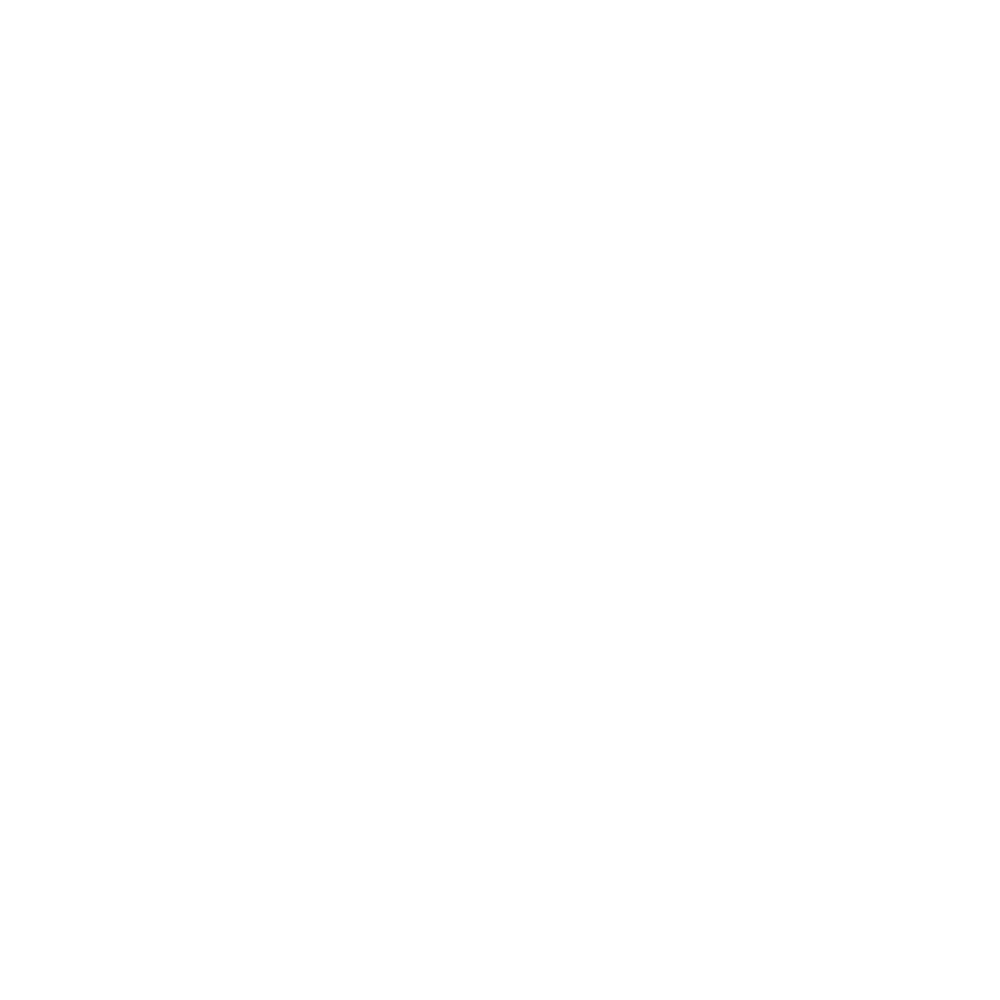

<IPython.core.display.Javascript object>


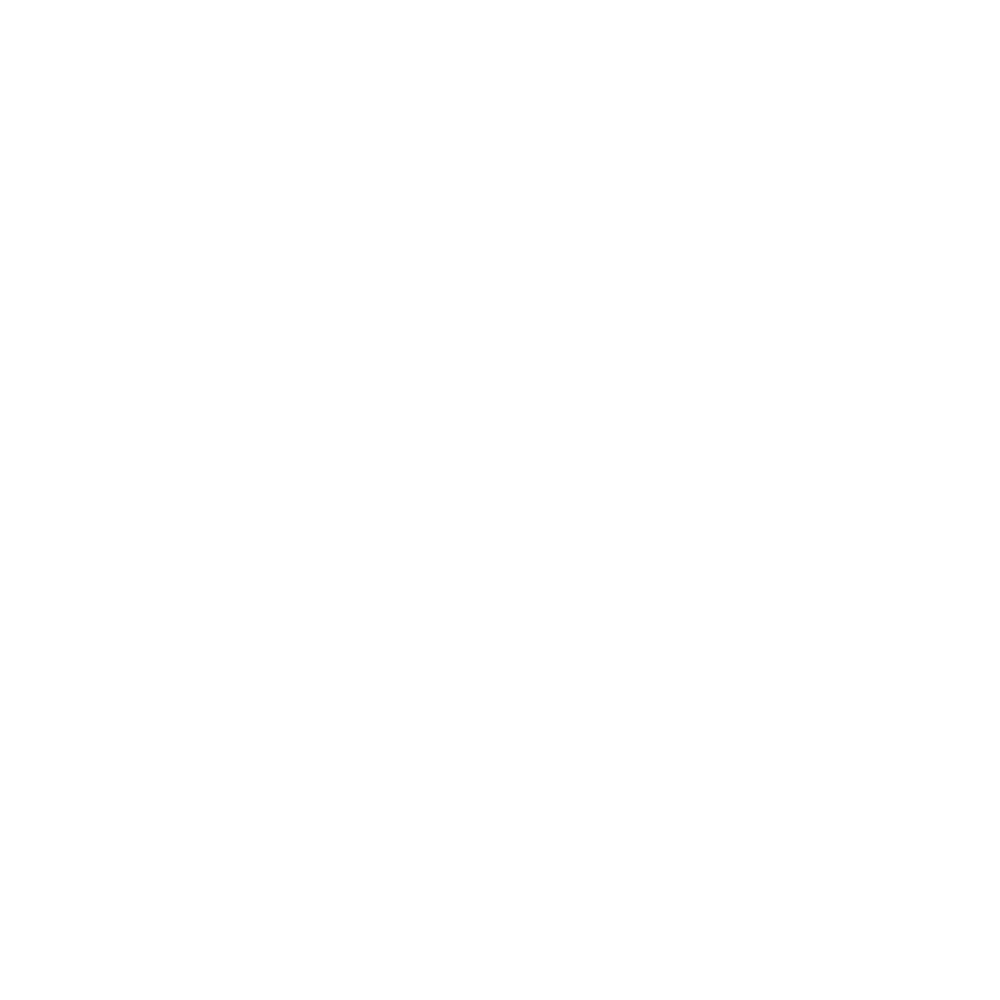

<IPython.core.display.Javascript object>


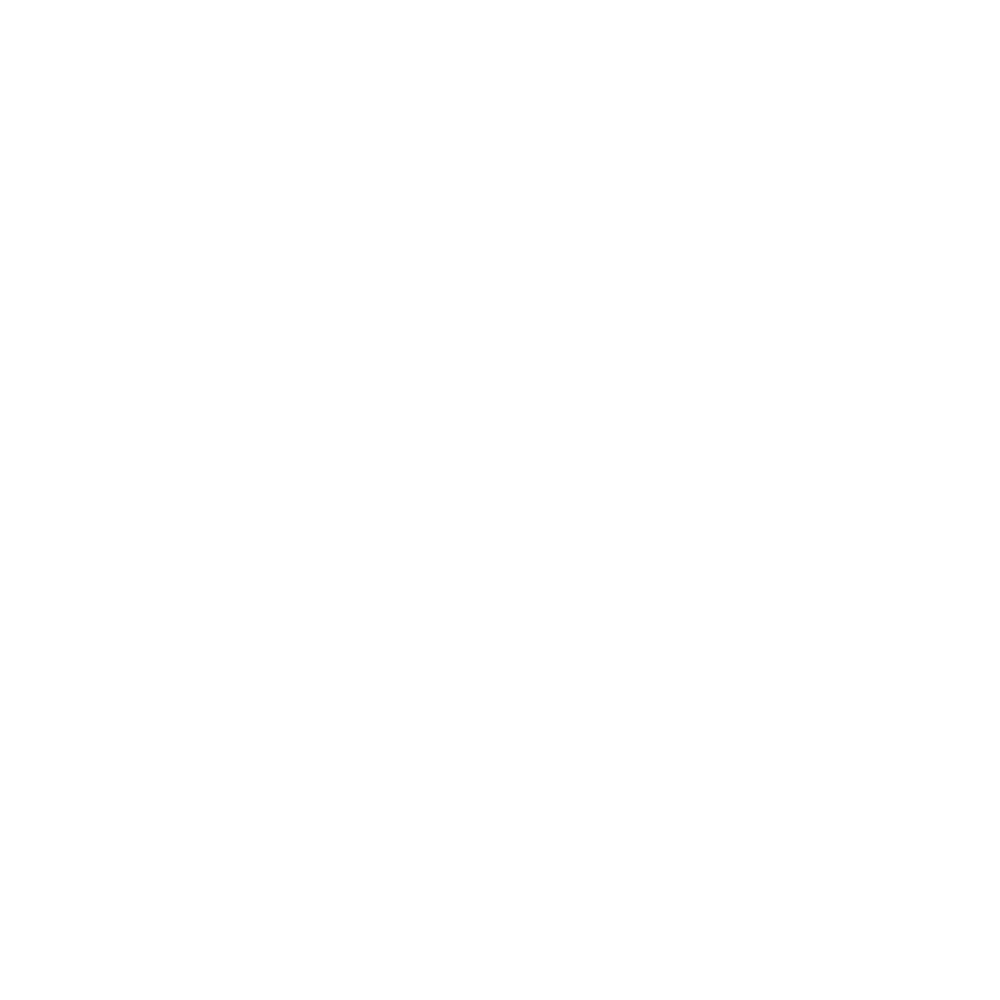

<IPython.core.display.Javascript object>


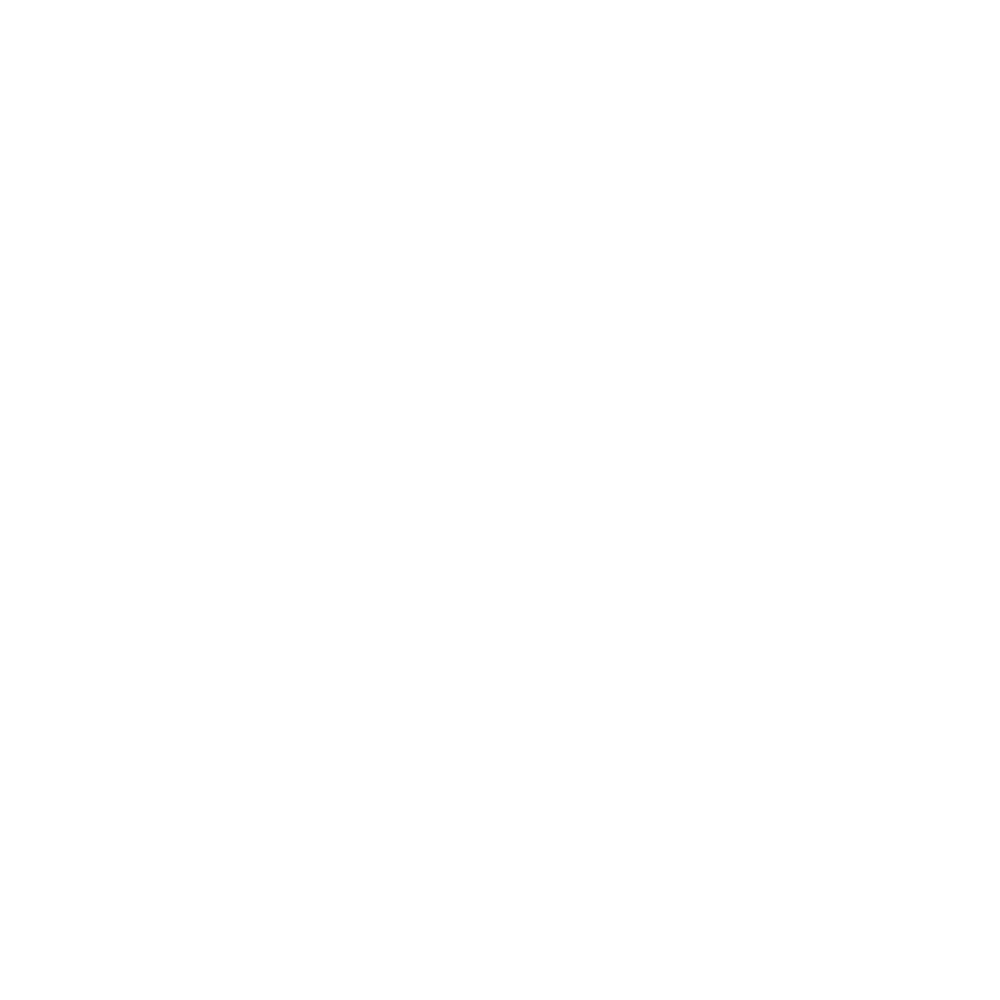

<IPython.core.display.Javascript object>


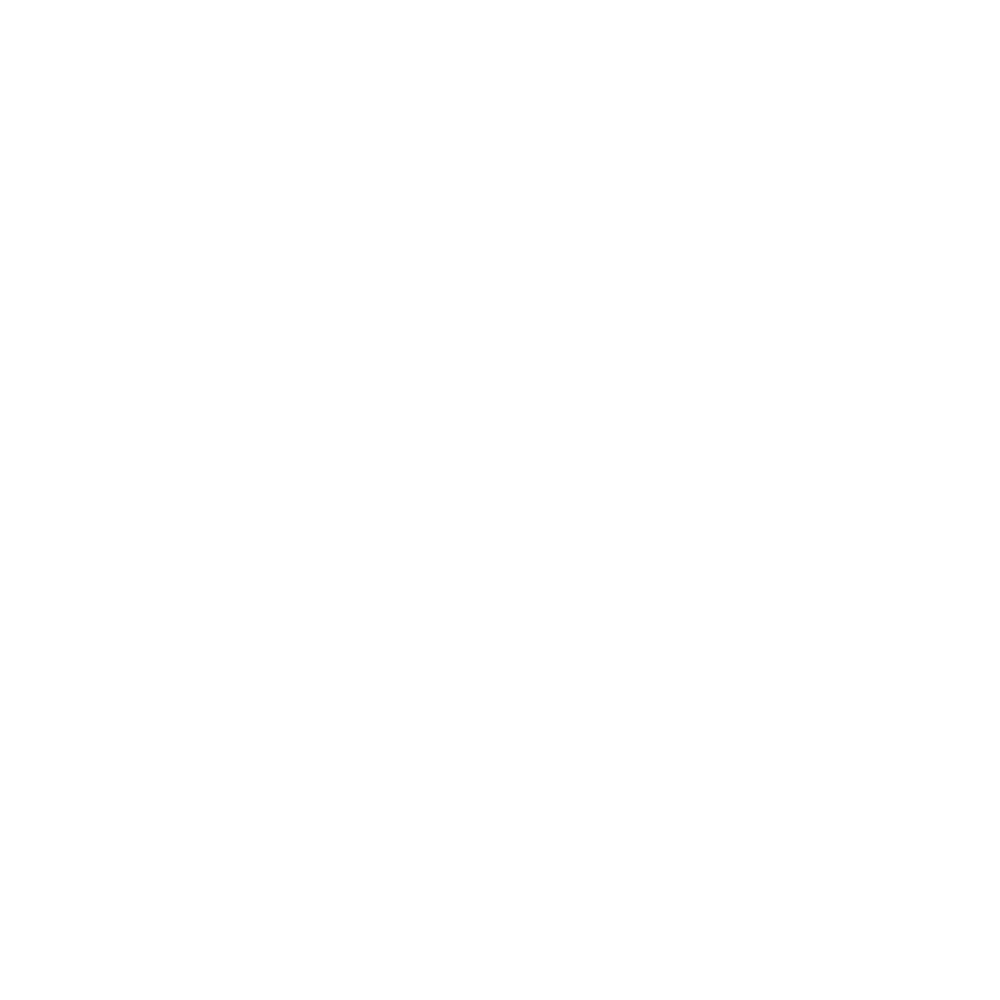

<IPython.core.display.Javascript object>


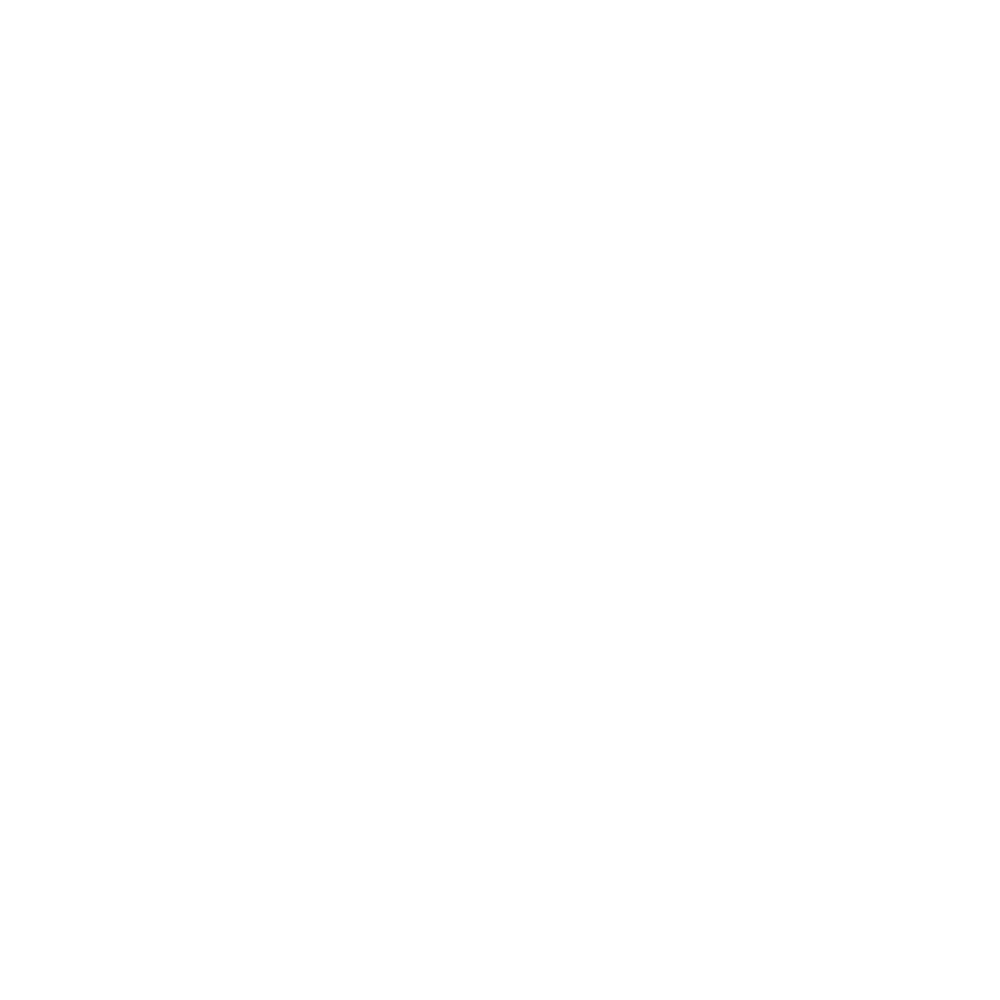

<IPython.core.display.Javascript object>


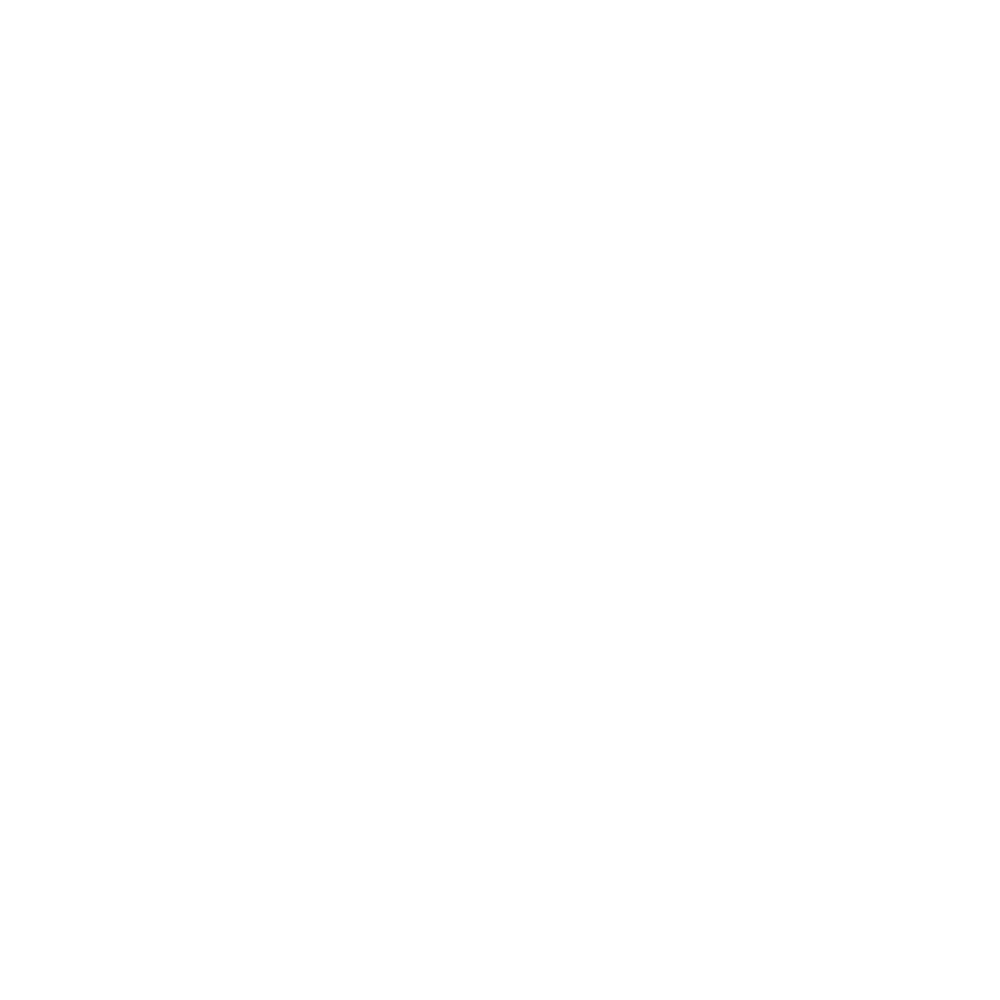

<IPython.core.display.Javascript object>


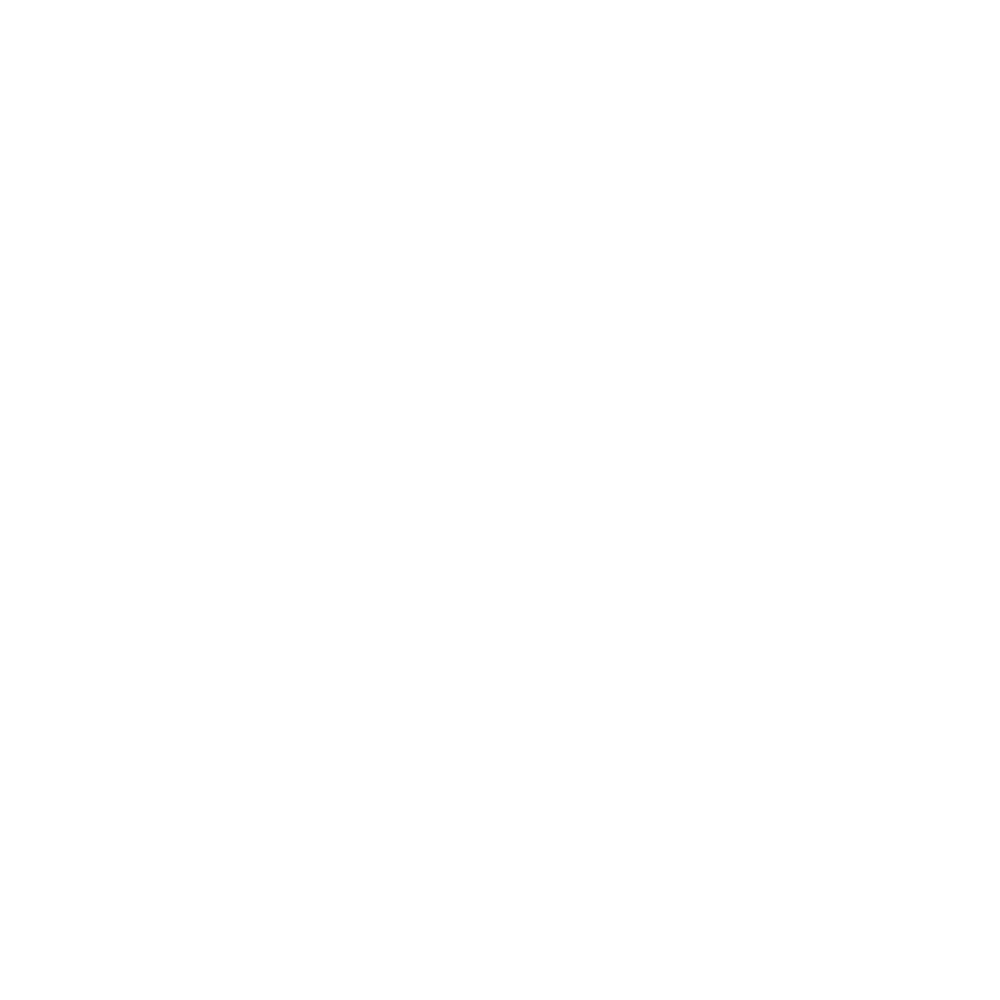

<IPython.core.display.Javascript object>


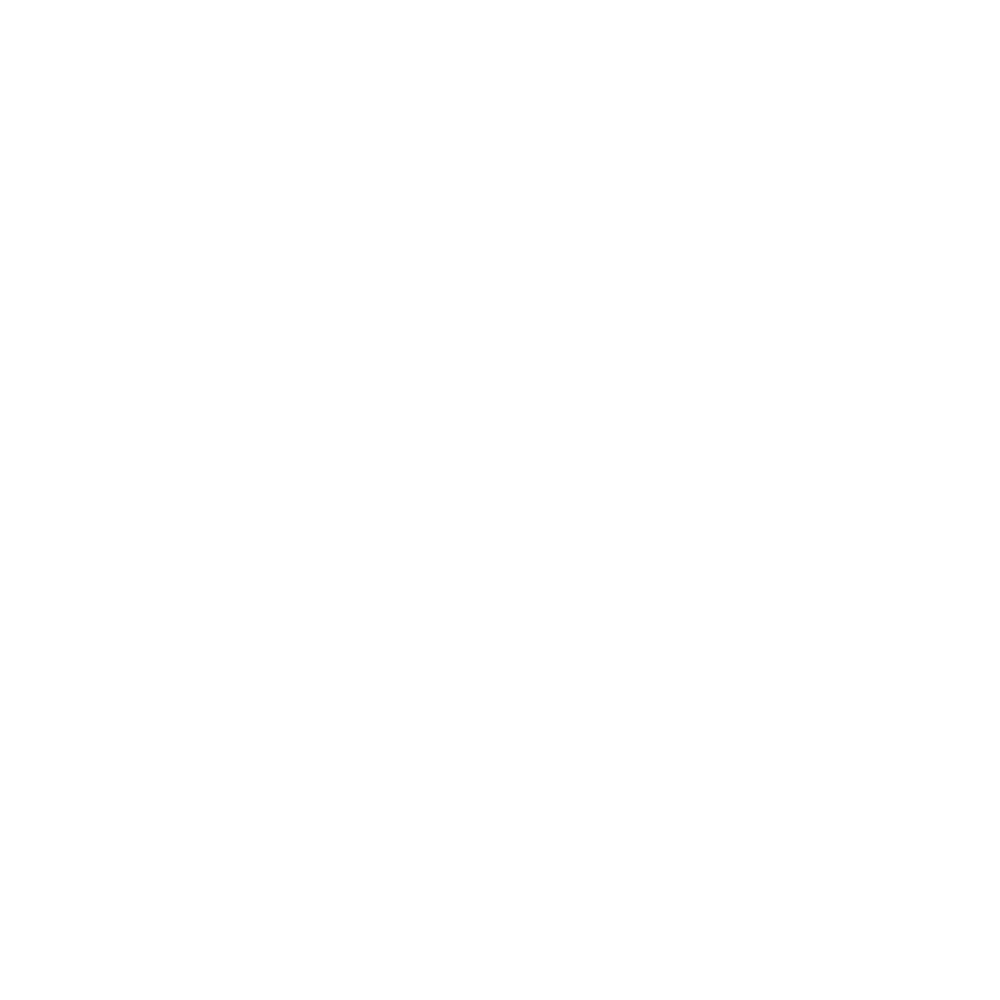

<IPython.core.display.Javascript object>


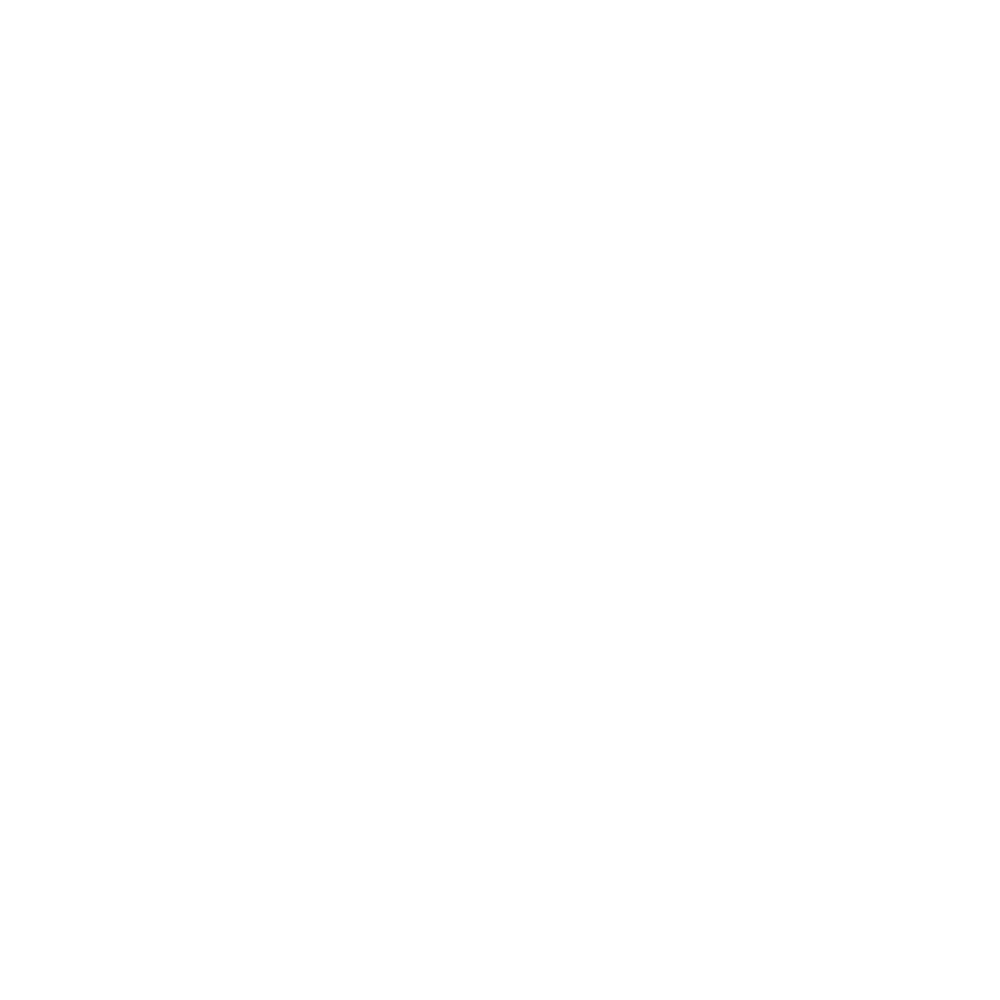

<IPython.core.display.Javascript object>


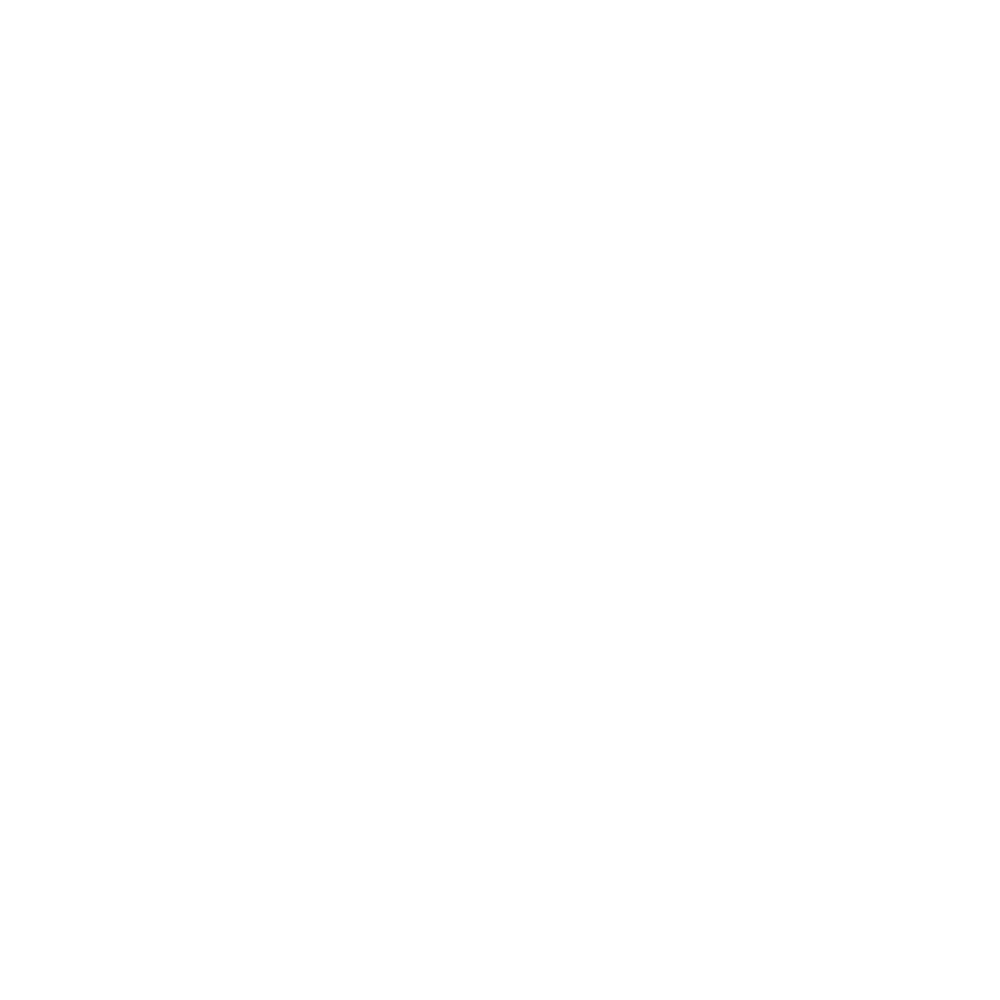

<IPython.core.display.Javascript object>


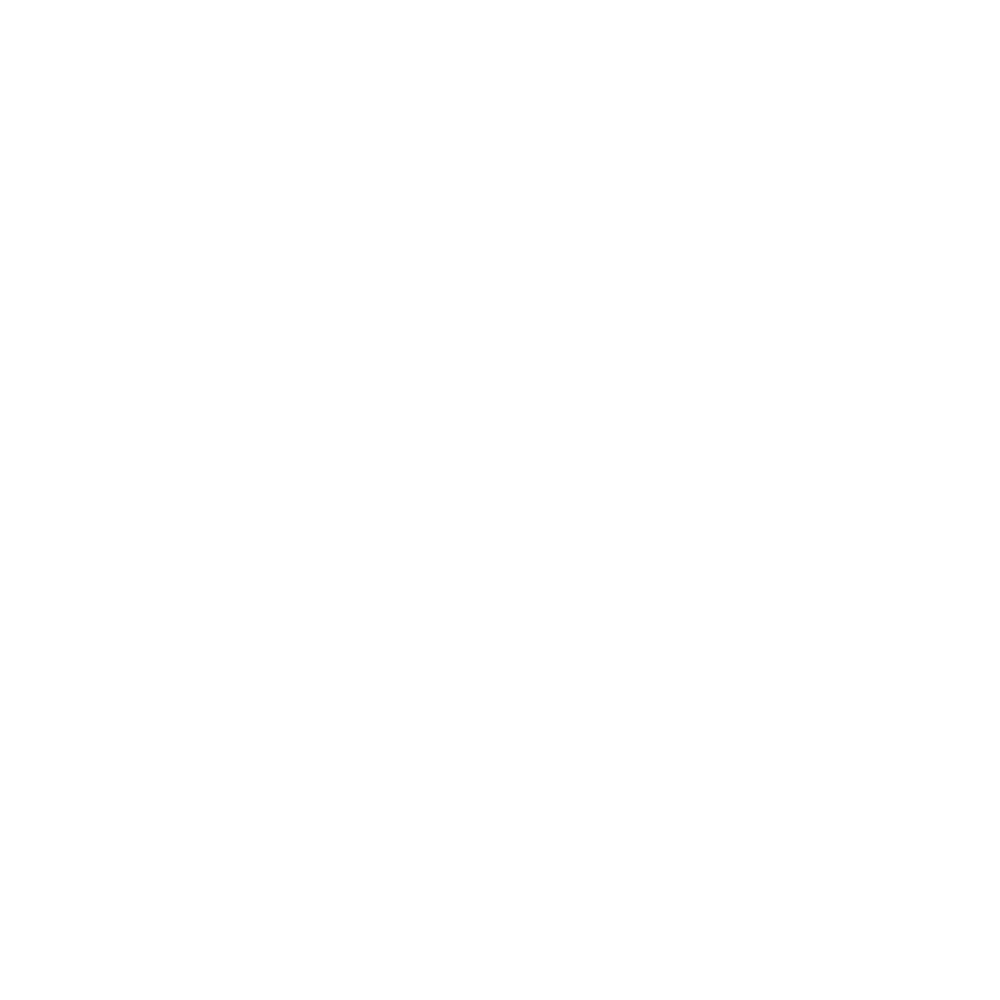

<IPython.core.display.Javascript object>


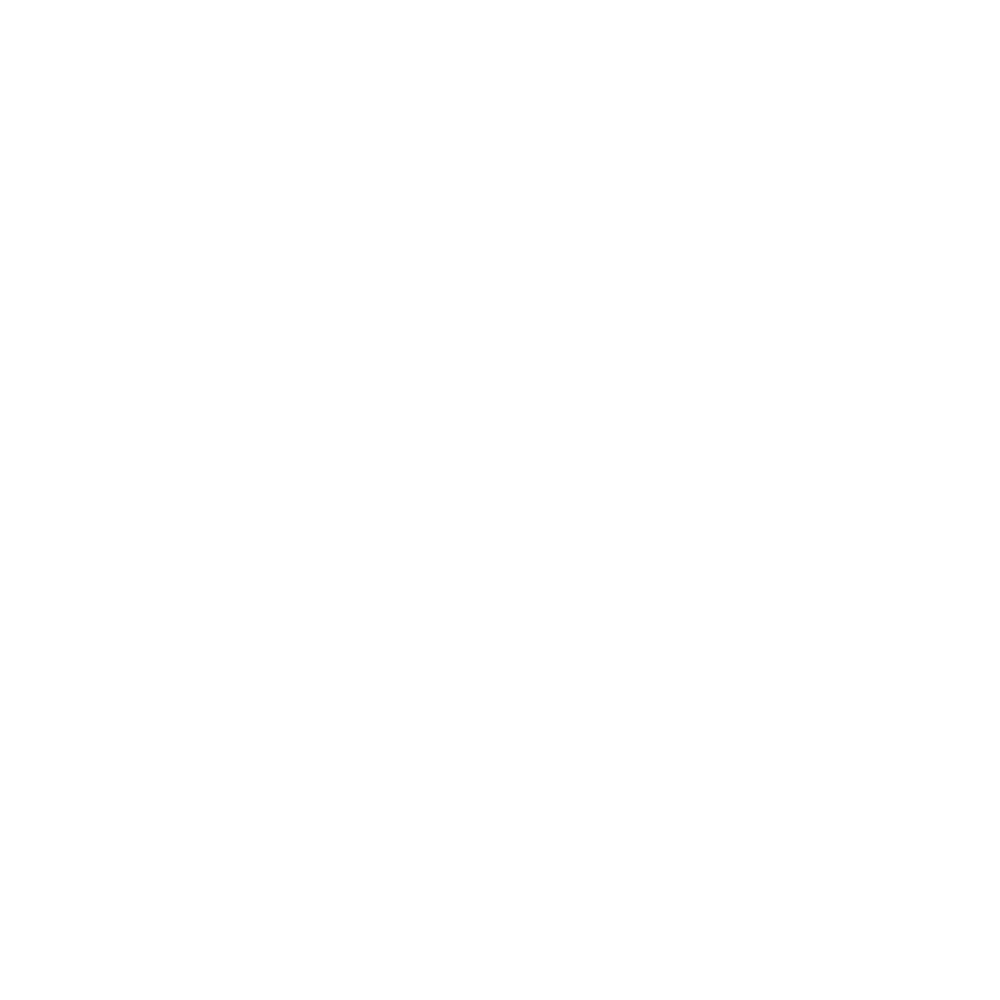

<IPython.core.display.Javascript object>


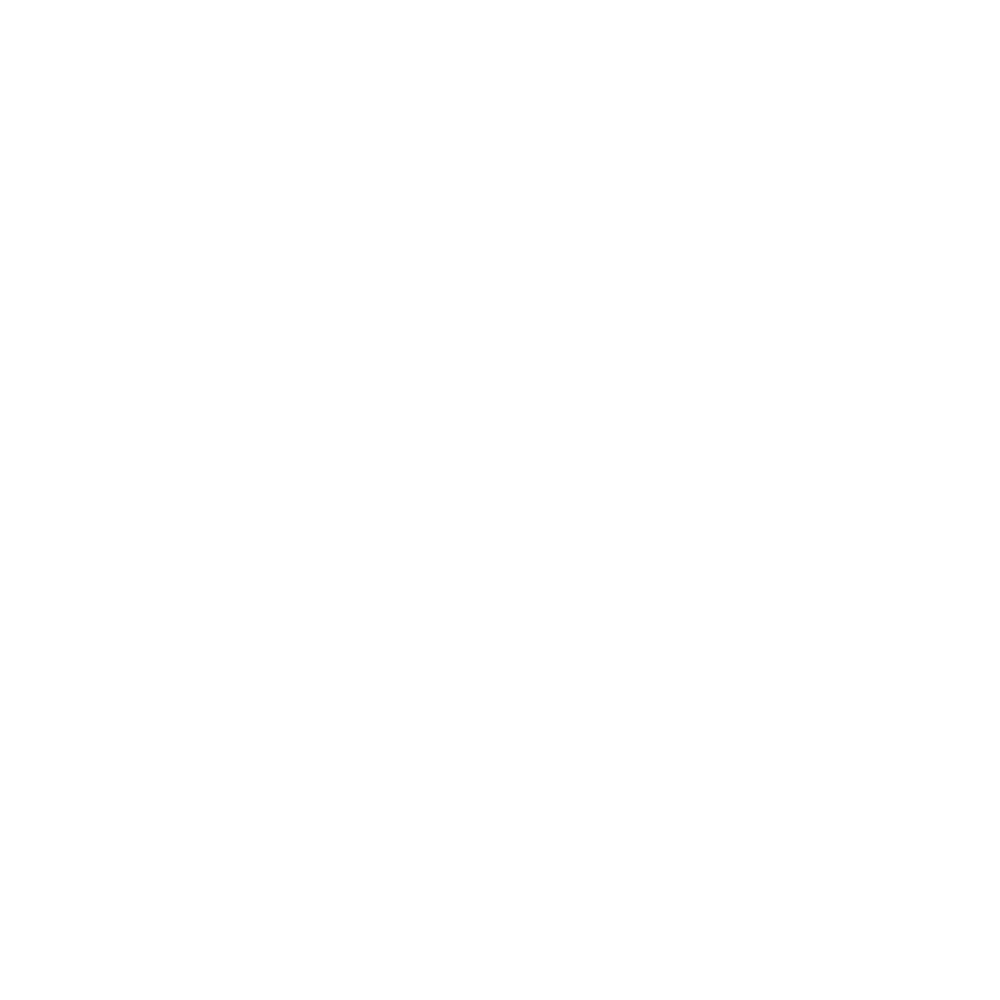

<IPython.core.display.Javascript object>


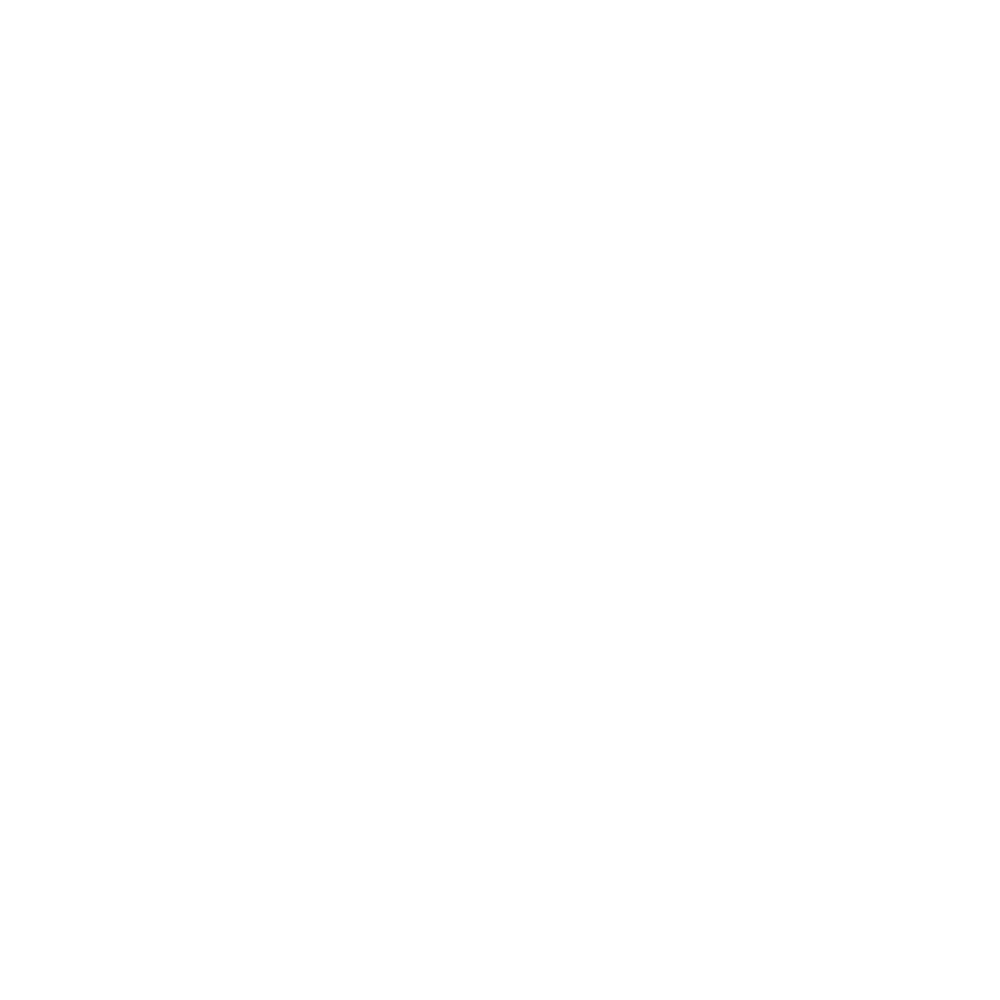

<IPython.core.display.Javascript object>


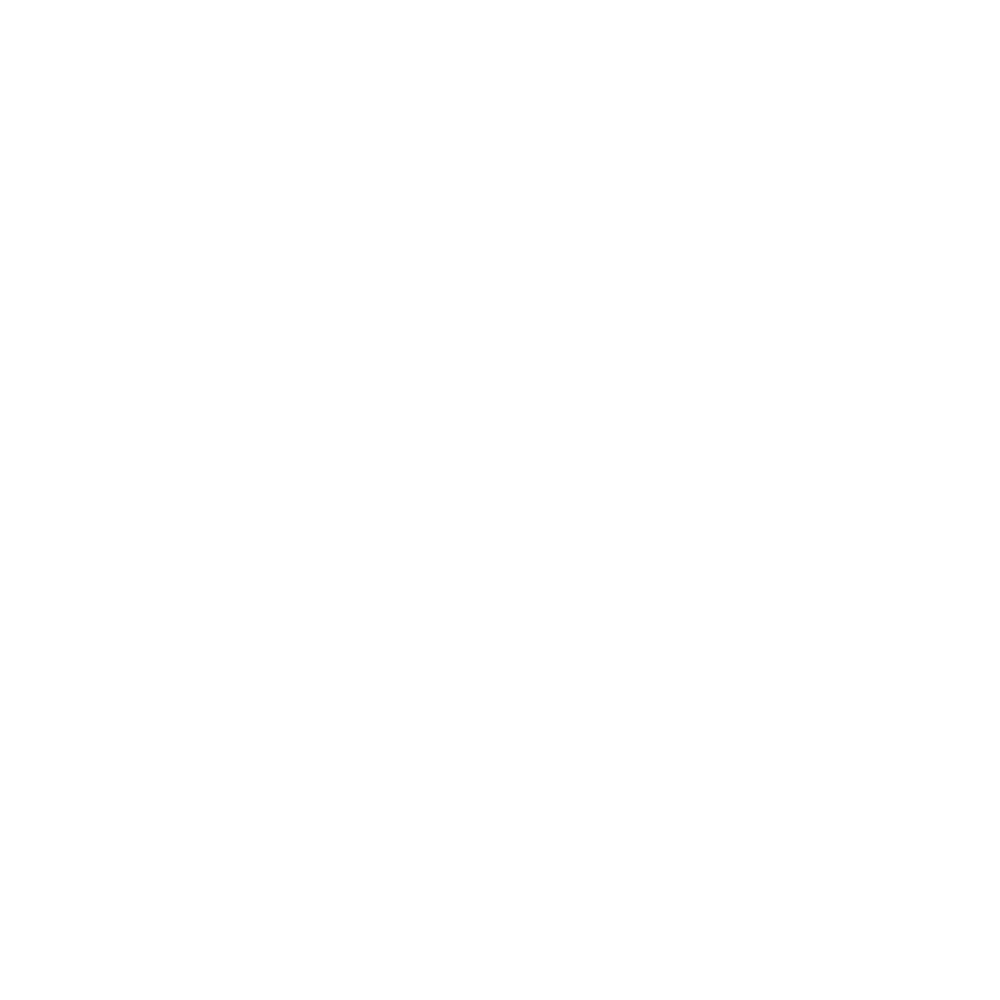

<IPython.core.display.Javascript object>


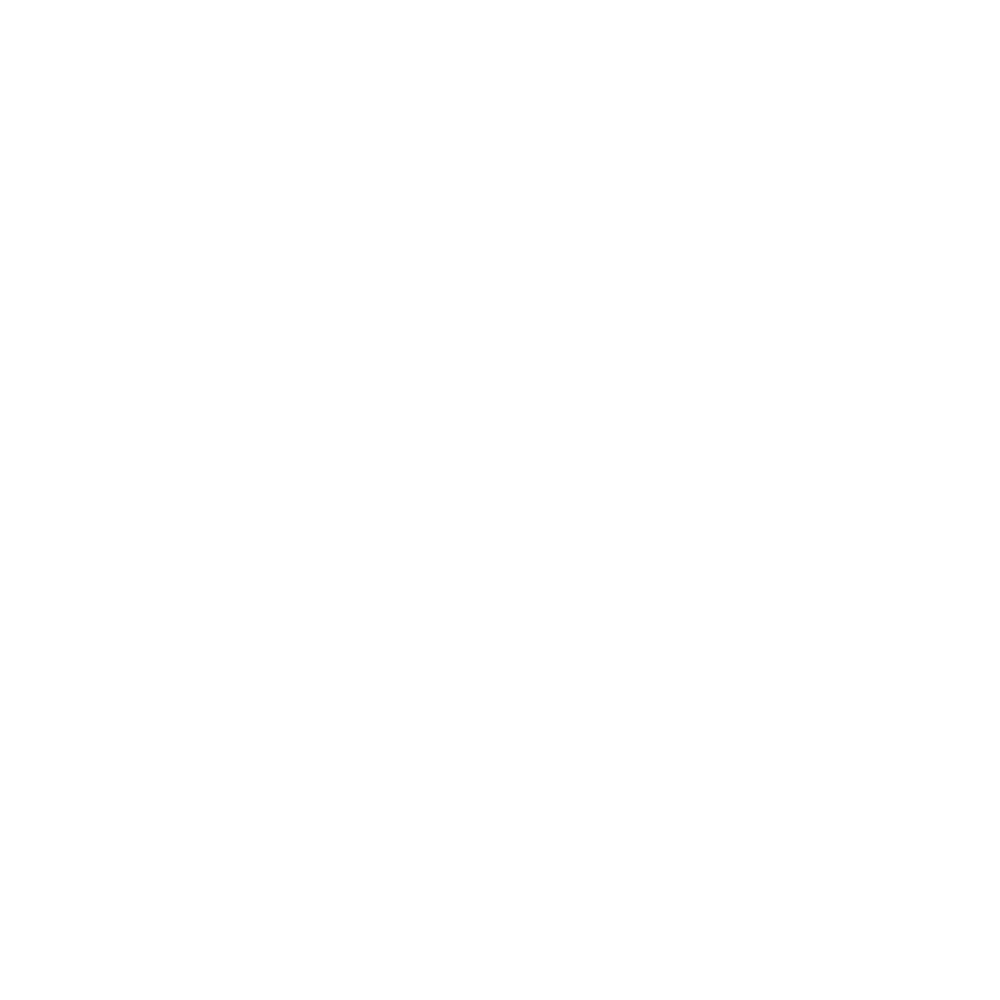

<IPython.core.display.Javascript object>


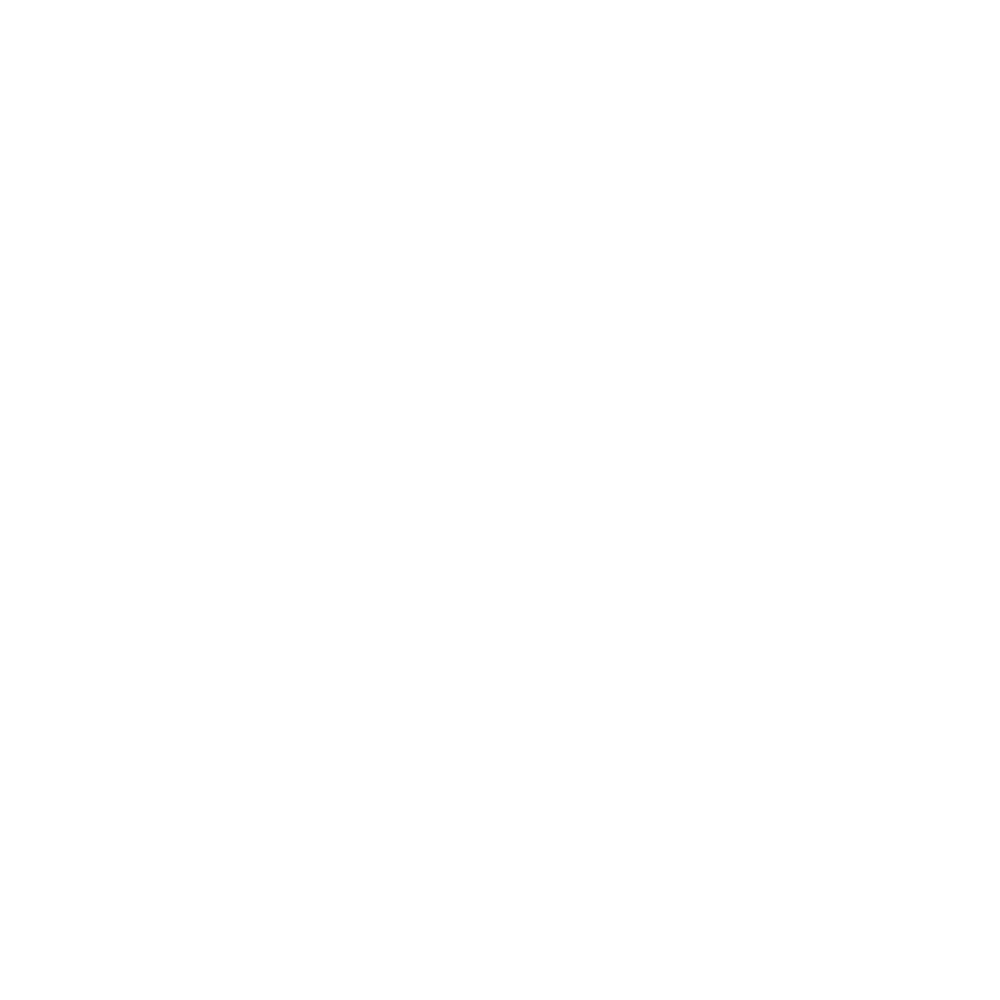

<IPython.core.display.Javascript object>


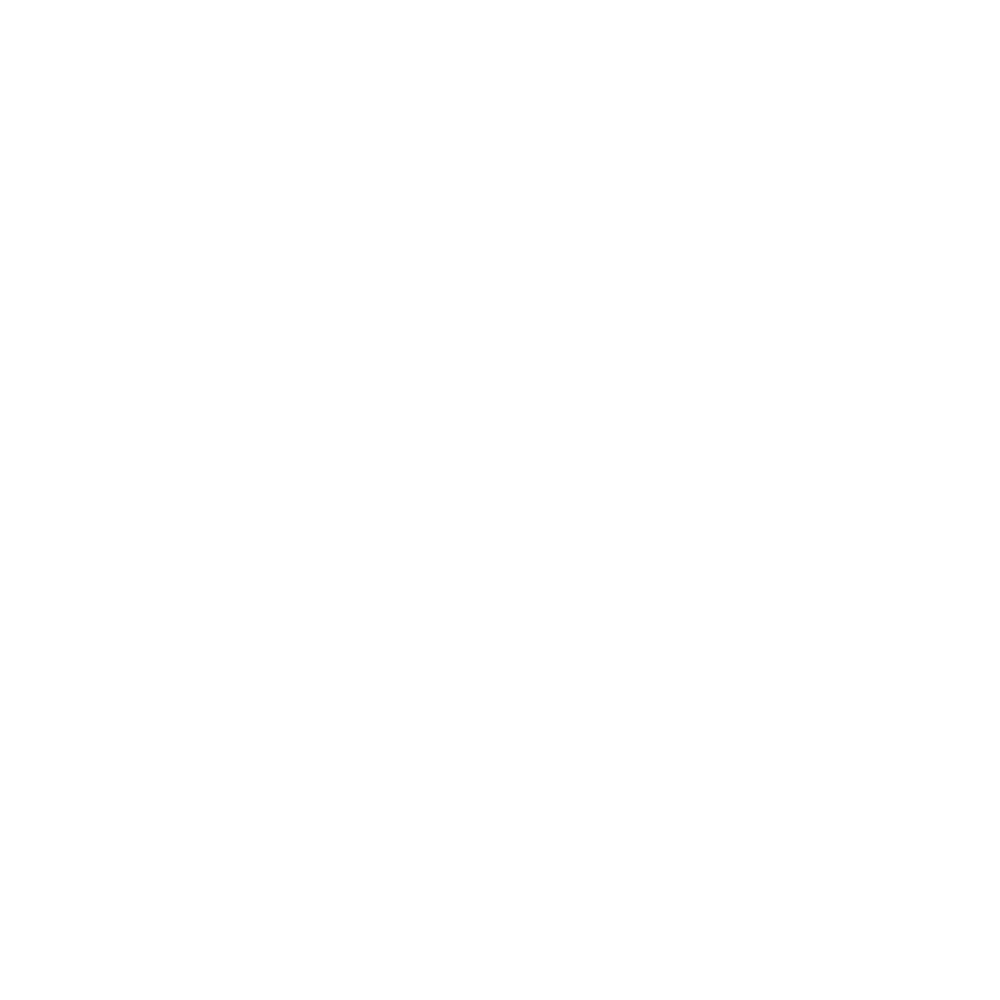

<IPython.core.display.Javascript object>


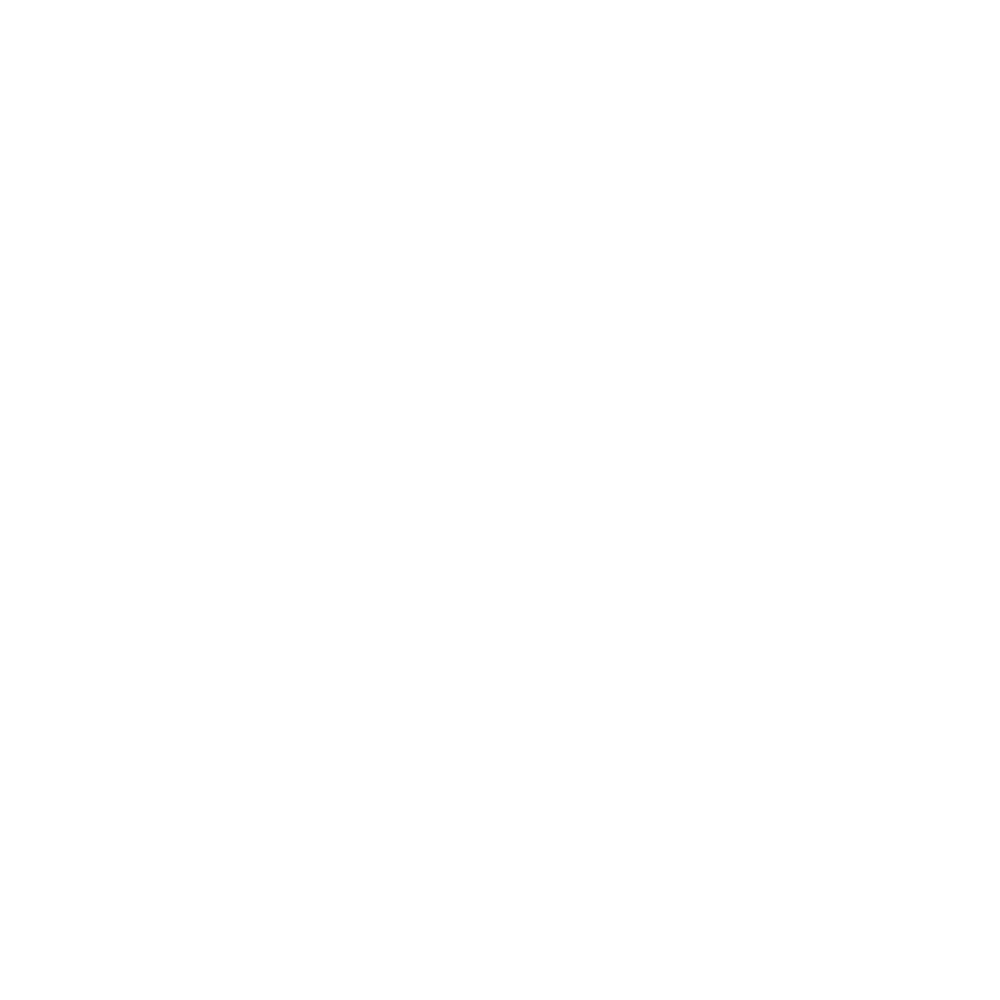

<IPython.core.display.Javascript object>


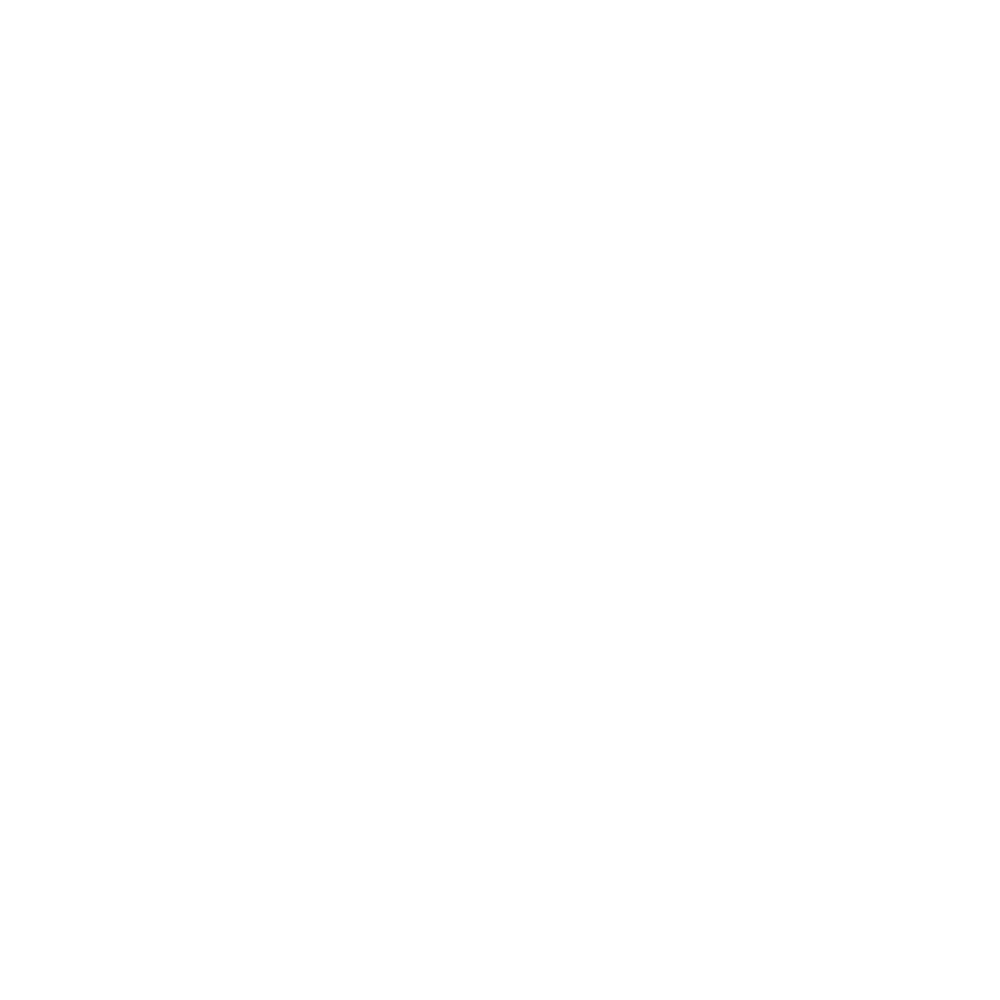

<IPython.core.display.Javascript object>


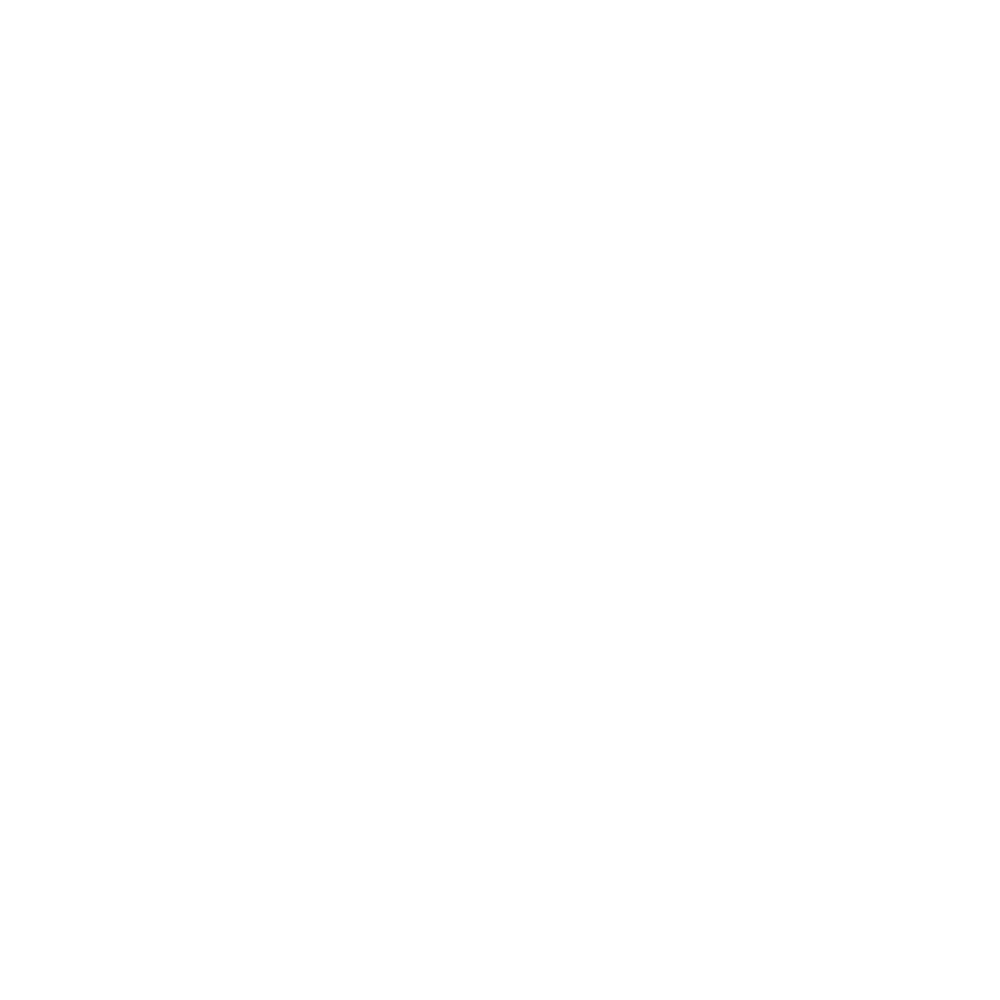

<IPython.core.display.Javascript object>


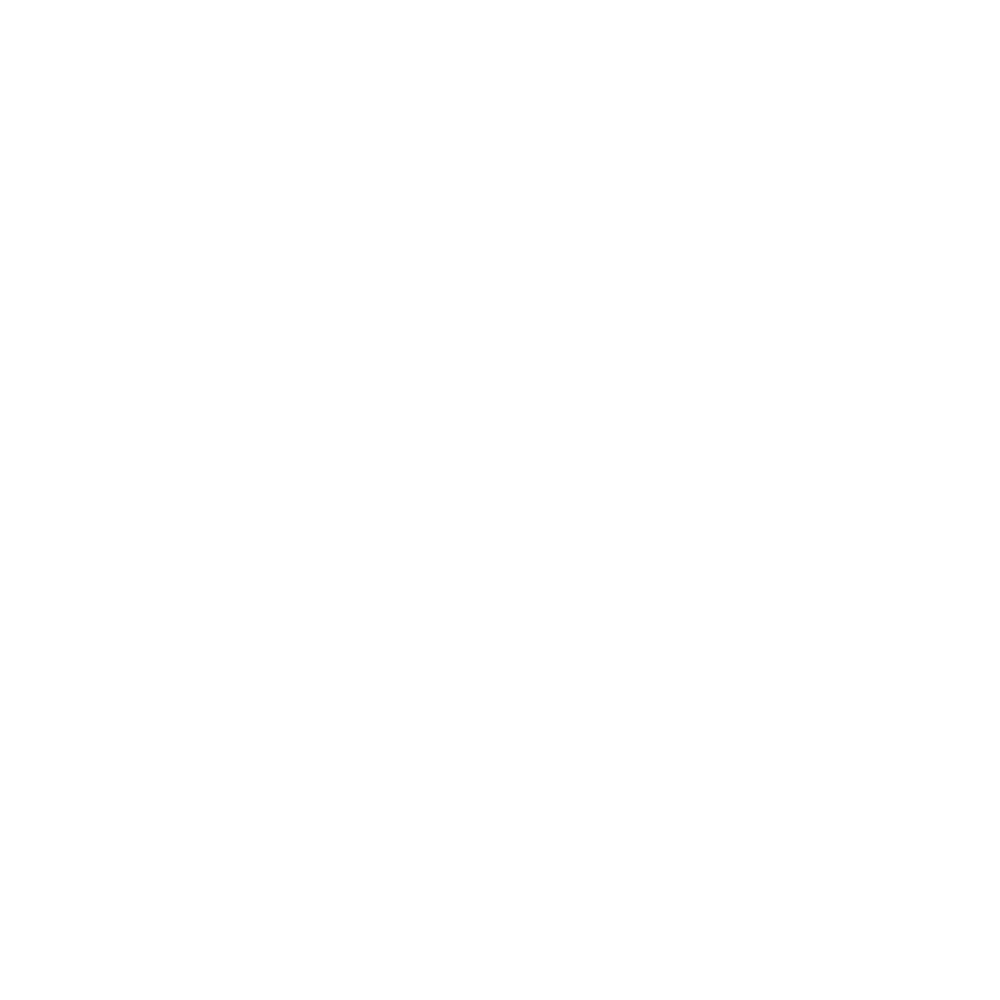

<IPython.core.display.Javascript object>


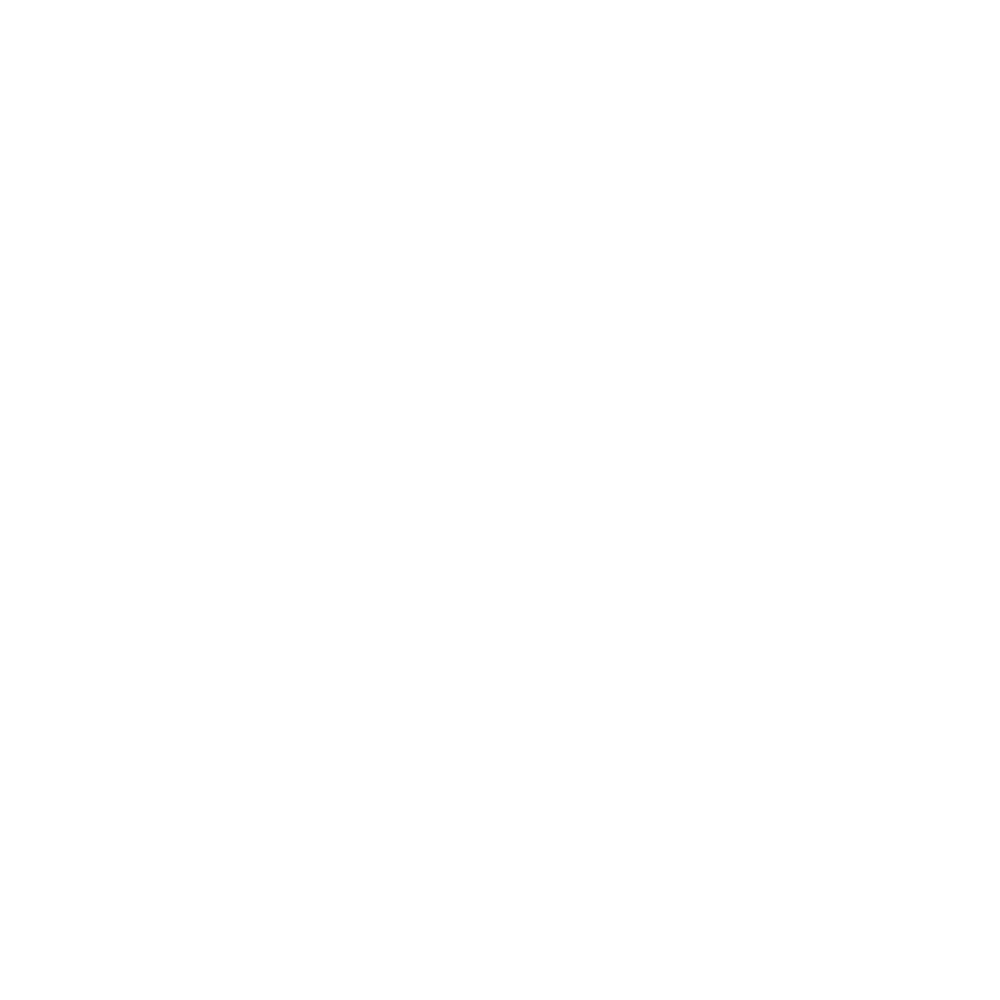

<IPython.core.display.Javascript object>


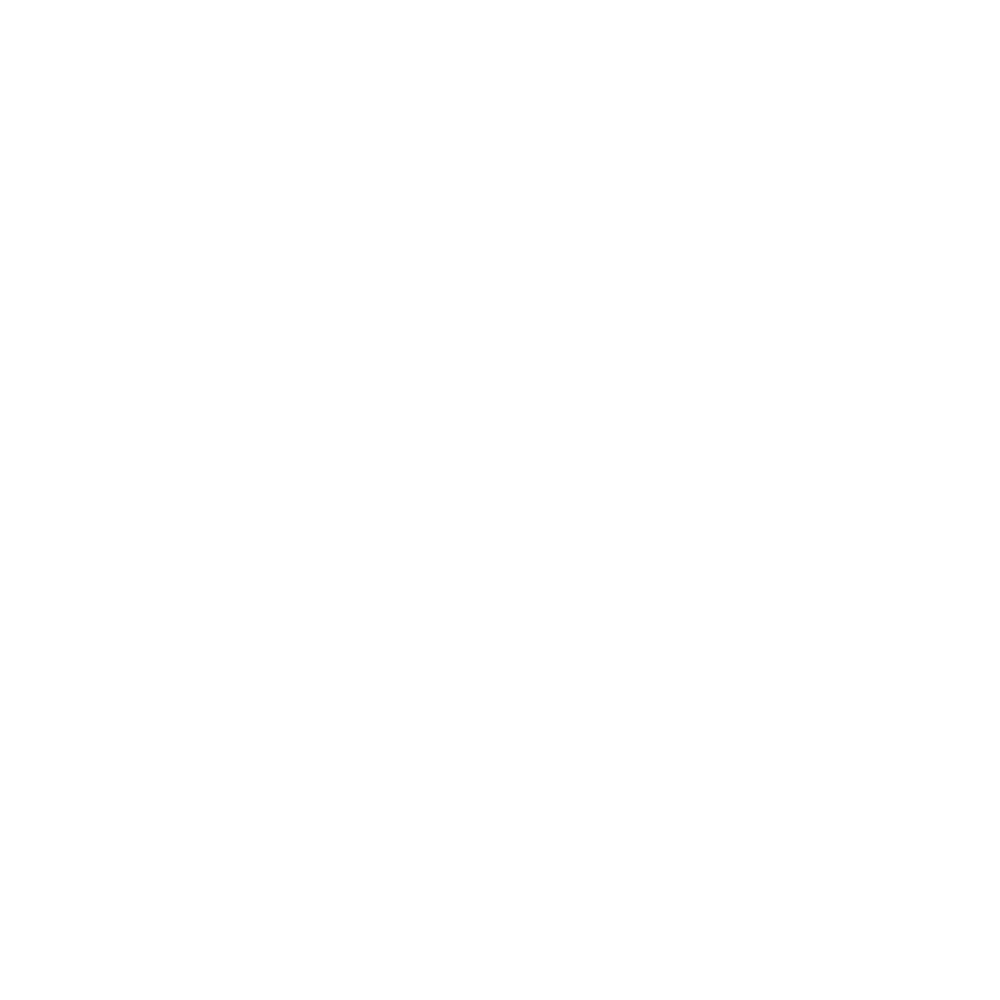

<IPython.core.display.Javascript object>


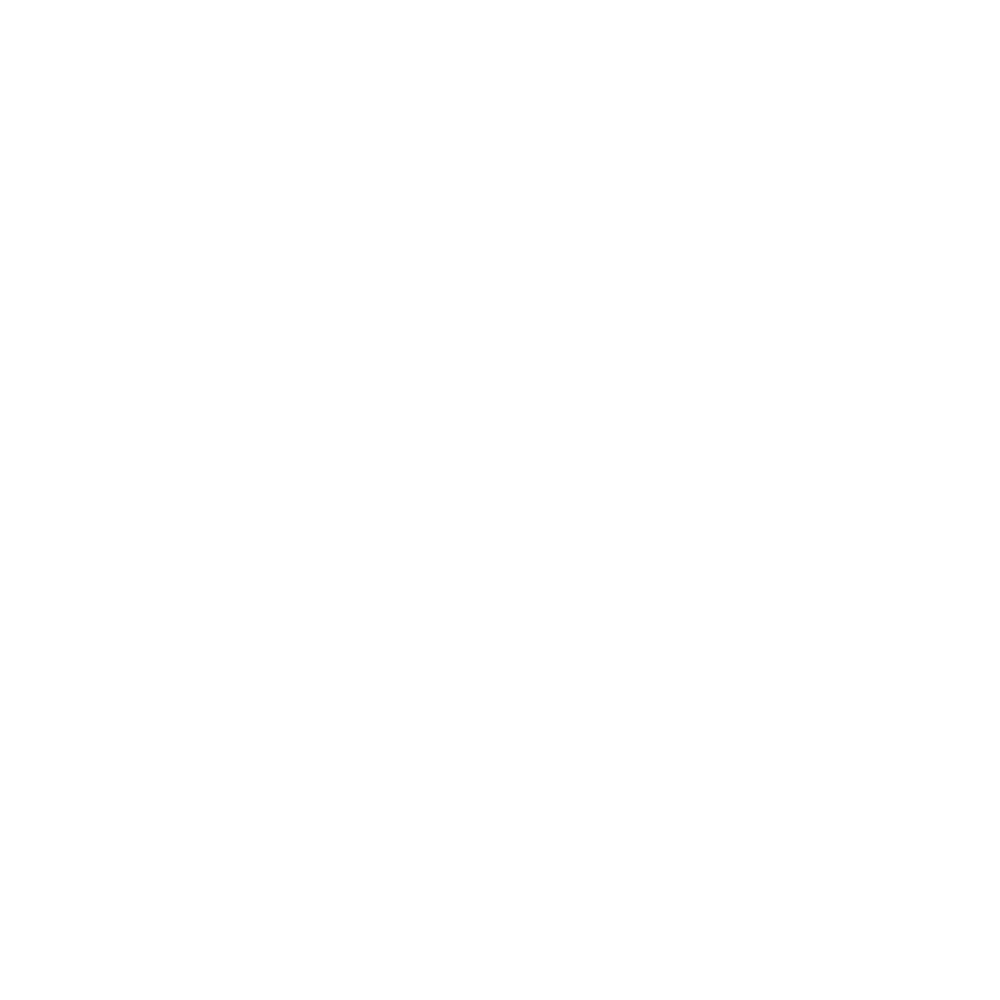

<IPython.core.display.Javascript object>


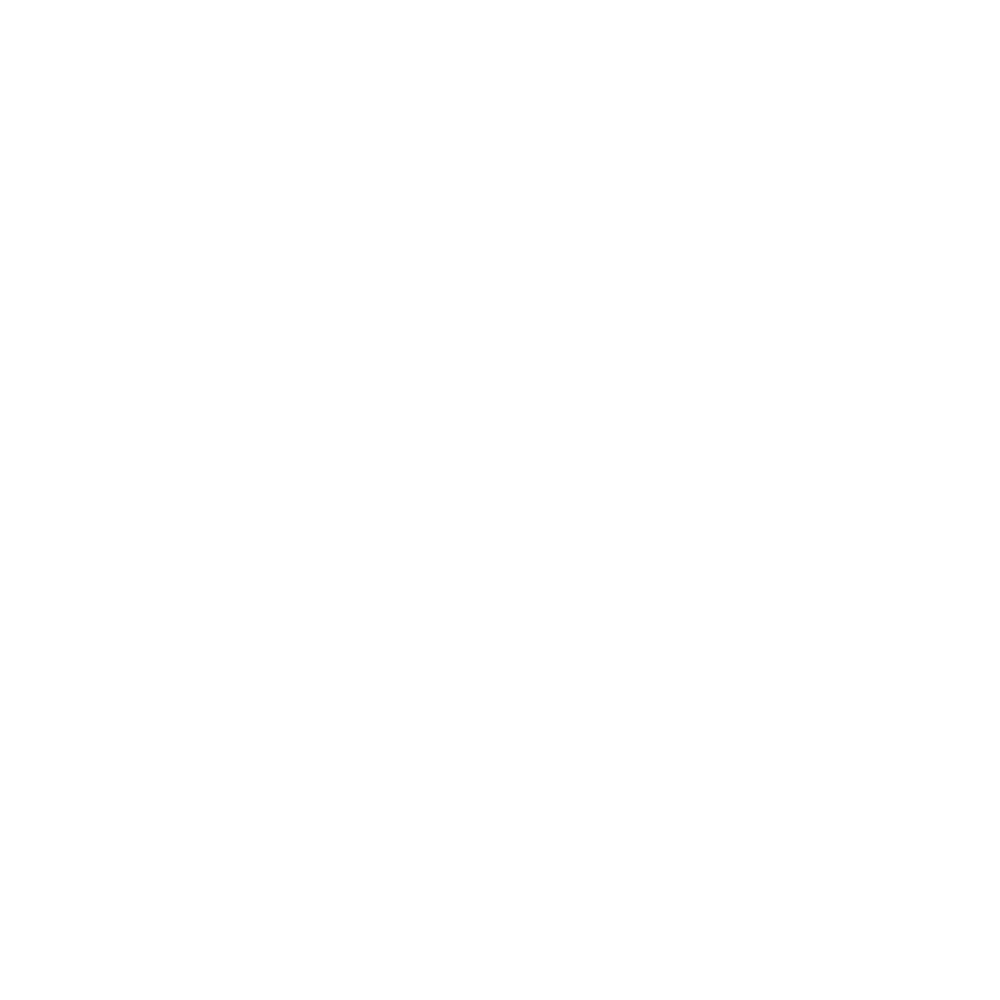

<IPython.core.display.Javascript object>


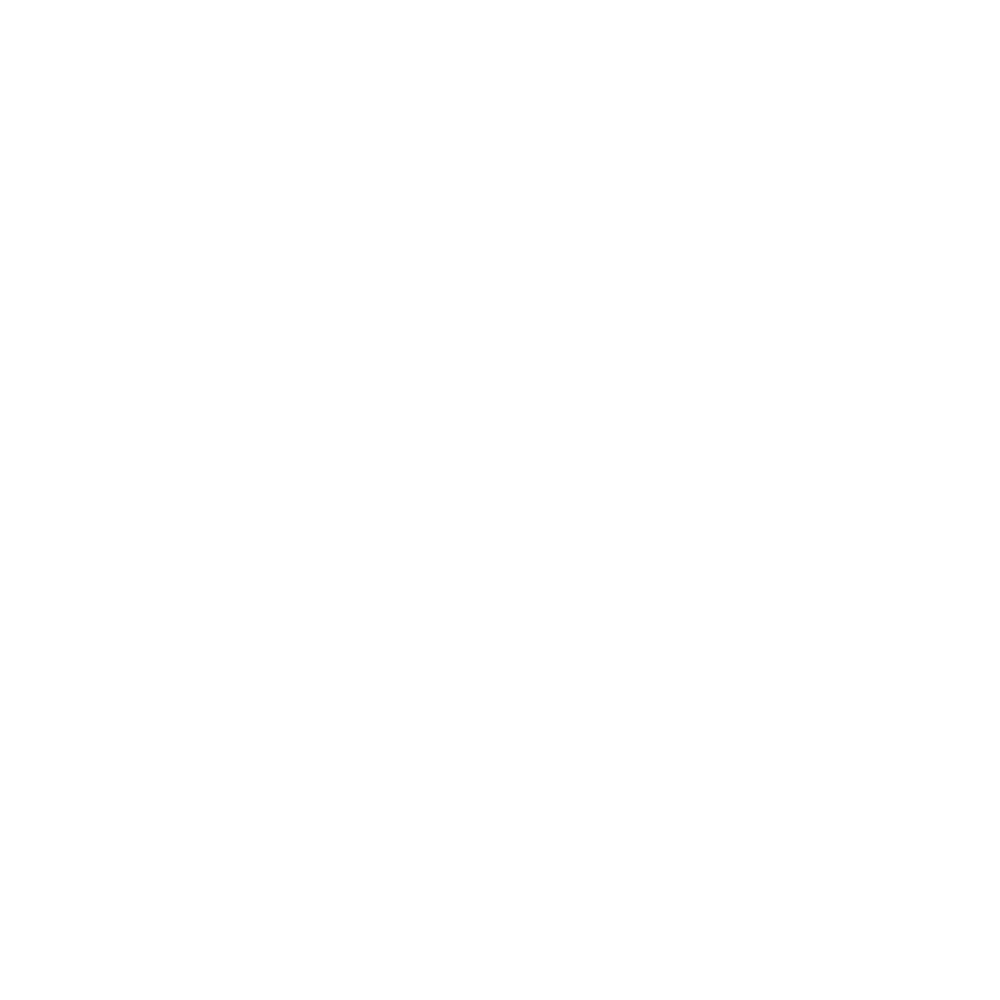

<IPython.core.display.Javascript object>


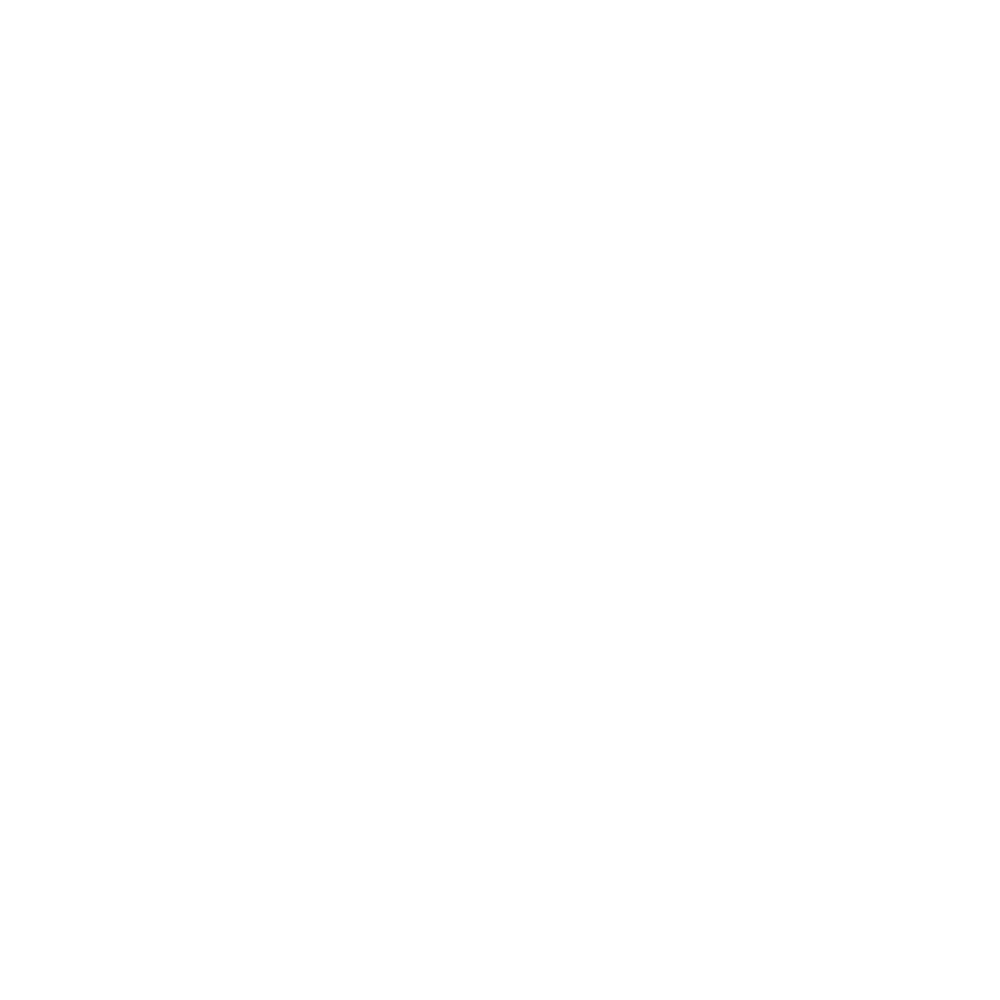

<IPython.core.display.Javascript object>


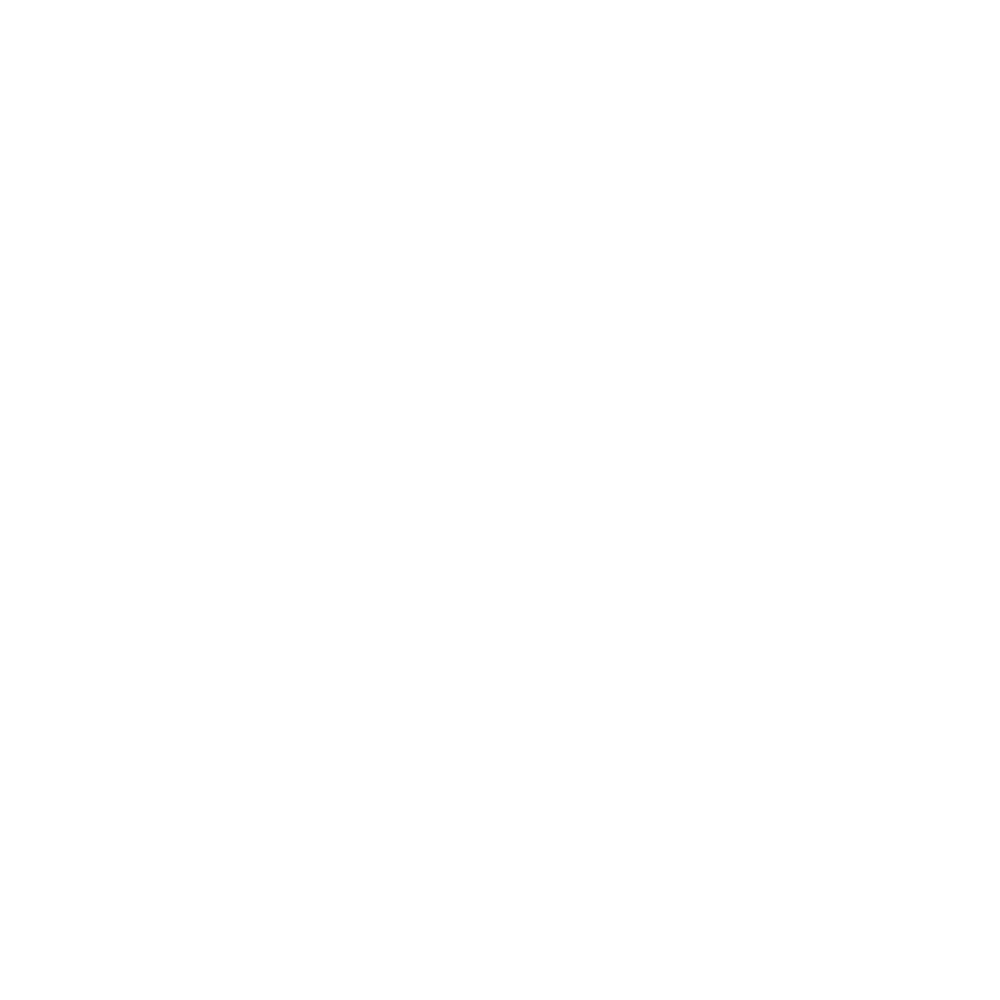

<IPython.core.display.Javascript object>


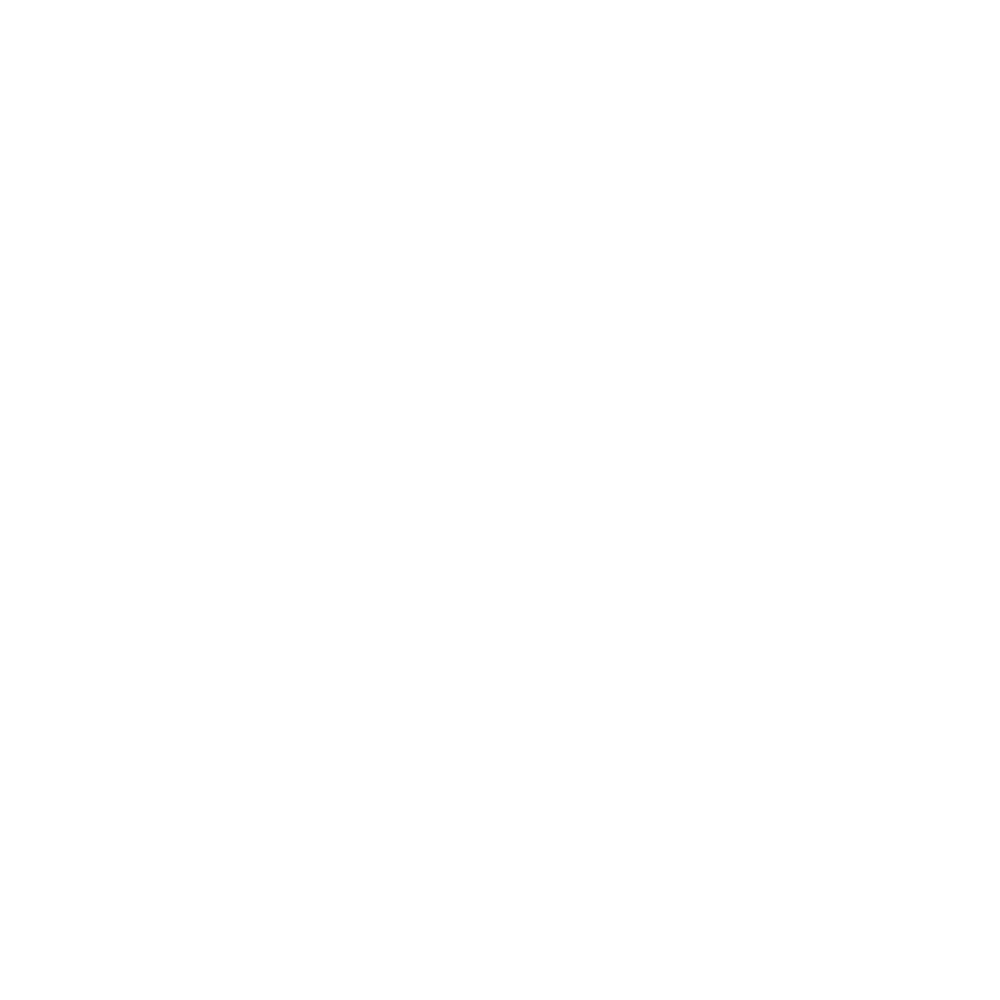

<IPython.core.display.Javascript object>


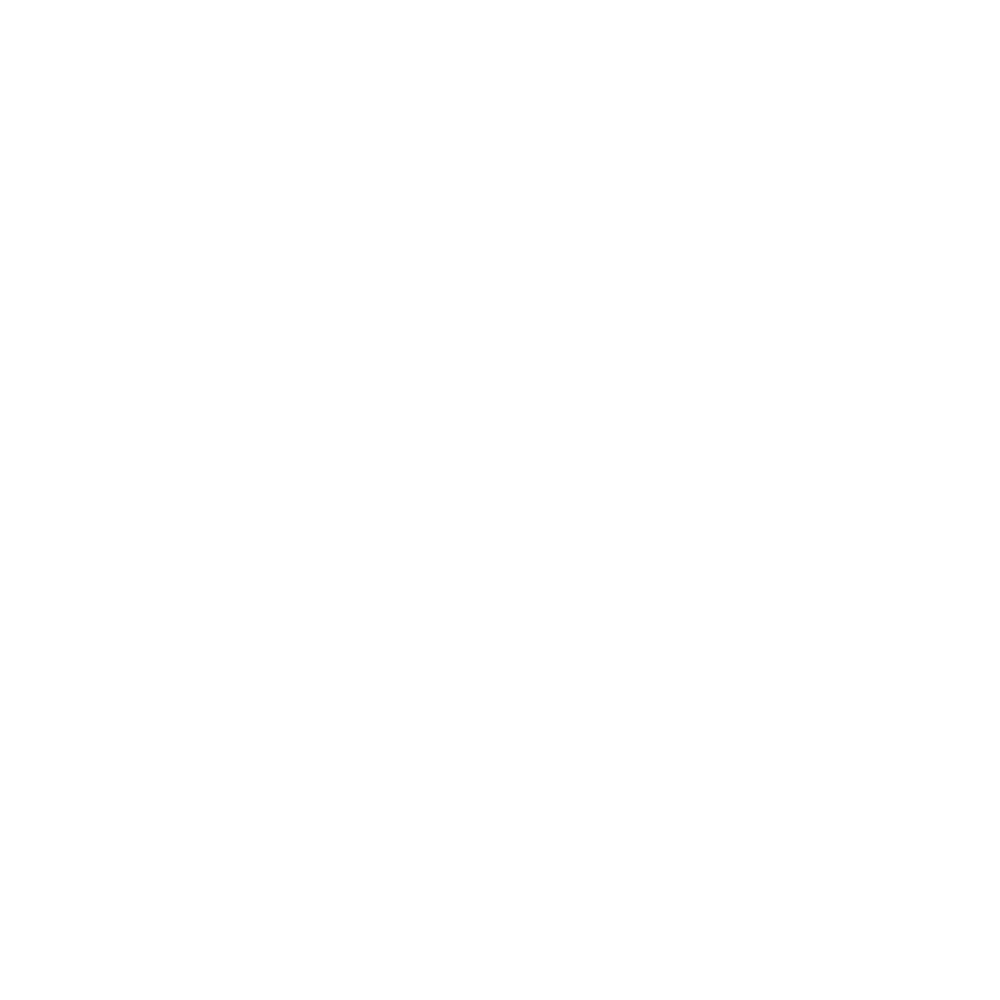

<IPython.core.display.Javascript object>


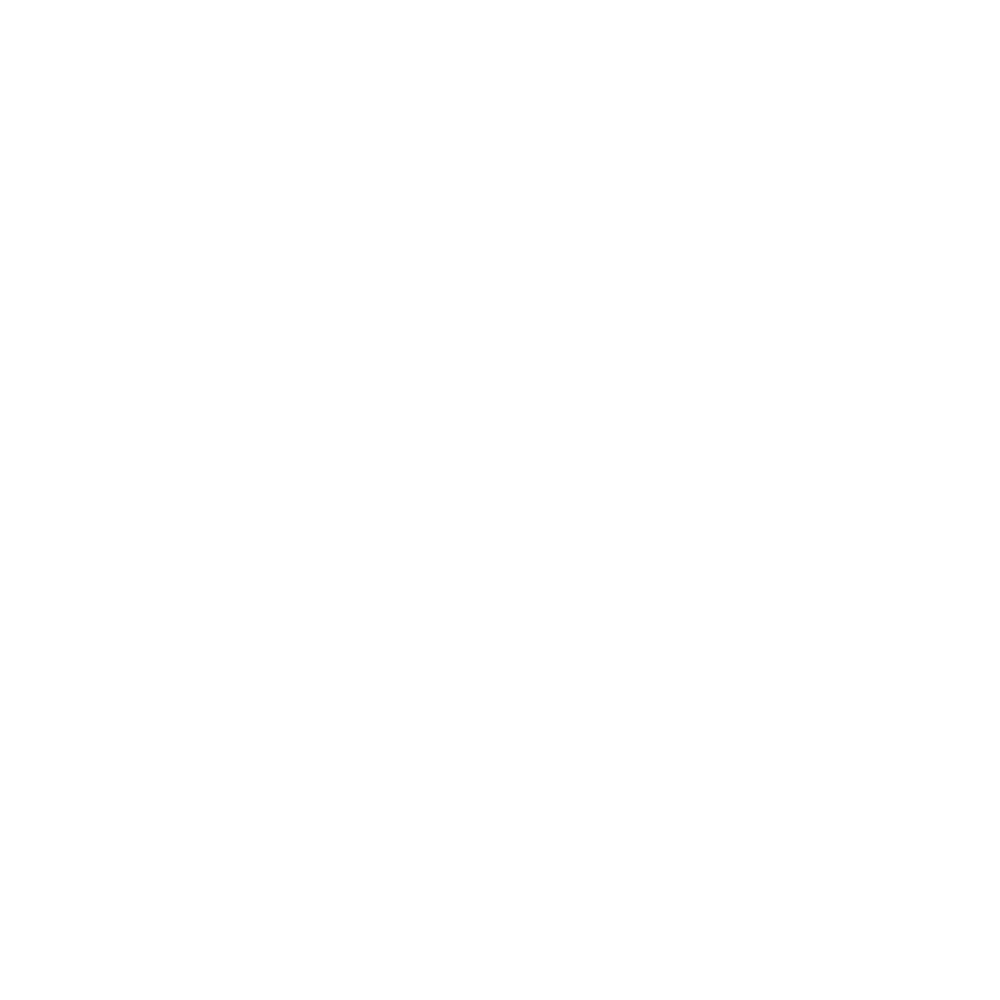

<IPython.core.display.Javascript object>


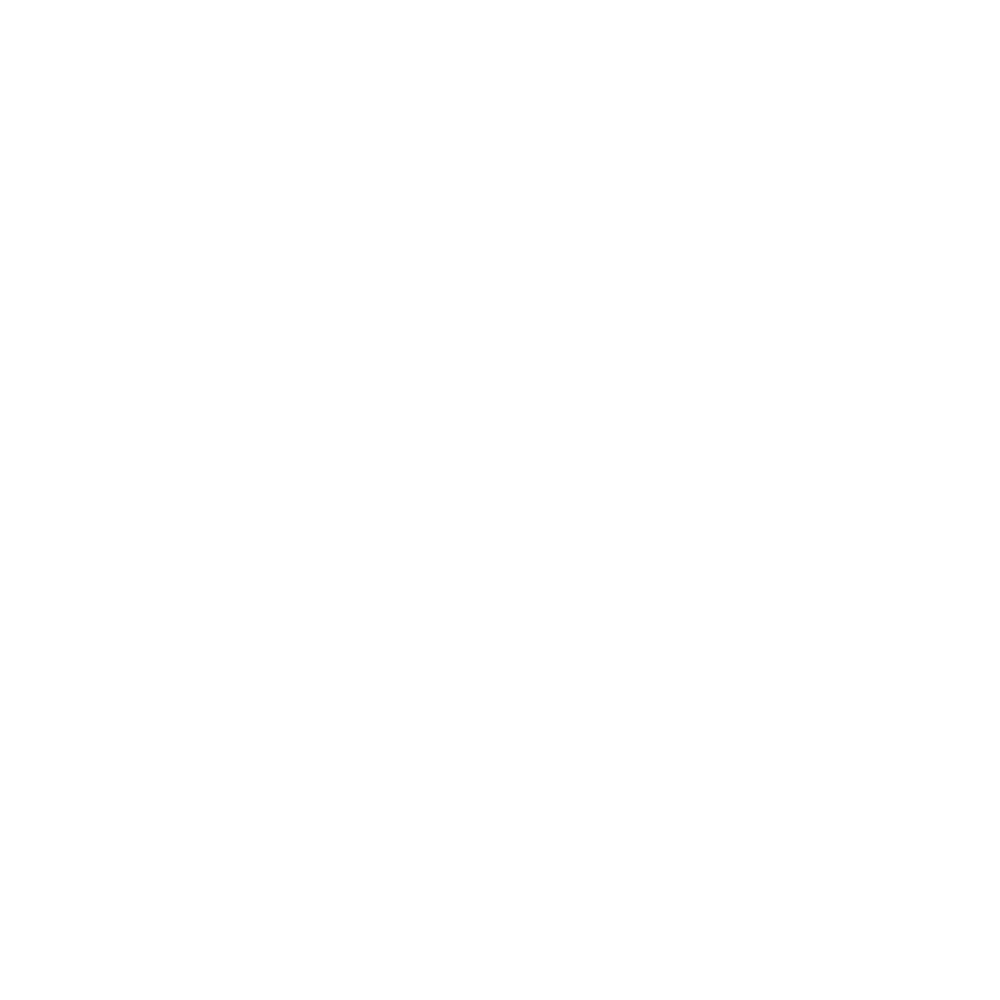

<IPython.core.display.Javascript object>


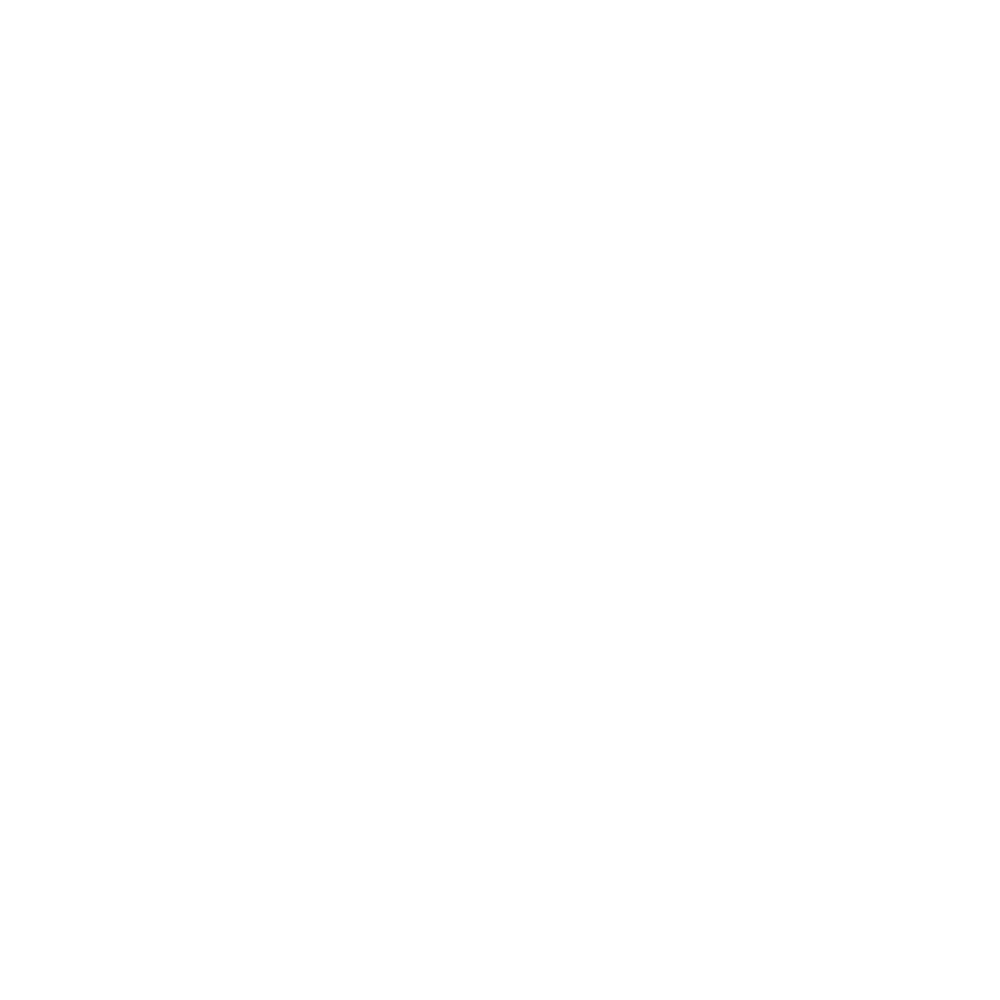

<IPython.core.display.Javascript object>


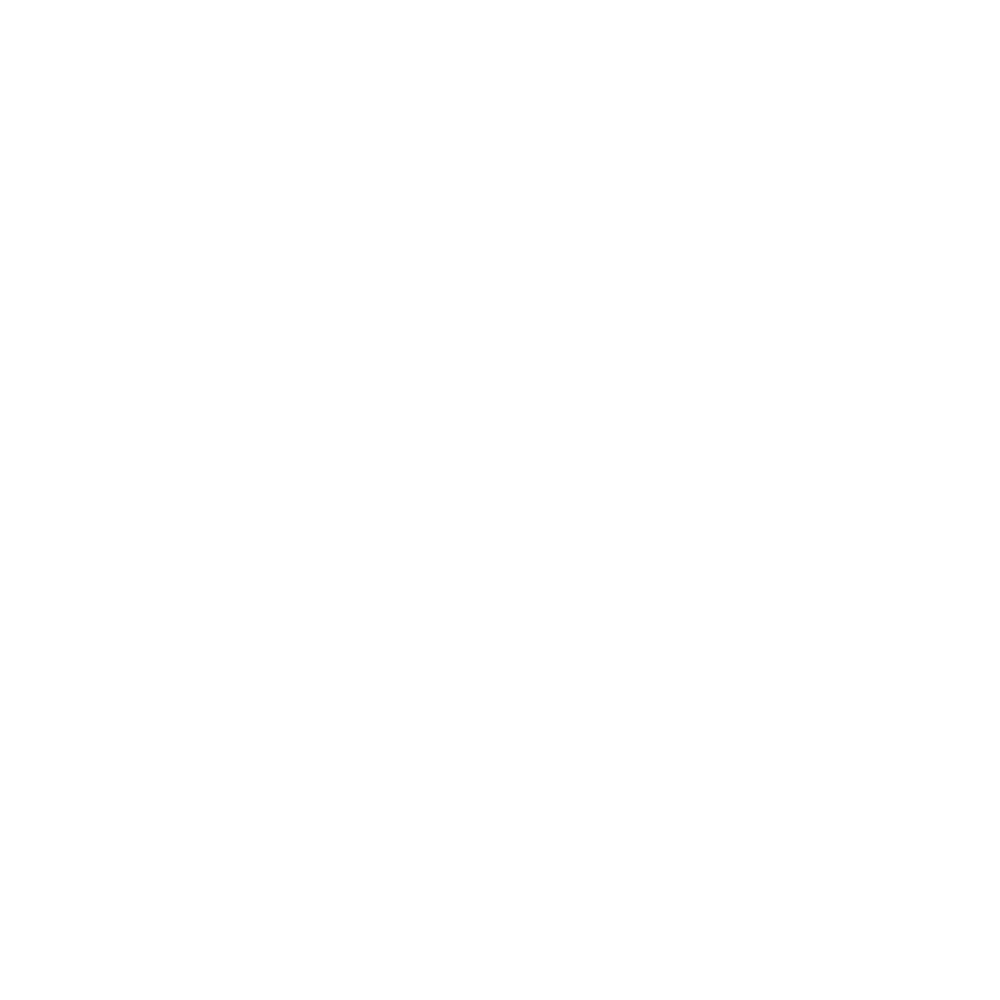

<IPython.core.display.Javascript object>


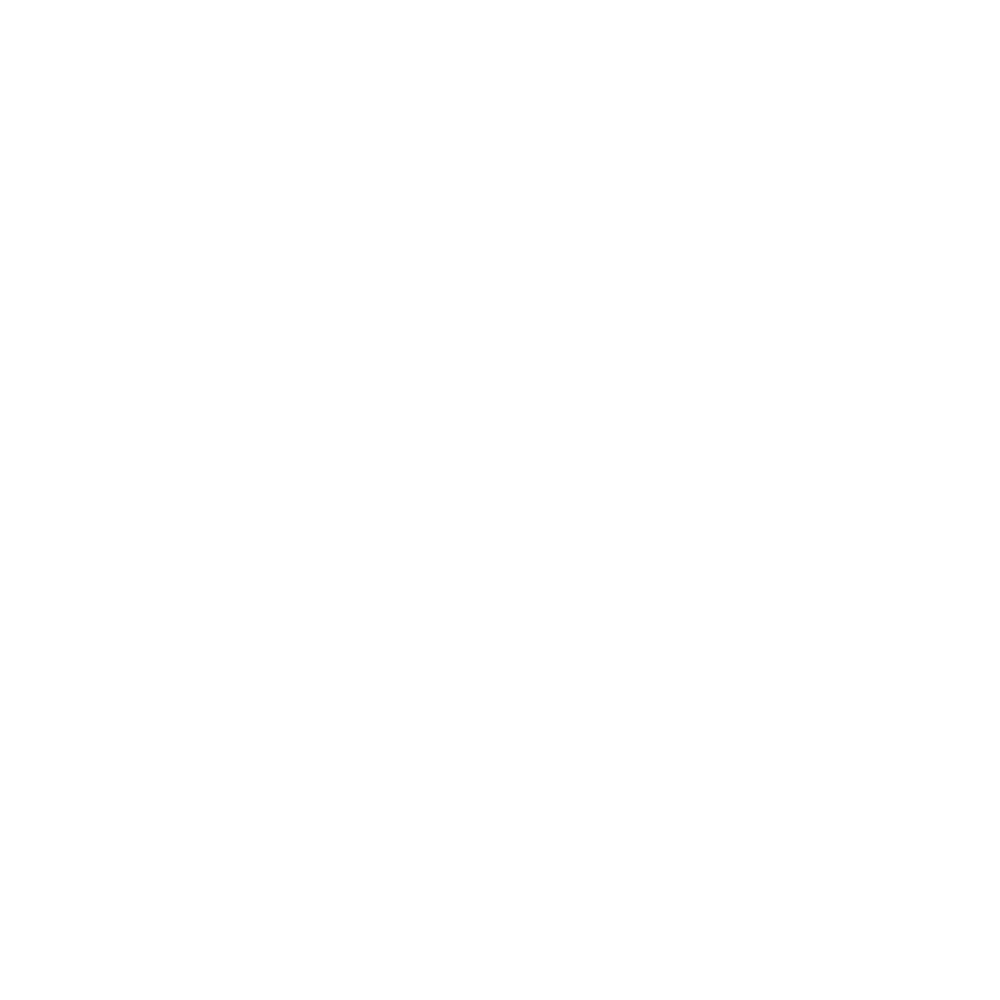

<IPython.core.display.Javascript object>


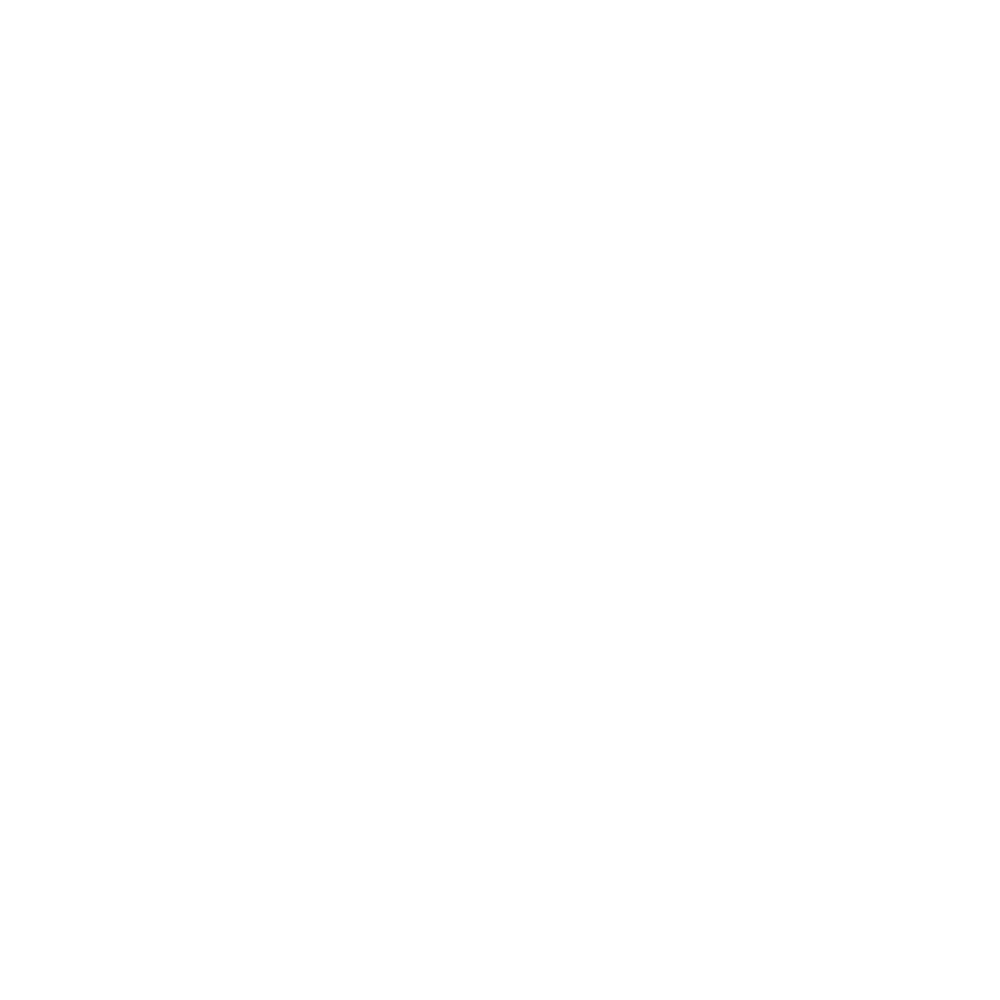

<IPython.core.display.Javascript object>


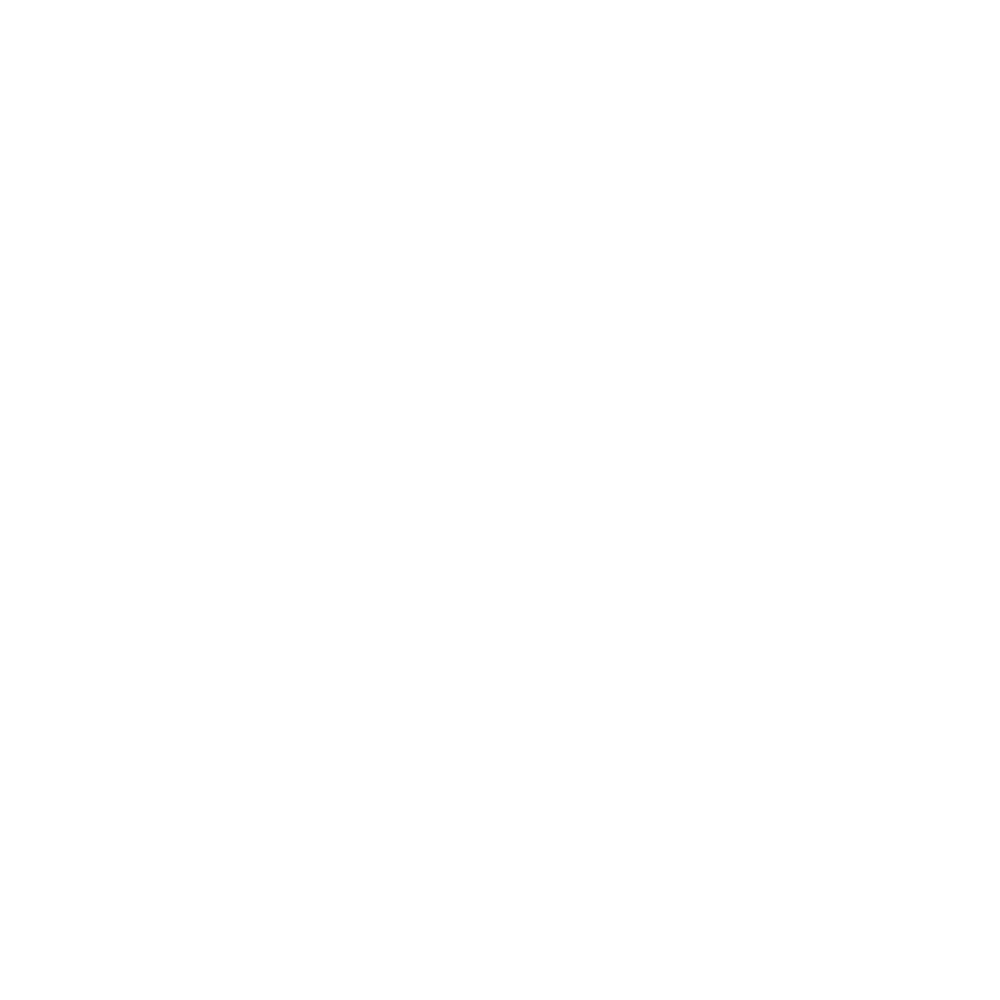

<IPython.core.display.Javascript object>


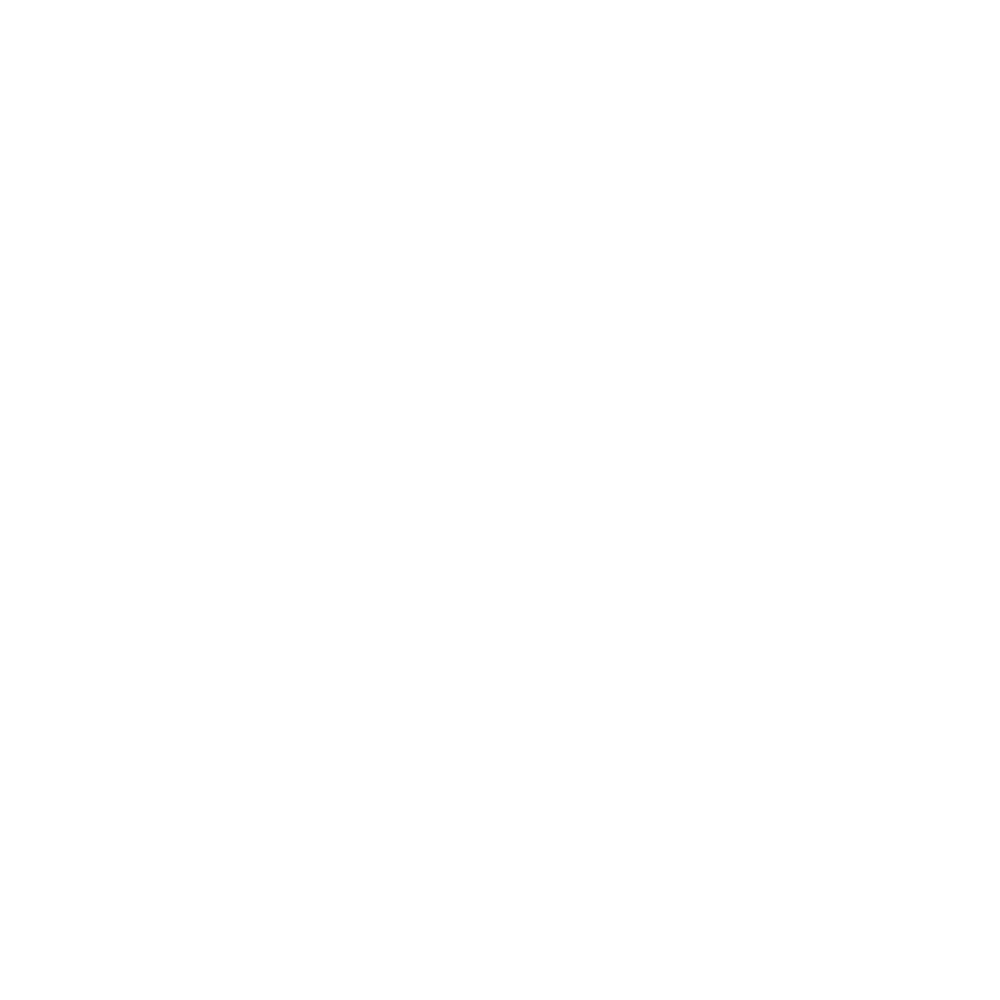

<IPython.core.display.Javascript object>


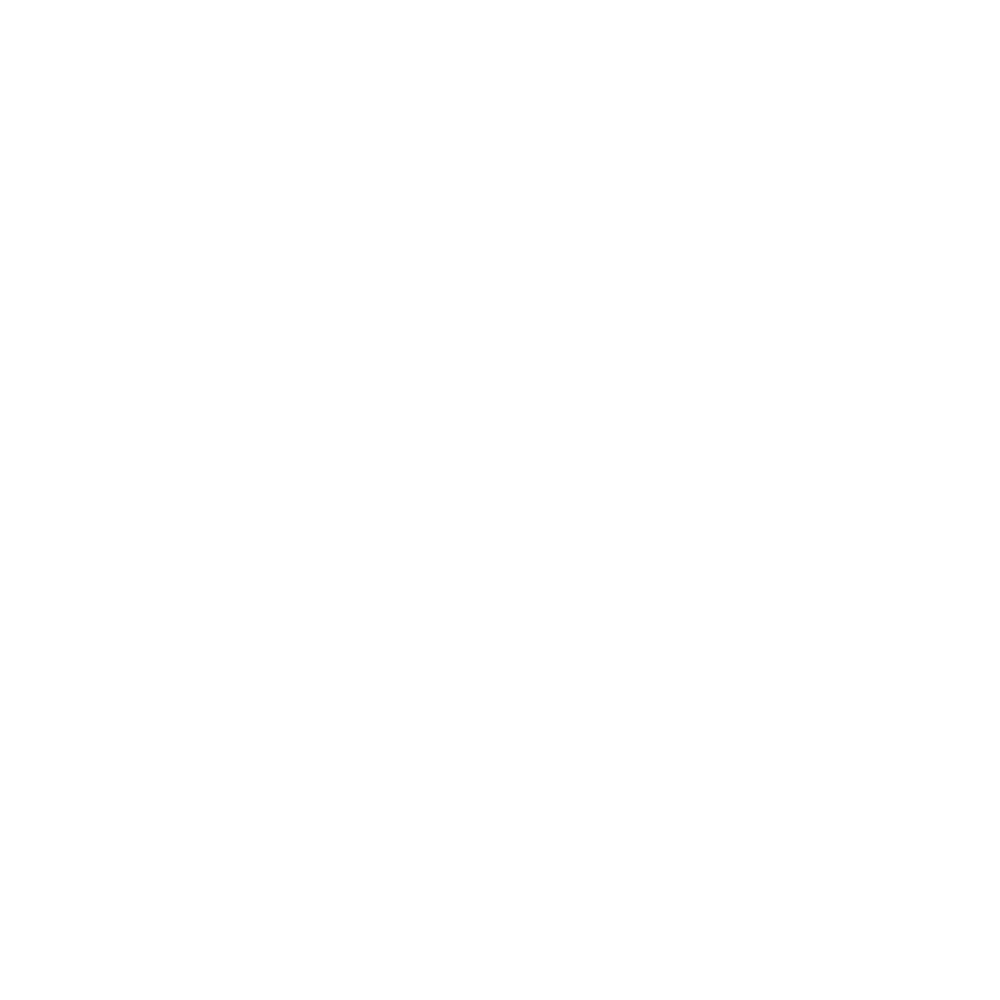

<IPython.core.display.Javascript object>


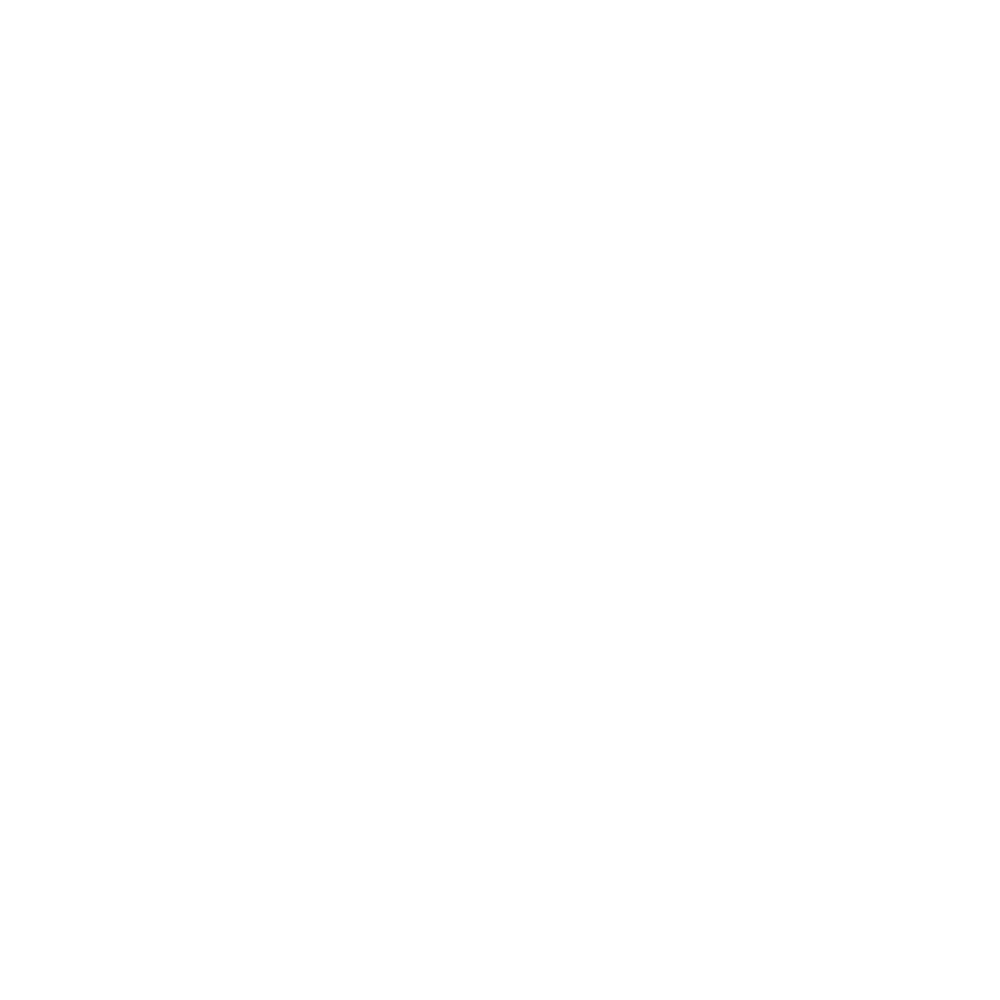

<IPython.core.display.Javascript object>


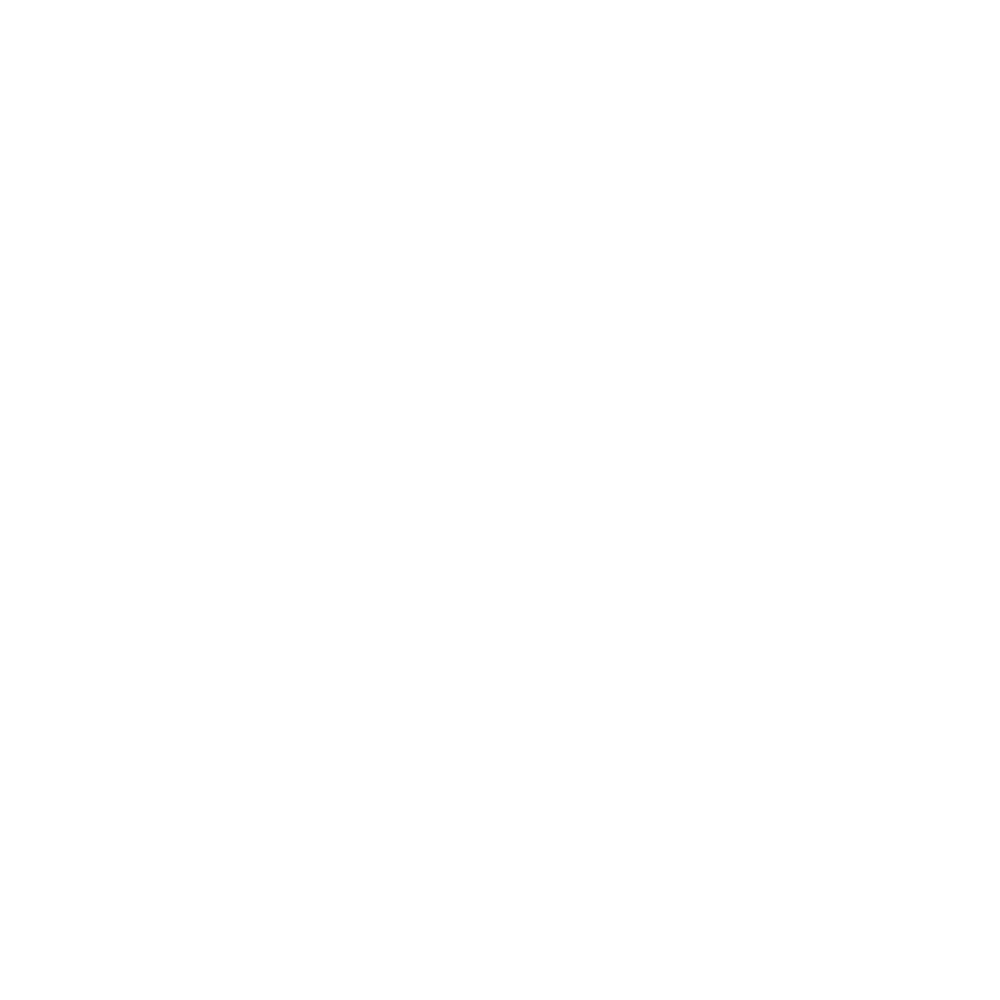

<IPython.core.display.Javascript object>


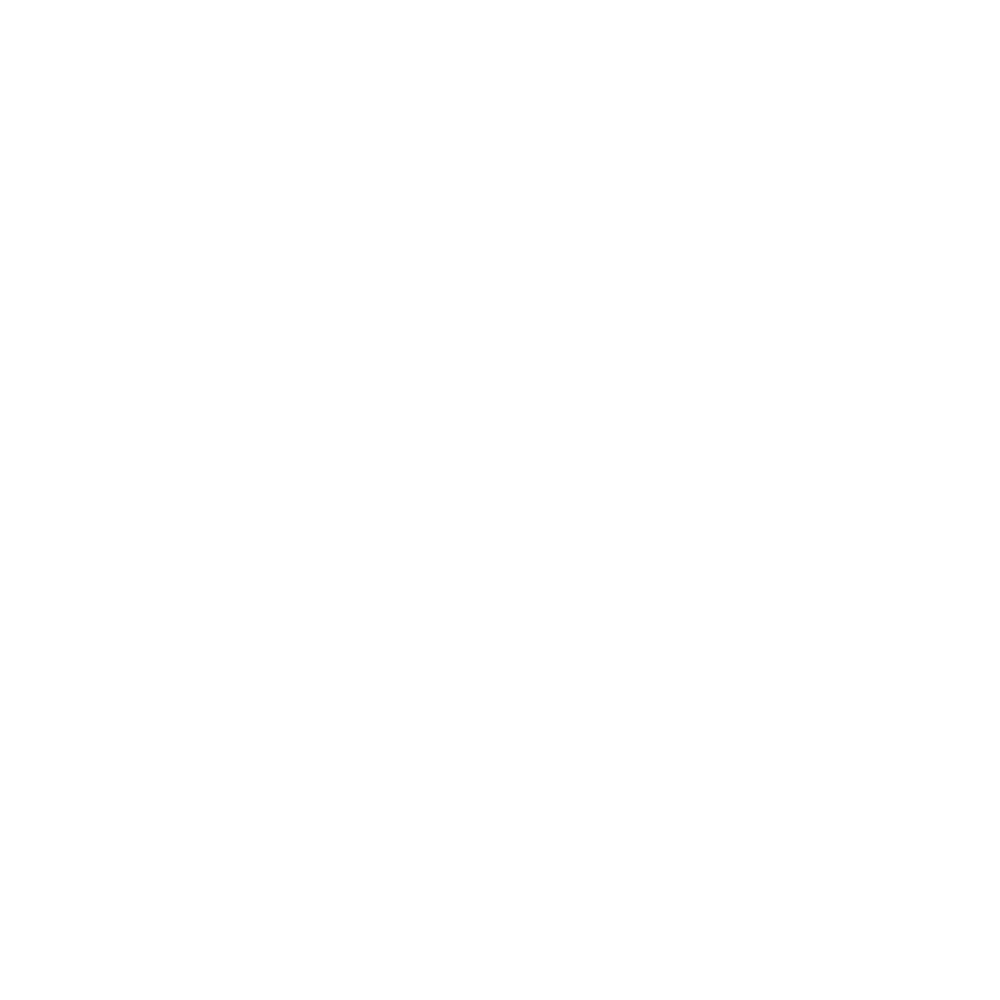

<IPython.core.display.Javascript object>


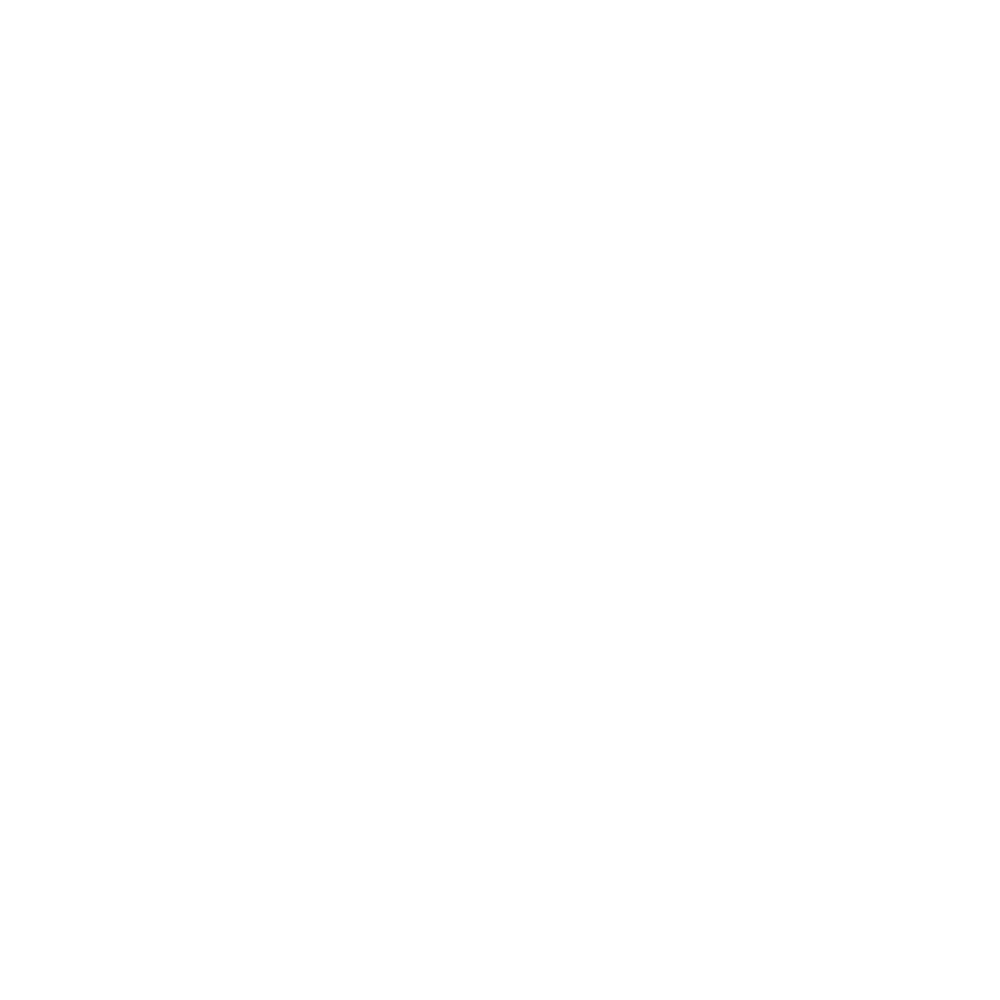

<IPython.core.display.Javascript object>


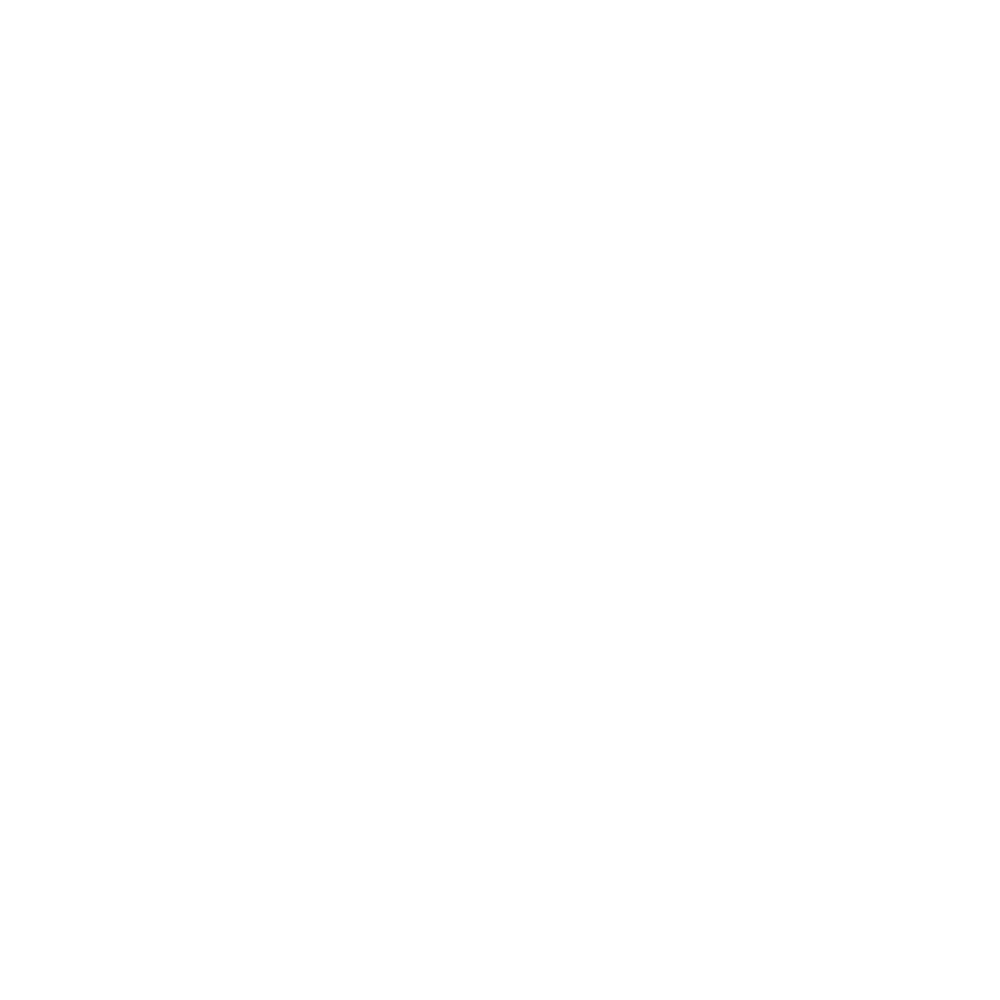

<IPython.core.display.Javascript object>


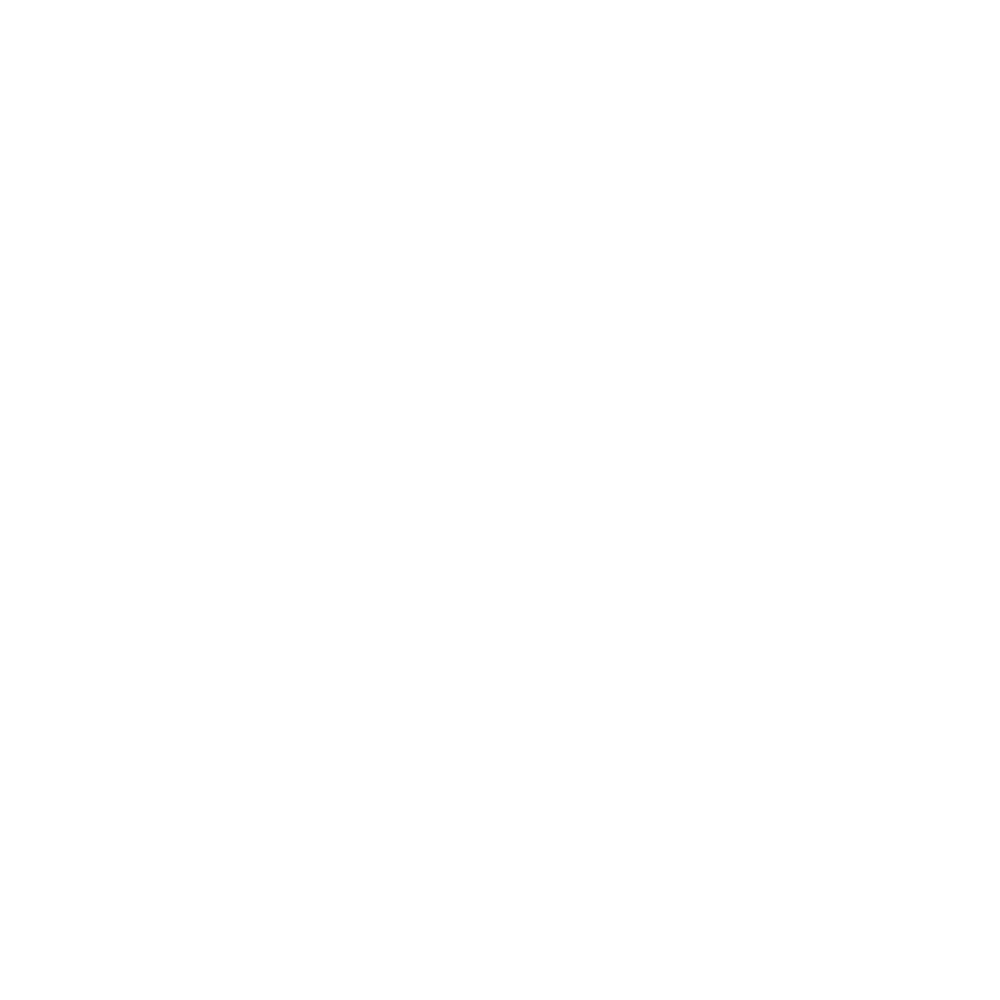

<IPython.core.display.Javascript object>


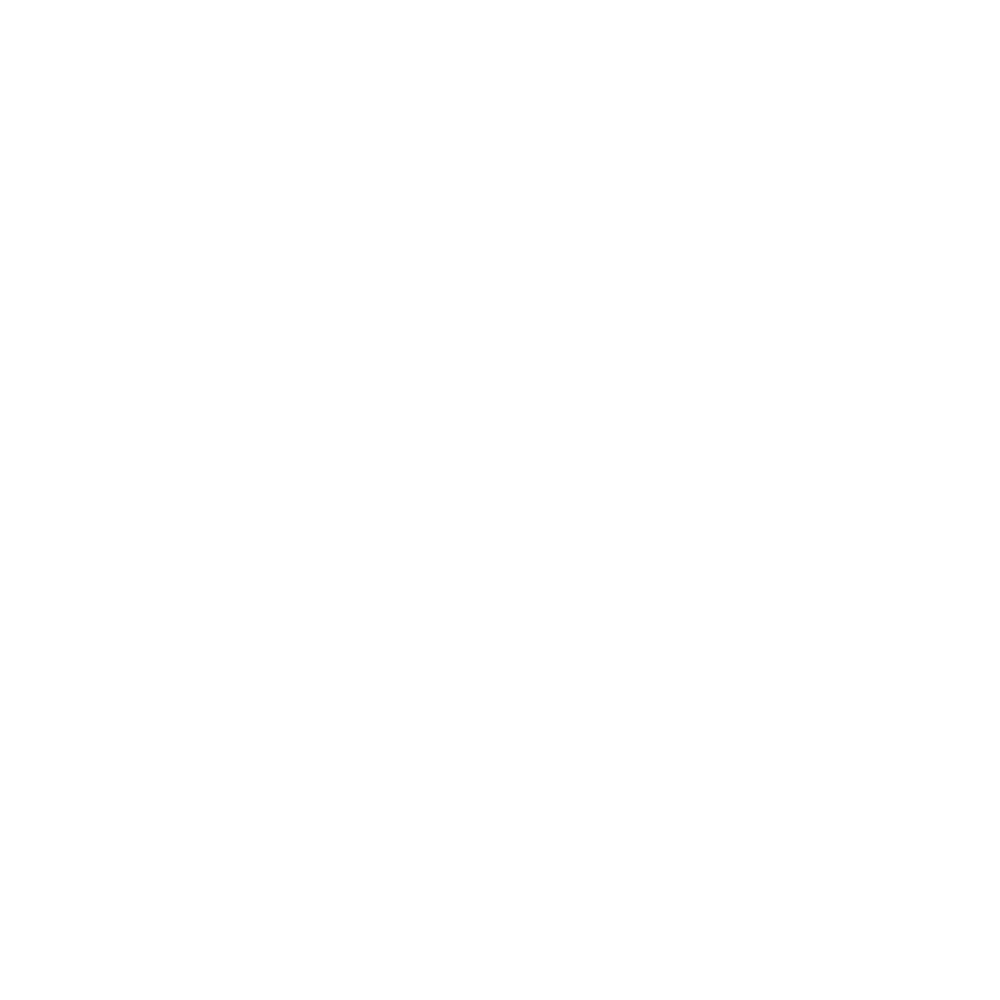

<IPython.core.display.Javascript object>


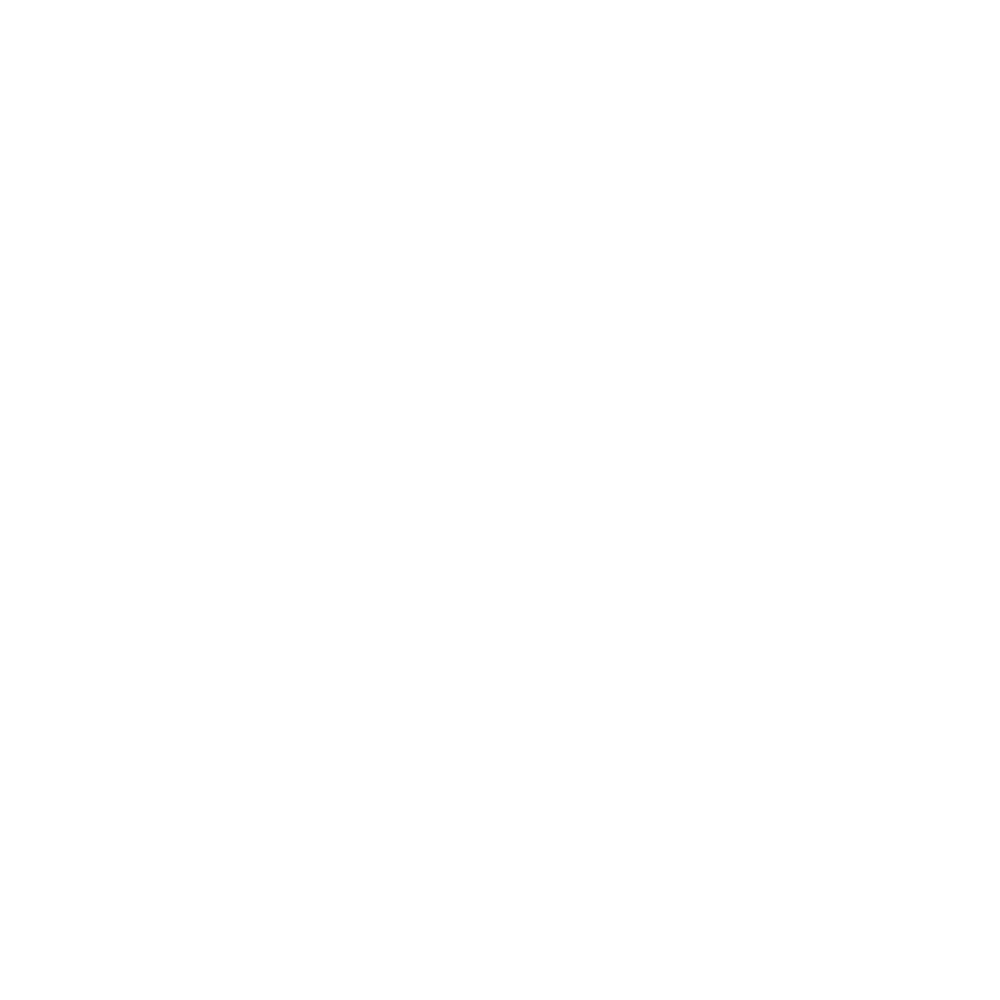

<IPython.core.display.Javascript object>


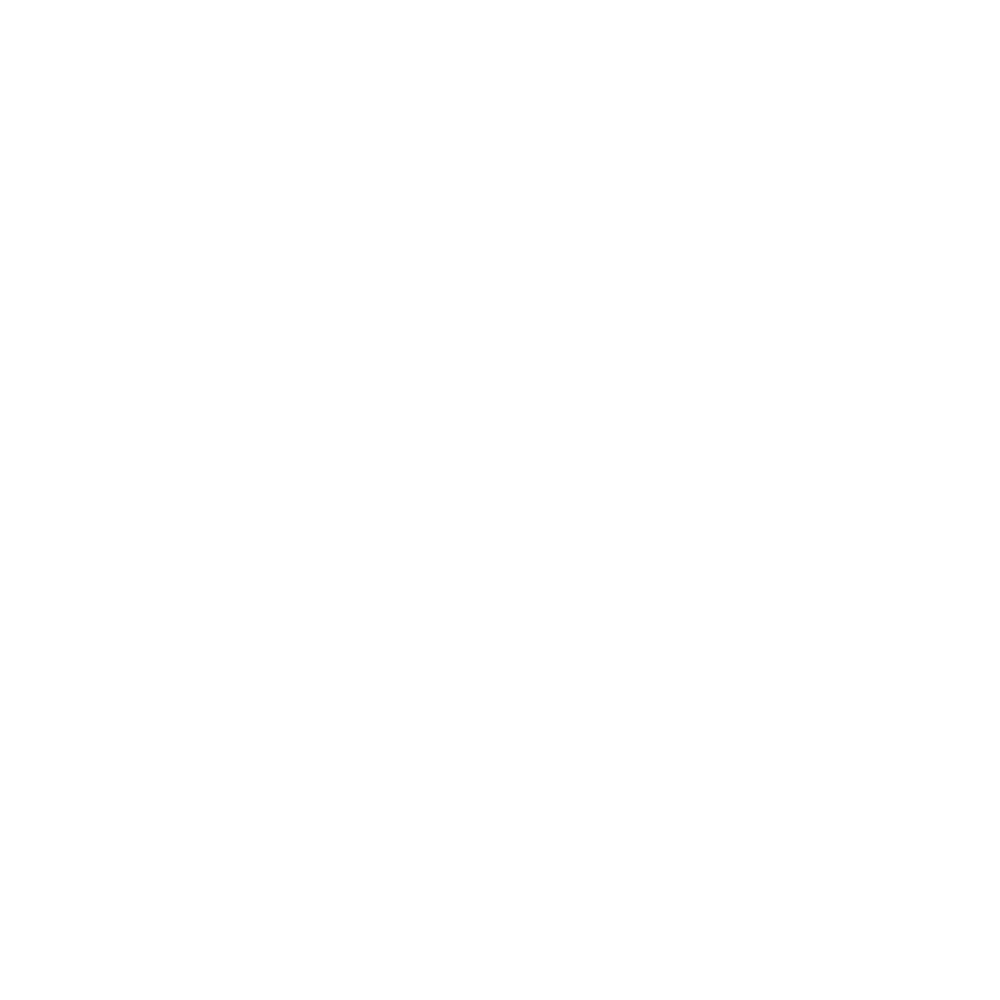

<IPython.core.display.Javascript object>


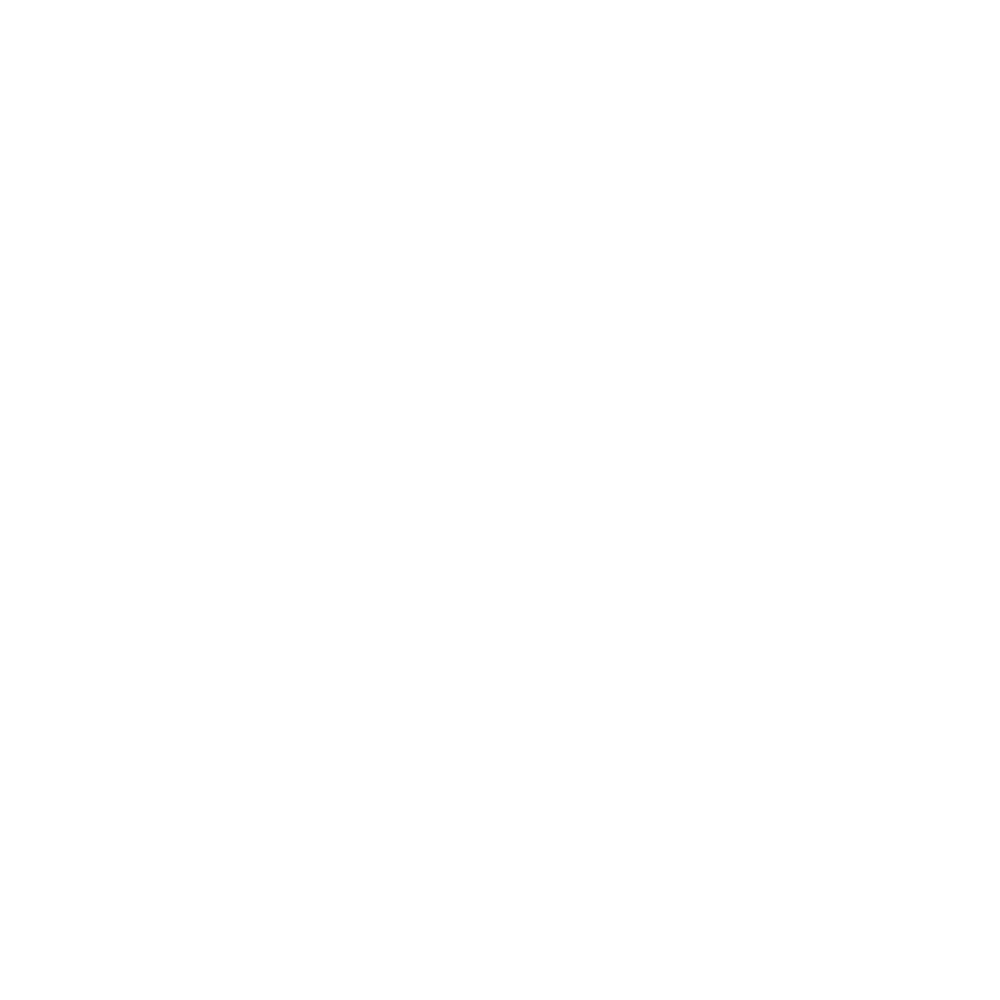

<IPython.core.display.Javascript object>


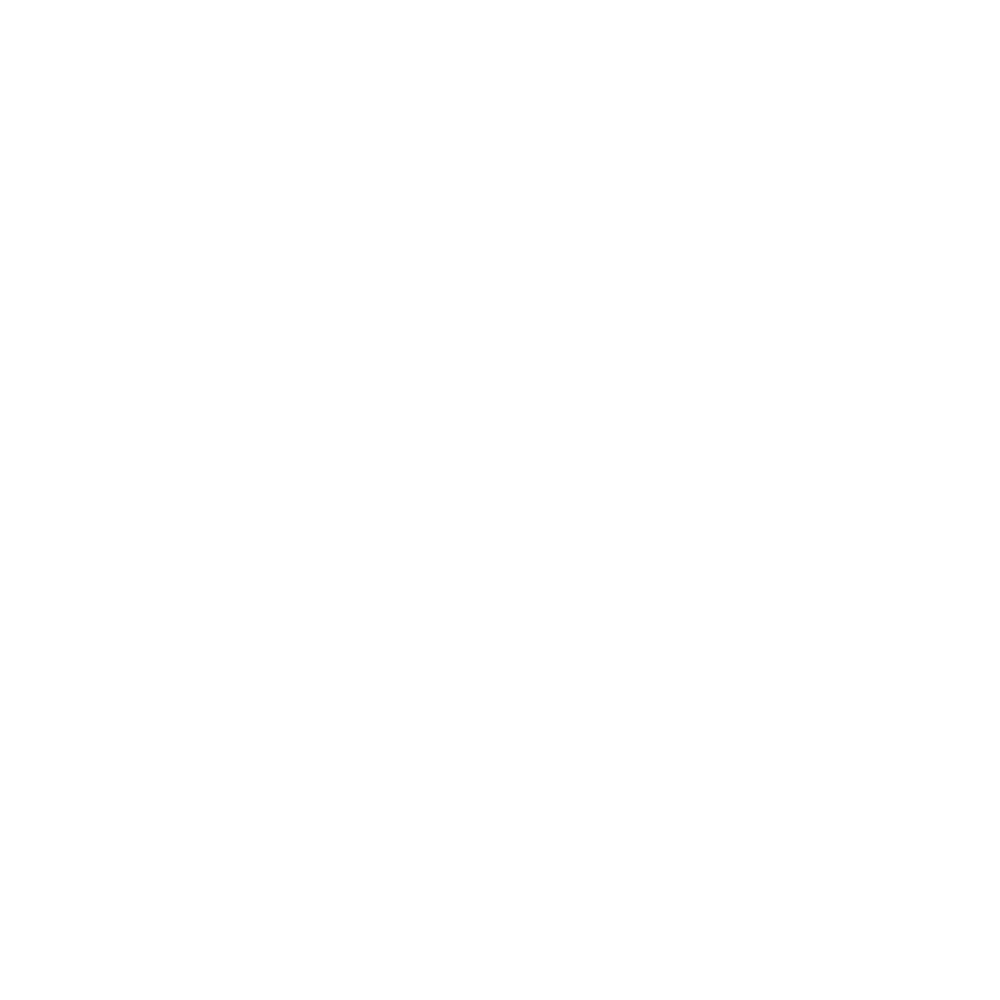

<IPython.core.display.Javascript object>


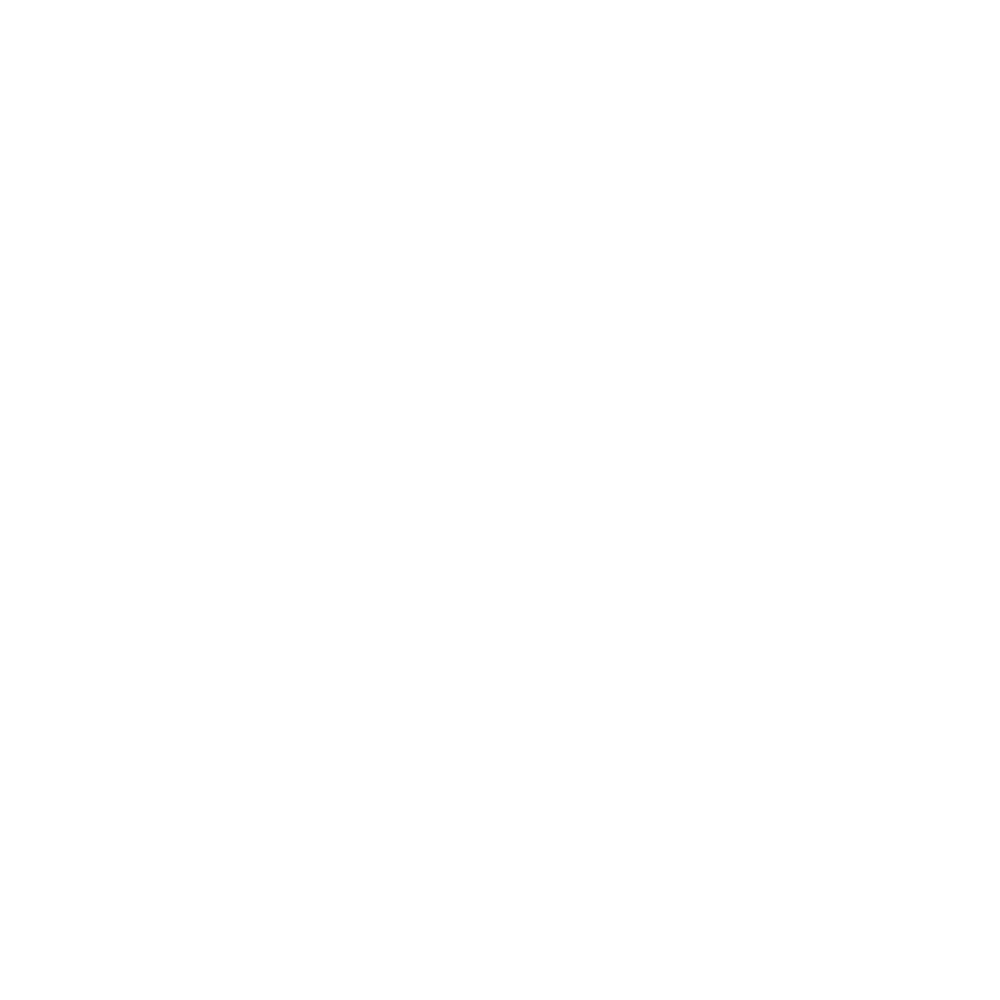

<IPython.core.display.Javascript object>


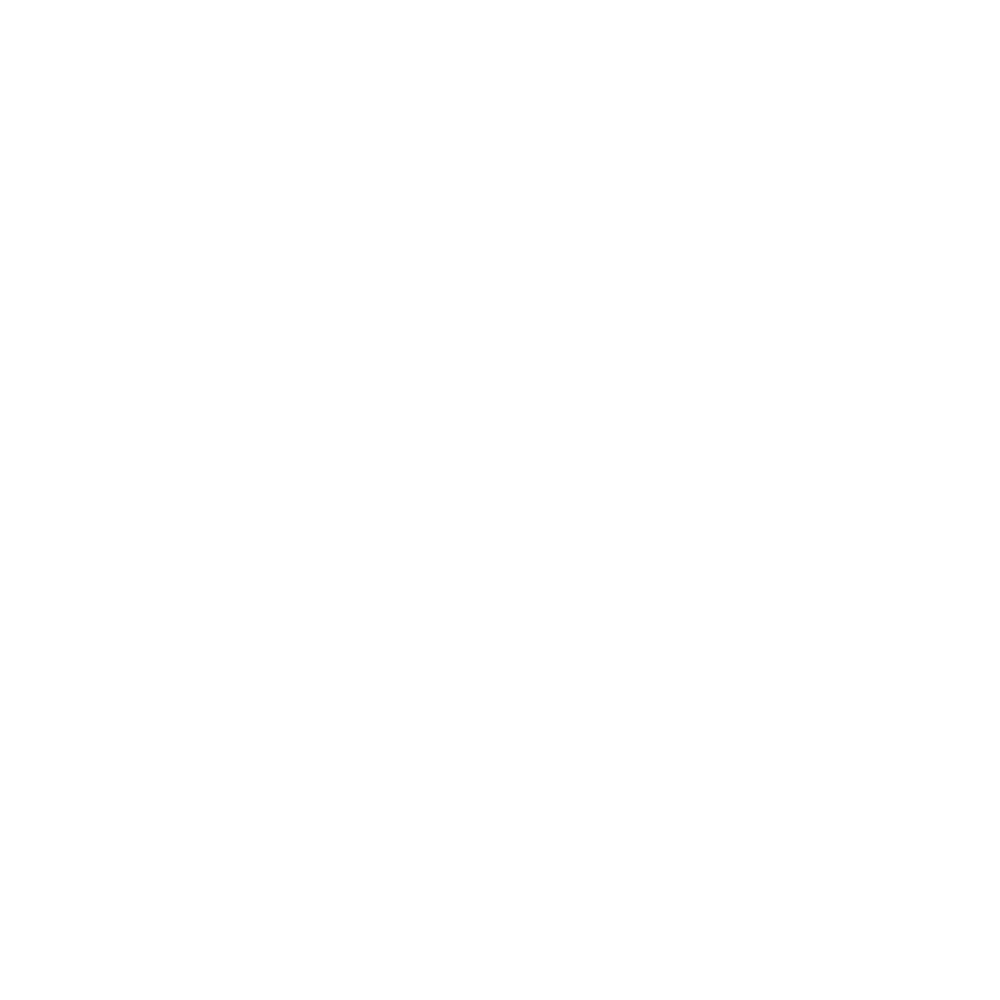

<IPython.core.display.Javascript object>


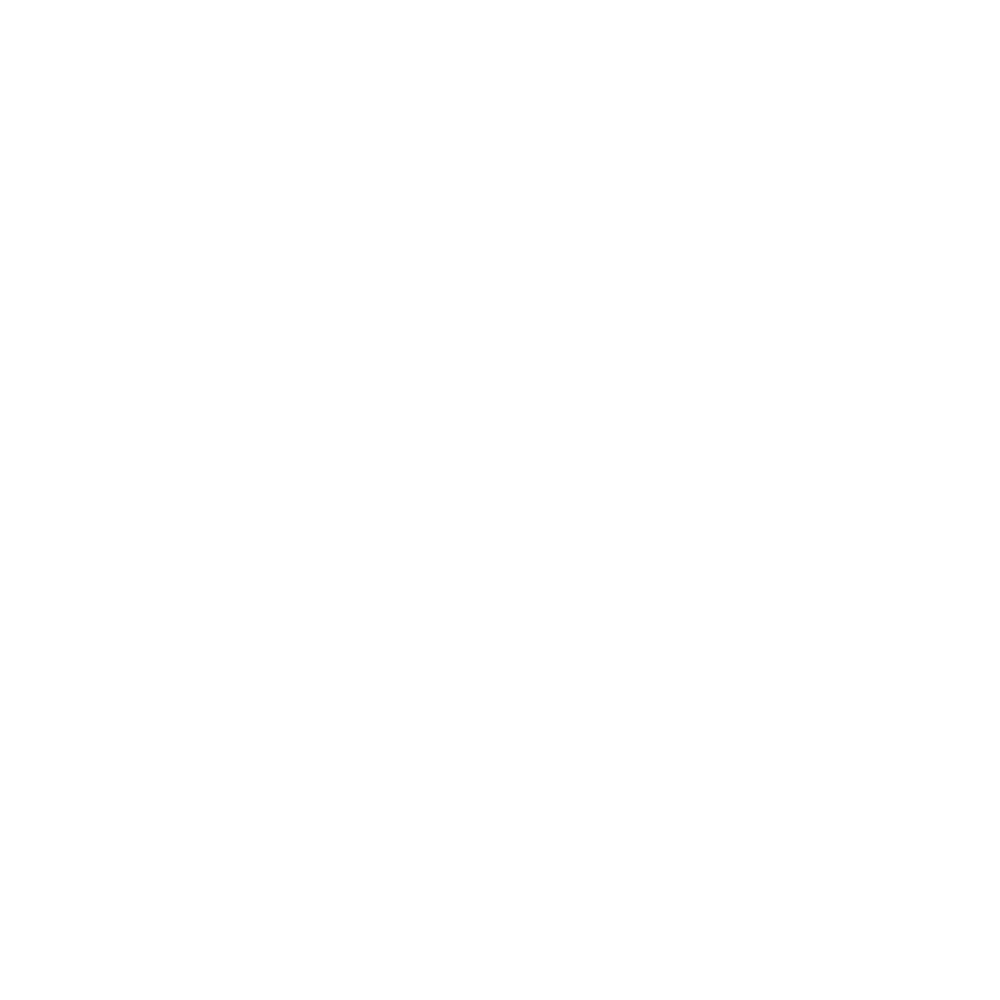

<IPython.core.display.Javascript object>


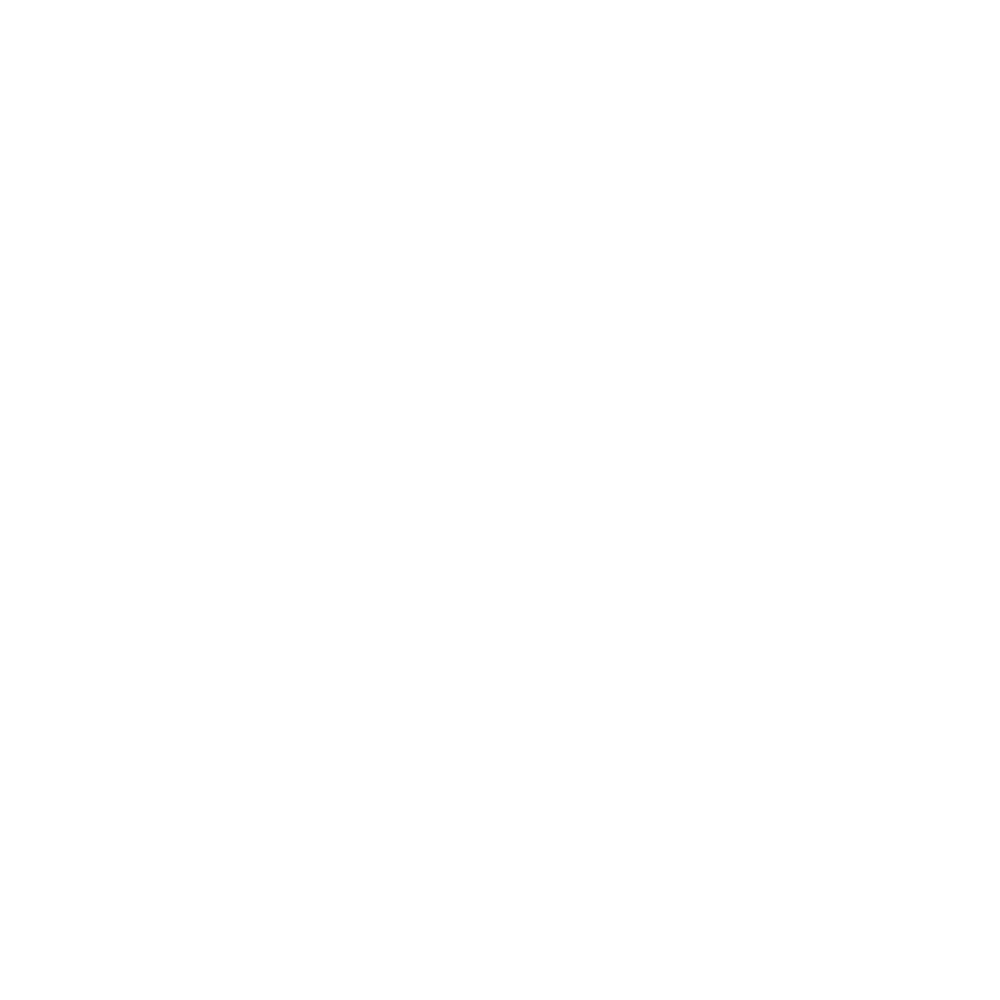

<IPython.core.display.Javascript object>


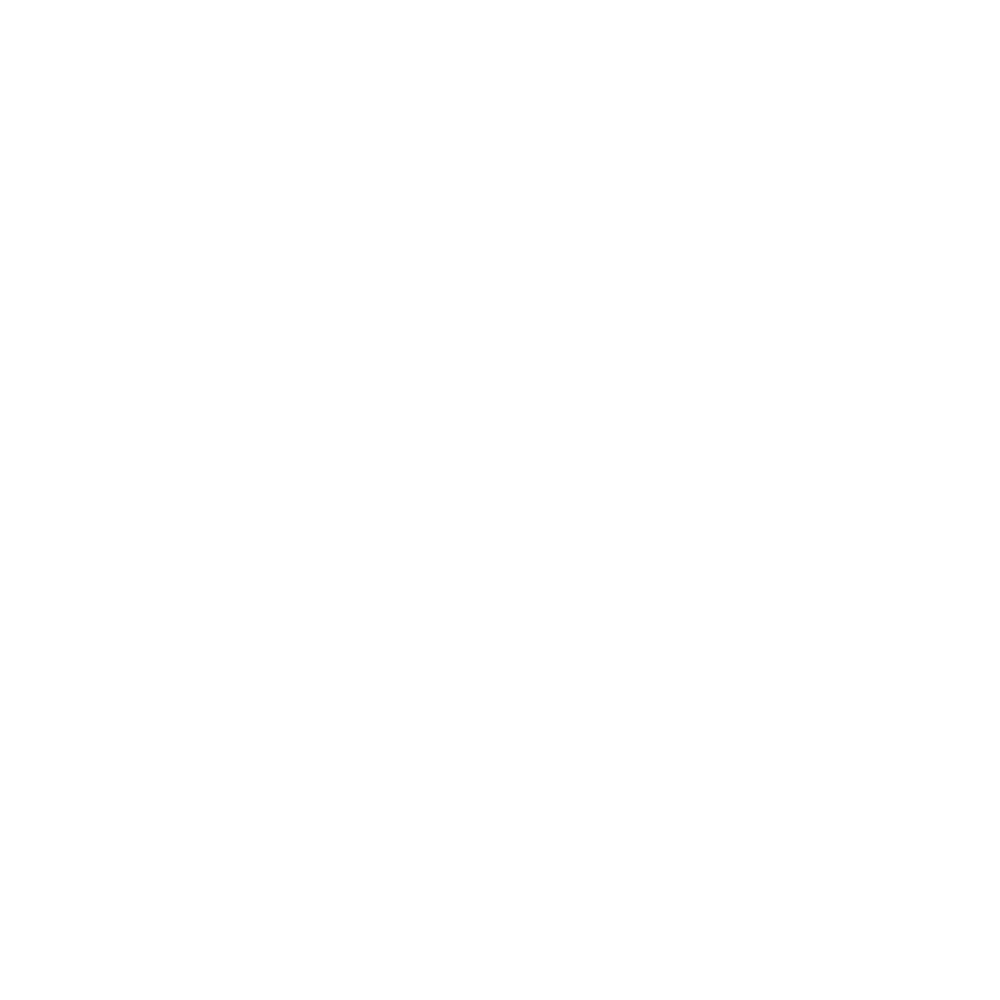

<IPython.core.display.Javascript object>


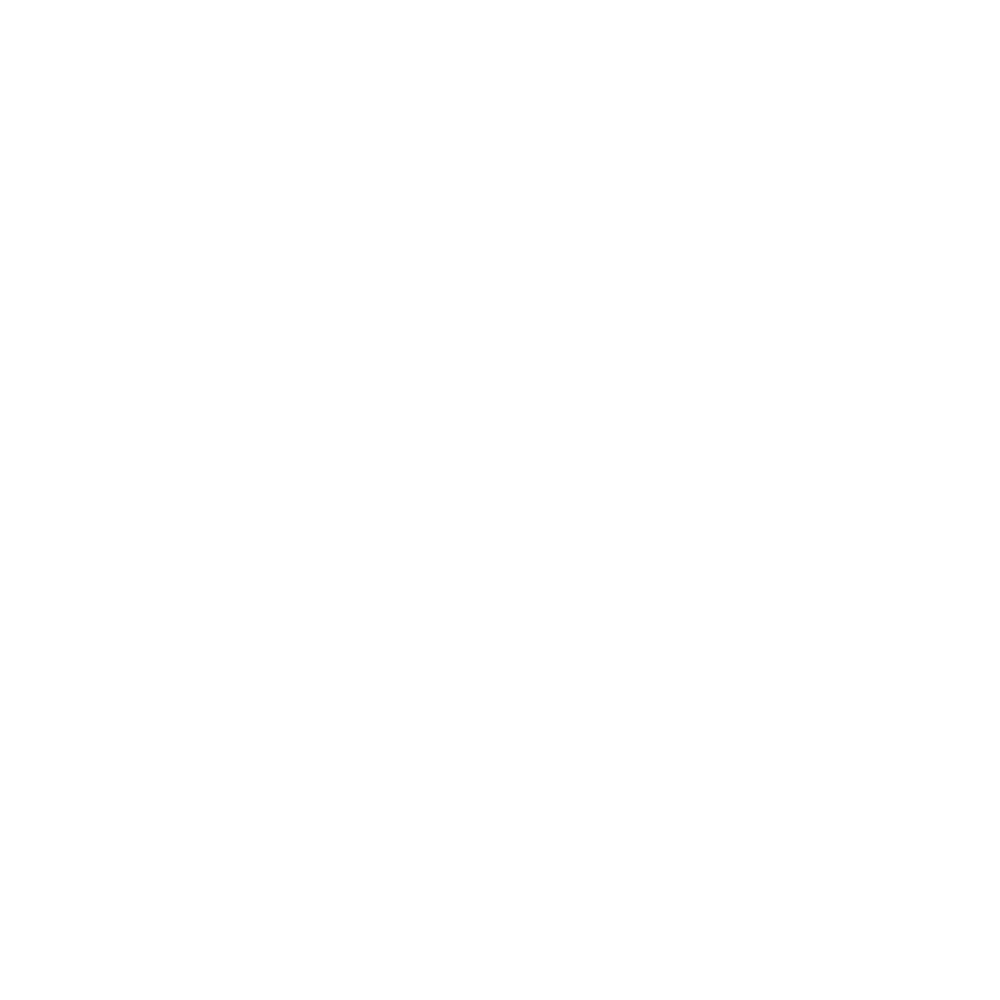

<IPython.core.display.Javascript object>


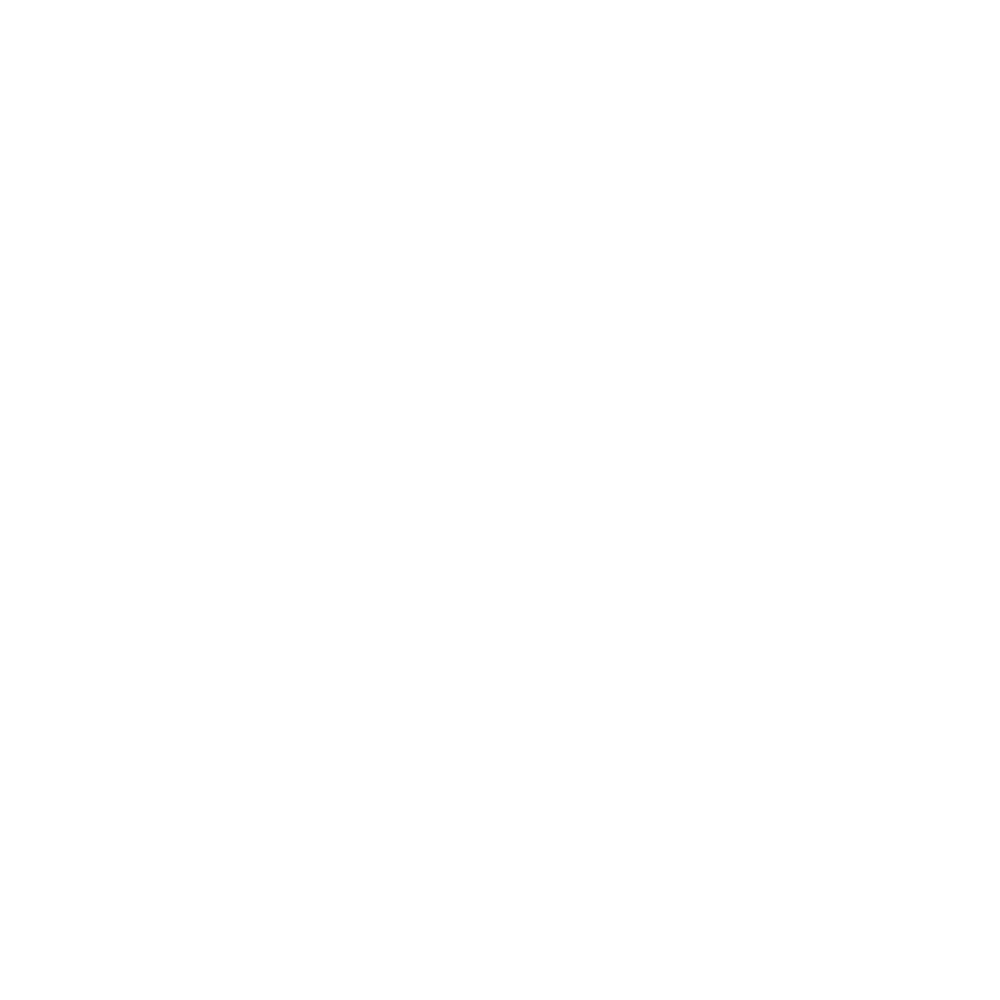

<IPython.core.display.Javascript object>


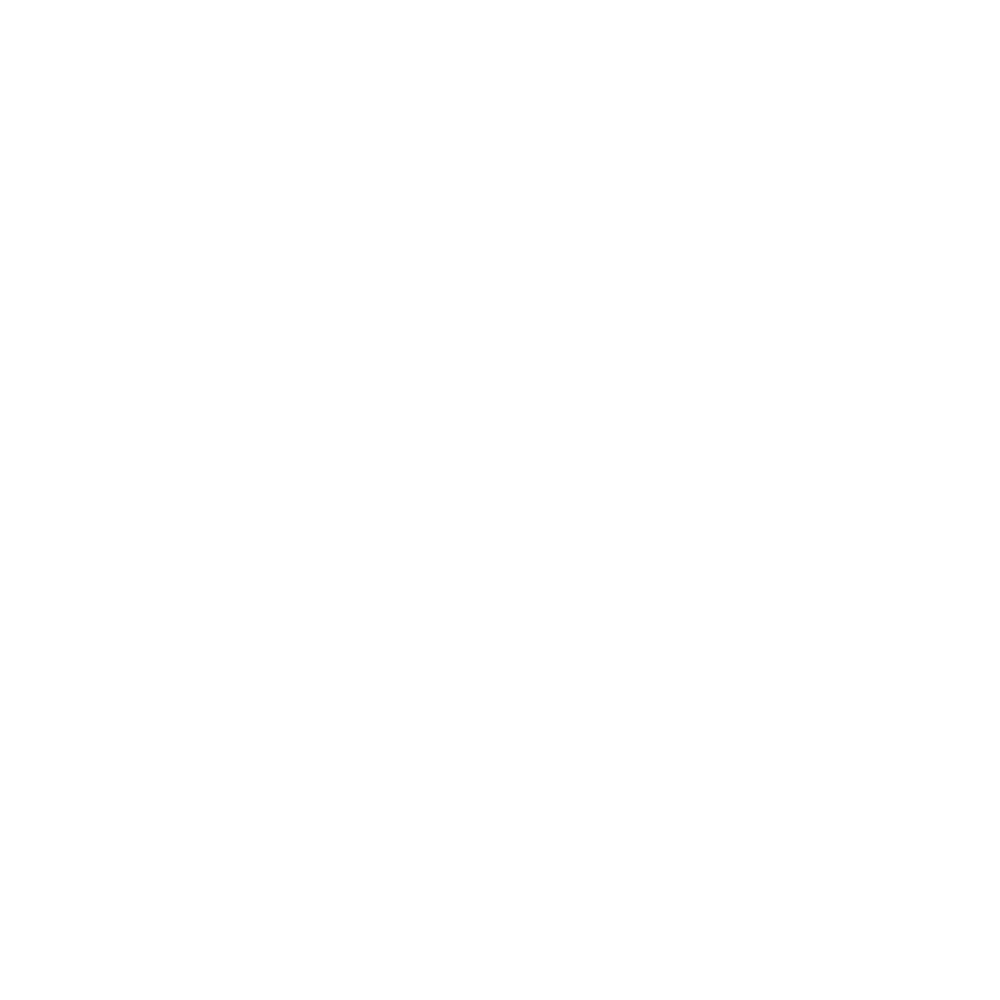

<IPython.core.display.Javascript object>


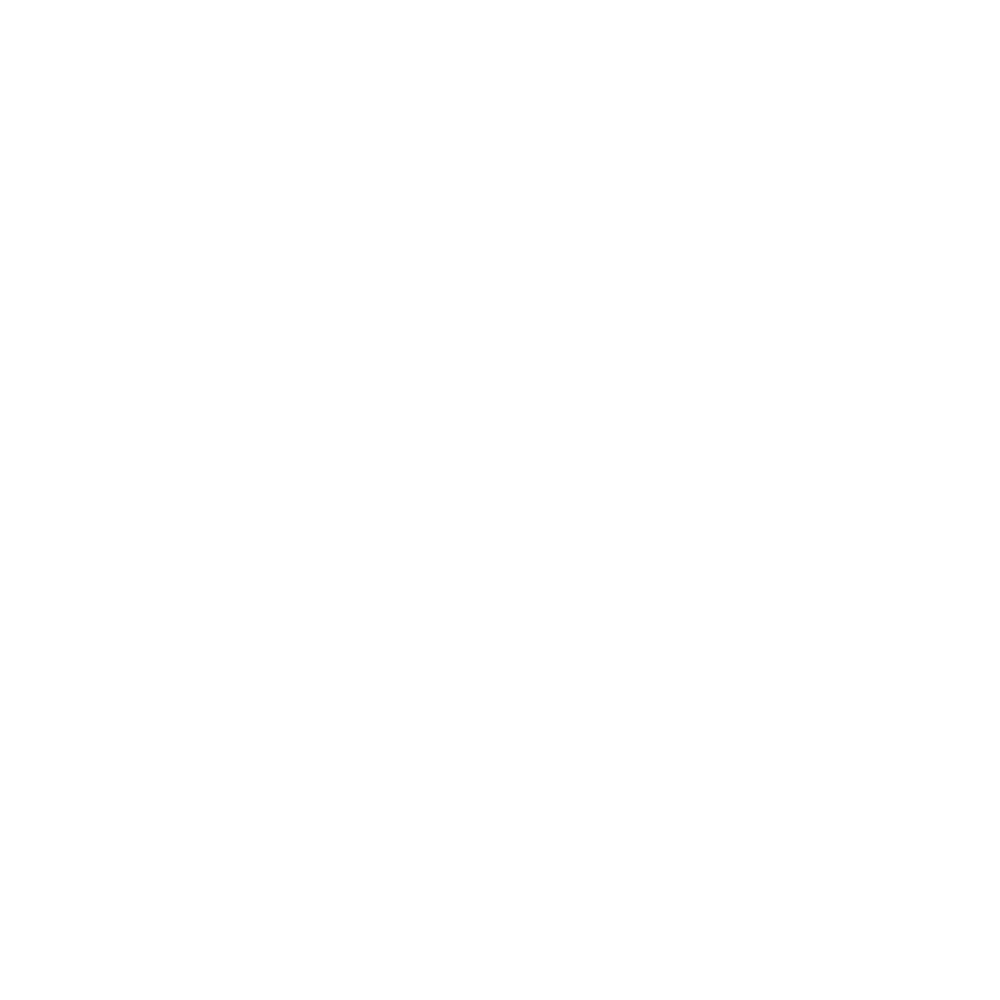

<IPython.core.display.Javascript object>


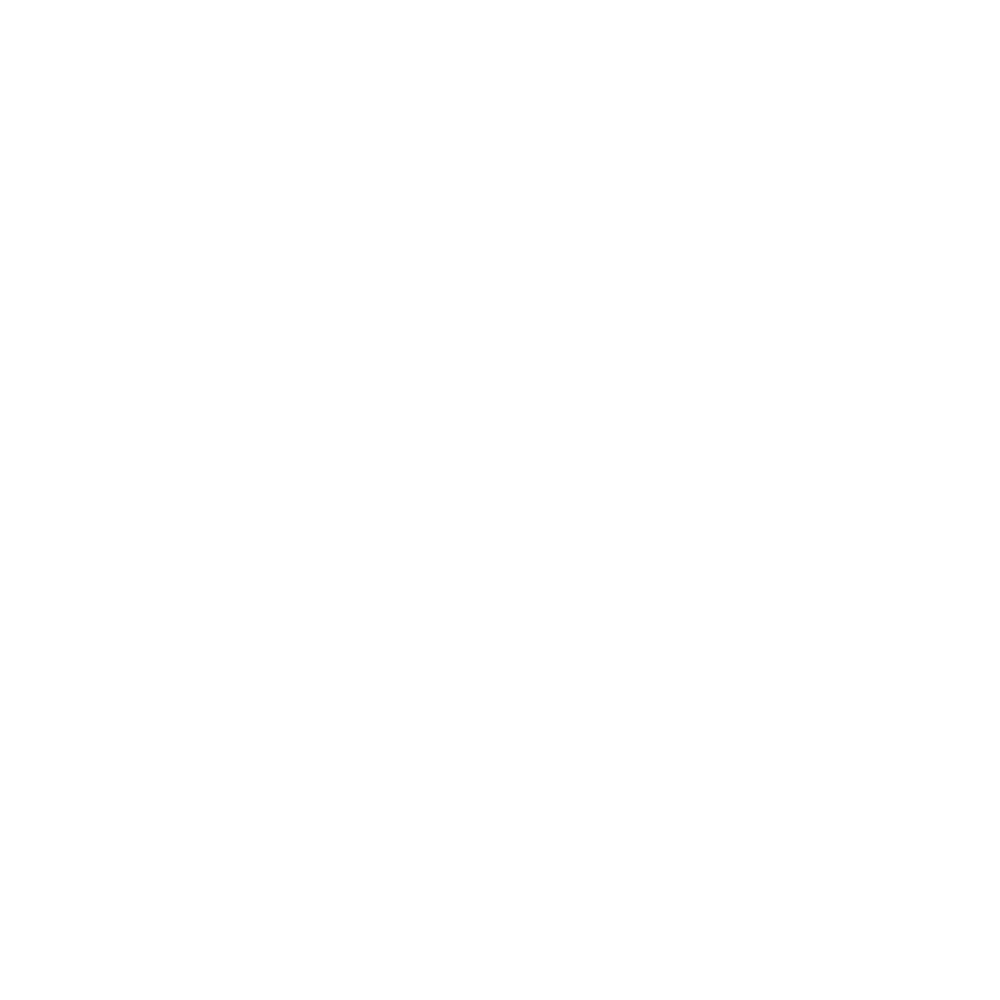

<IPython.core.display.Javascript object>


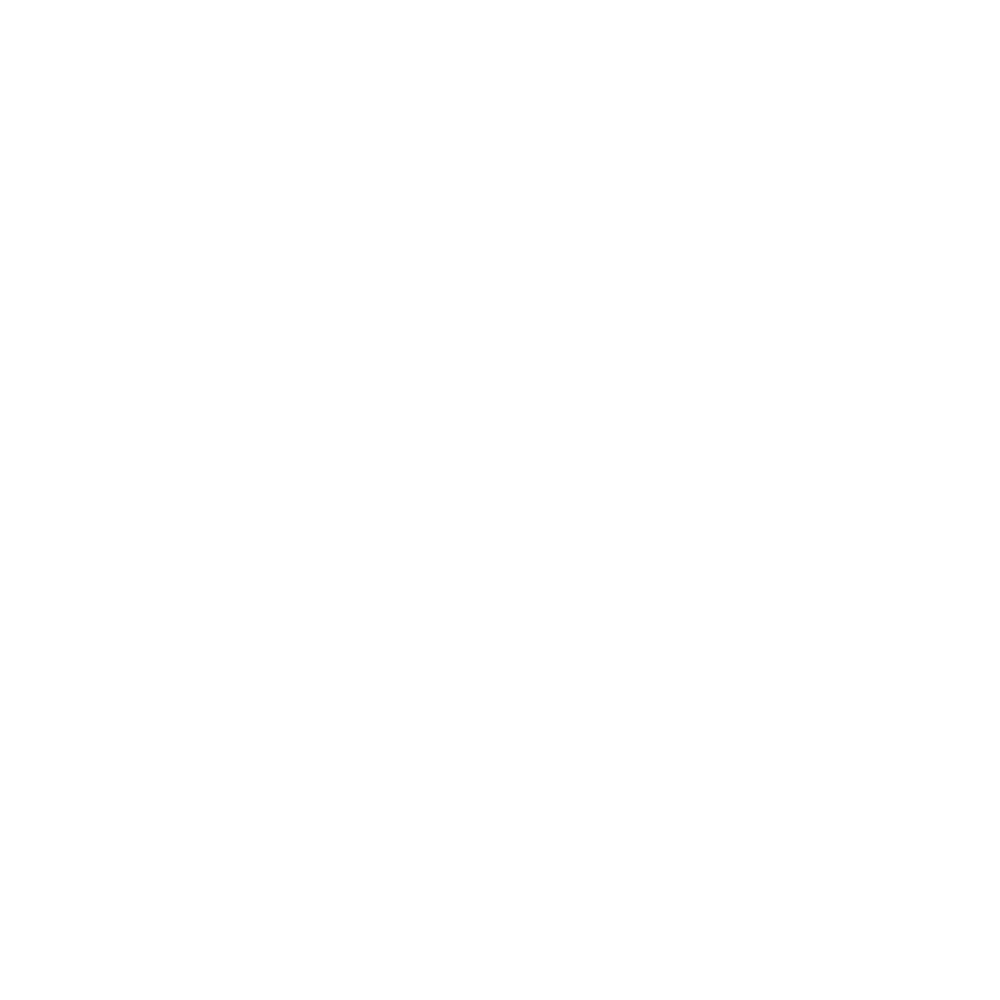

<IPython.core.display.Javascript object>


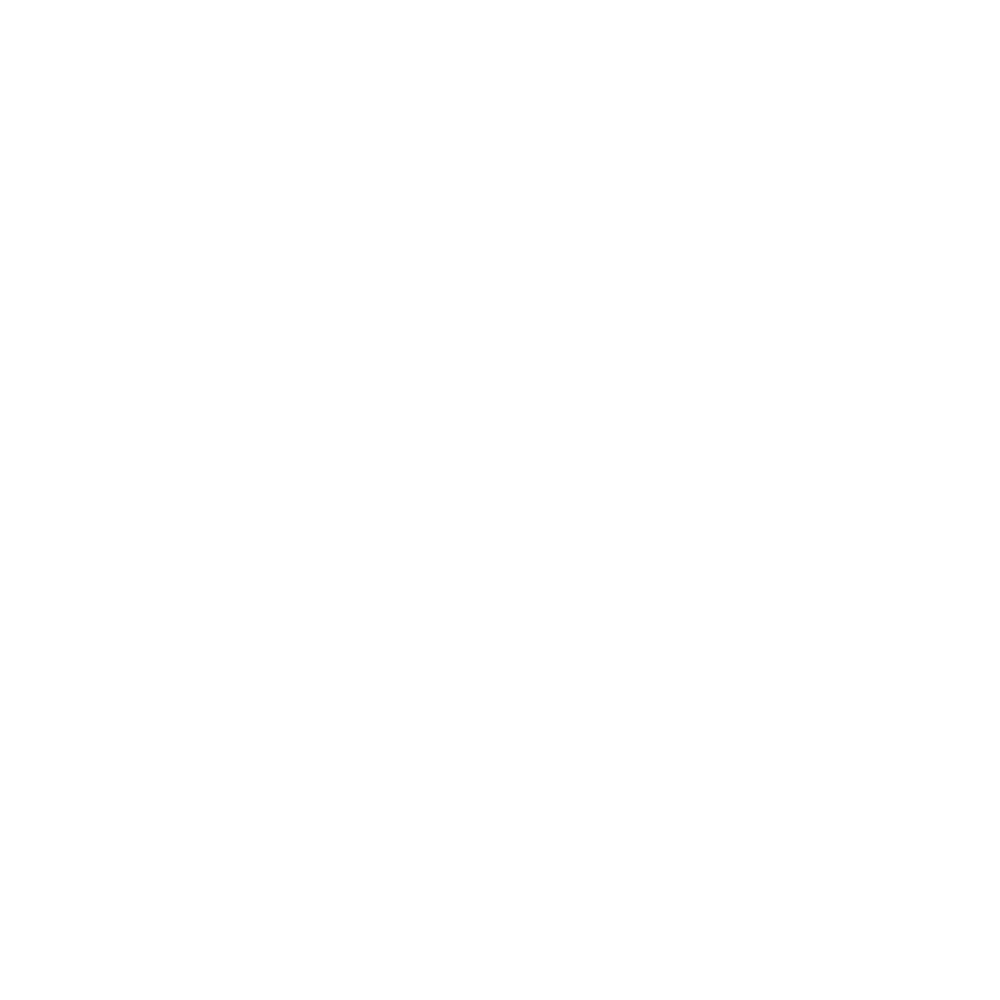

<IPython.core.display.Javascript object>


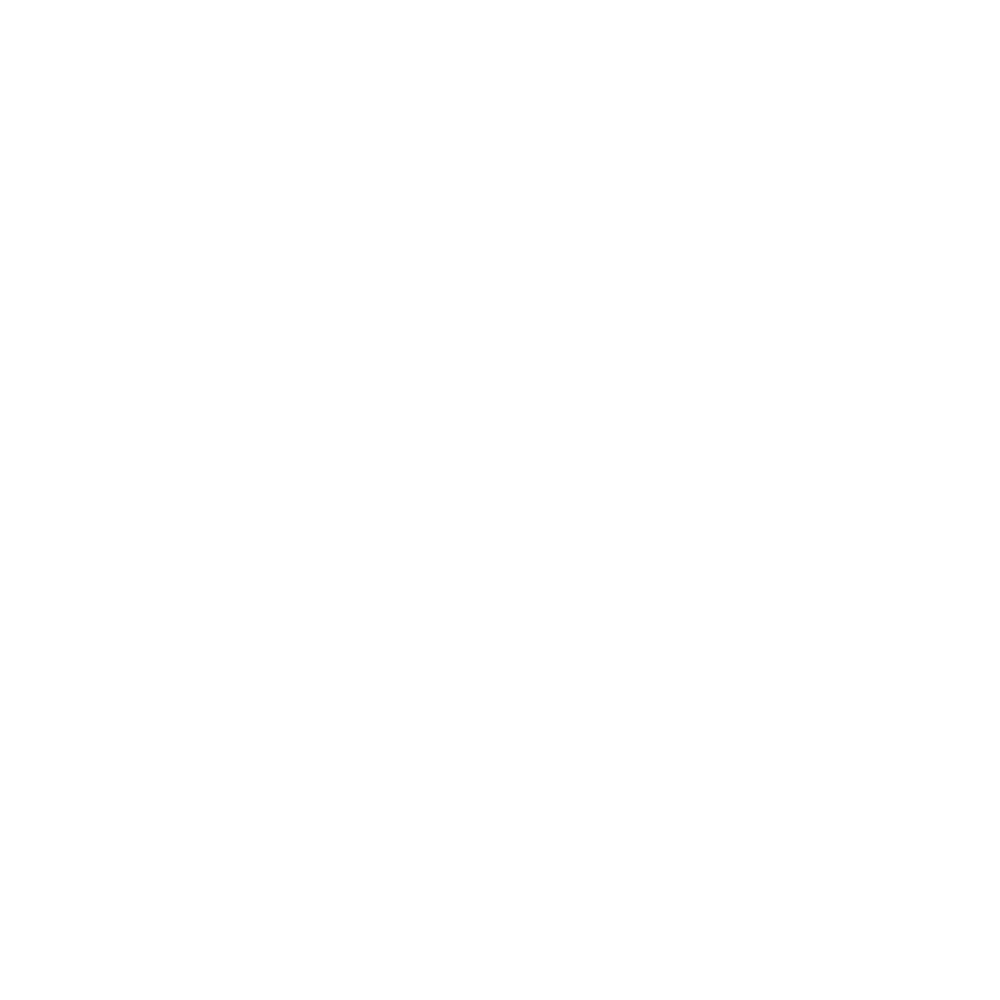

<IPython.core.display.Javascript object>


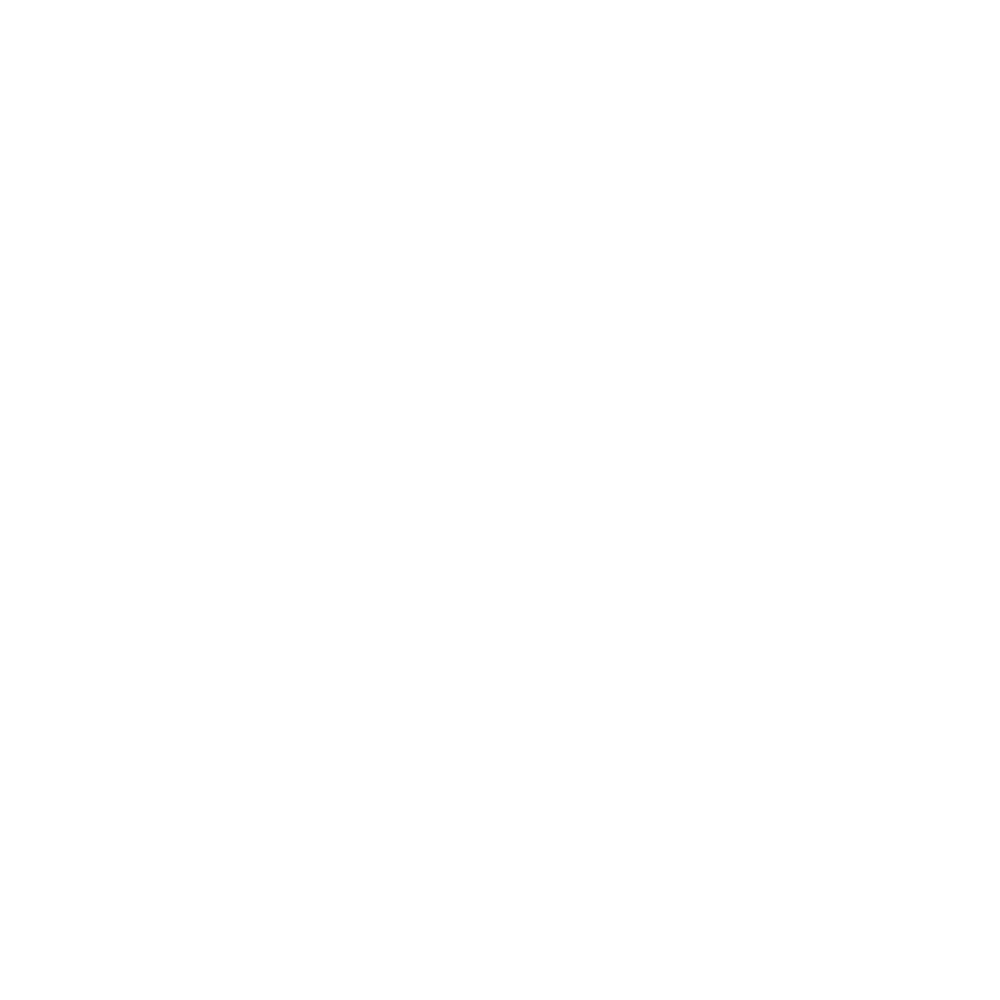

<IPython.core.display.Javascript object>


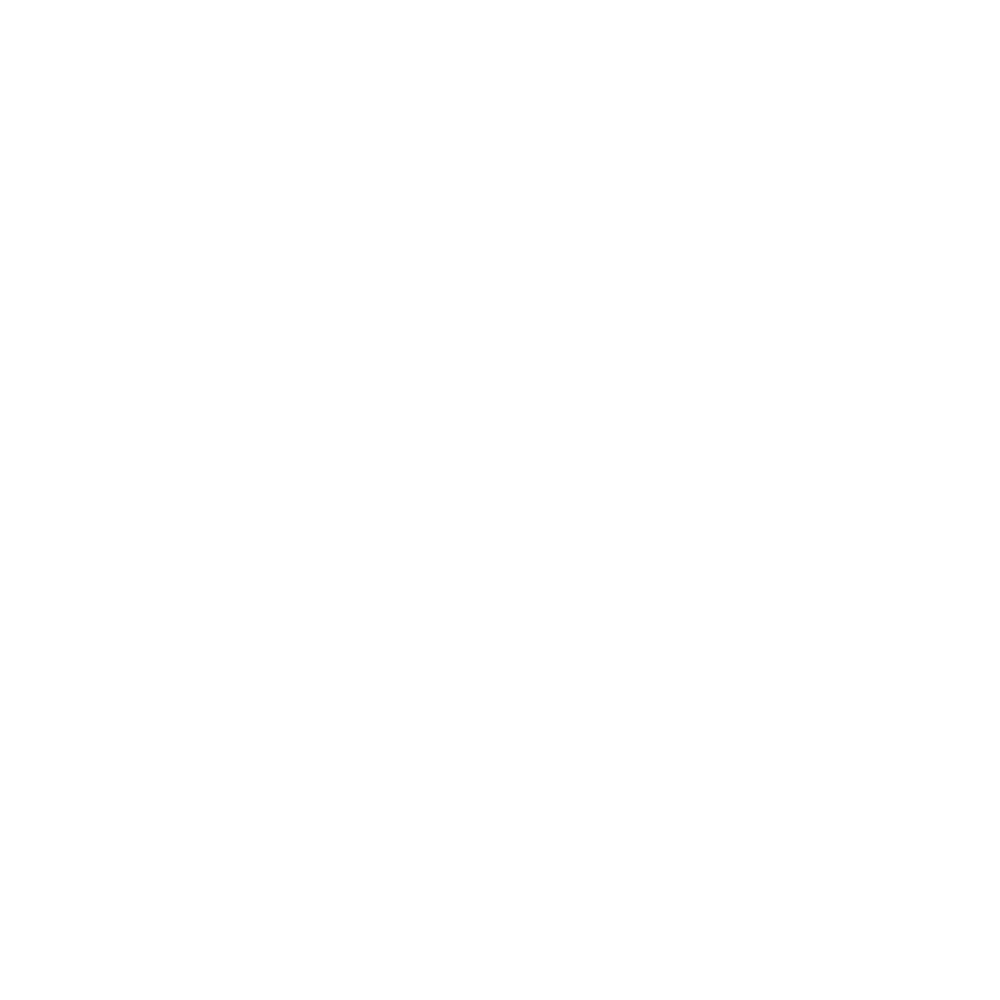

<IPython.core.display.Javascript object>


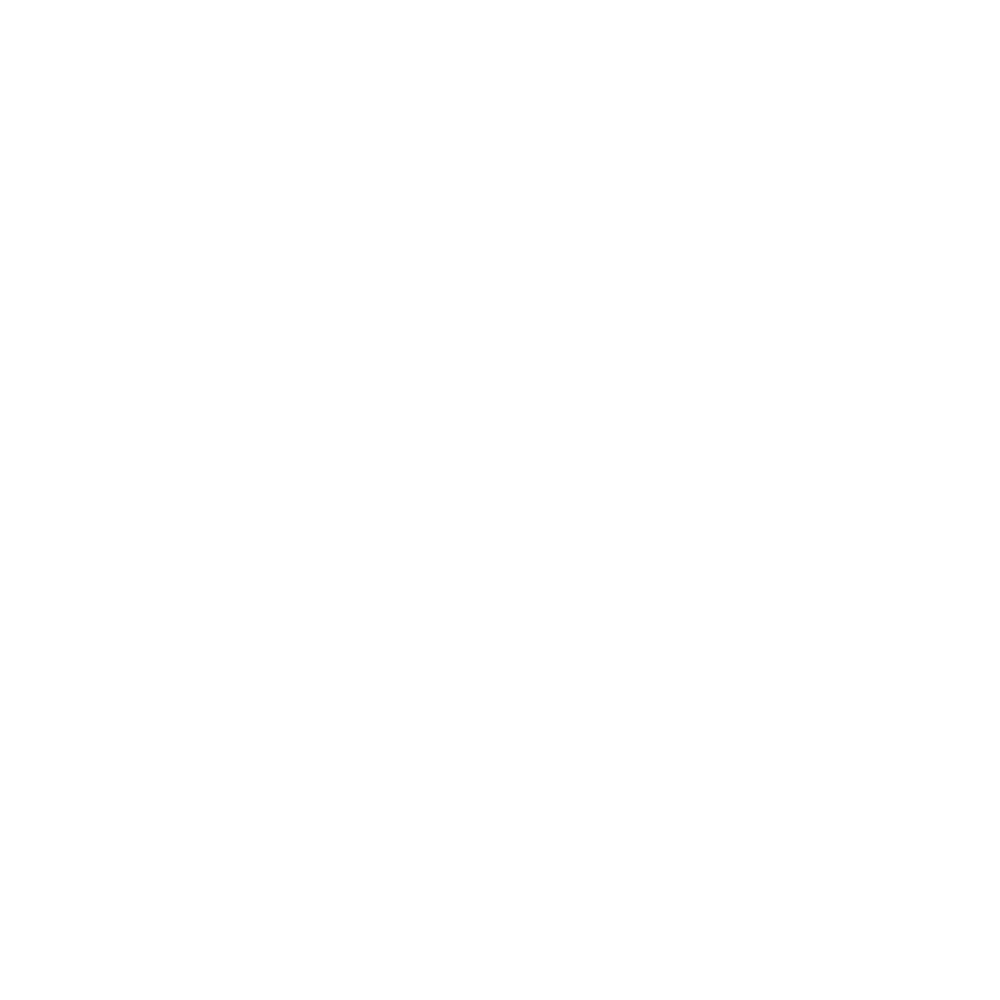

<IPython.core.display.Javascript object>


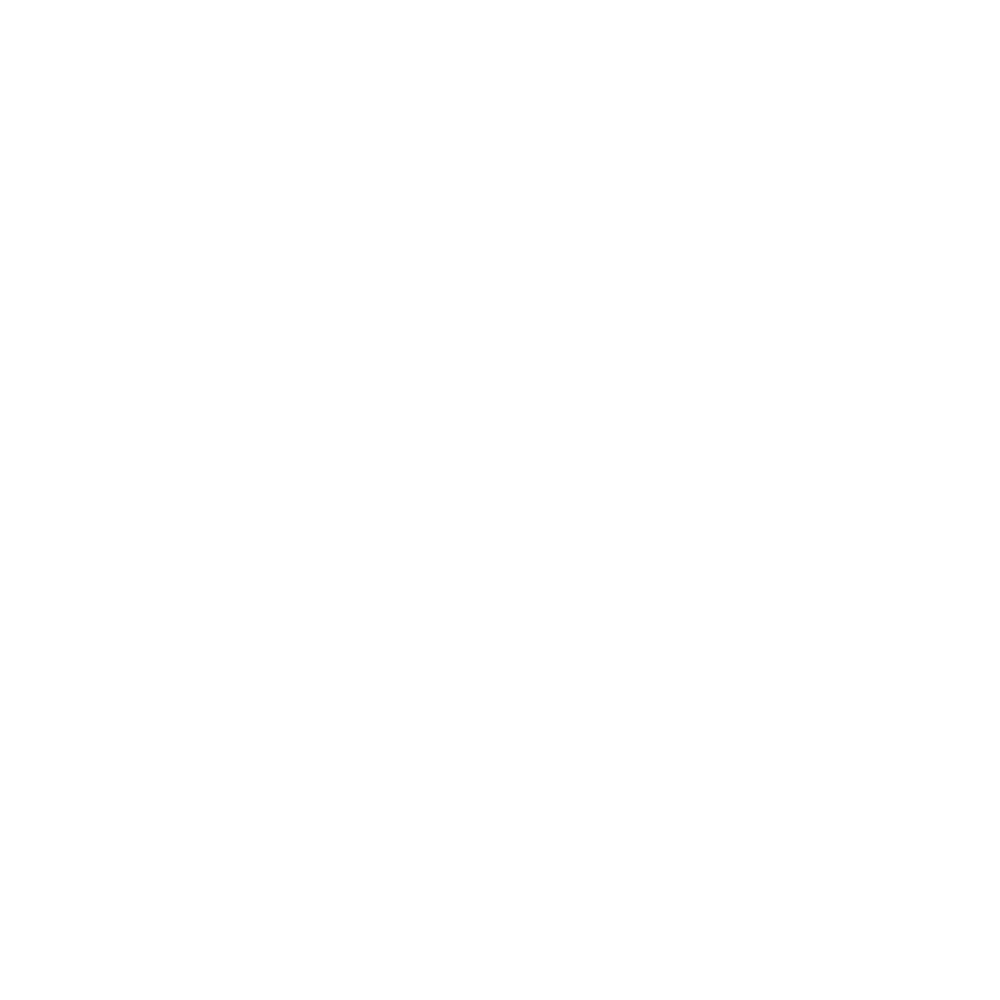

<IPython.core.display.Javascript object>


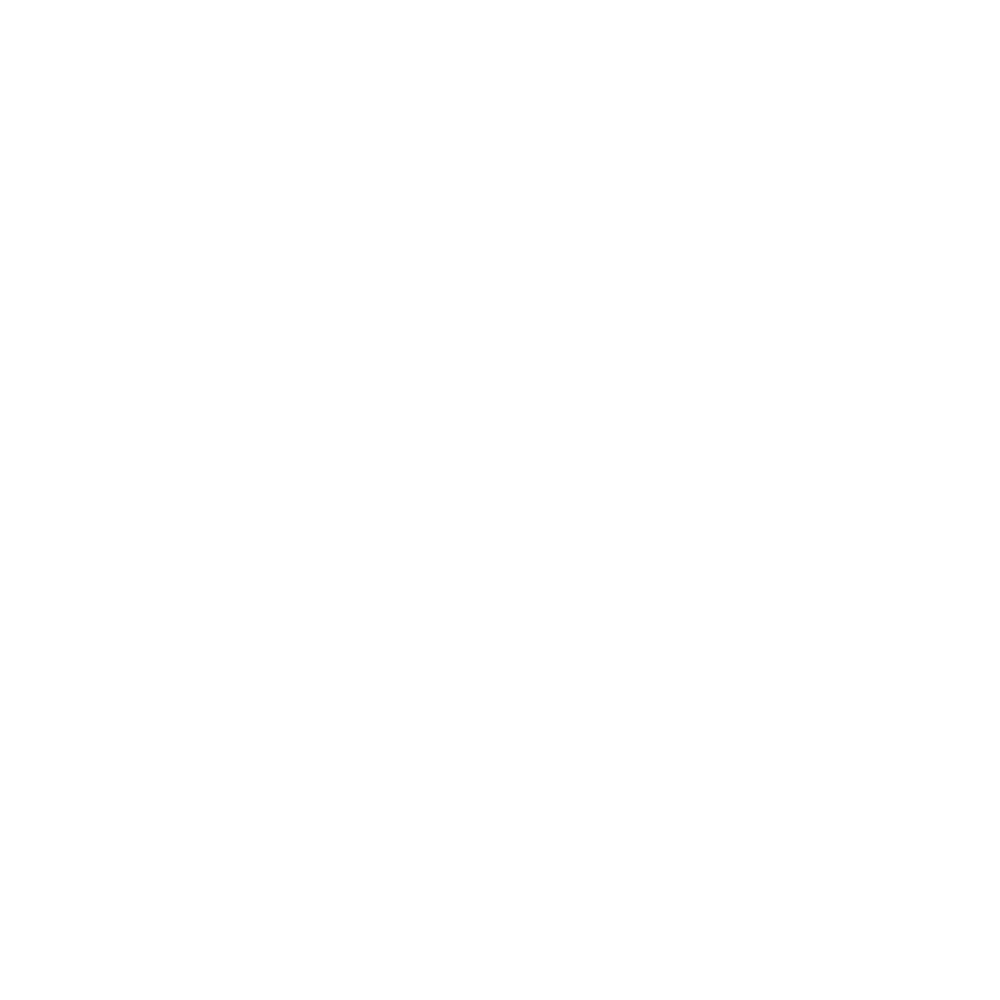

<IPython.core.display.Javascript object>


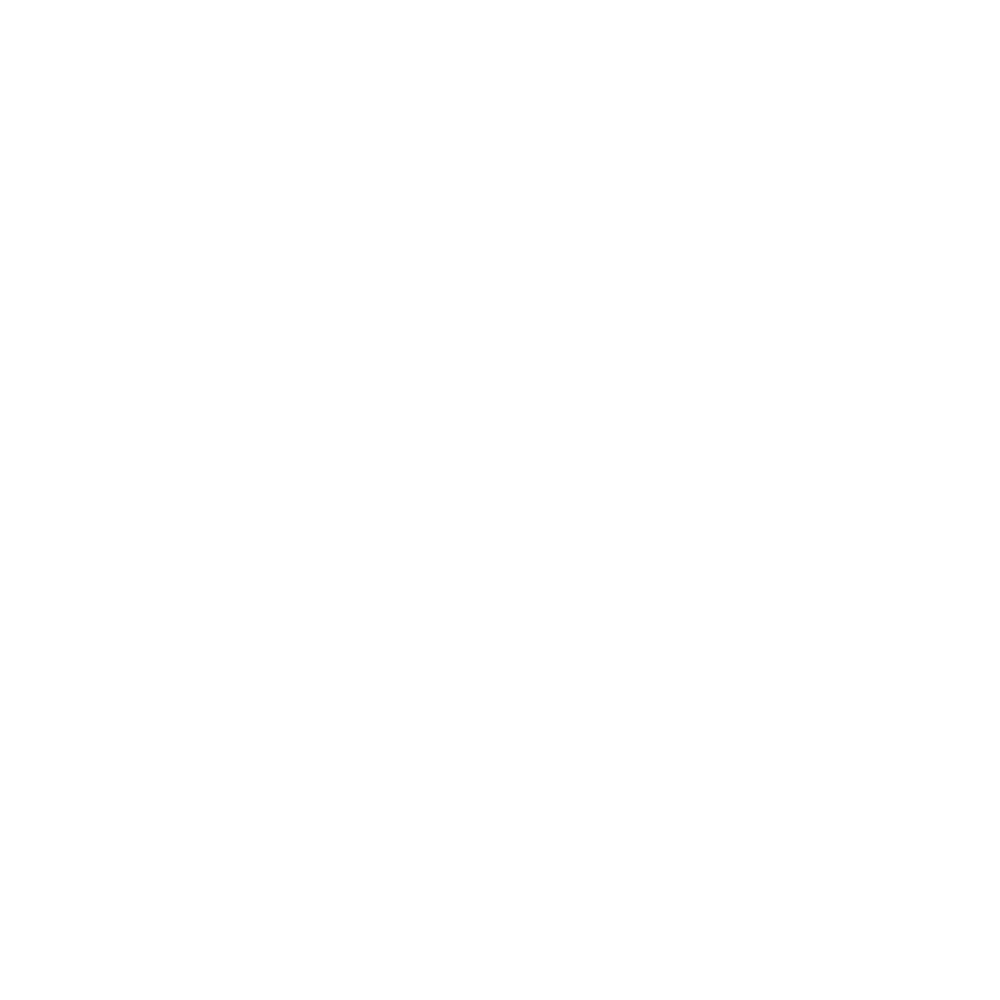

<IPython.core.display.Javascript object>


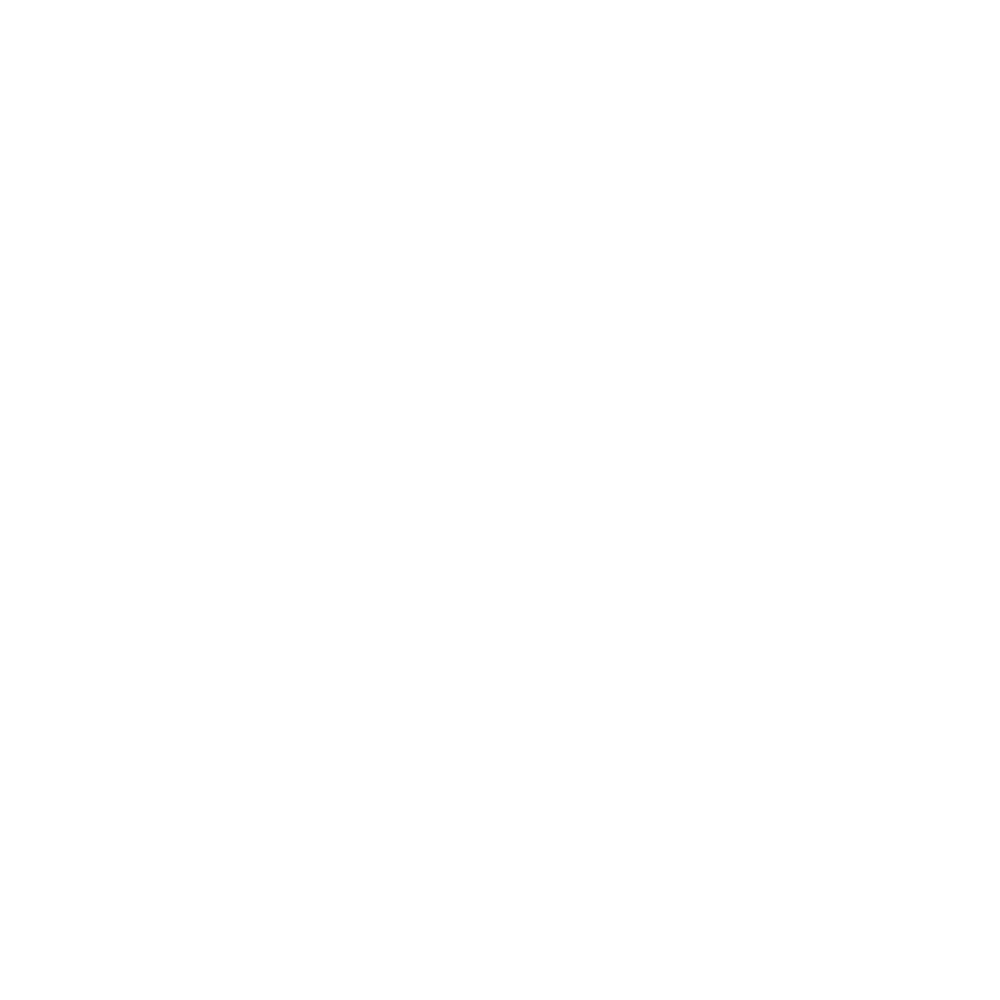

<IPython.core.display.Javascript object>


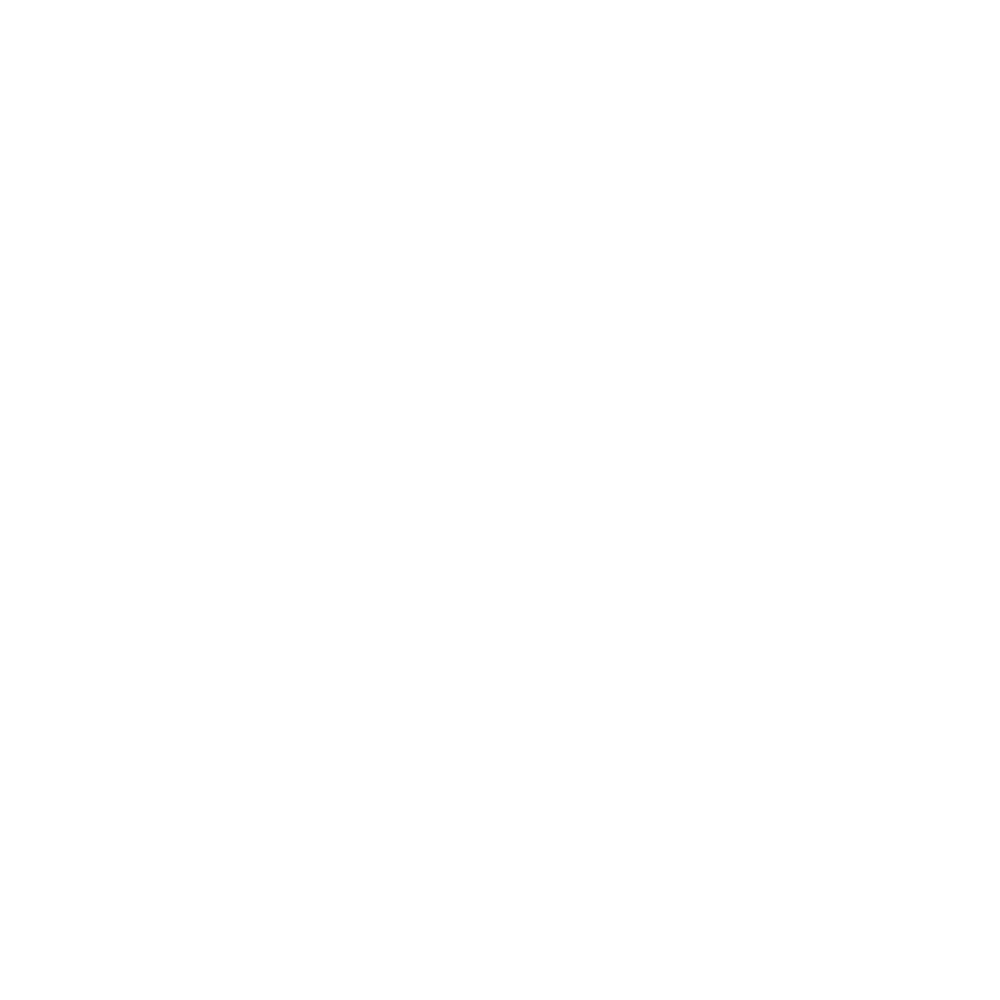

<IPython.core.display.Javascript object>


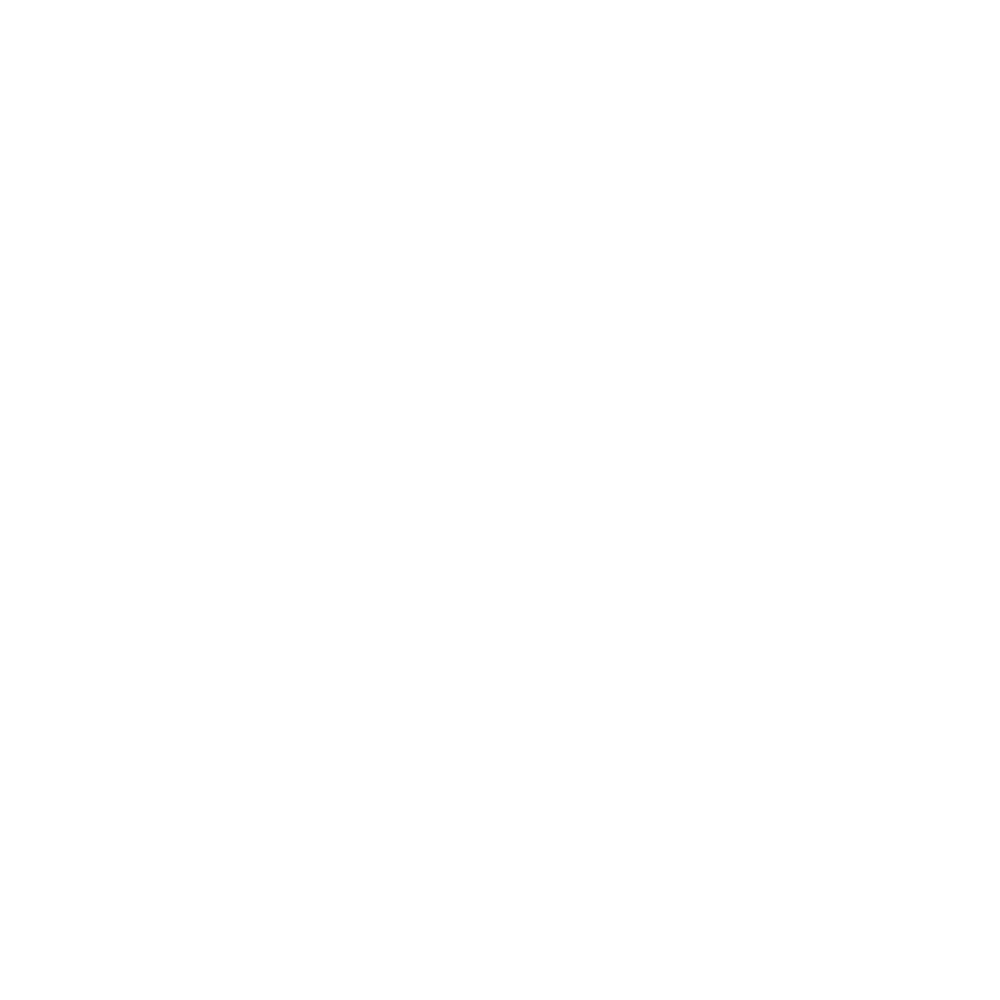

<IPython.core.display.Javascript object>


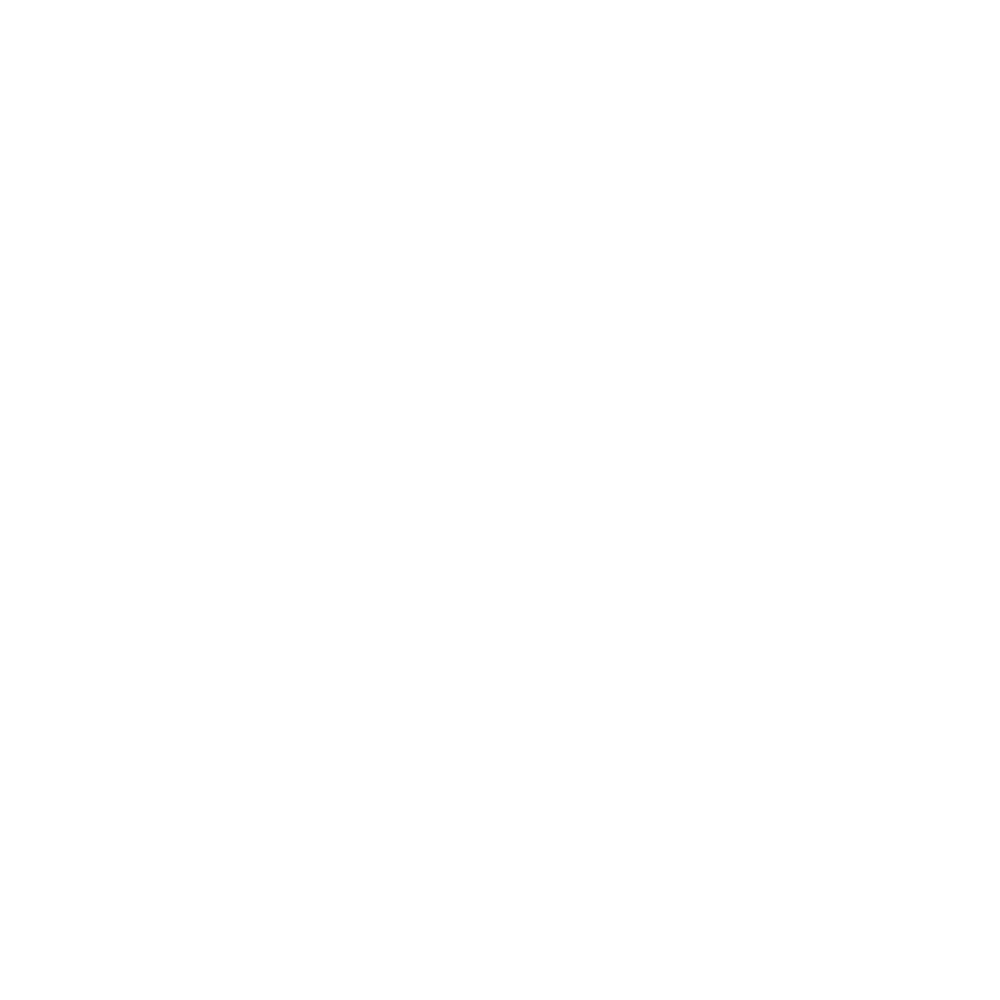

<IPython.core.display.Javascript object>


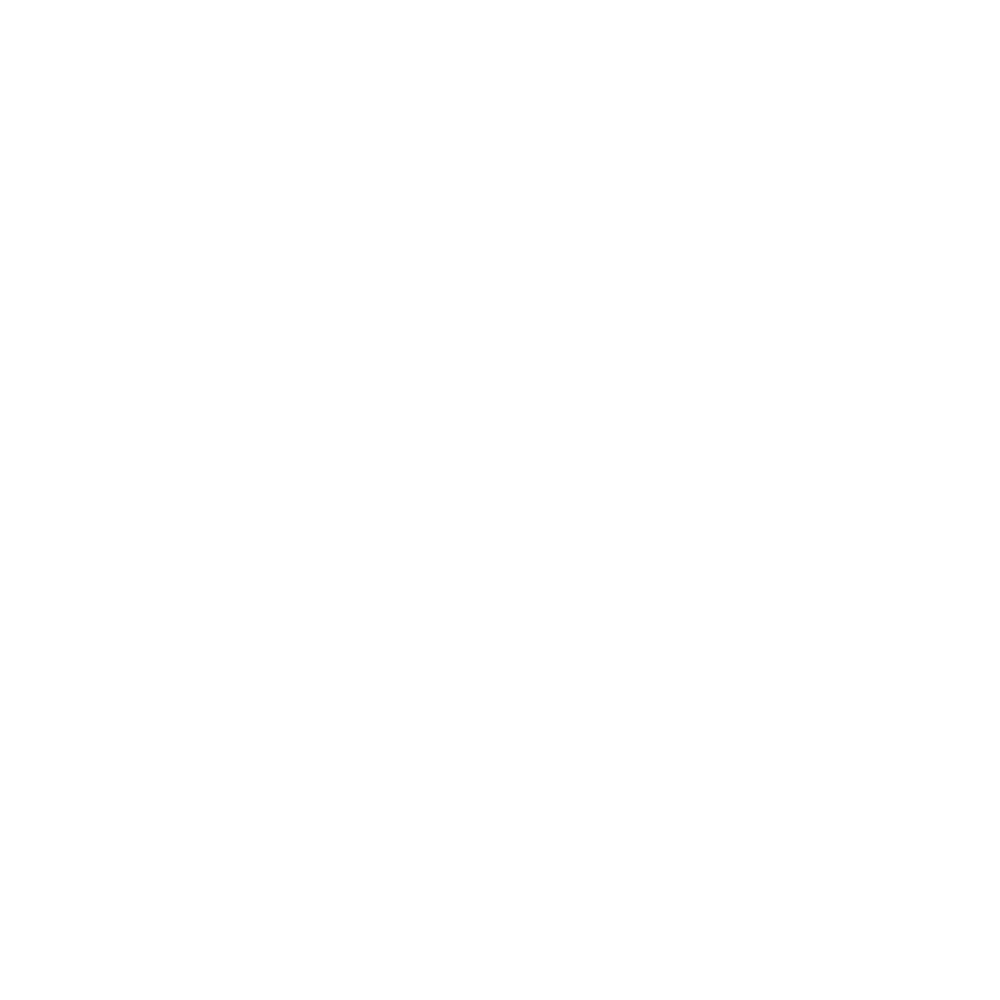

<IPython.core.display.Javascript object>


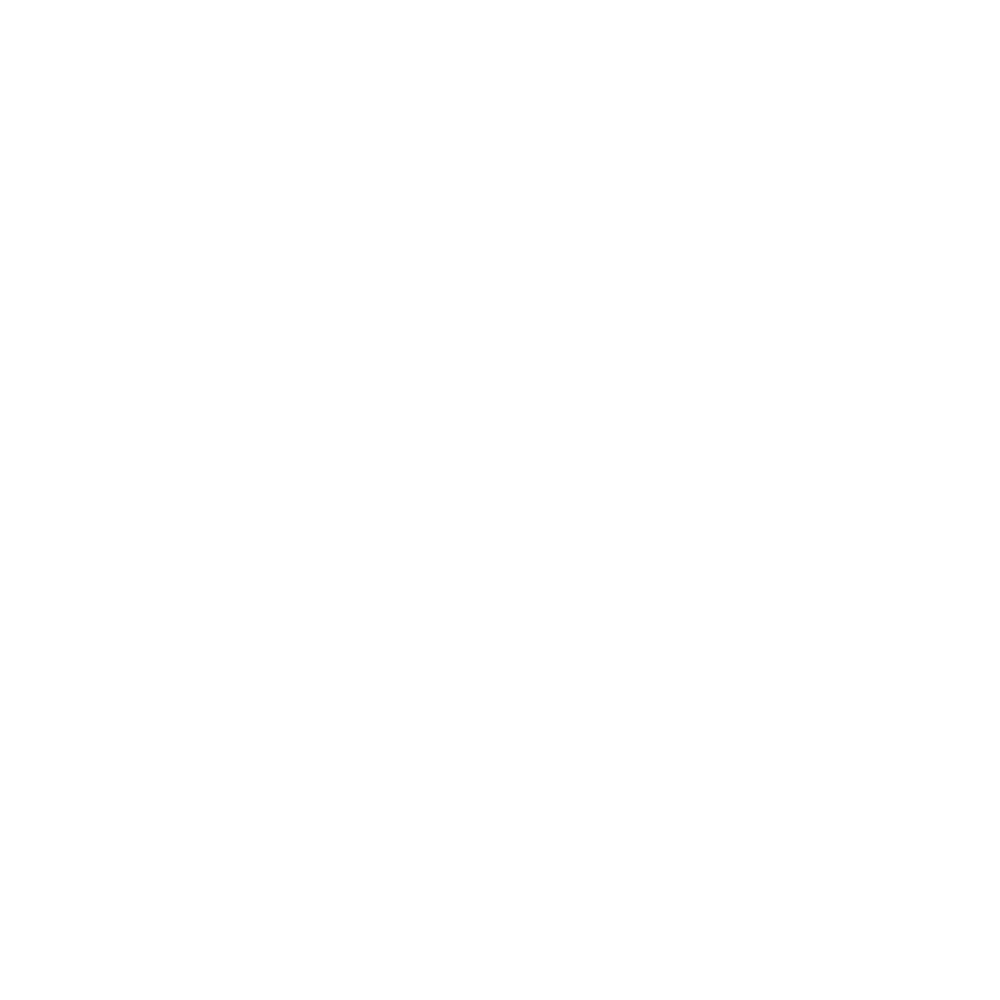

<IPython.core.display.Javascript object>


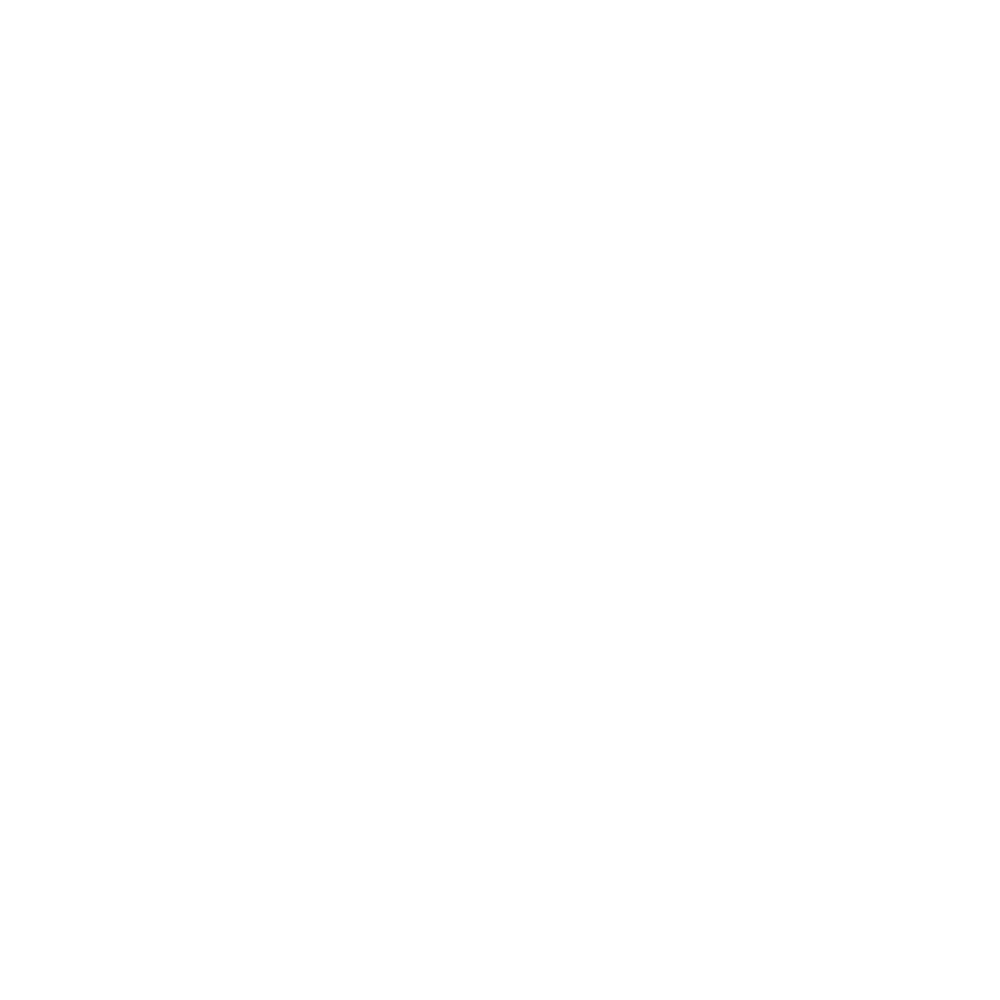

<IPython.core.display.Javascript object>


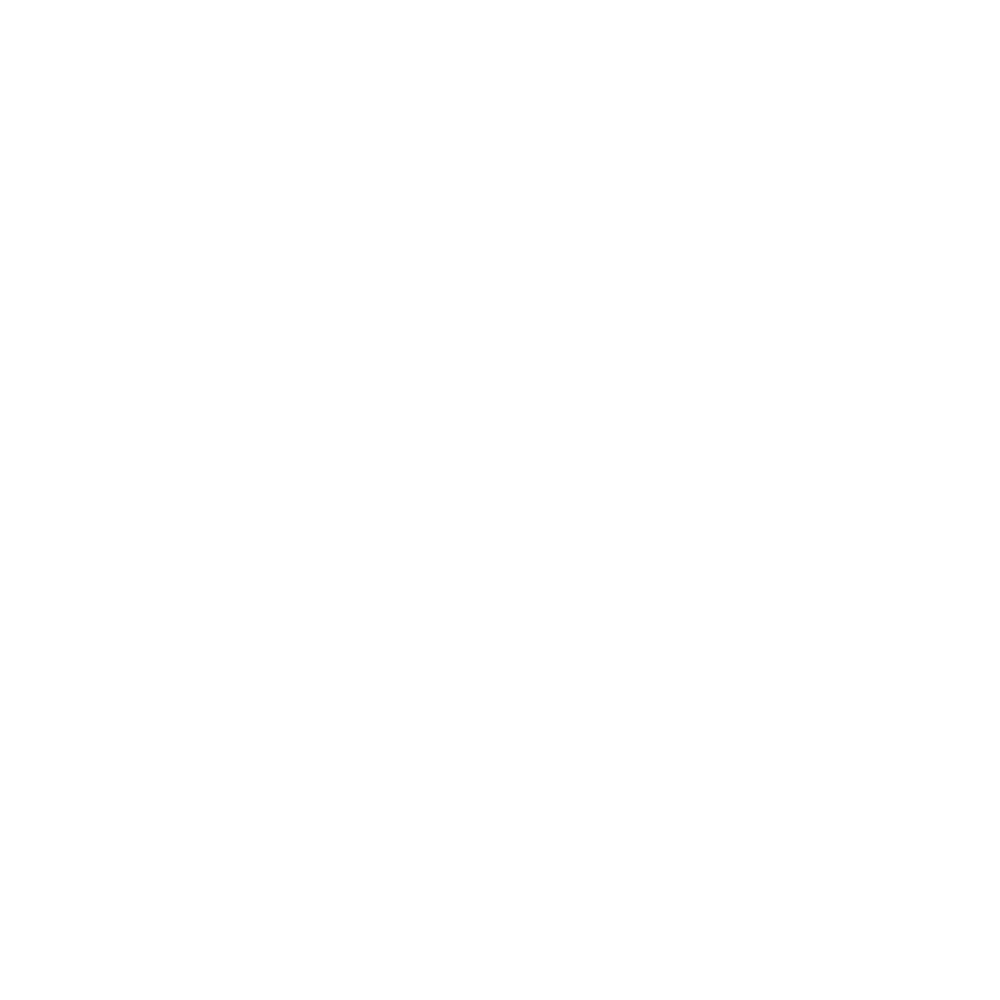

<IPython.core.display.Javascript object>


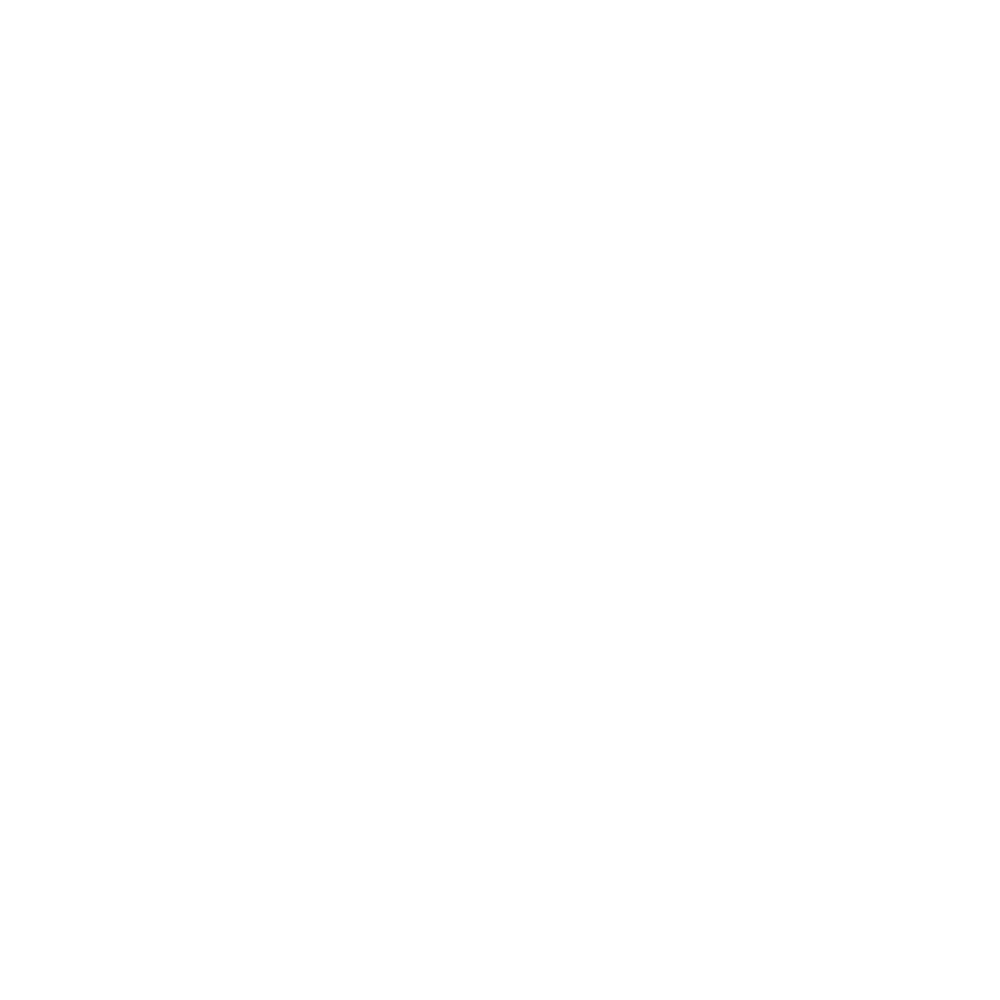

<IPython.core.display.Javascript object>


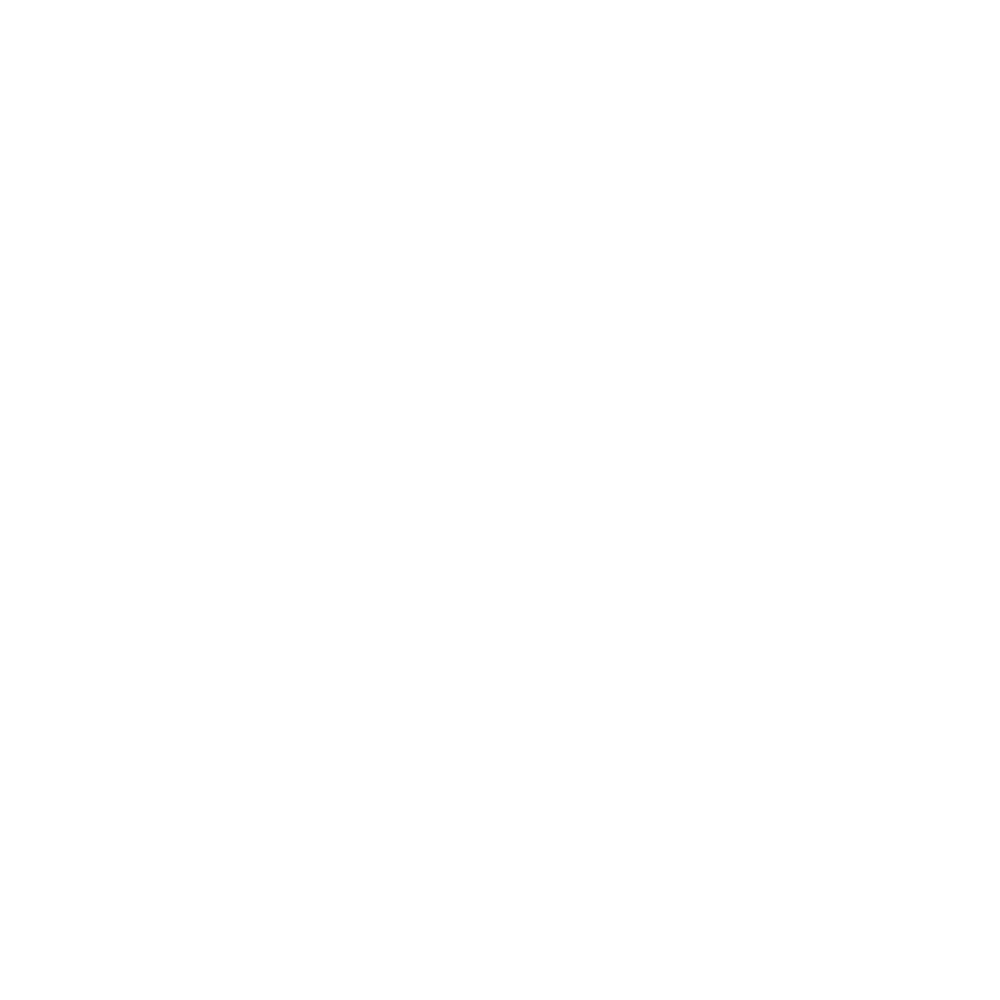

<IPython.core.display.Javascript object>


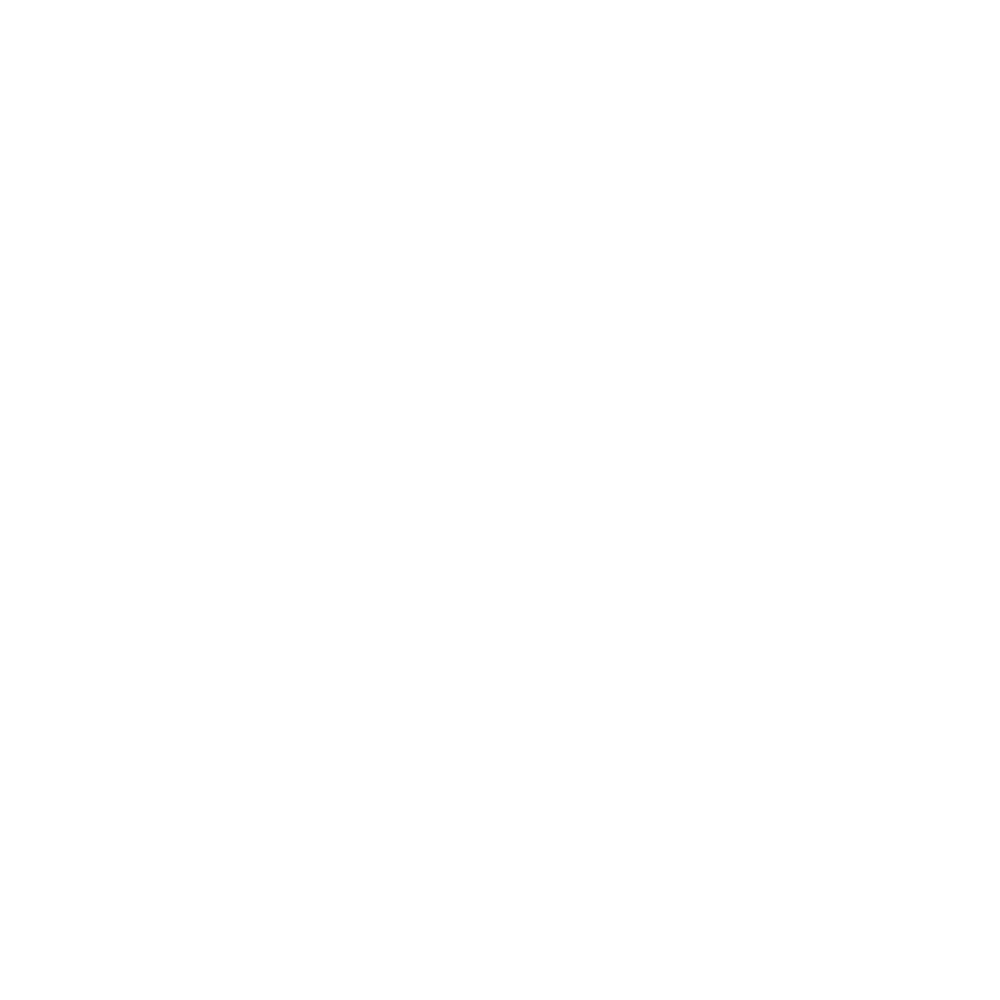

<IPython.core.display.Javascript object>


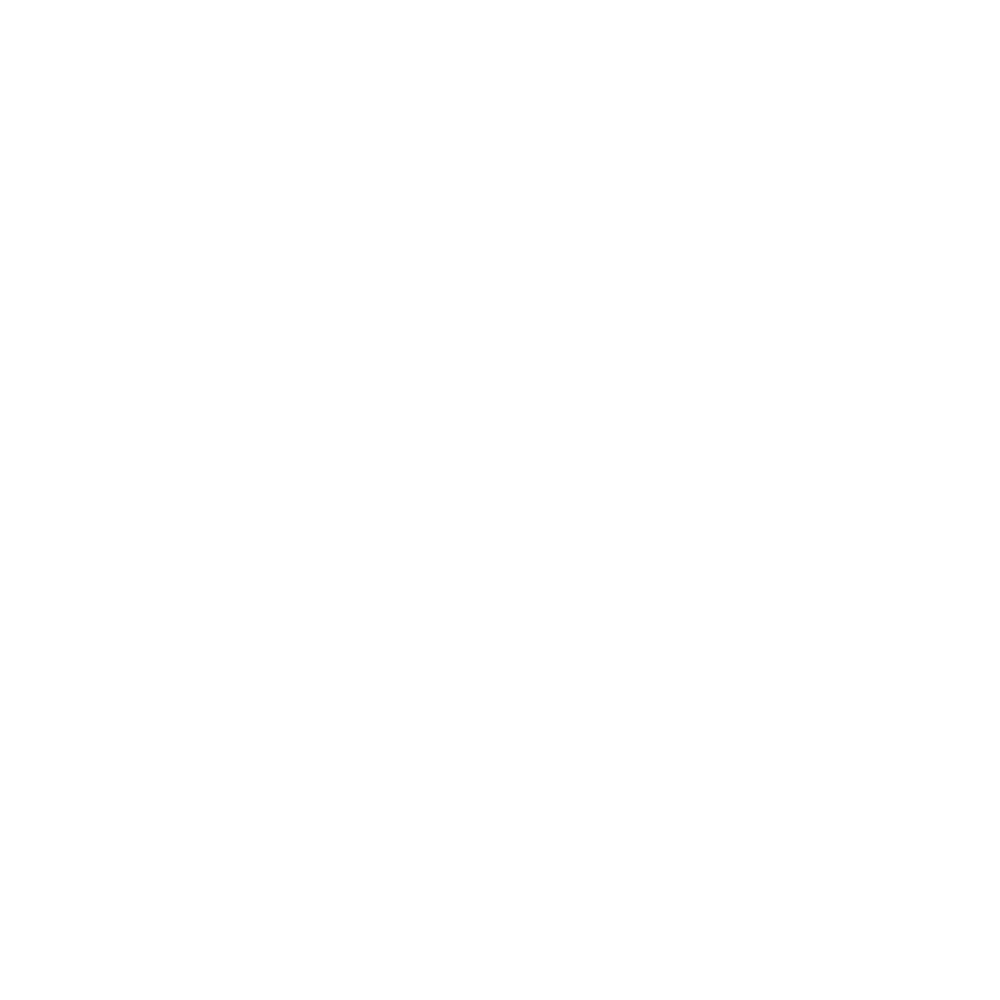

<IPython.core.display.Javascript object>


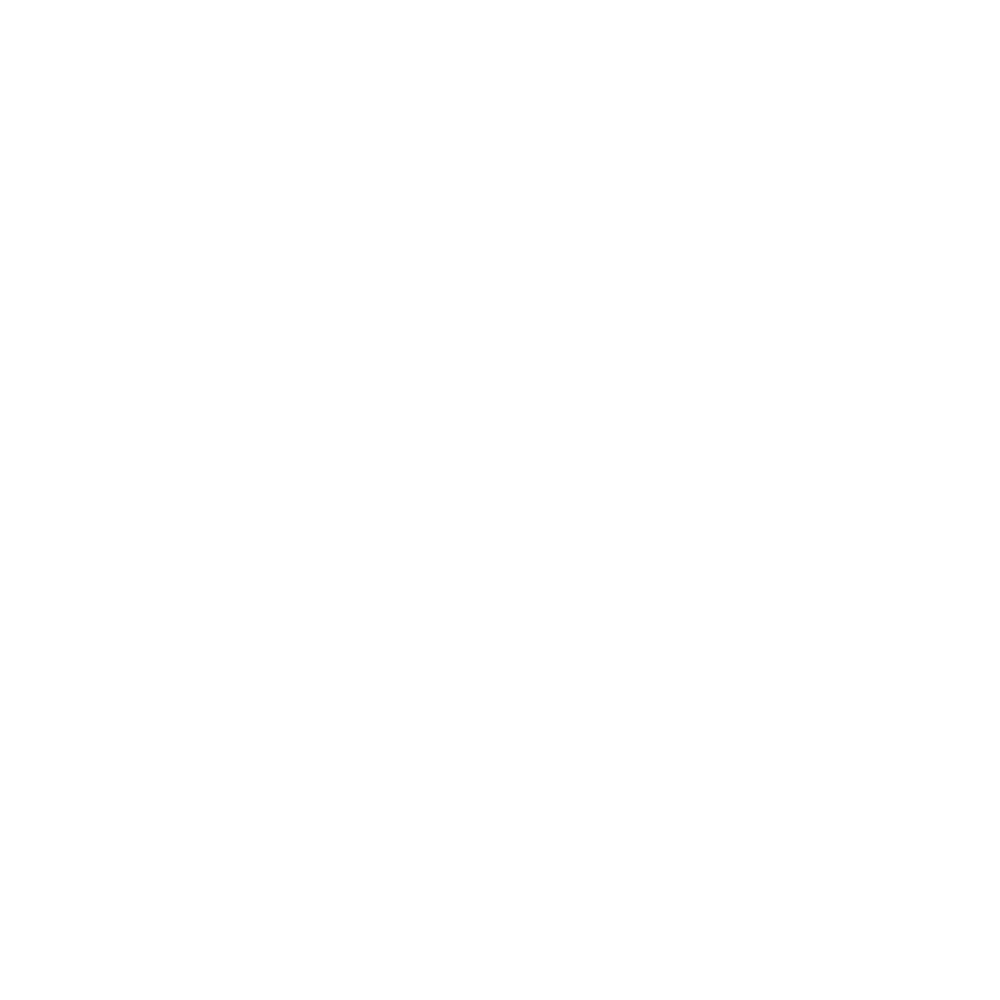

<IPython.core.display.Javascript object>


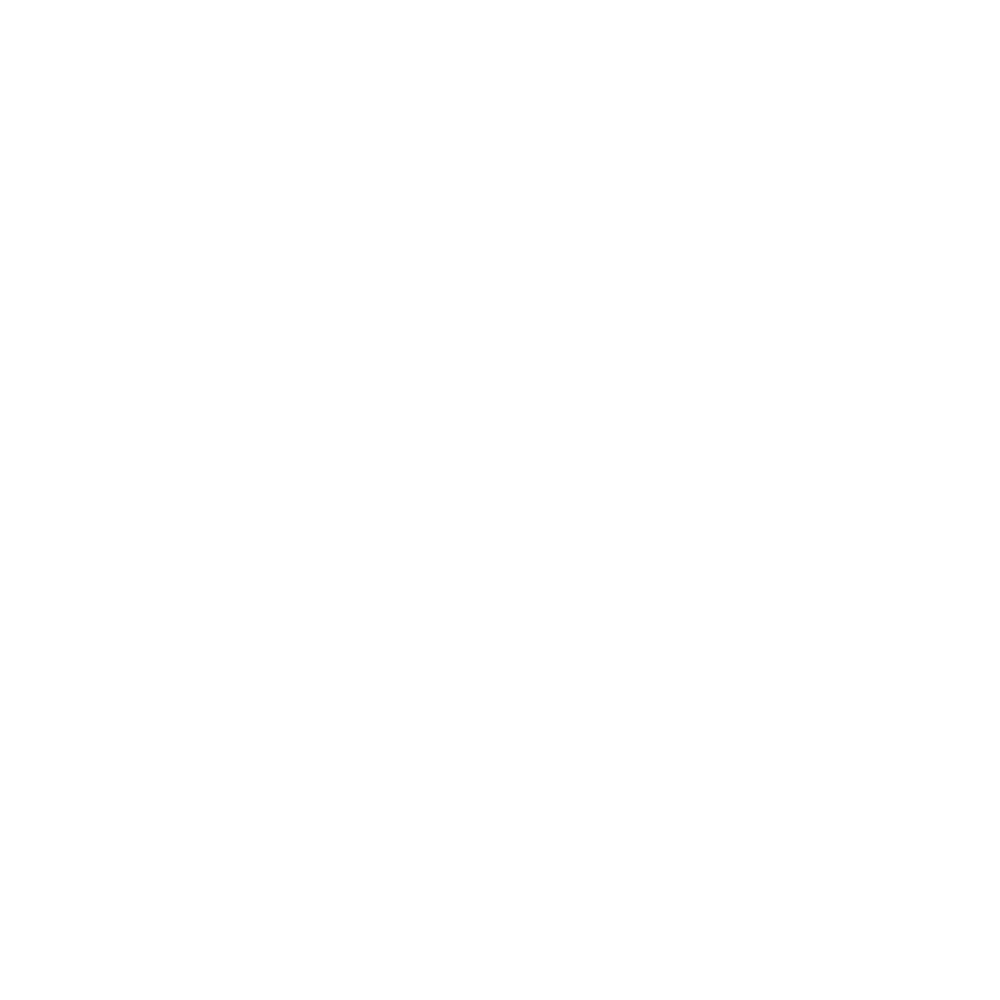

<IPython.core.display.Javascript object>


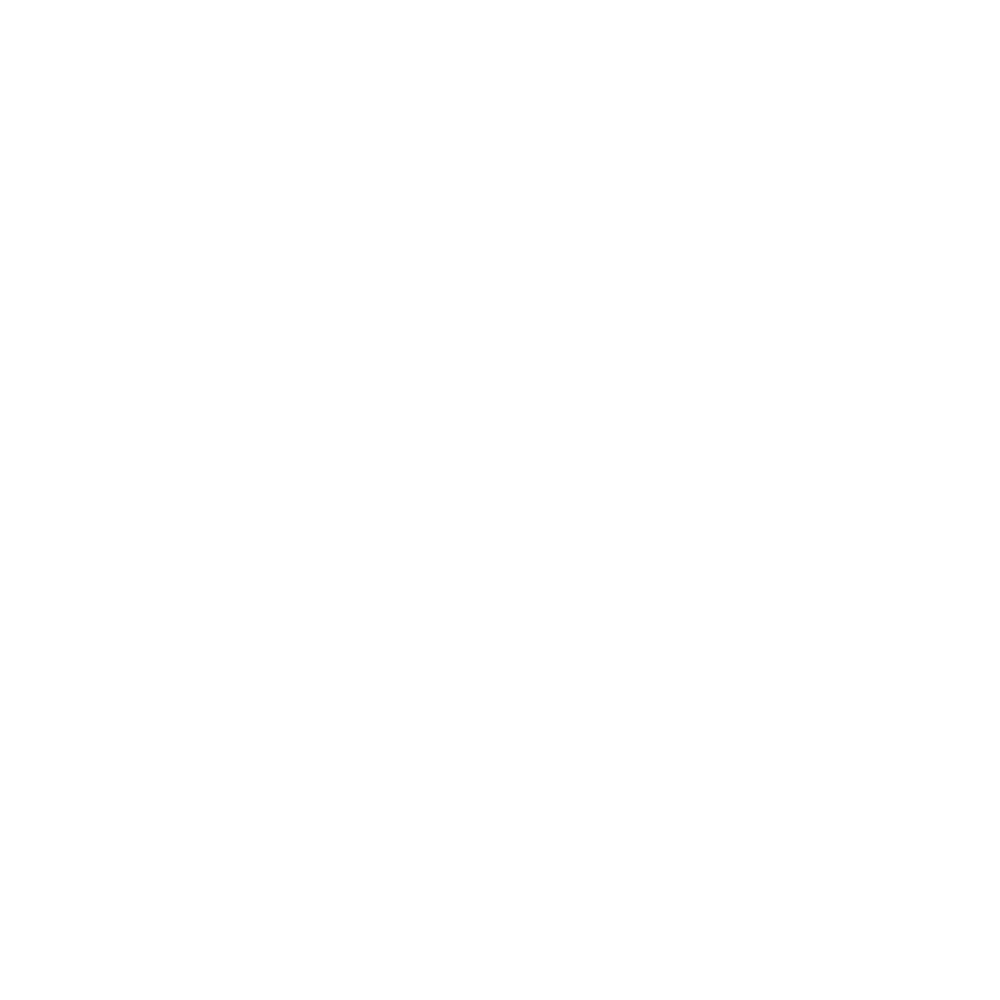

<IPython.core.display.Javascript object>


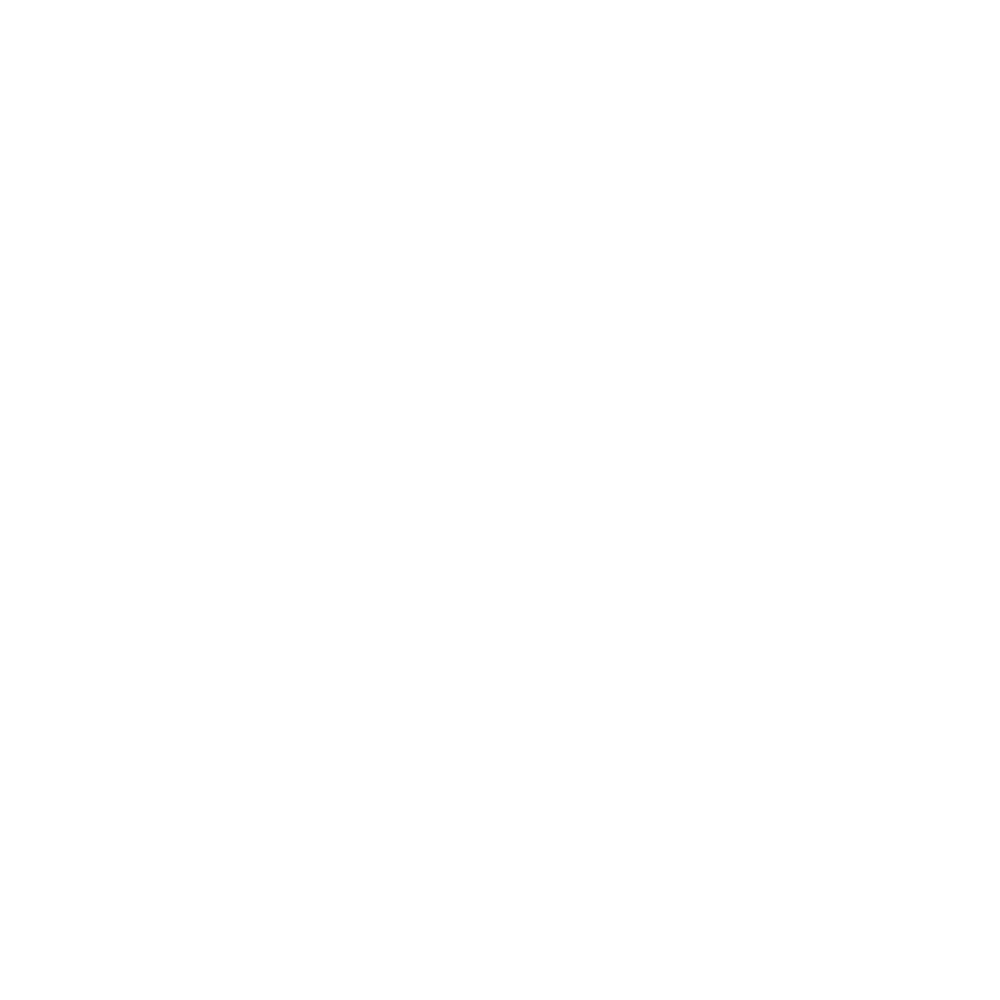

<IPython.core.display.Javascript object>


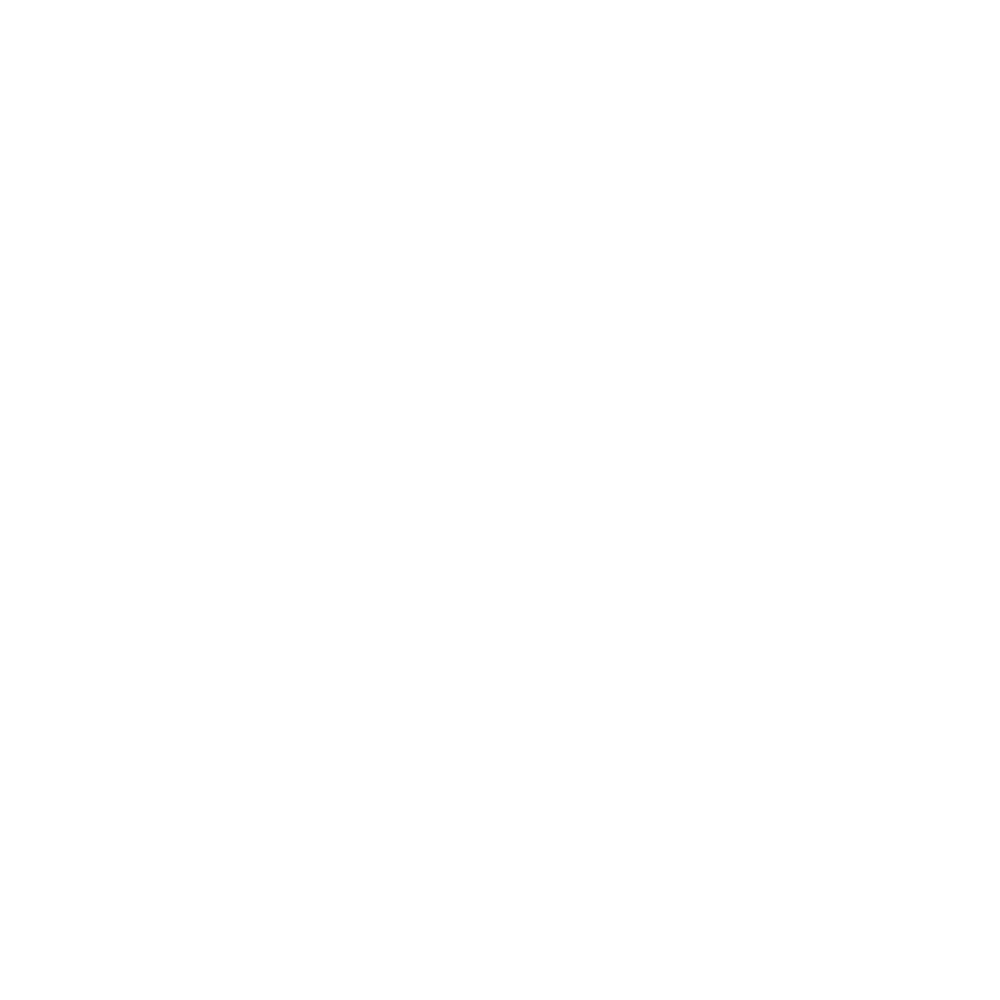

<IPython.core.display.Javascript object>


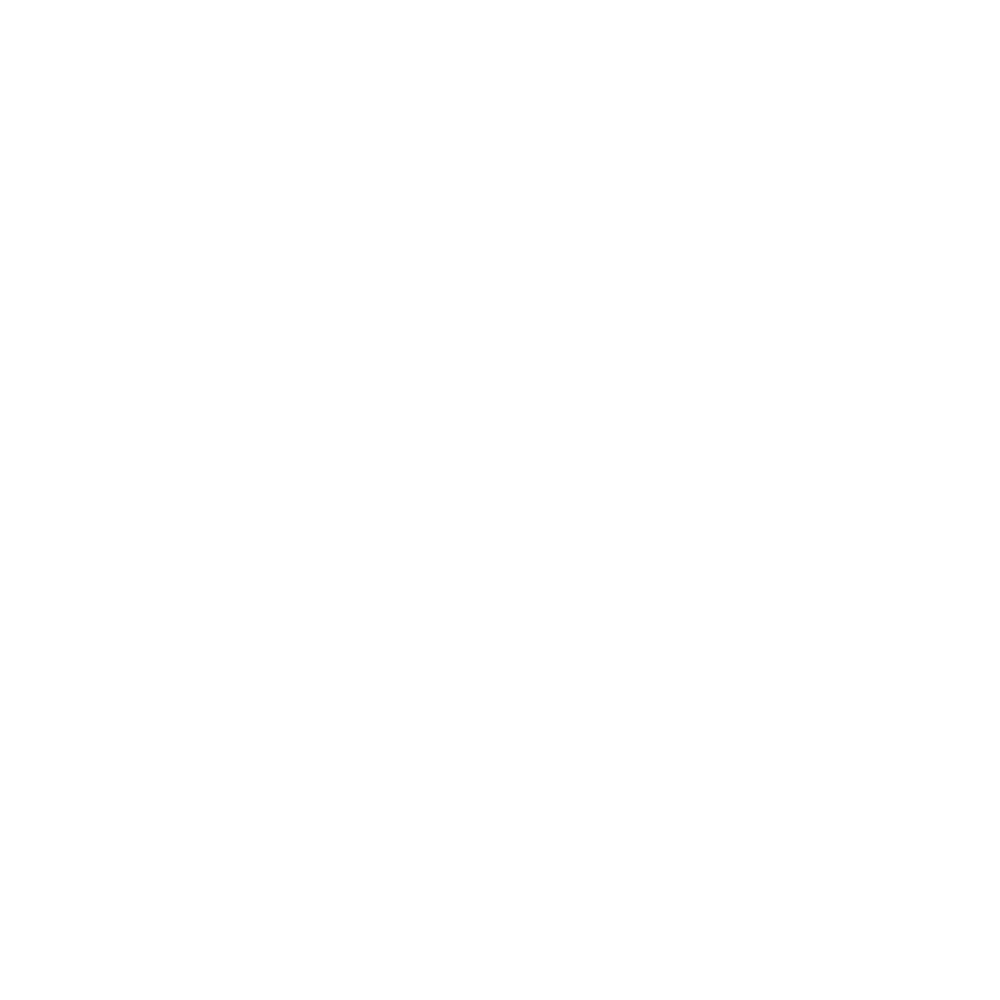

<IPython.core.display.Javascript object>


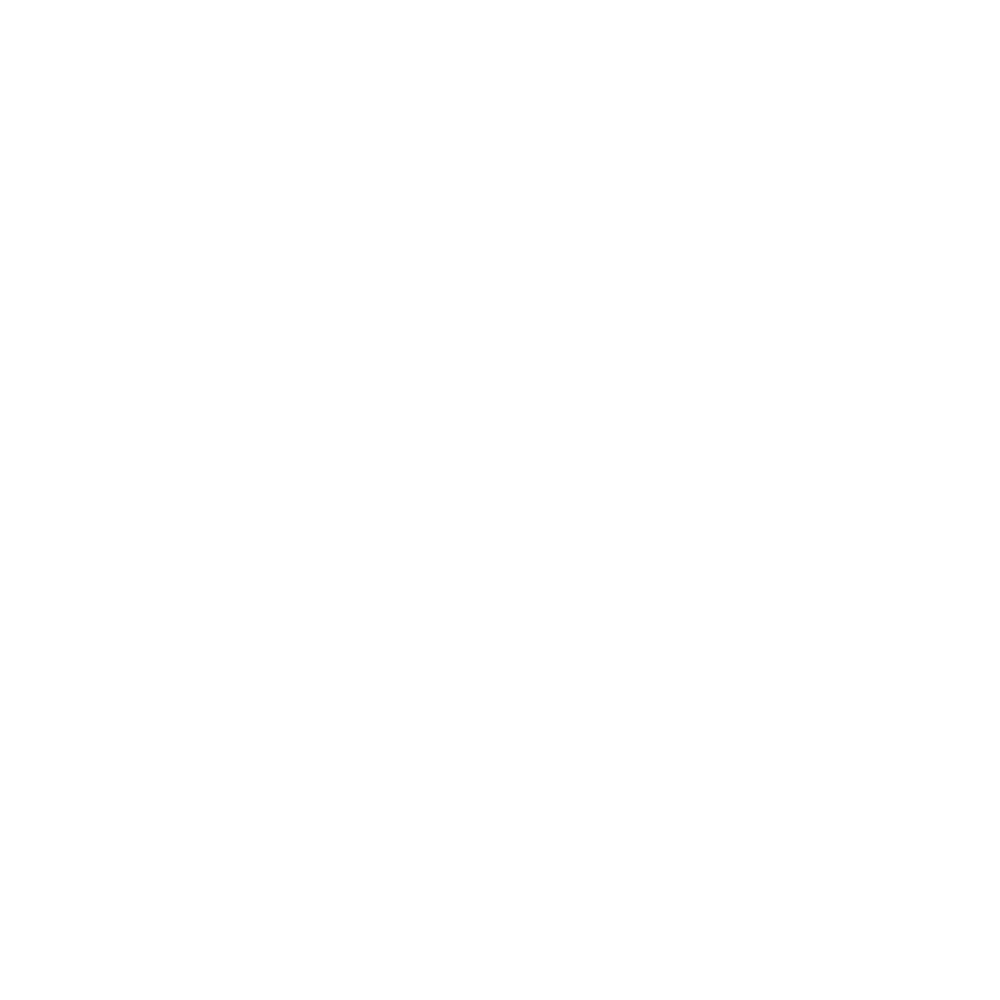

<IPython.core.display.Javascript object>


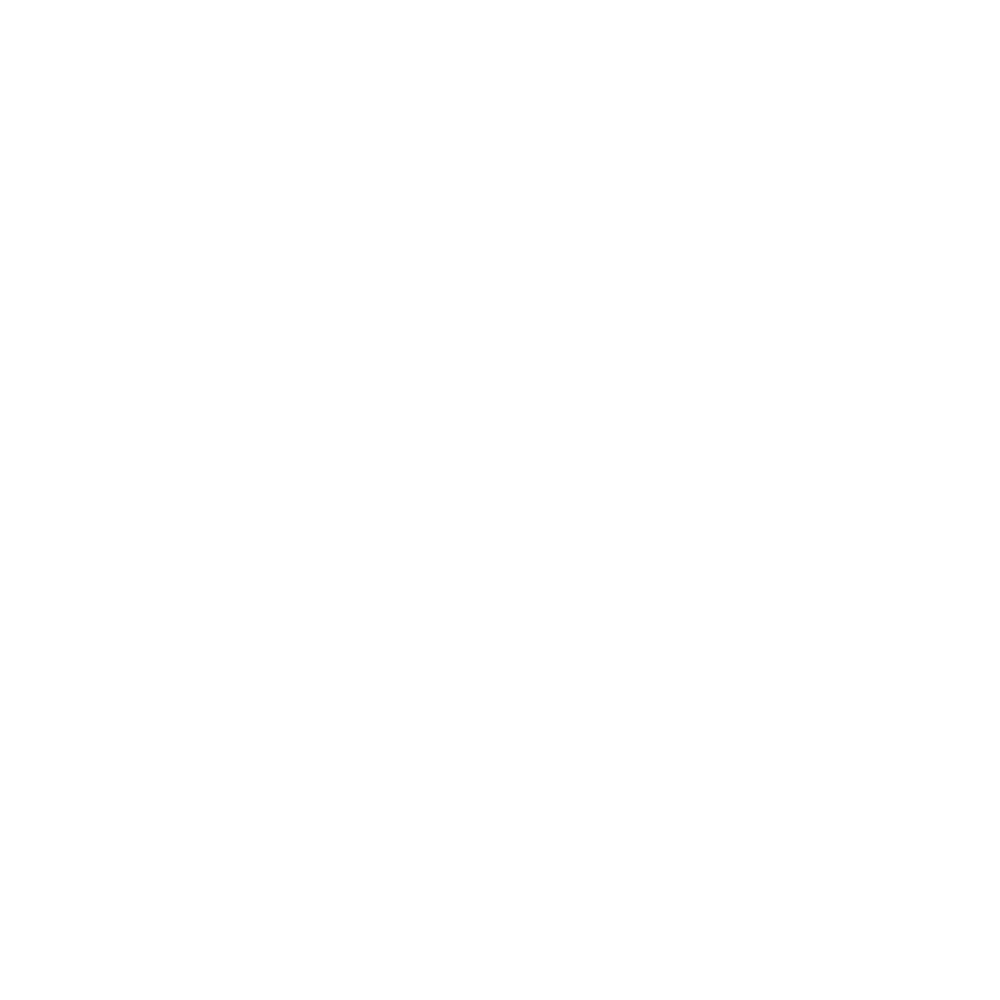

<IPython.core.display.Javascript object>


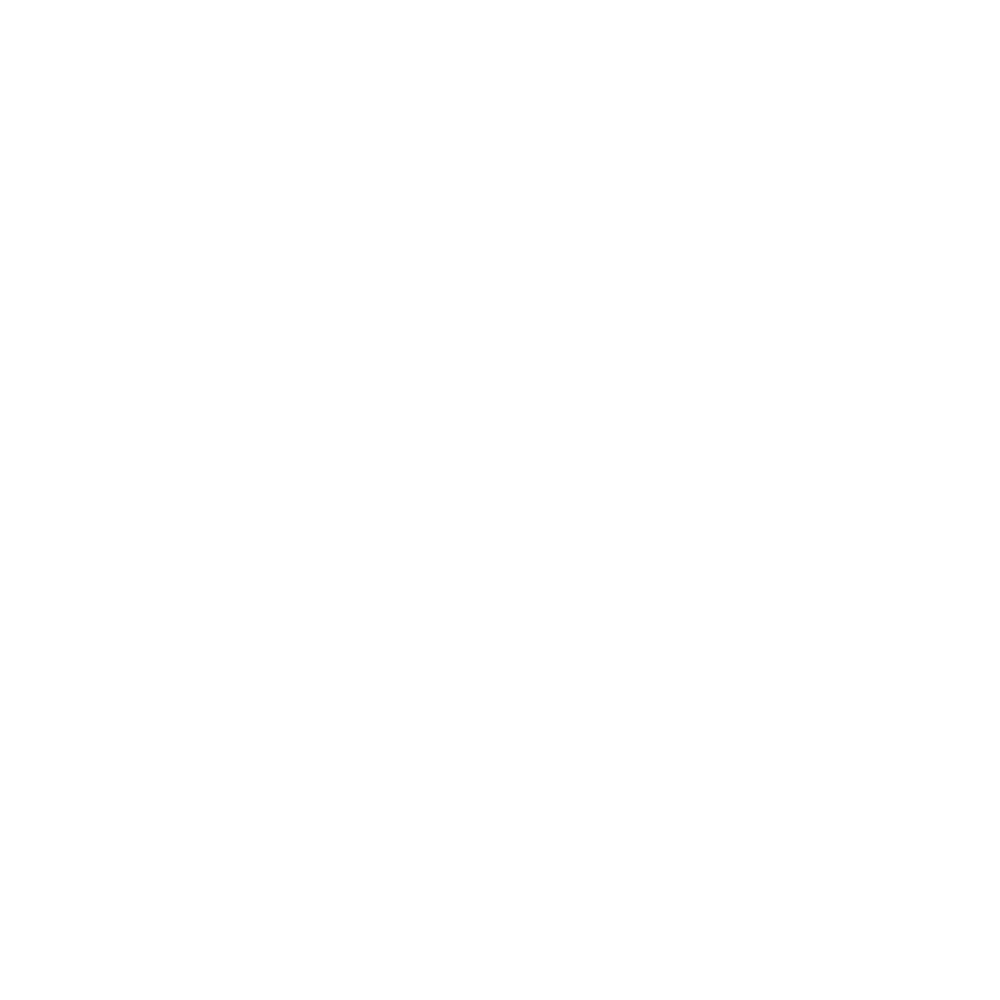

<IPython.core.display.Javascript object>


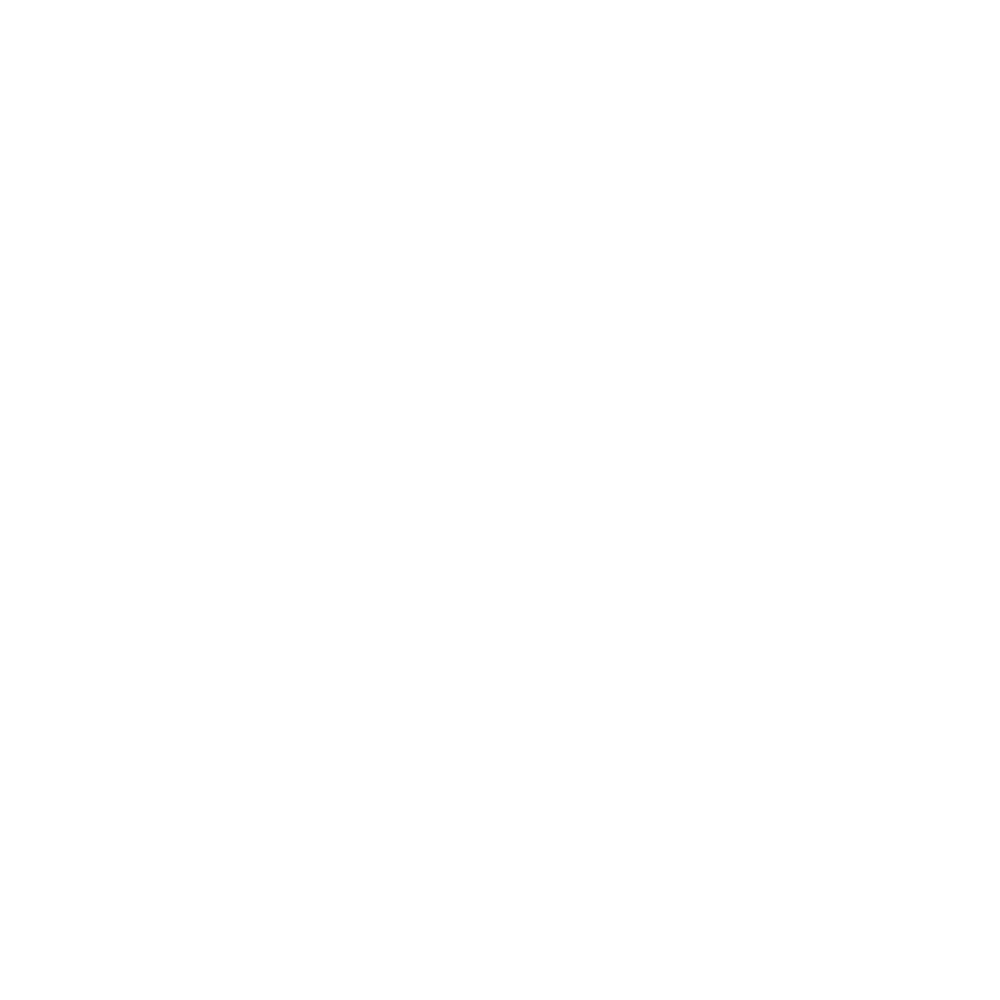

<IPython.core.display.Javascript object>


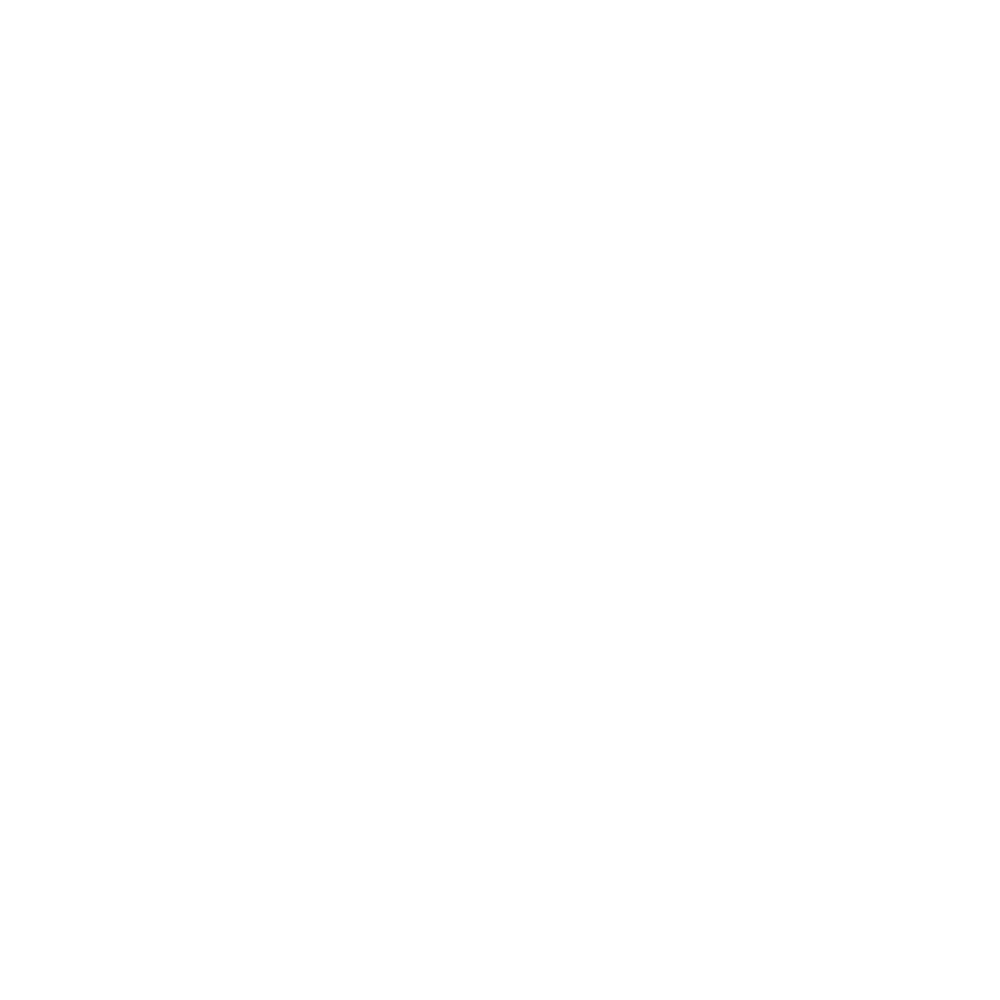

<IPython.core.display.Javascript object>


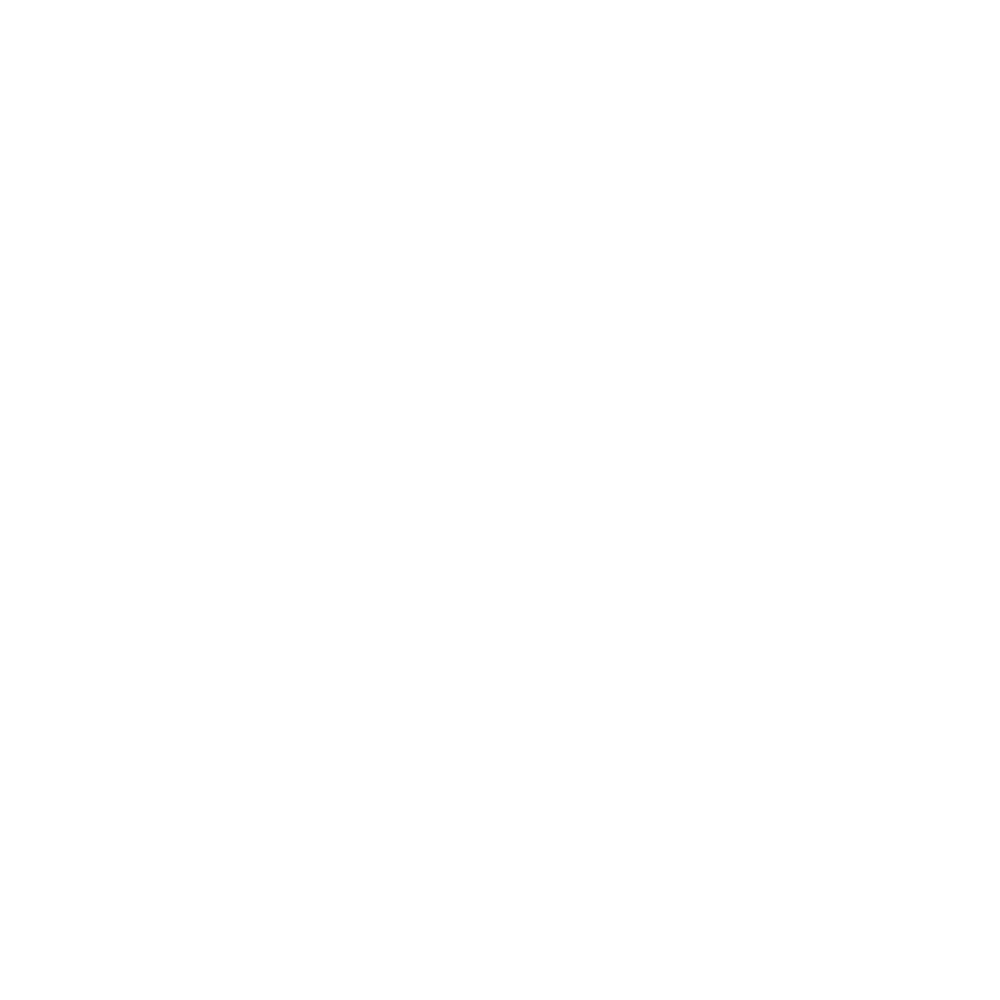

<IPython.core.display.Javascript object>


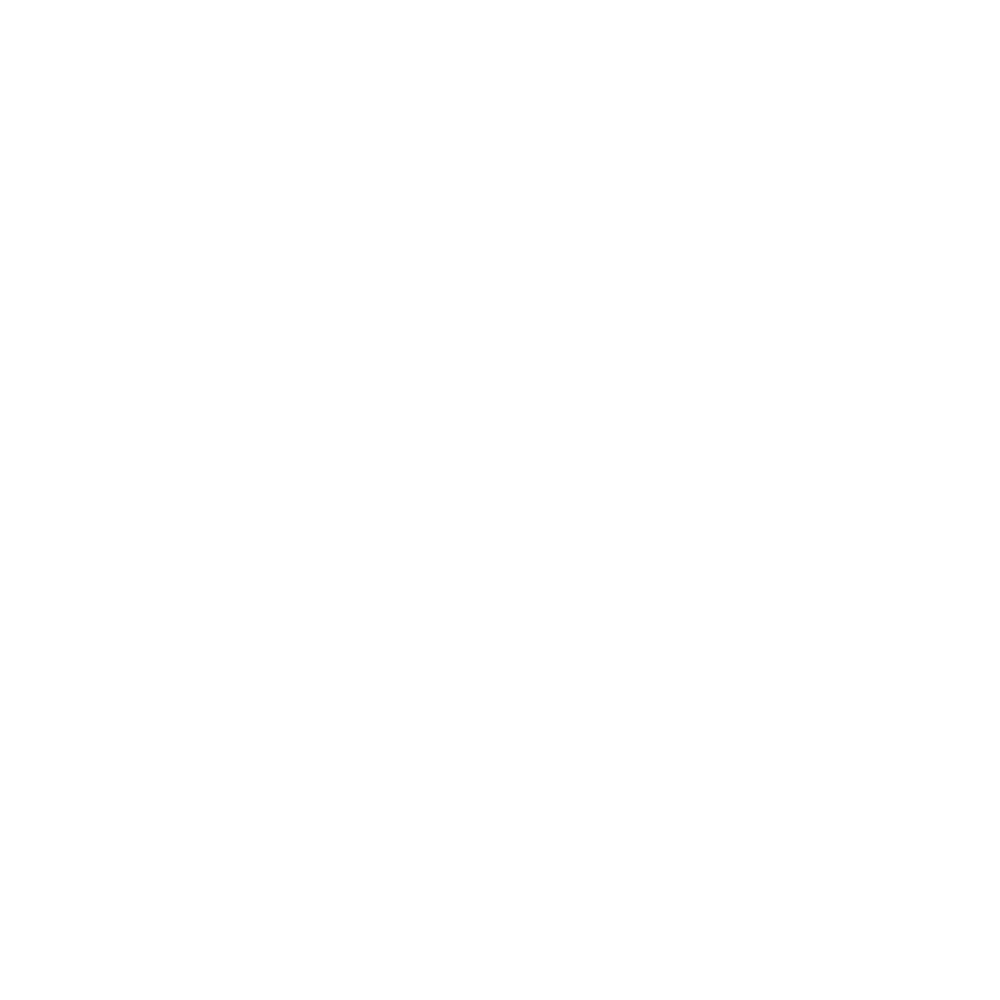

<IPython.core.display.Javascript object>


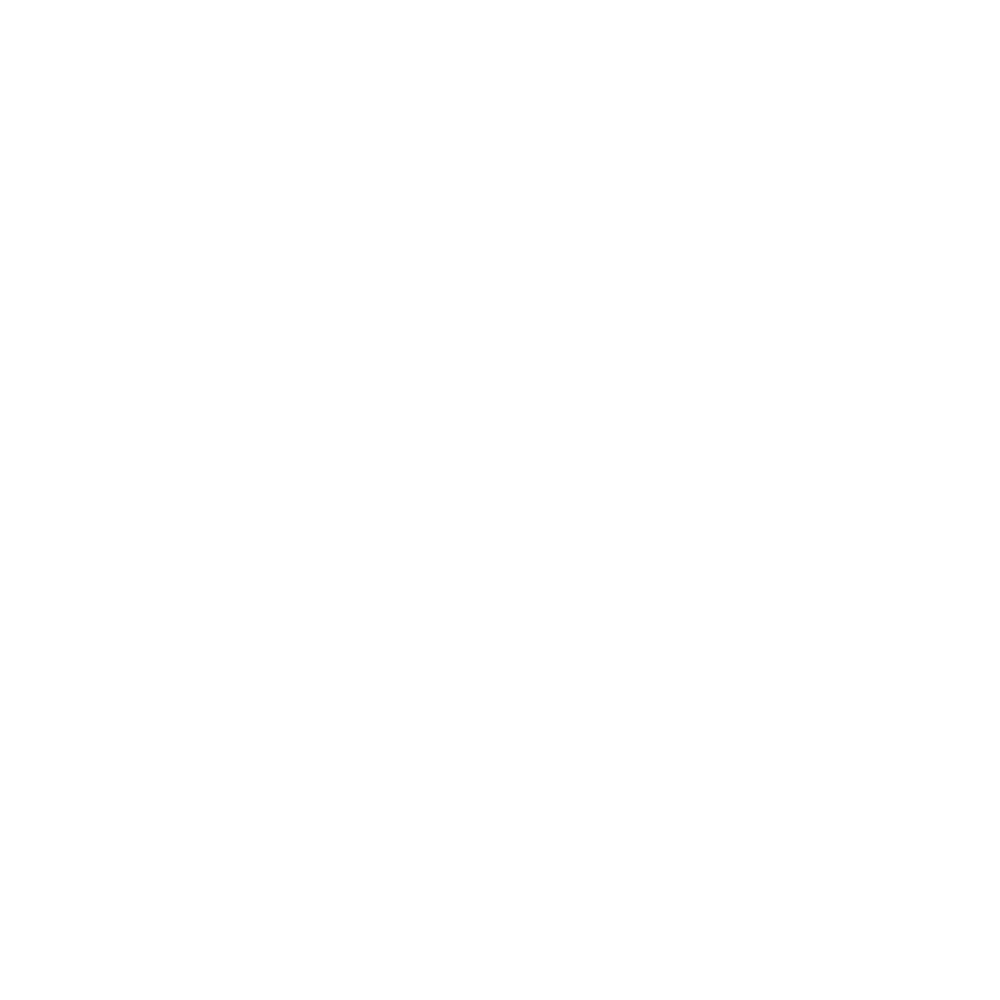

<IPython.core.display.Javascript object>


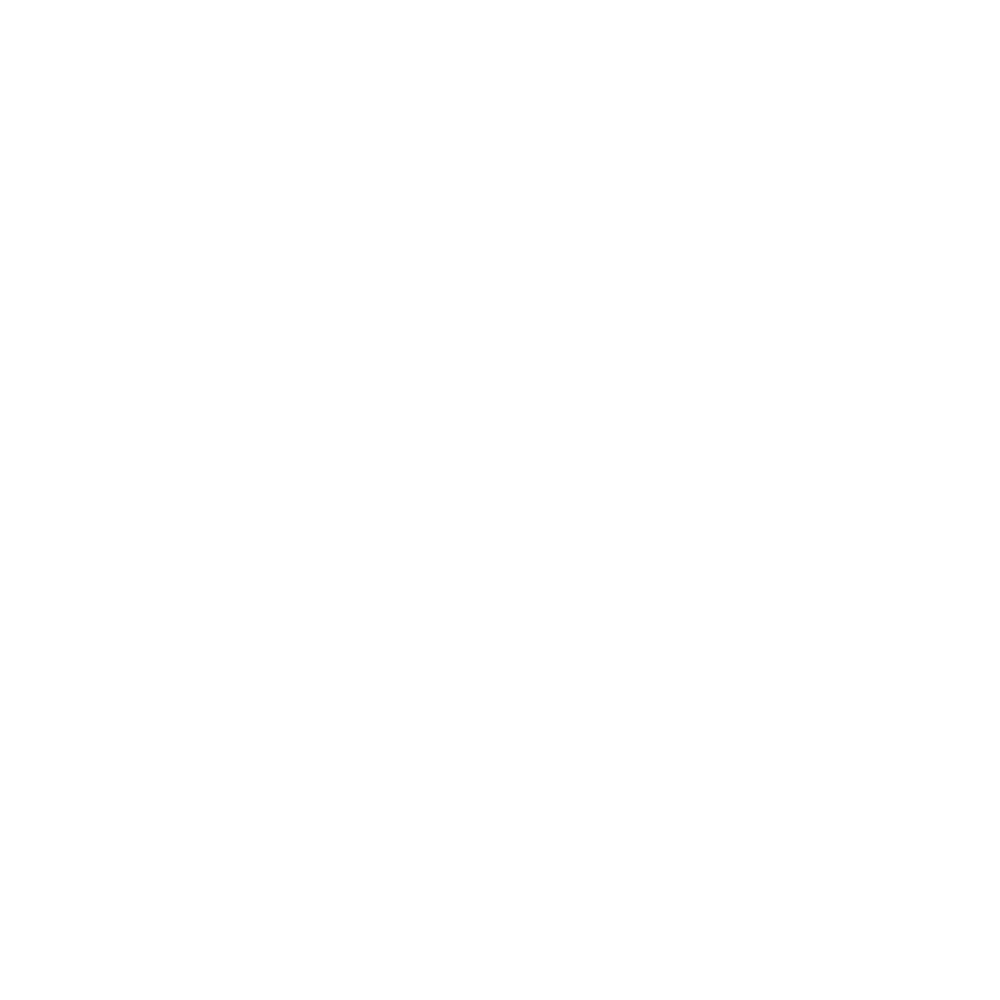

<IPython.core.display.Javascript object>


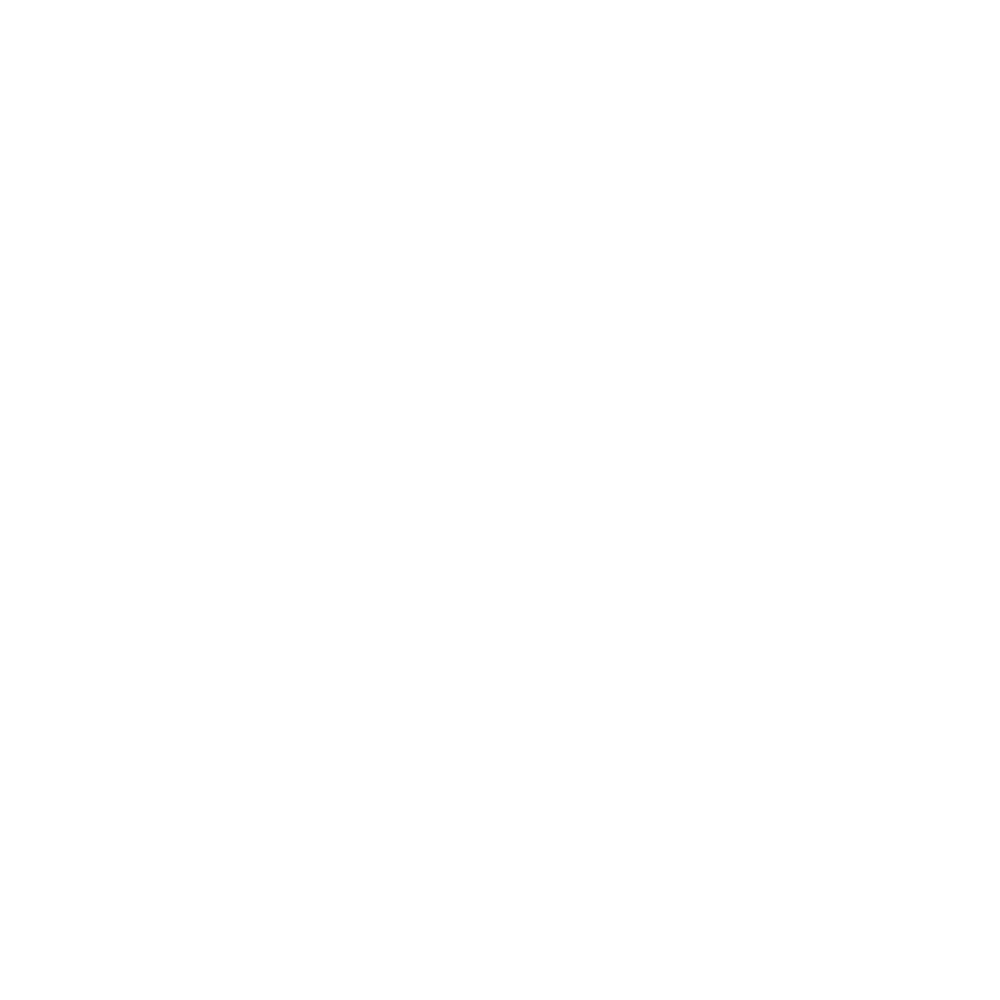

<IPython.core.display.Javascript object>


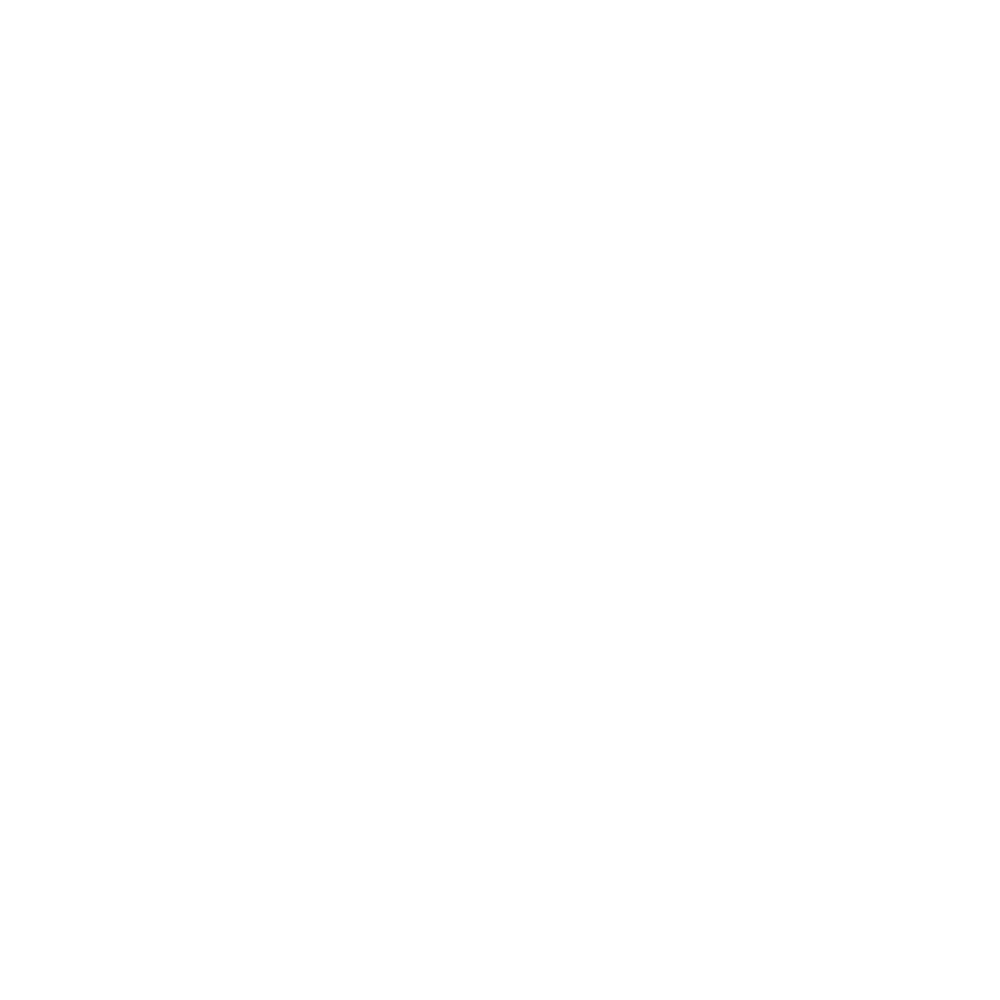

<IPython.core.display.Javascript object>


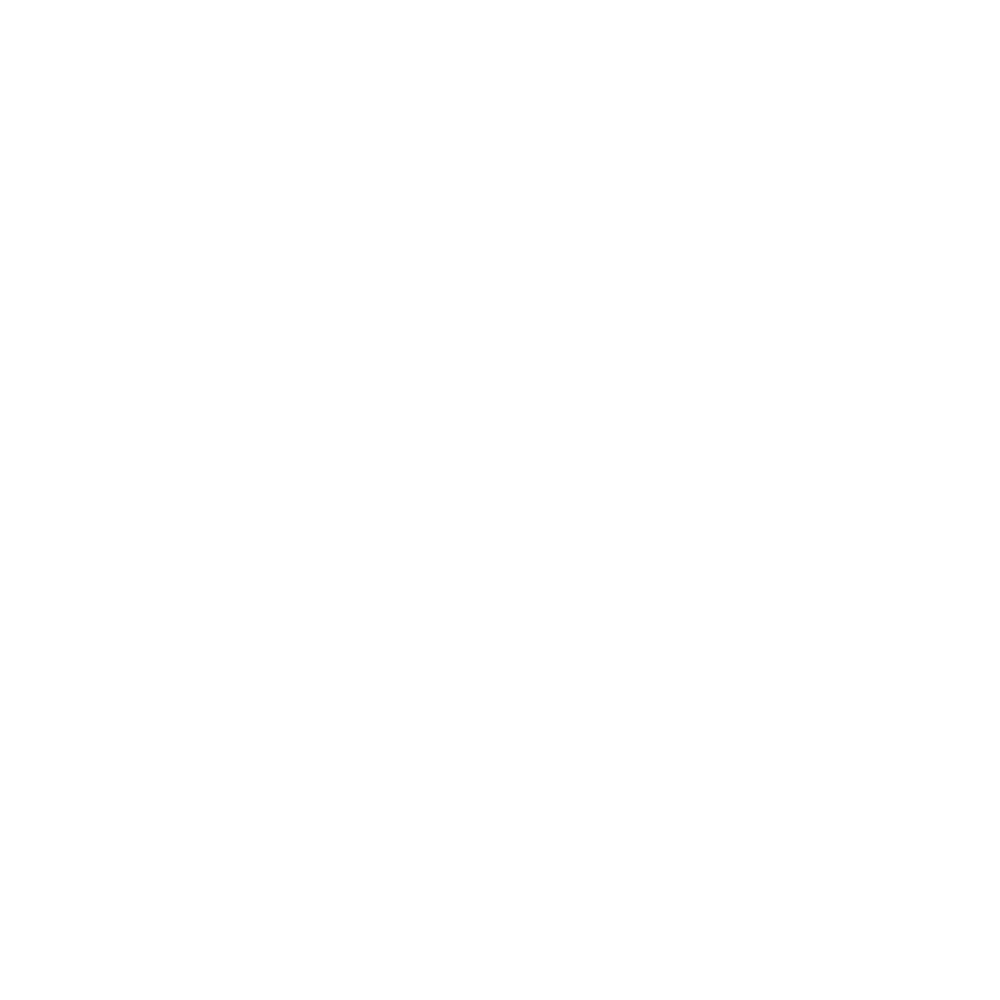

<IPython.core.display.Javascript object>


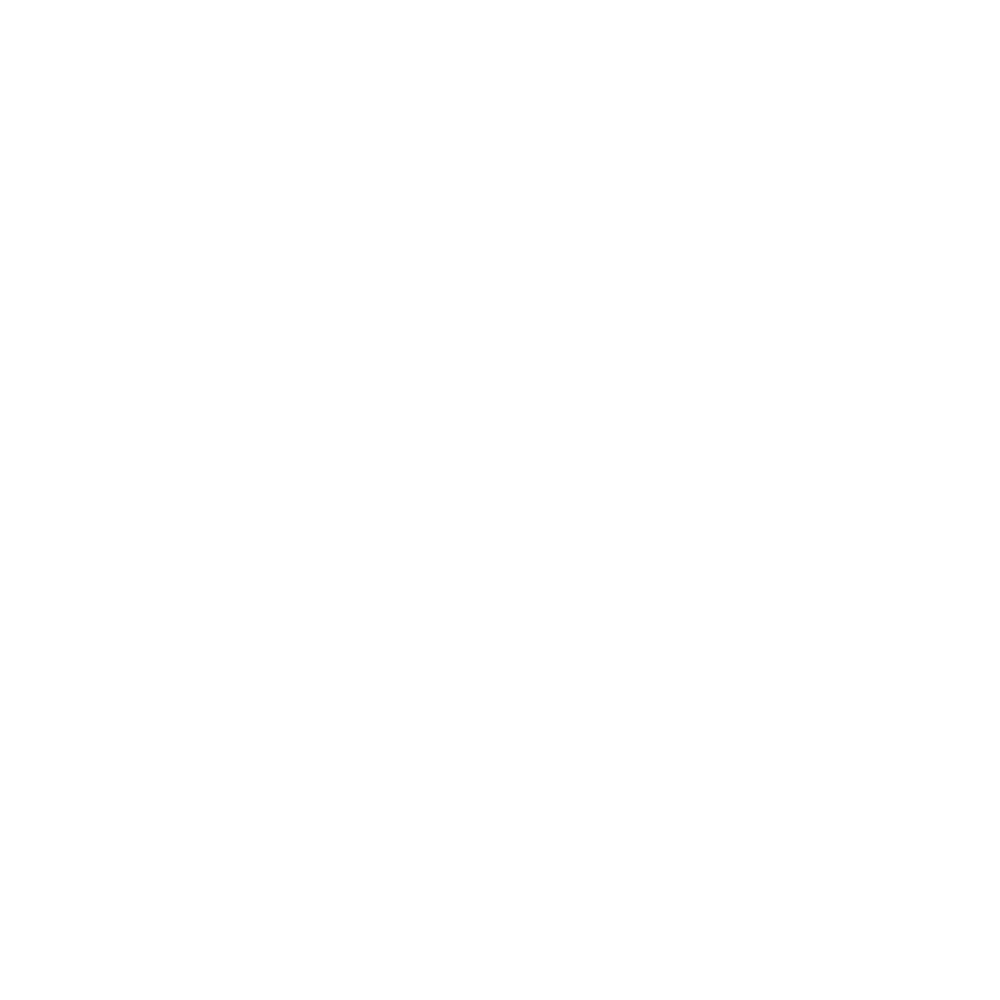

<IPython.core.display.Javascript object>


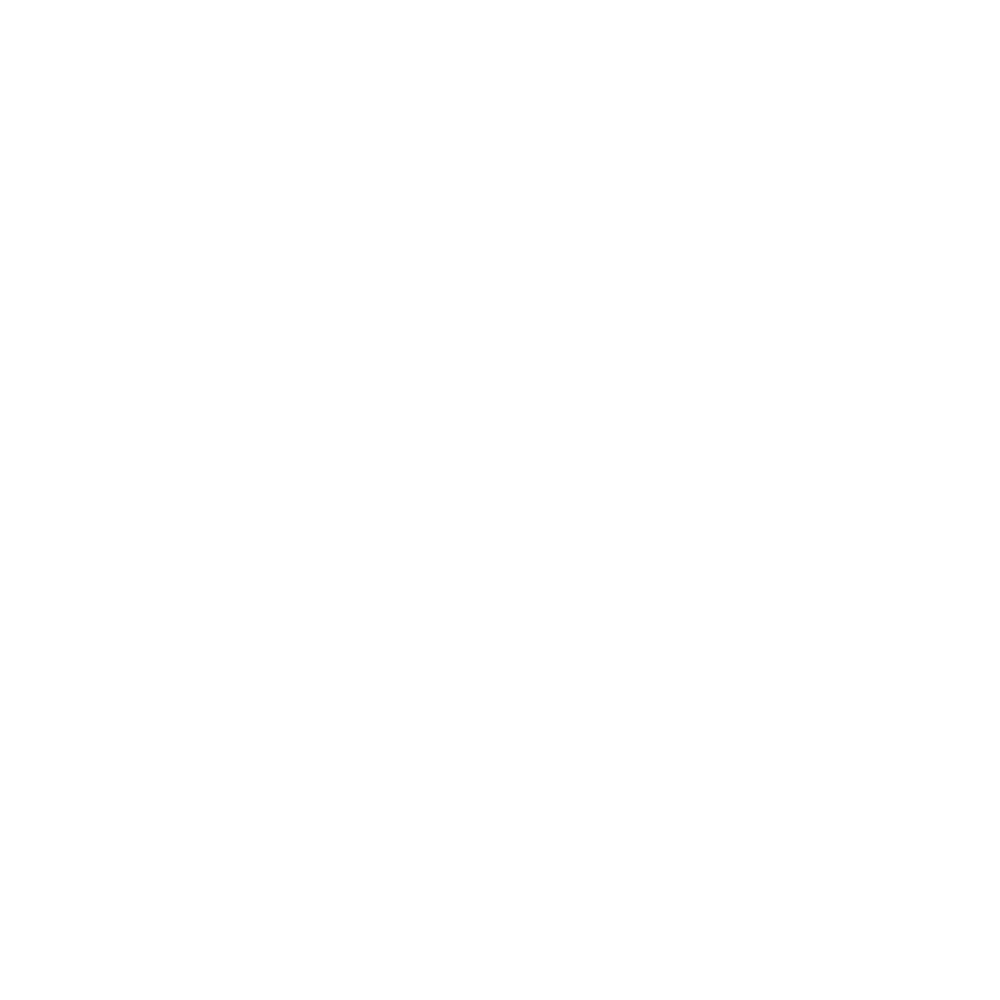

<IPython.core.display.Javascript object>


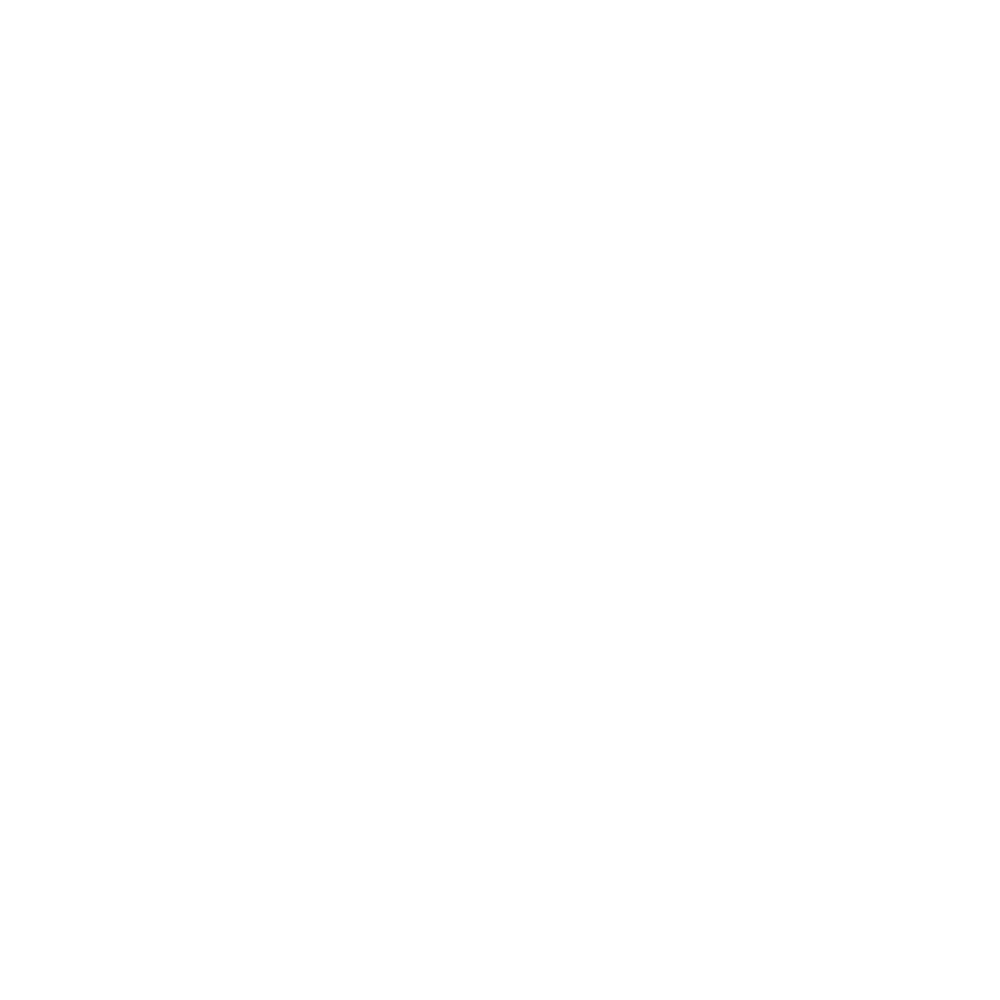

<IPython.core.display.Javascript object>


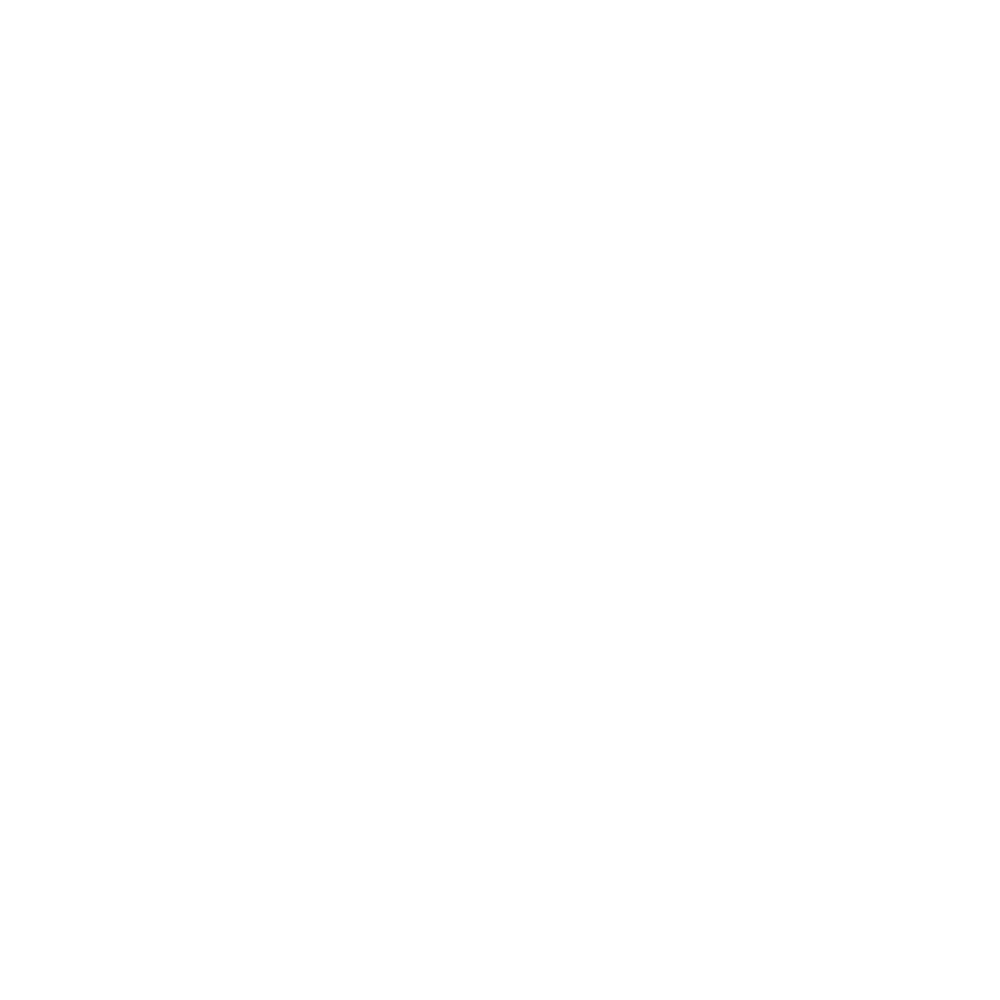

<IPython.core.display.Javascript object>


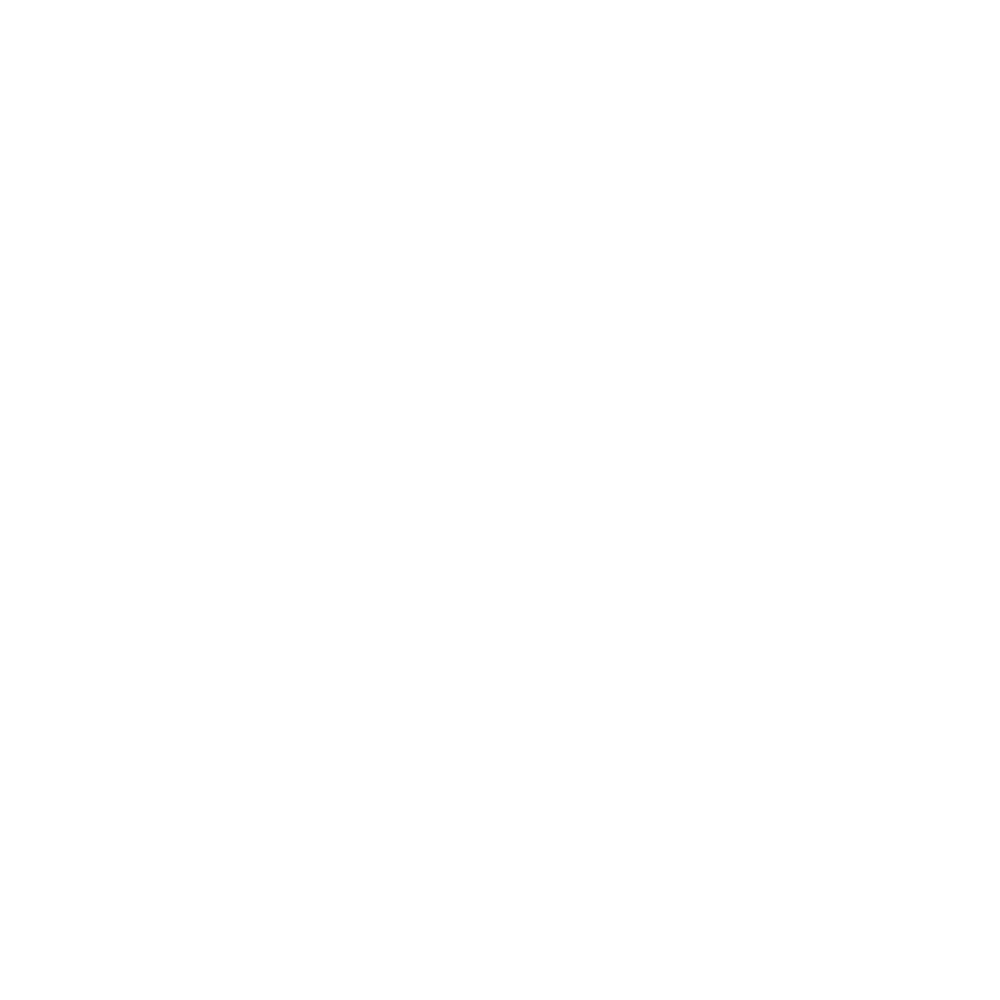

<IPython.core.display.Javascript object>


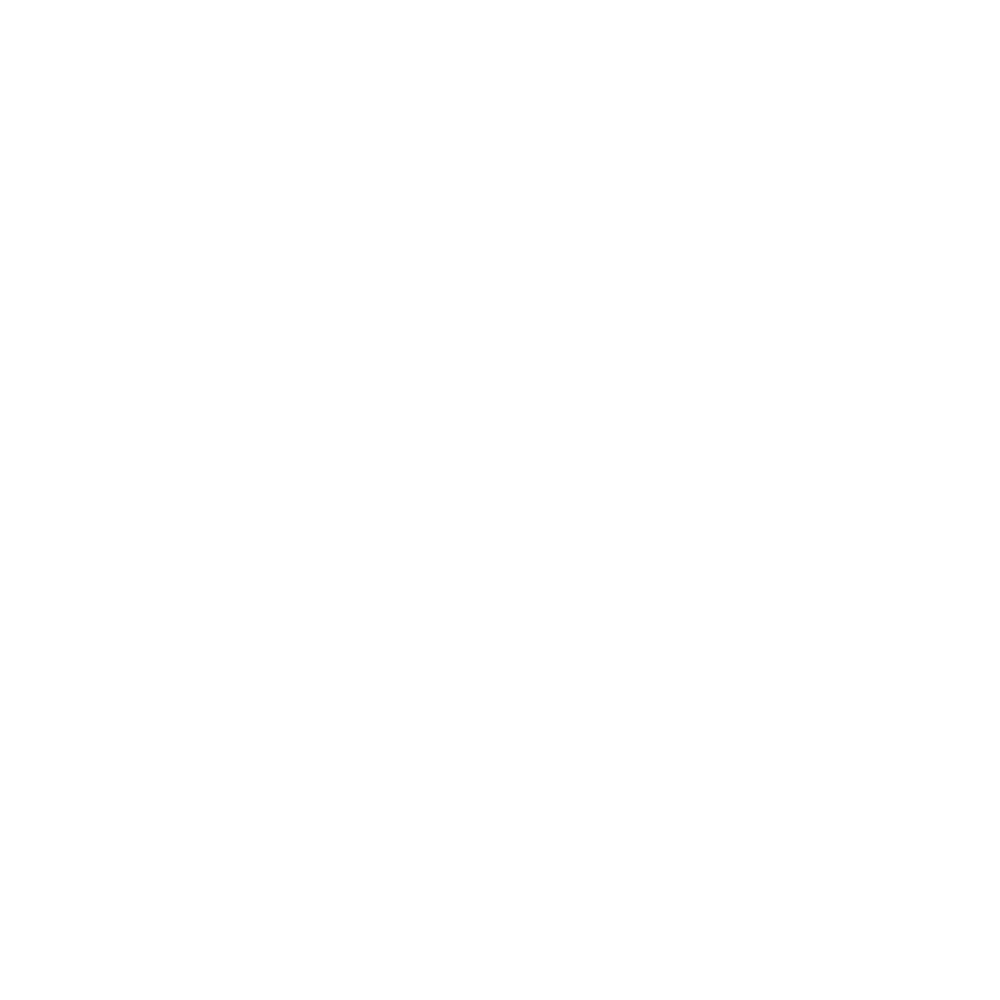

<IPython.core.display.Javascript object>


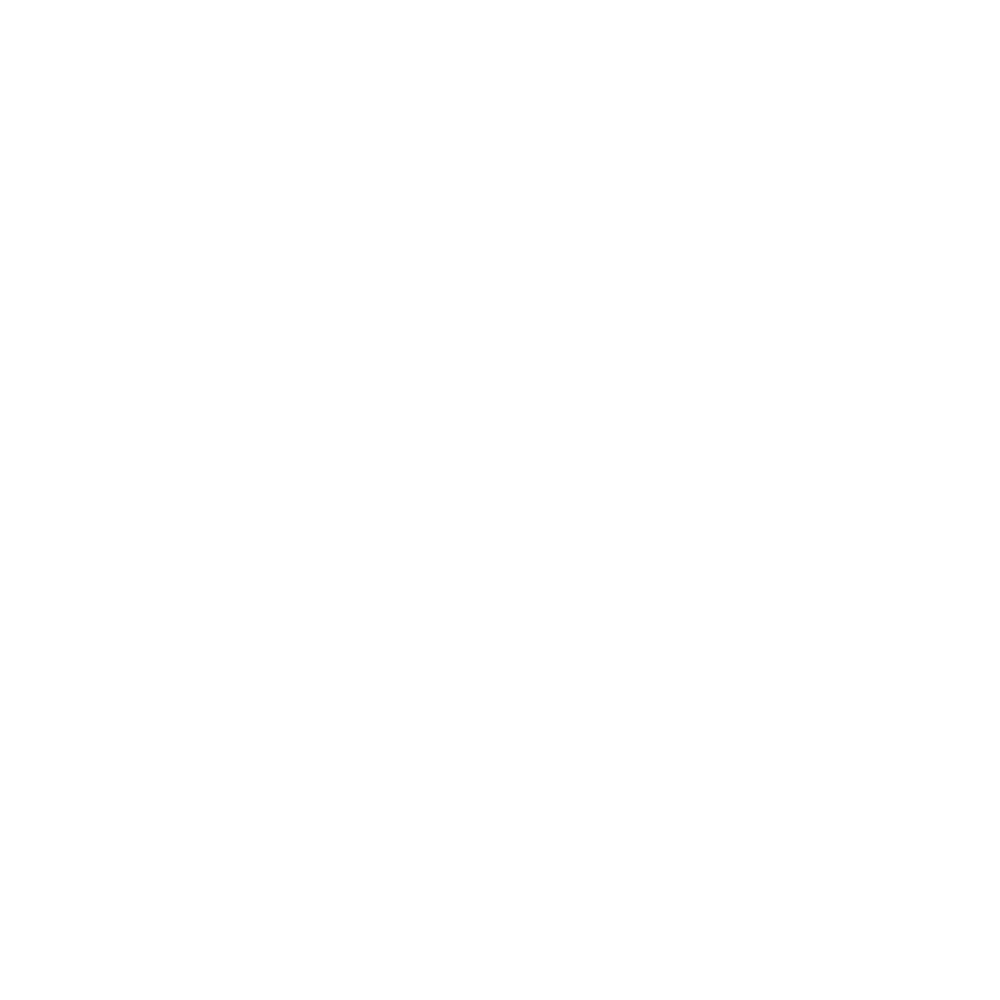

<IPython.core.display.Javascript object>


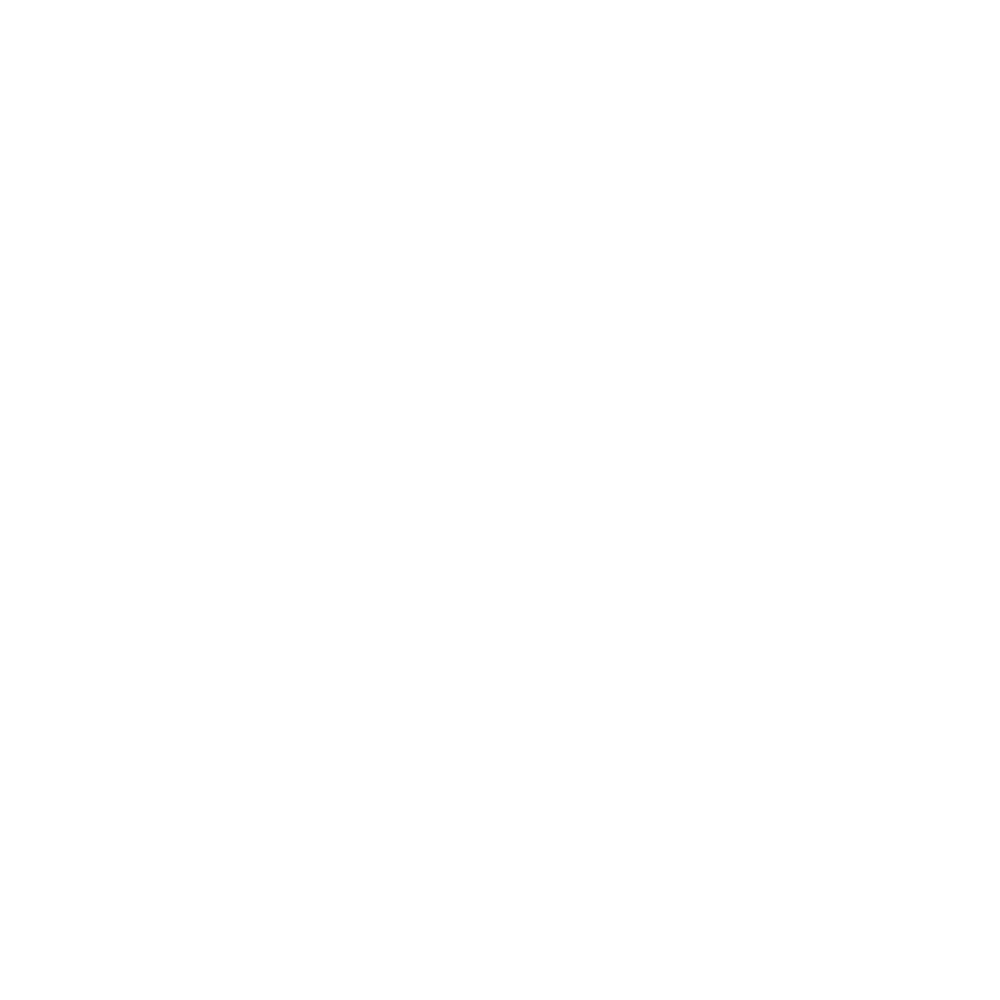

<IPython.core.display.Javascript object>


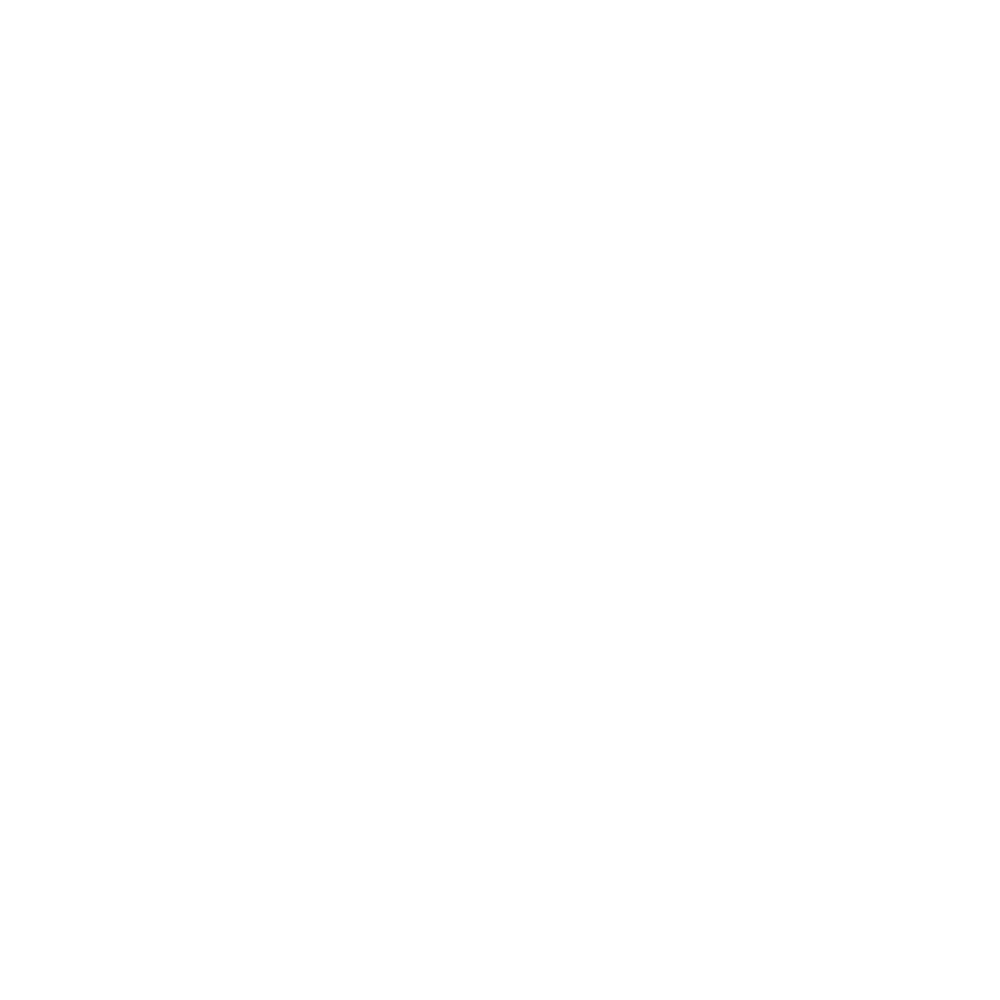

<IPython.core.display.Javascript object>


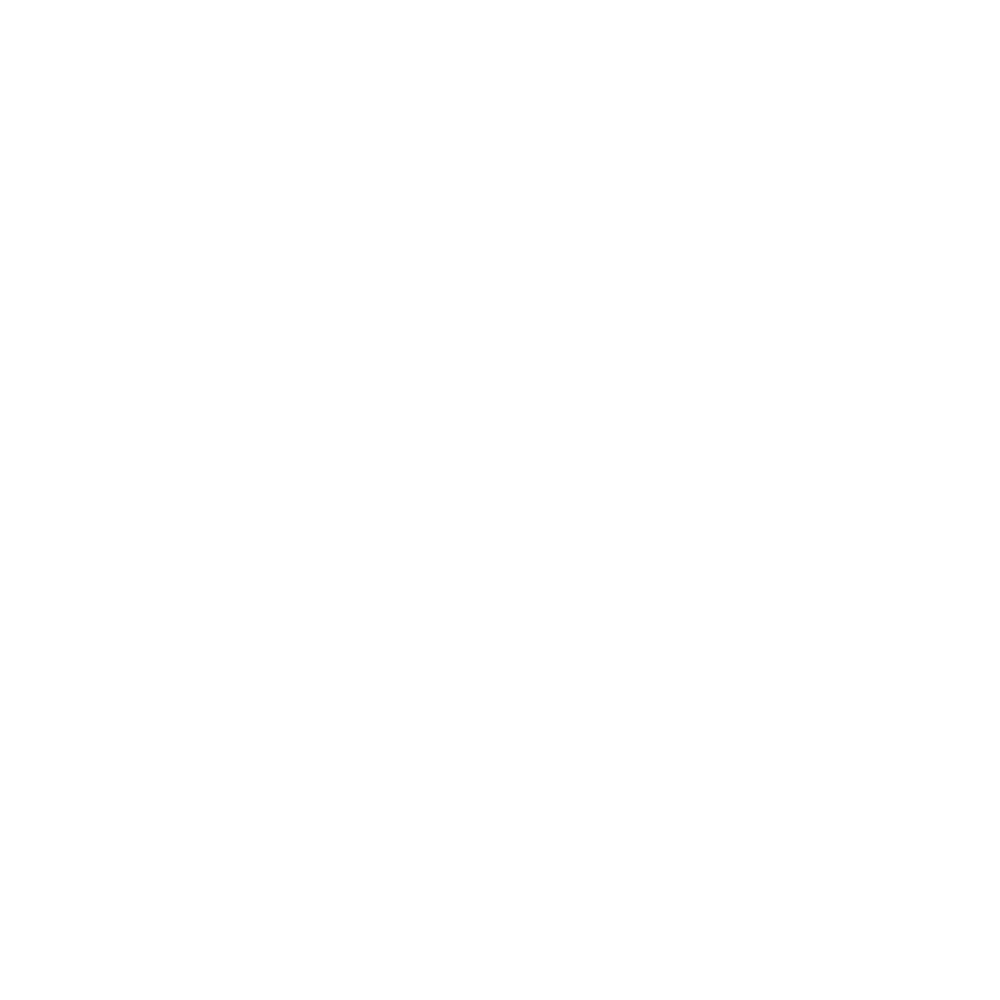

<IPython.core.display.Javascript object>


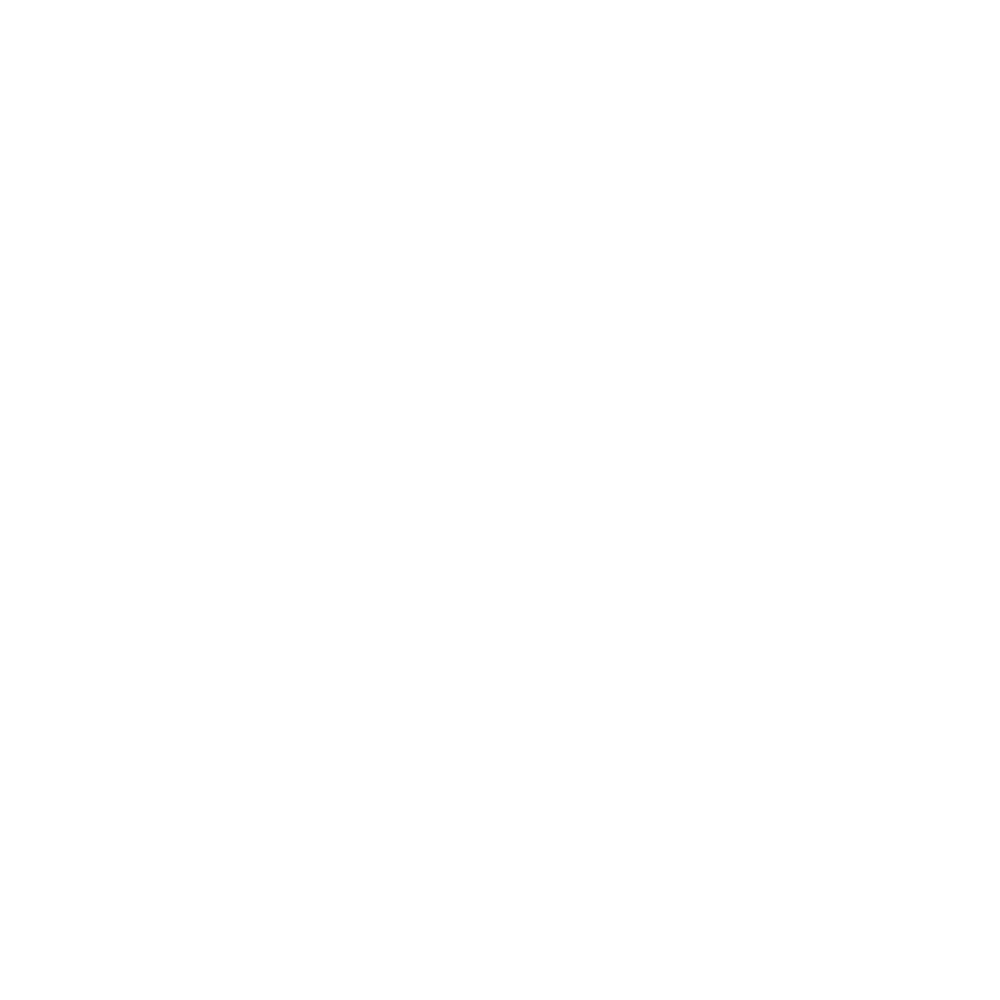

<IPython.core.display.Javascript object>


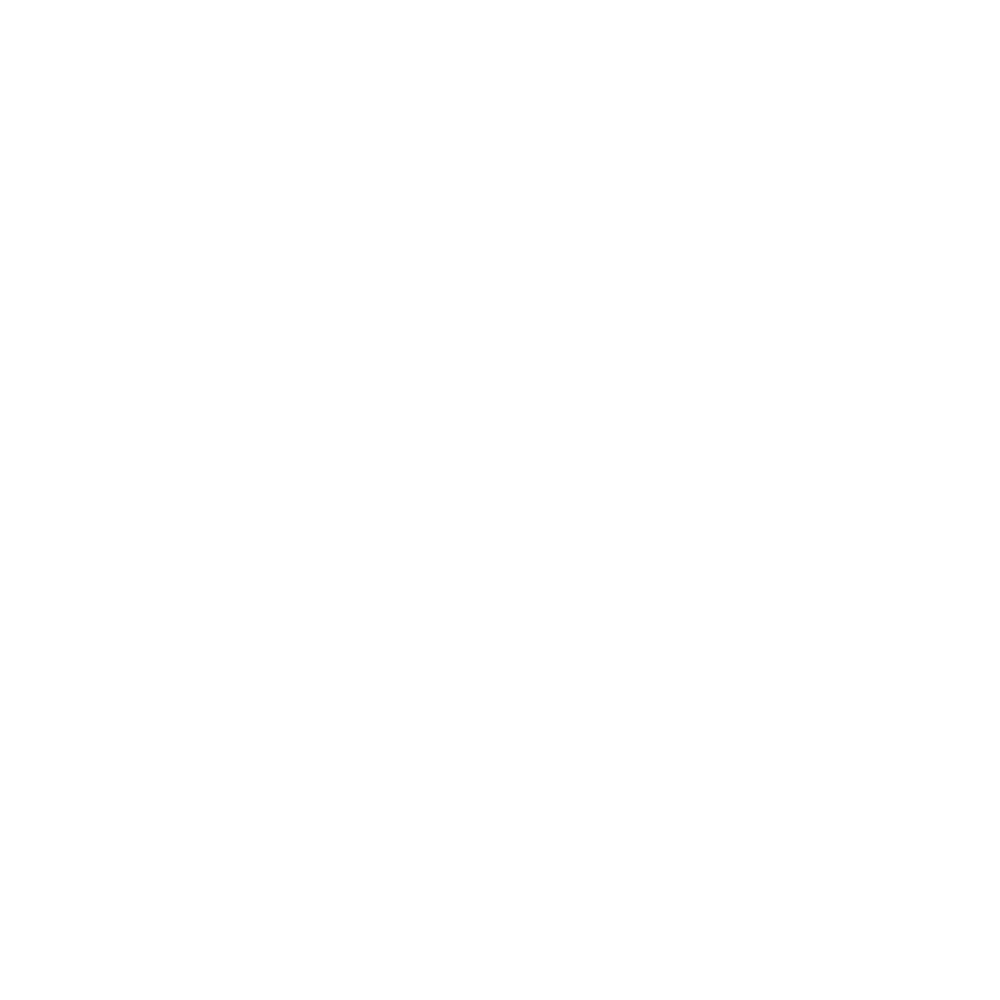

<IPython.core.display.Javascript object>


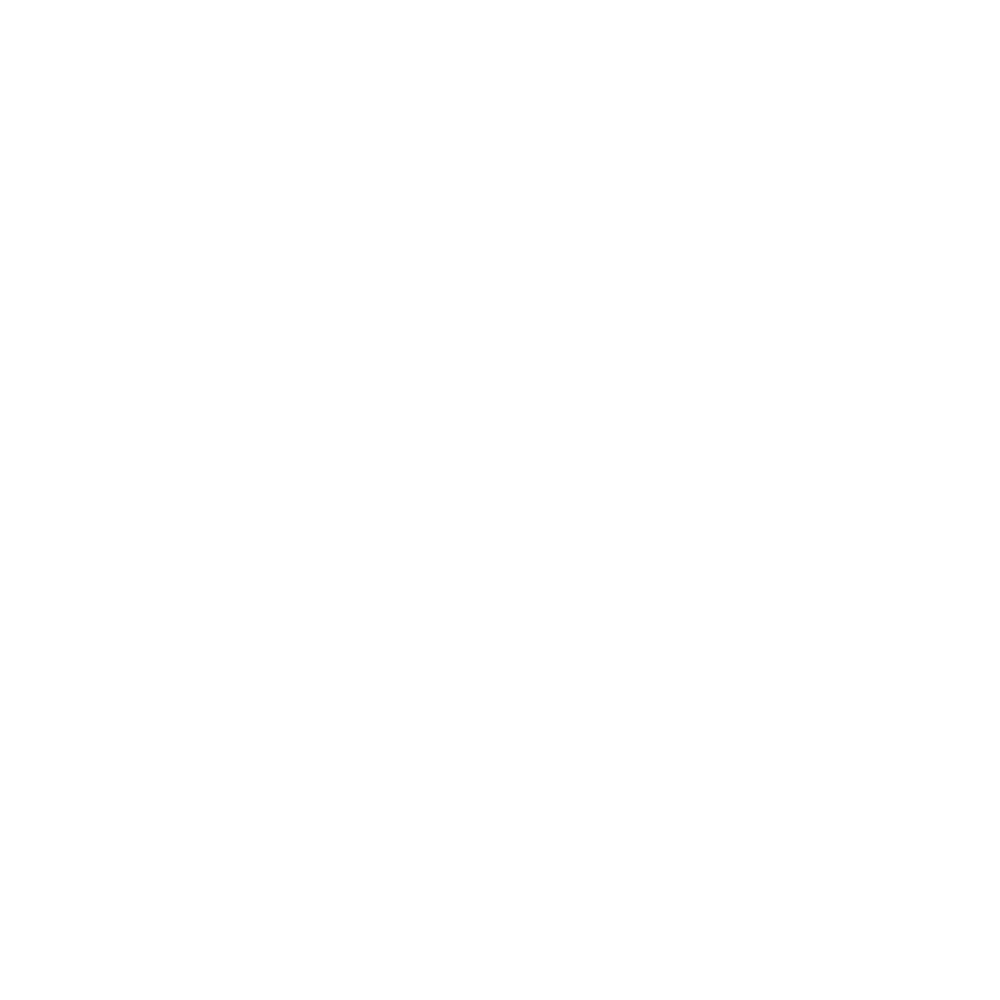

<IPython.core.display.Javascript object>


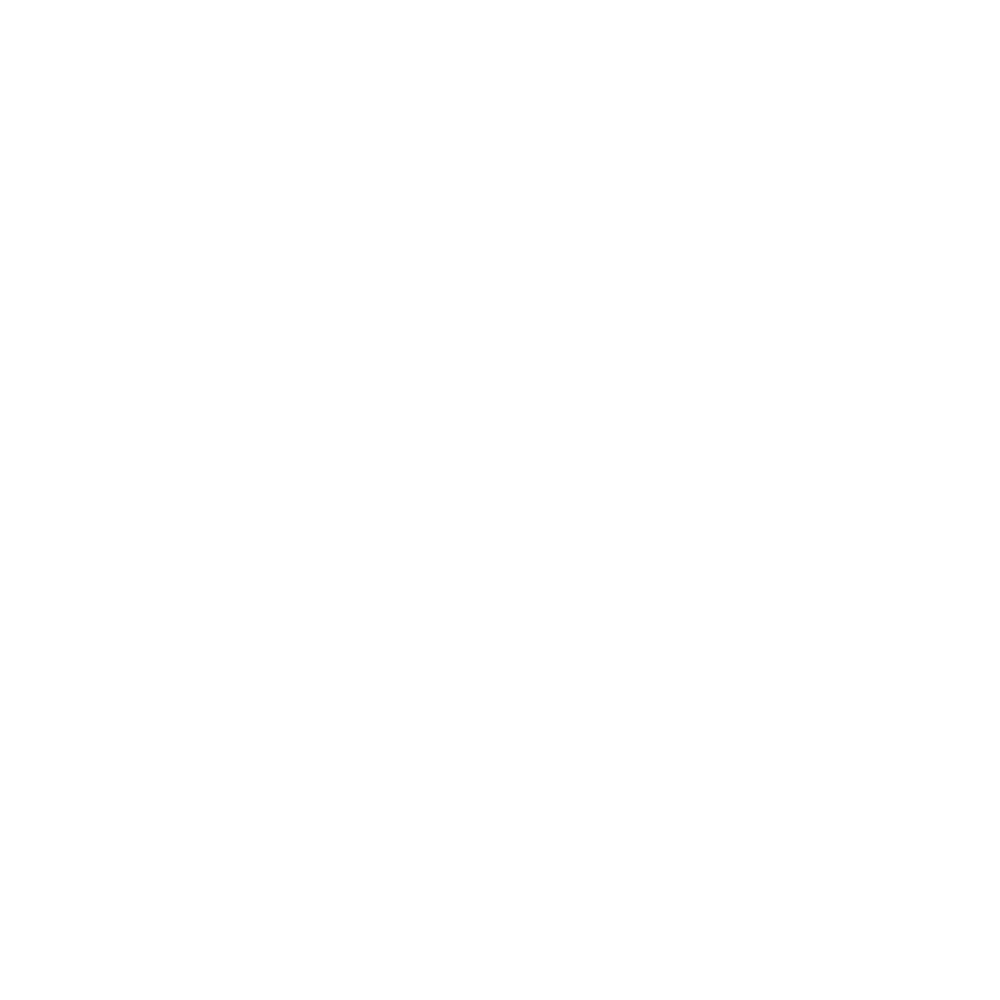

<IPython.core.display.Javascript object>


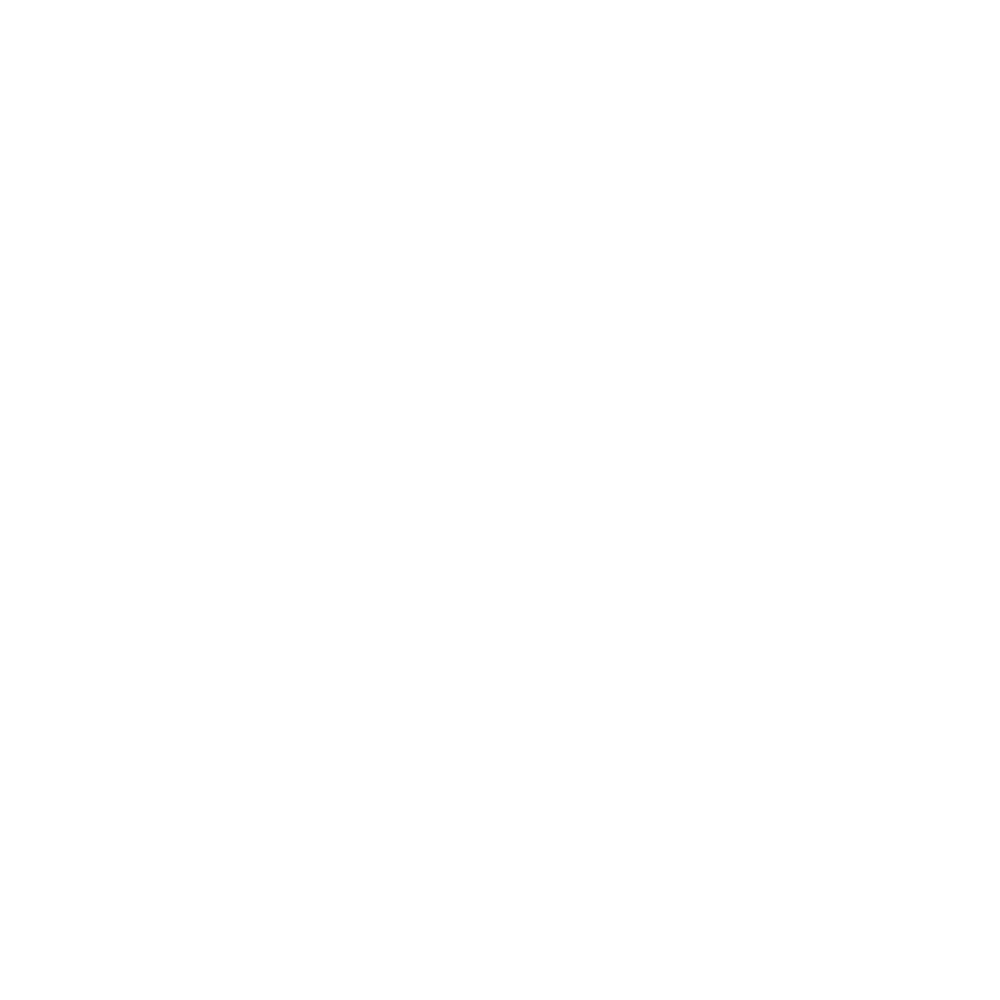

<IPython.core.display.Javascript object>


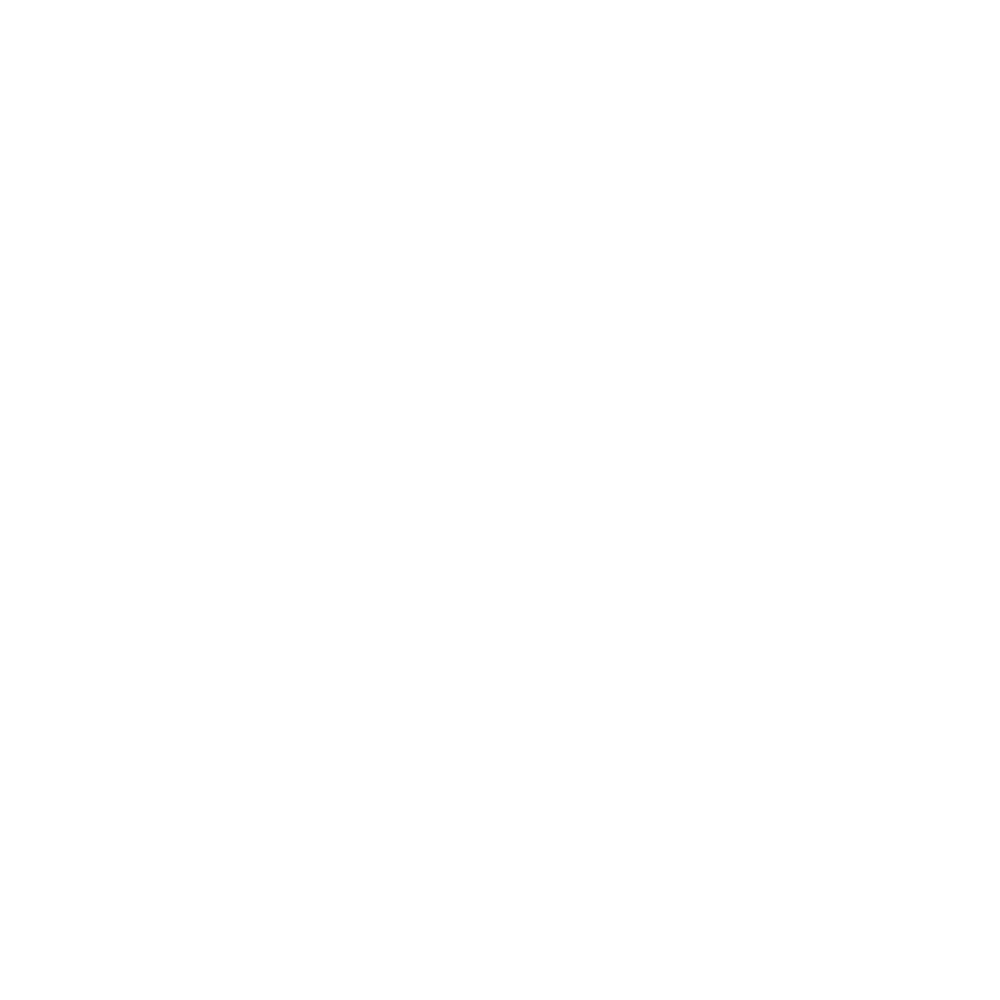

<IPython.core.display.Javascript object>


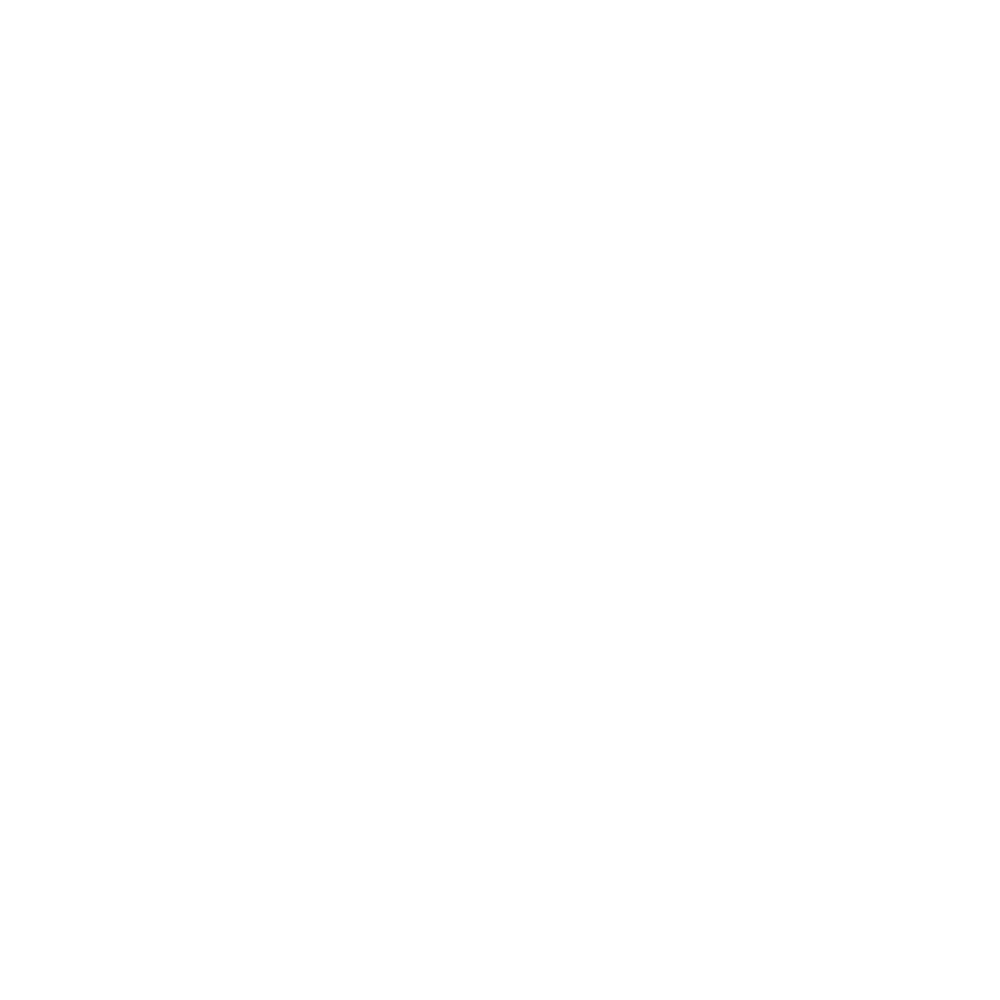

<IPython.core.display.Javascript object>


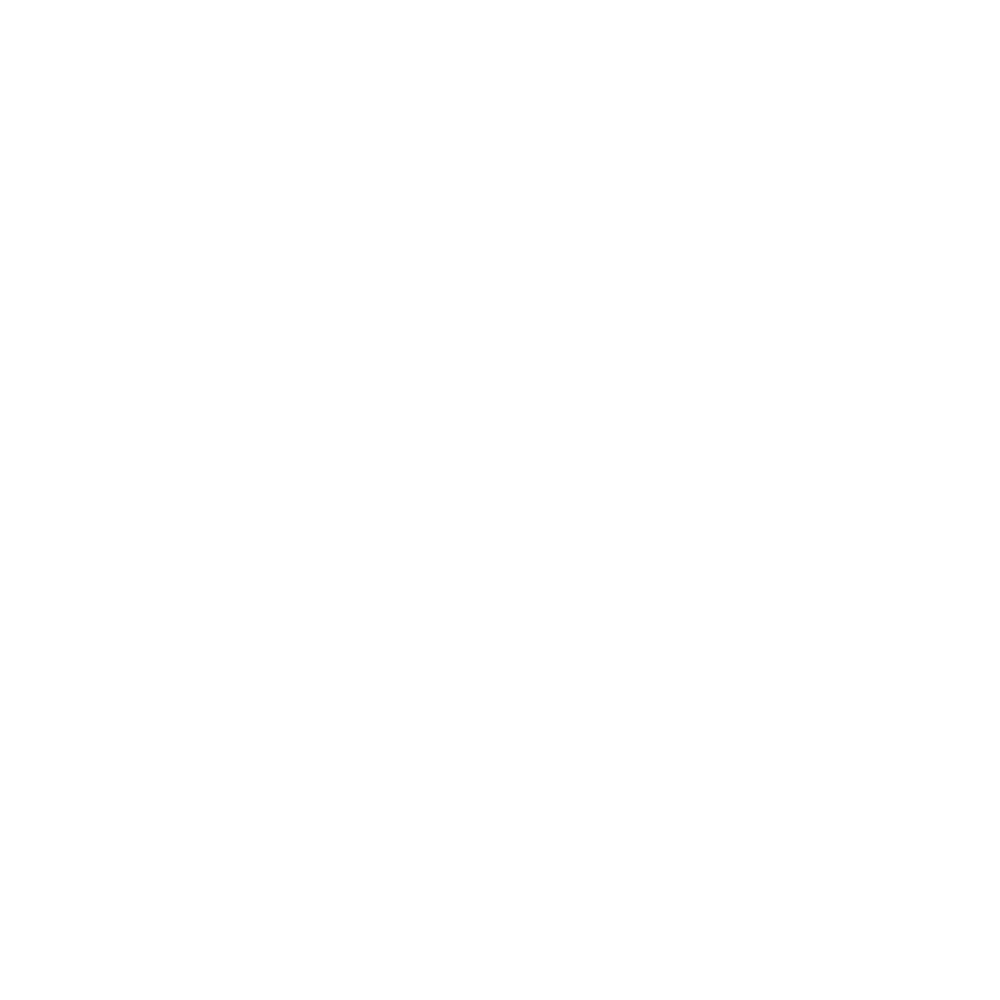

<IPython.core.display.Javascript object>


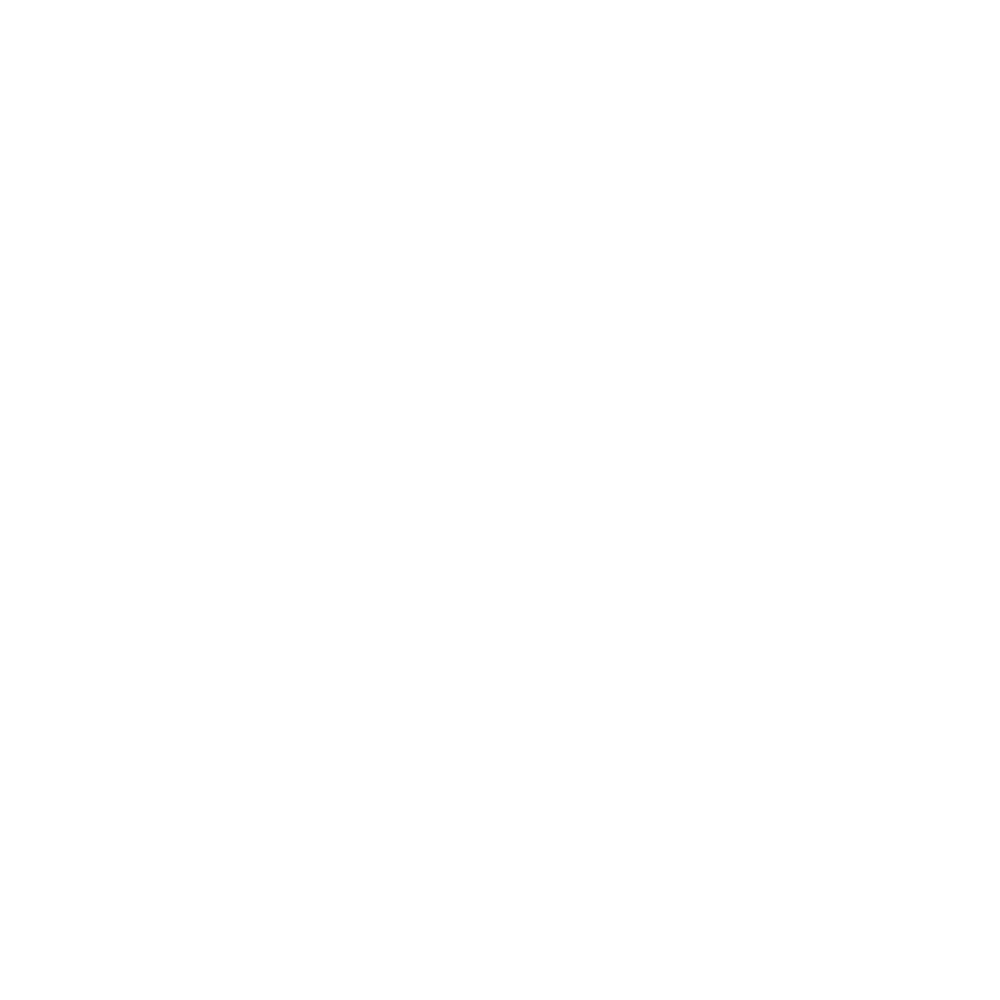

<IPython.core.display.Javascript object>


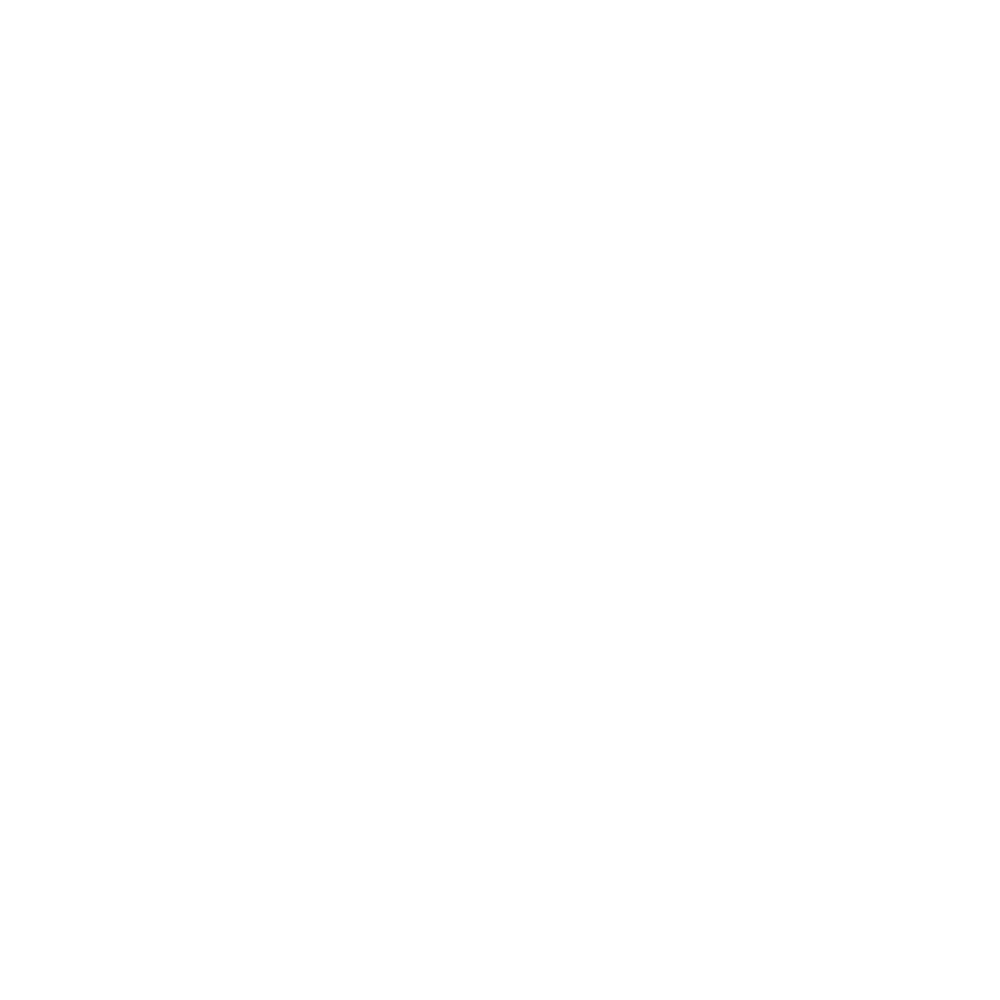

<IPython.core.display.Javascript object>


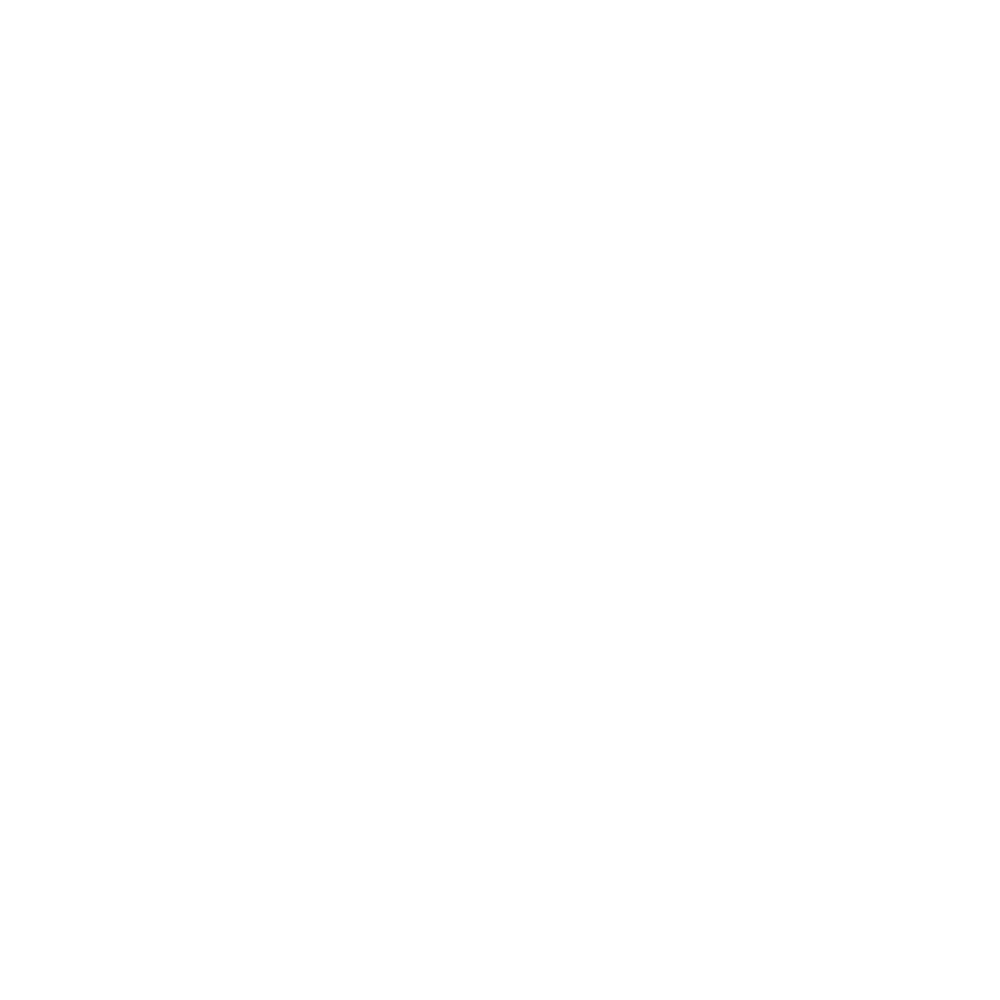

<IPython.core.display.Javascript object>


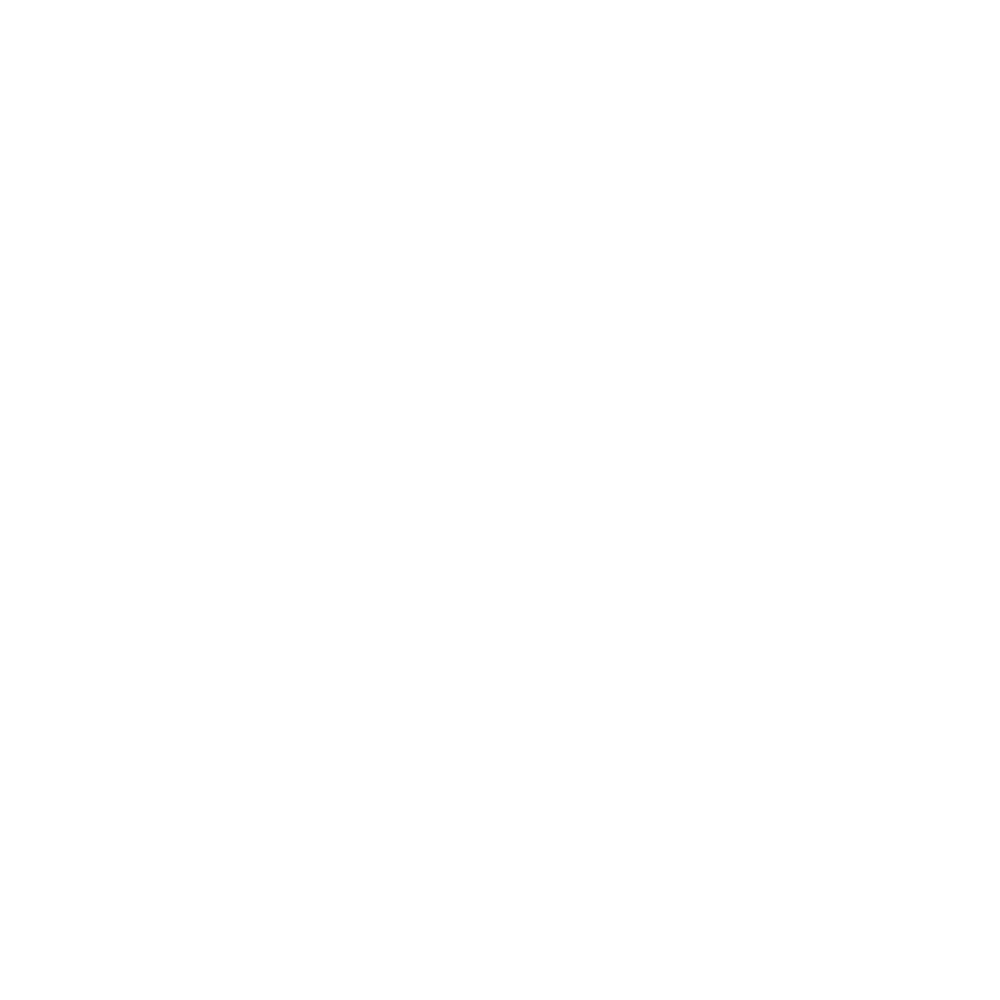

<IPython.core.display.Javascript object>


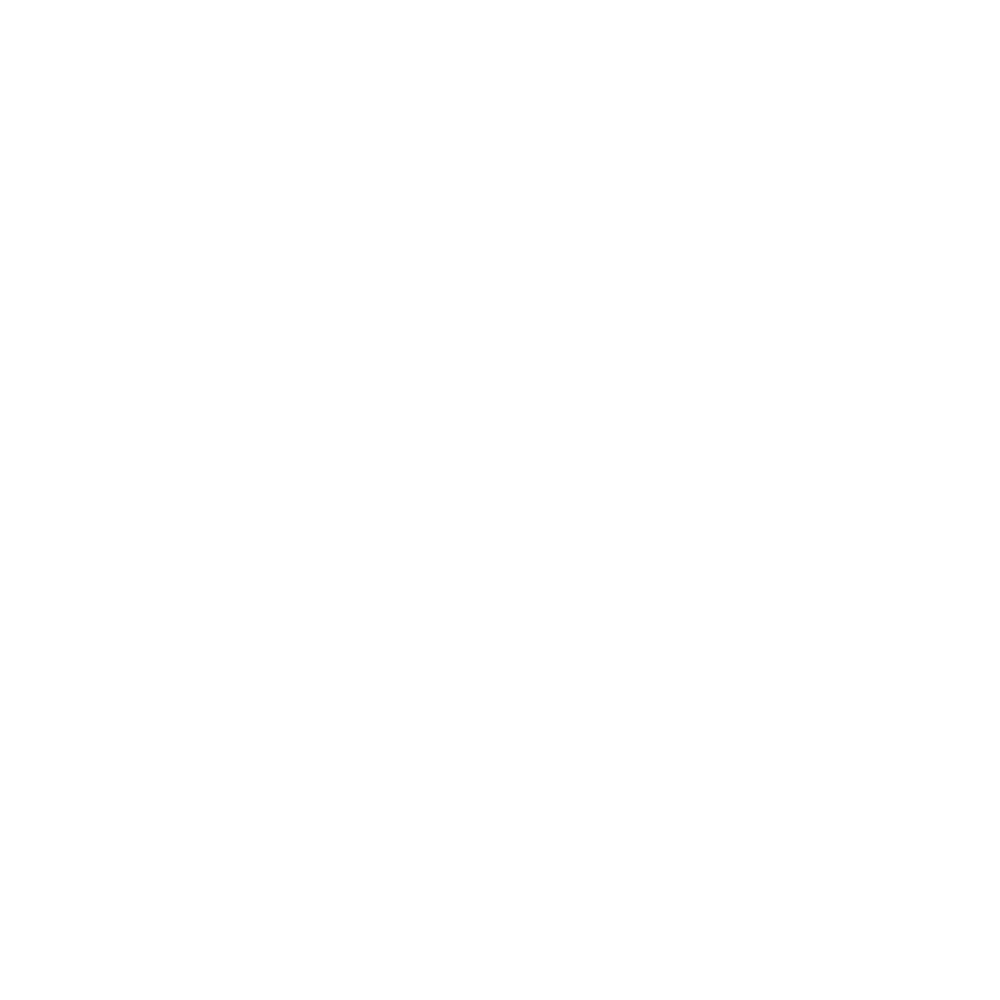

<IPython.core.display.Javascript object>


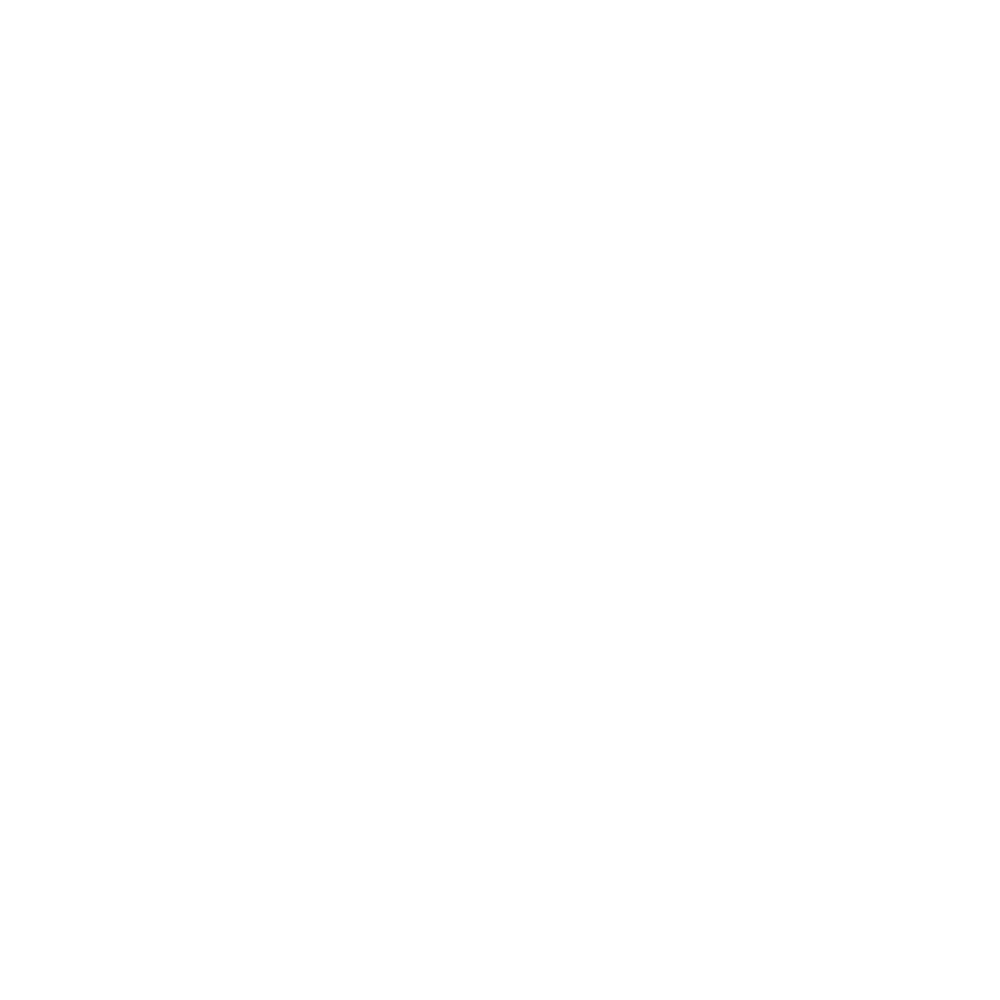

<IPython.core.display.Javascript object>


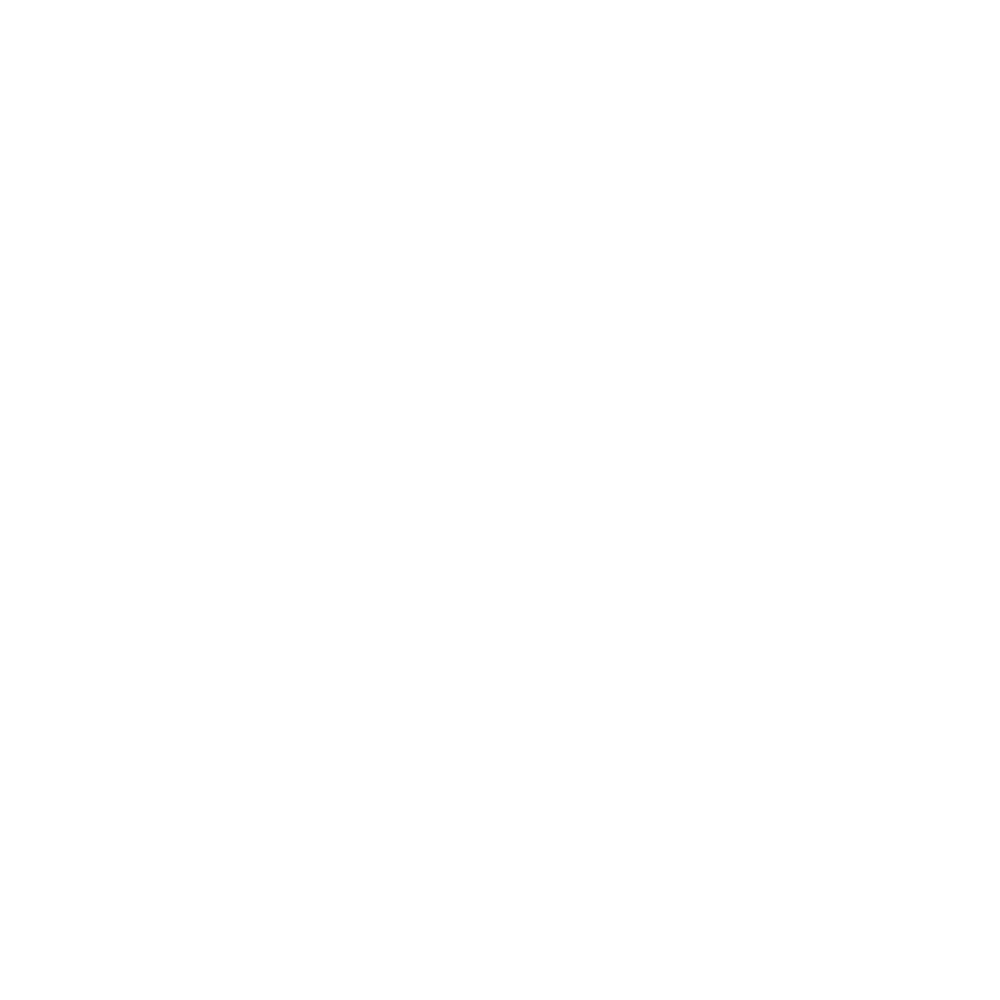

<IPython.core.display.Javascript object>


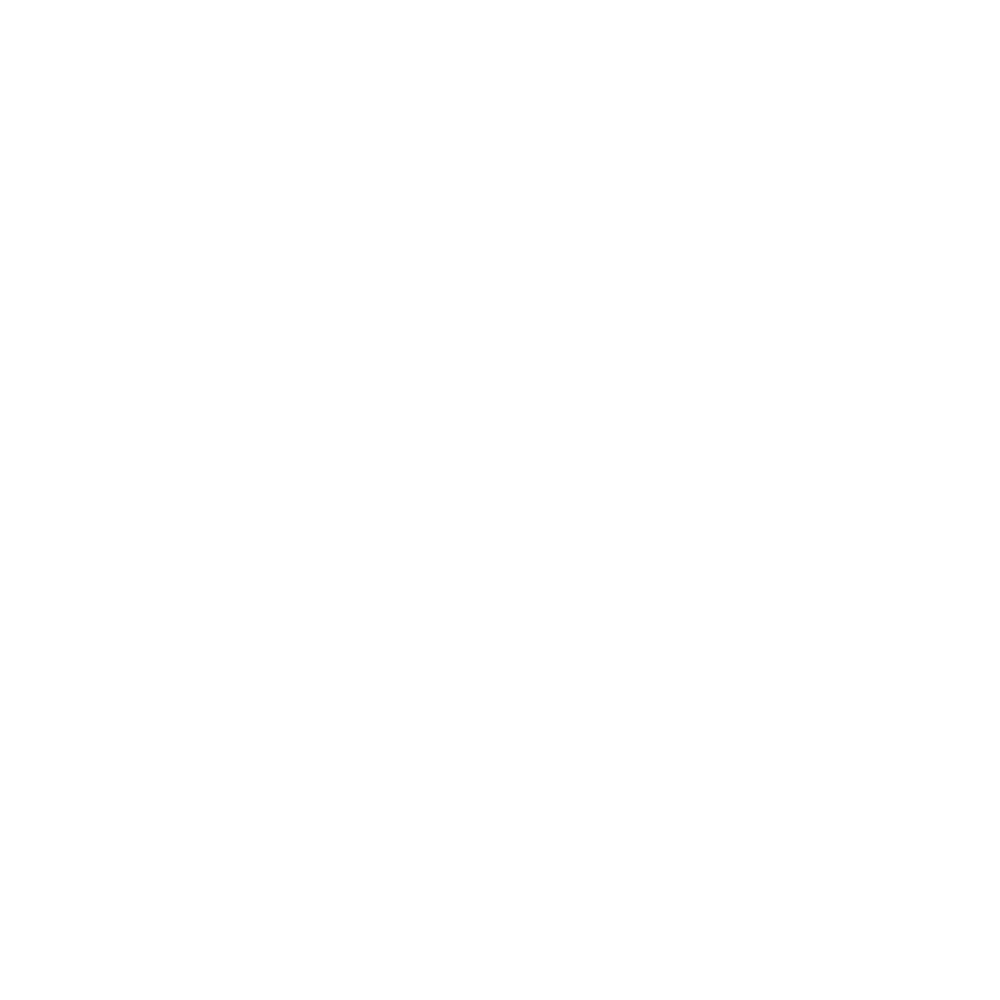

<IPython.core.display.Javascript object>


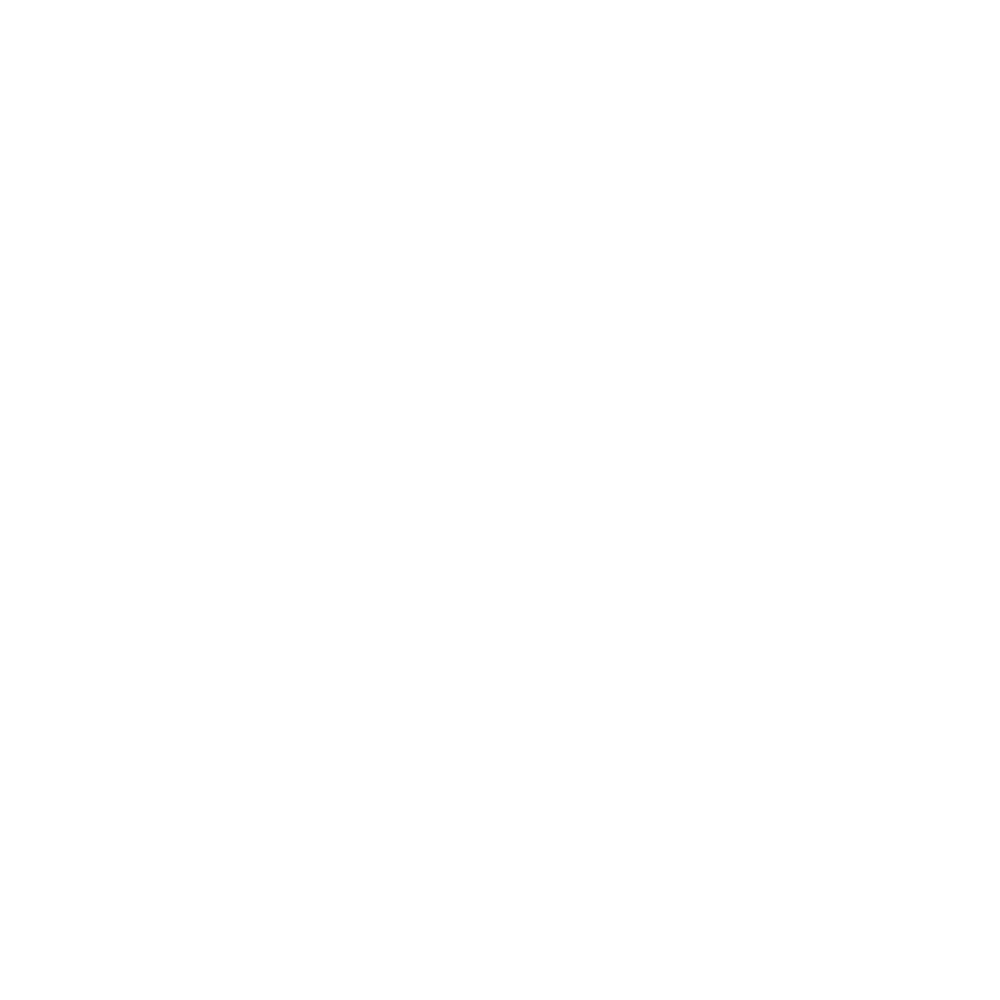

<IPython.core.display.Javascript object>


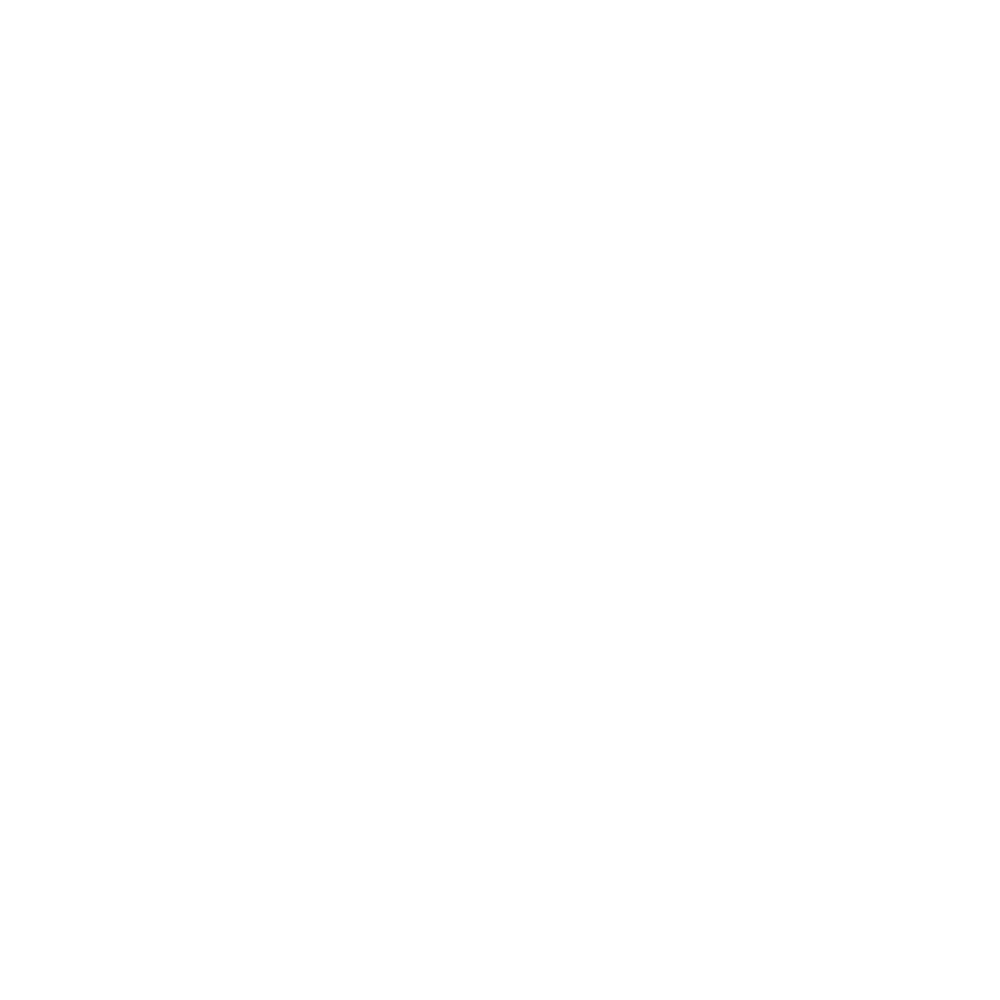

<IPython.core.display.Javascript object>


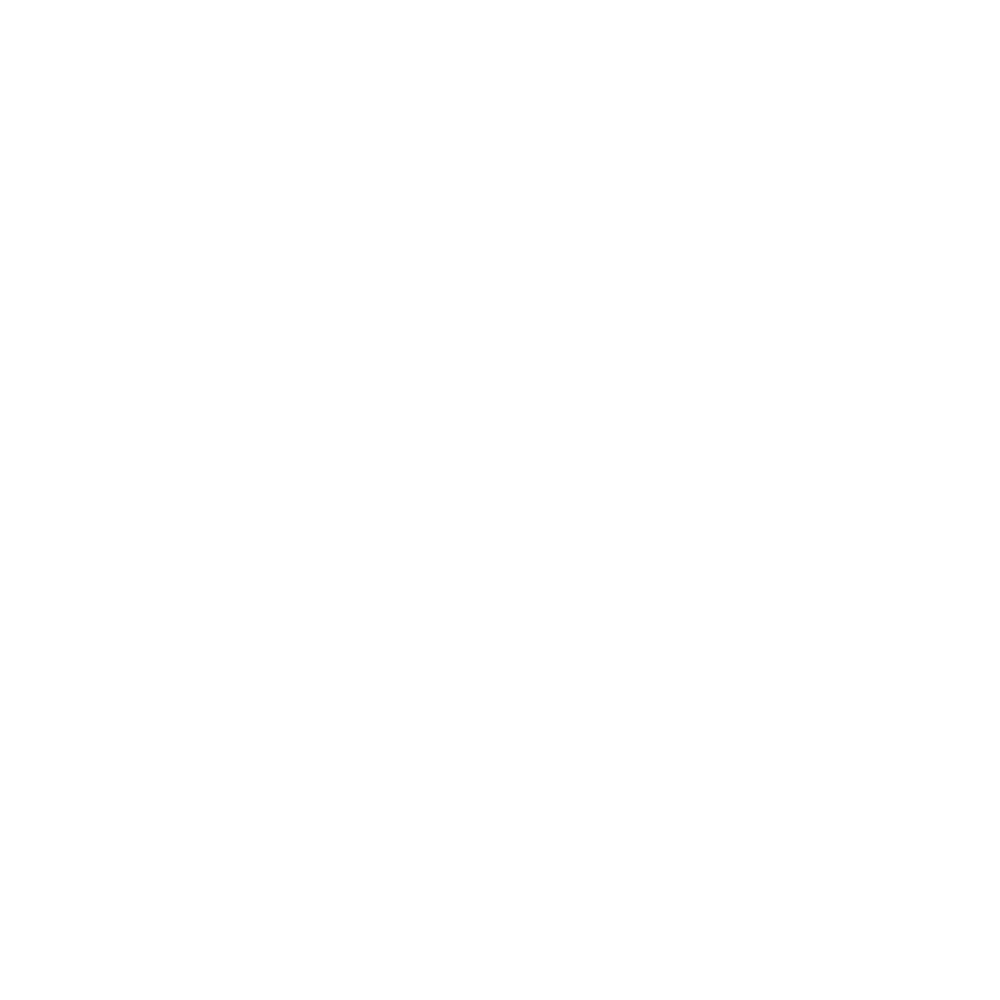

<IPython.core.display.Javascript object>


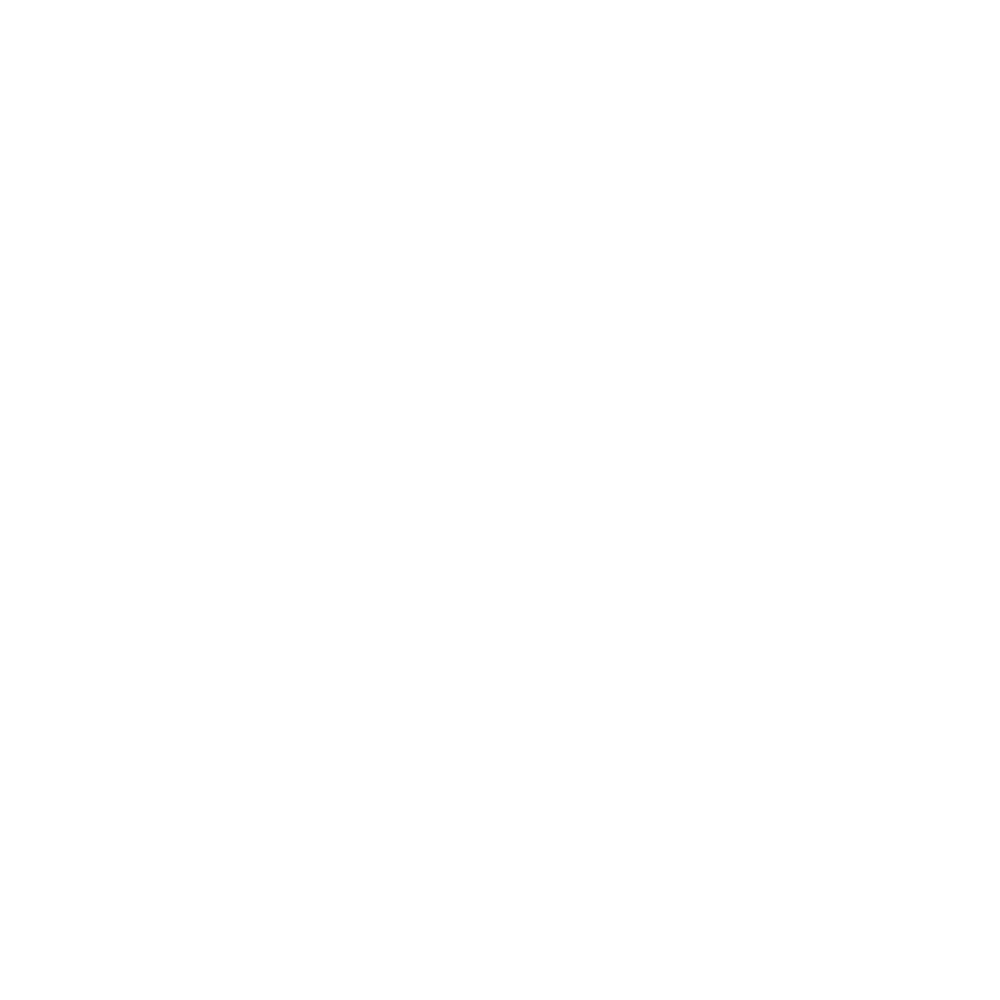

<IPython.core.display.Javascript object>


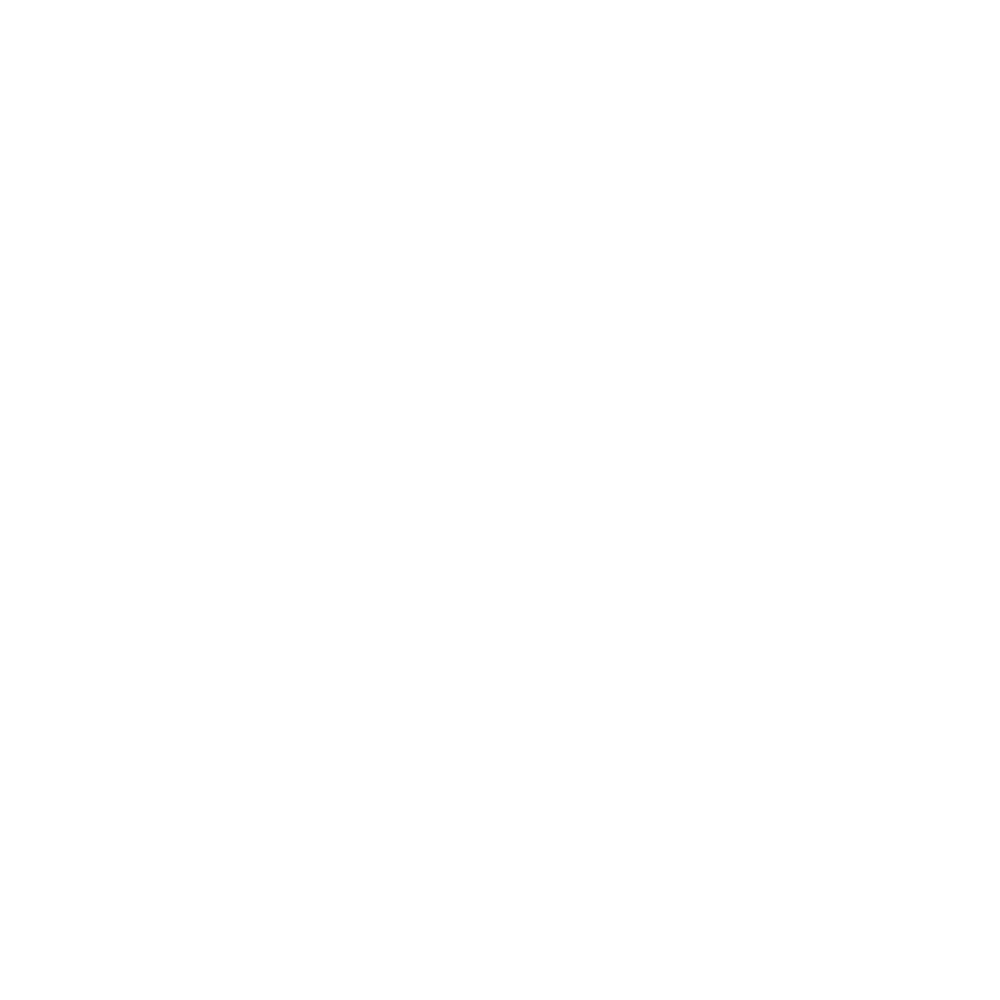

<IPython.core.display.Javascript object>


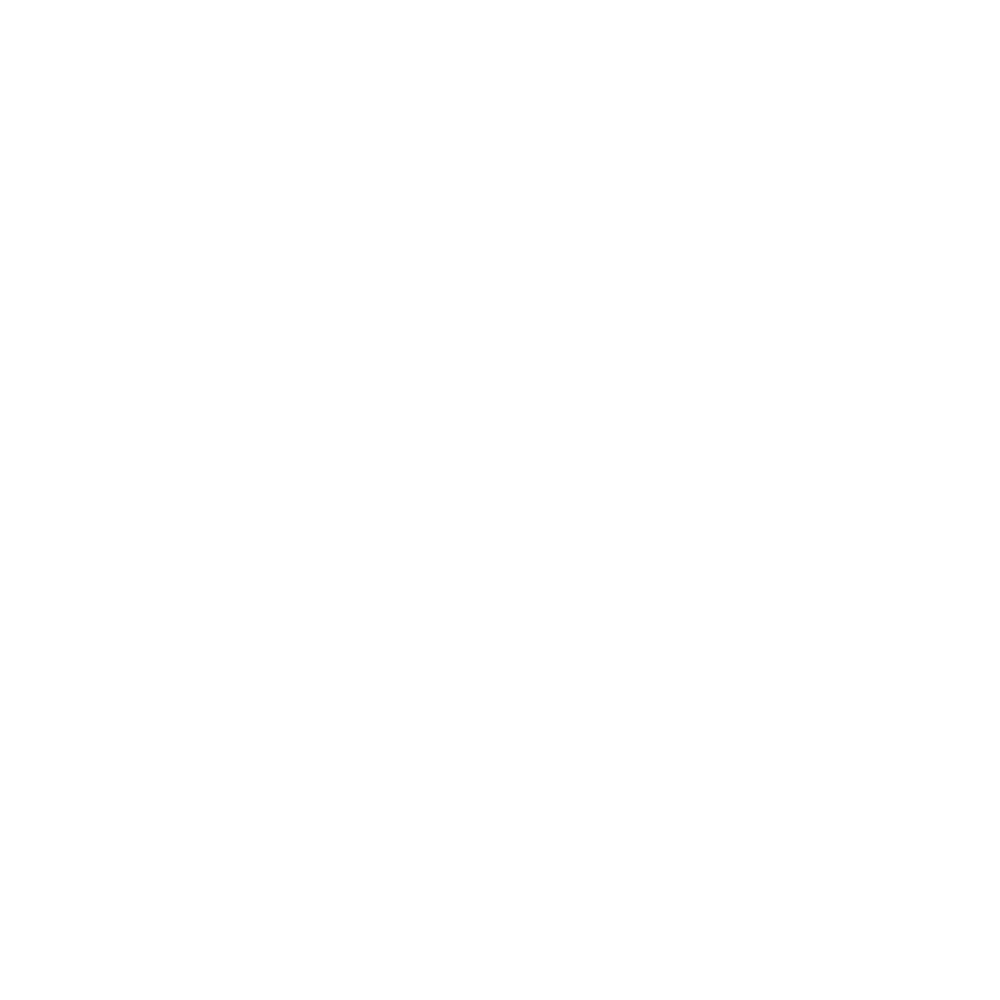

<IPython.core.display.Javascript object>


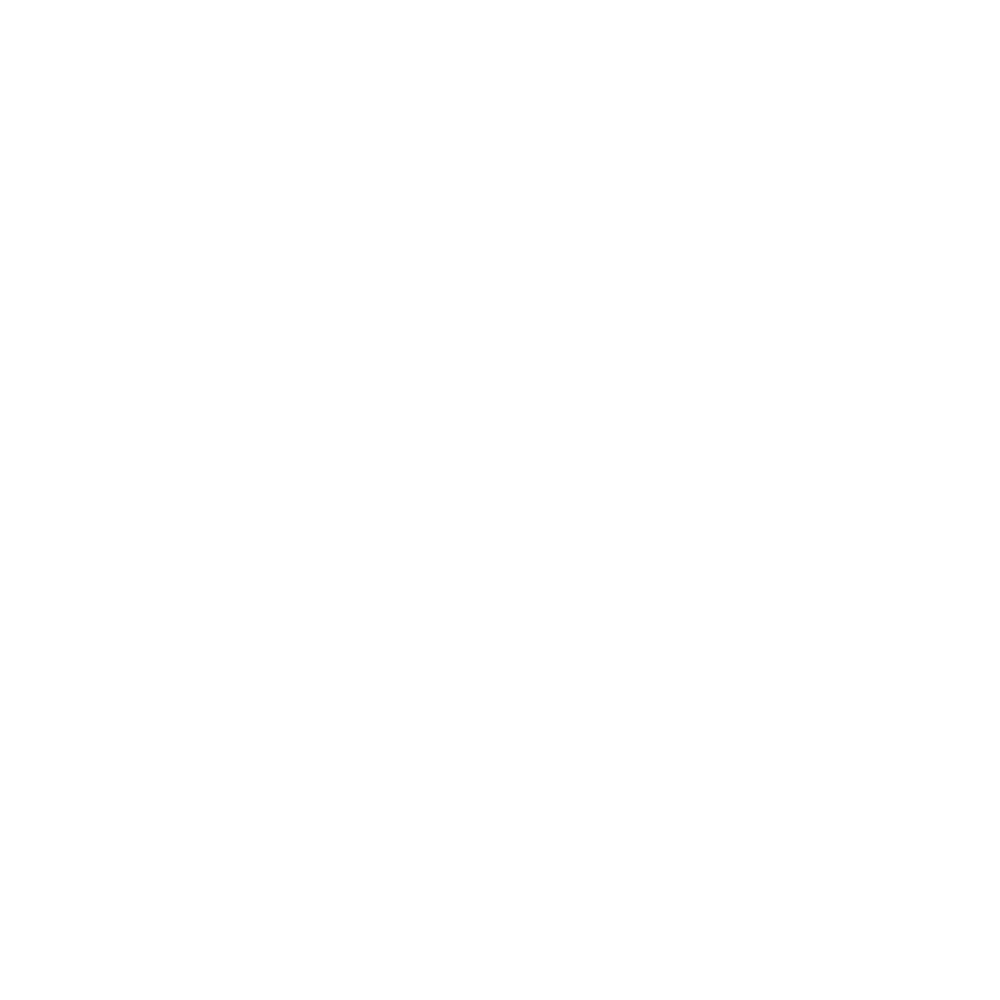

<IPython.core.display.Javascript object>


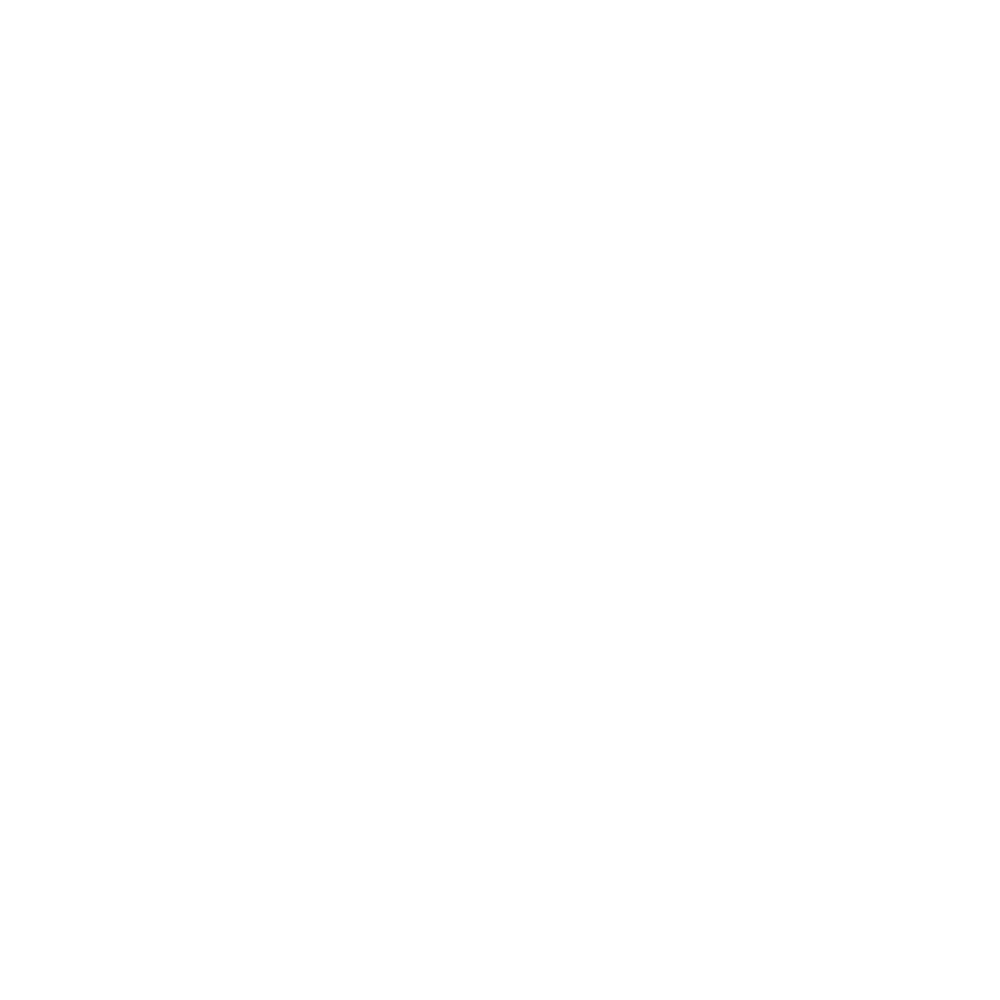

<IPython.core.display.Javascript object>


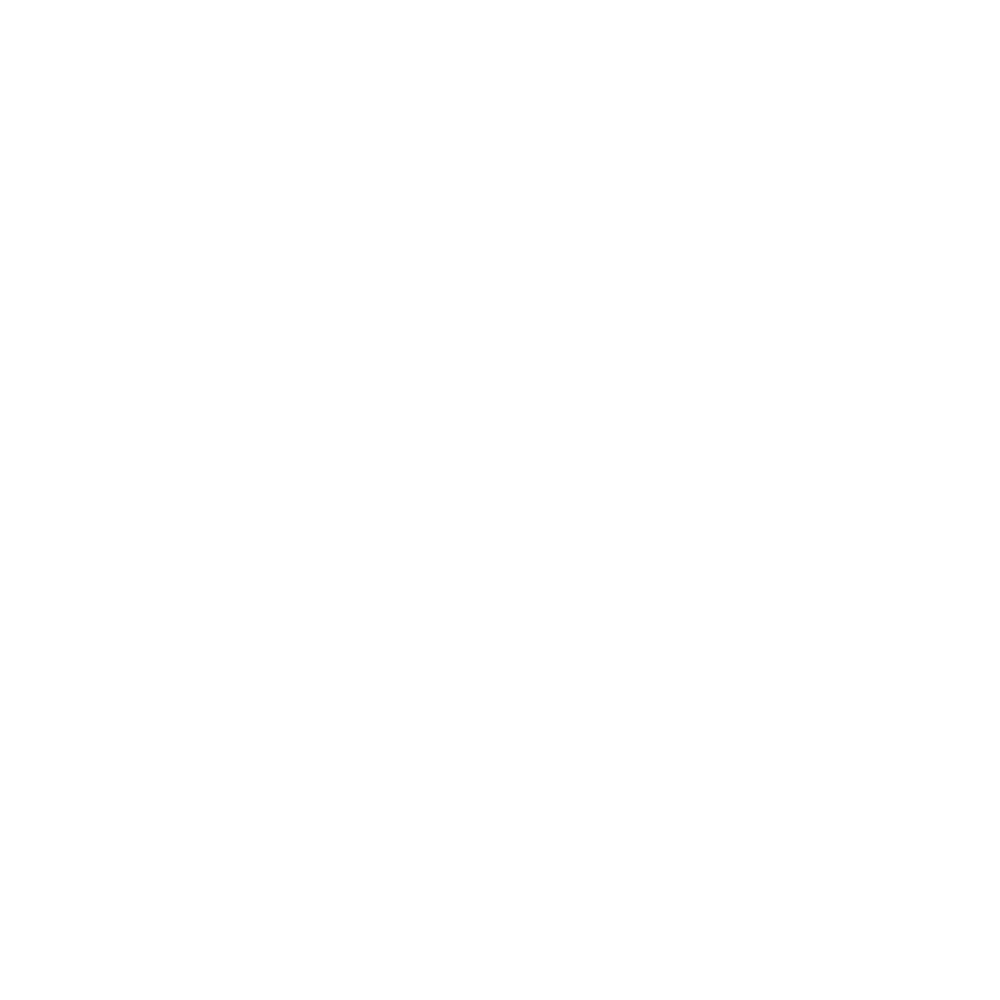

<IPython.core.display.Javascript object>


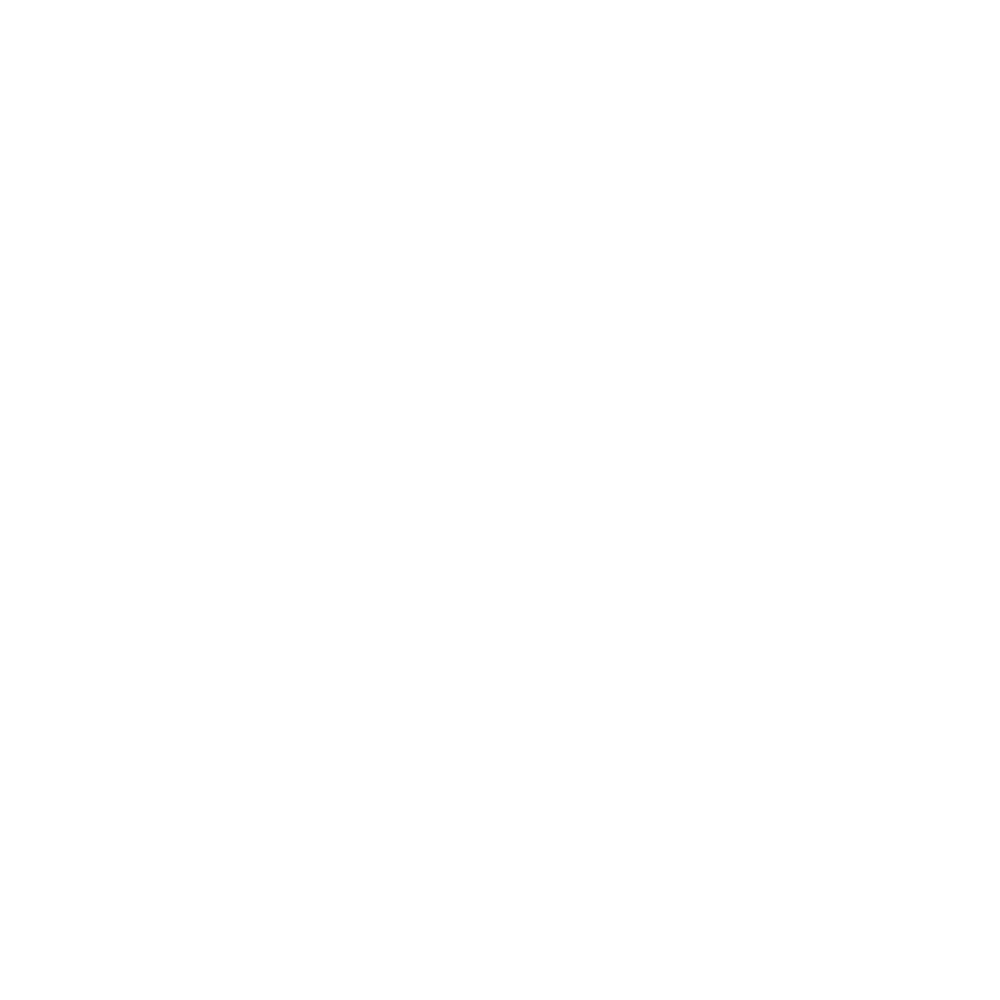

<IPython.core.display.Javascript object>


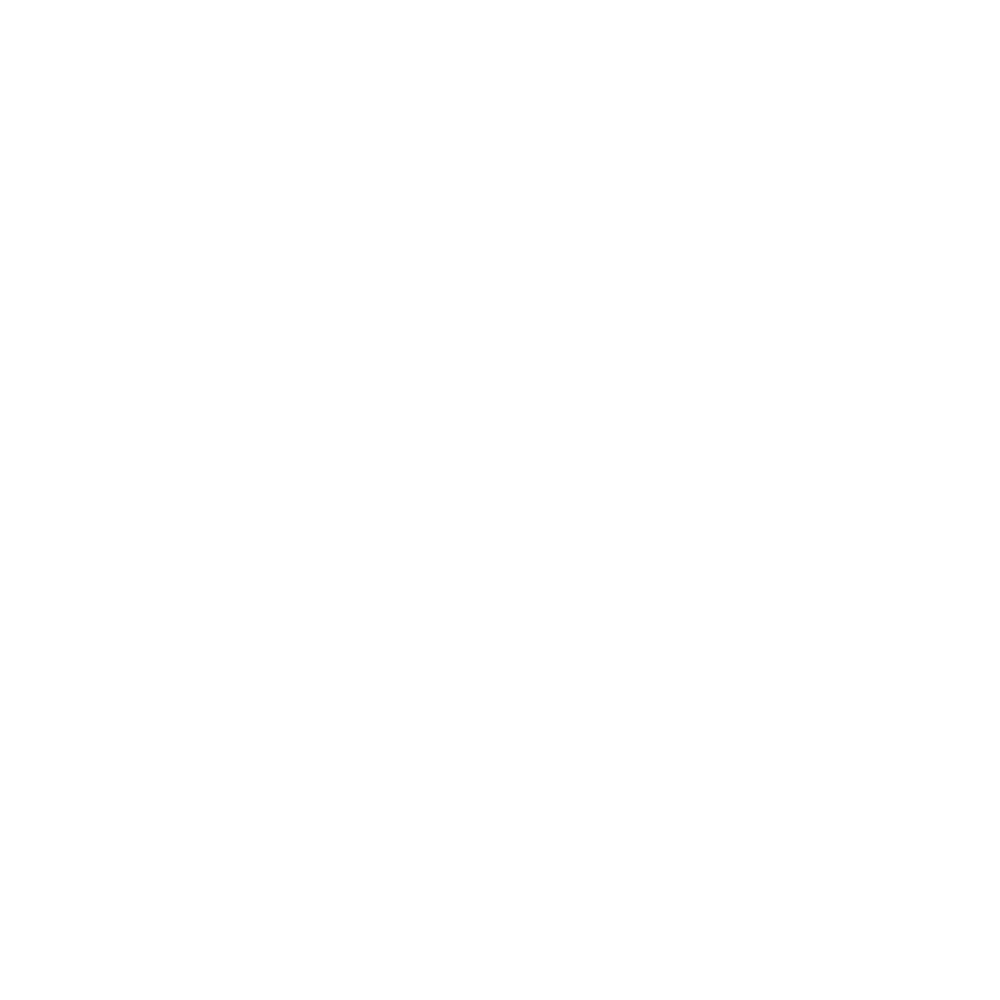

<IPython.core.display.Javascript object>


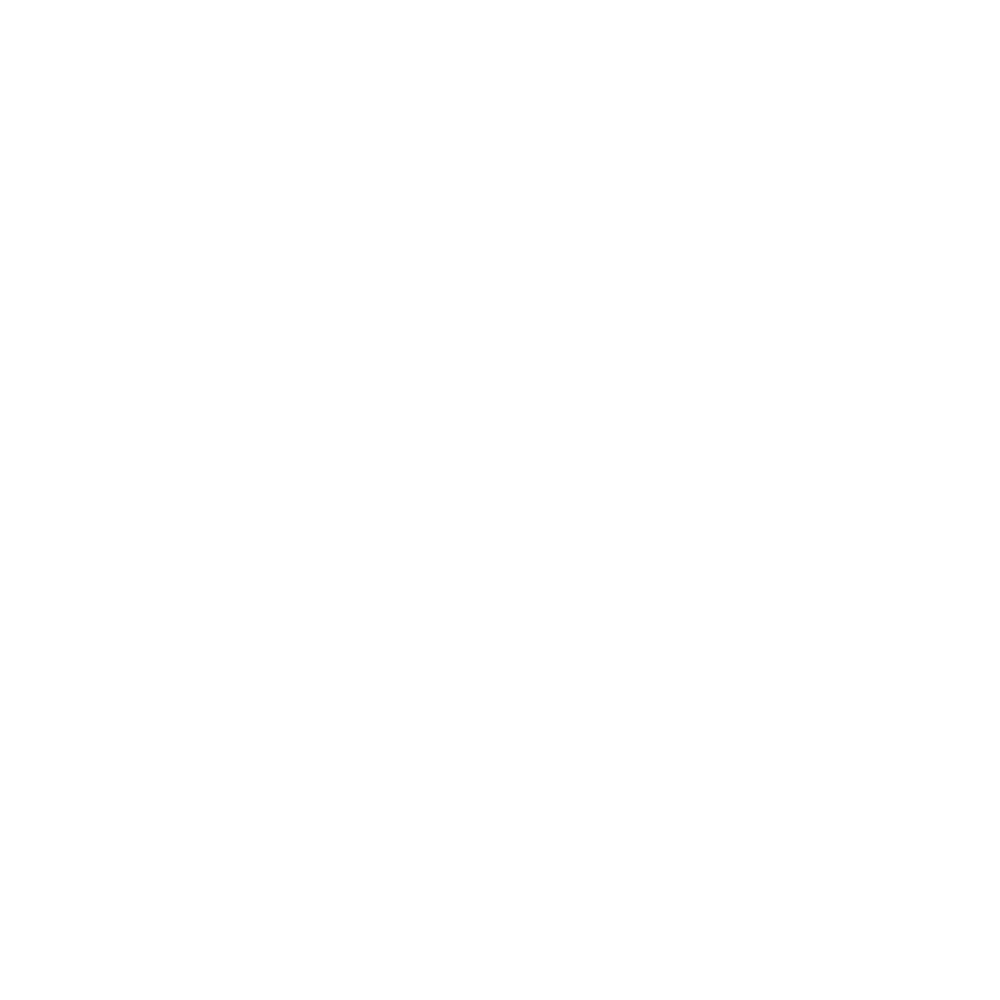

<IPython.core.display.Javascript object>


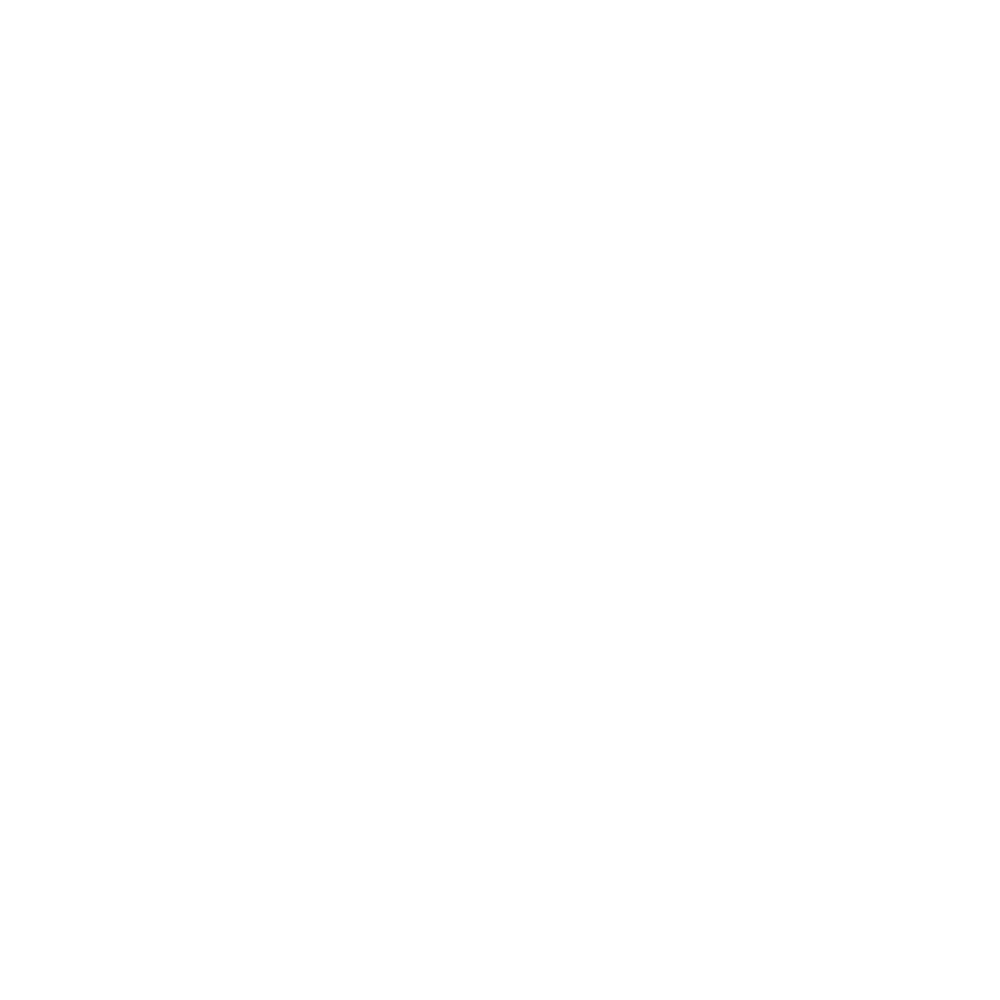

<IPython.core.display.Javascript object>


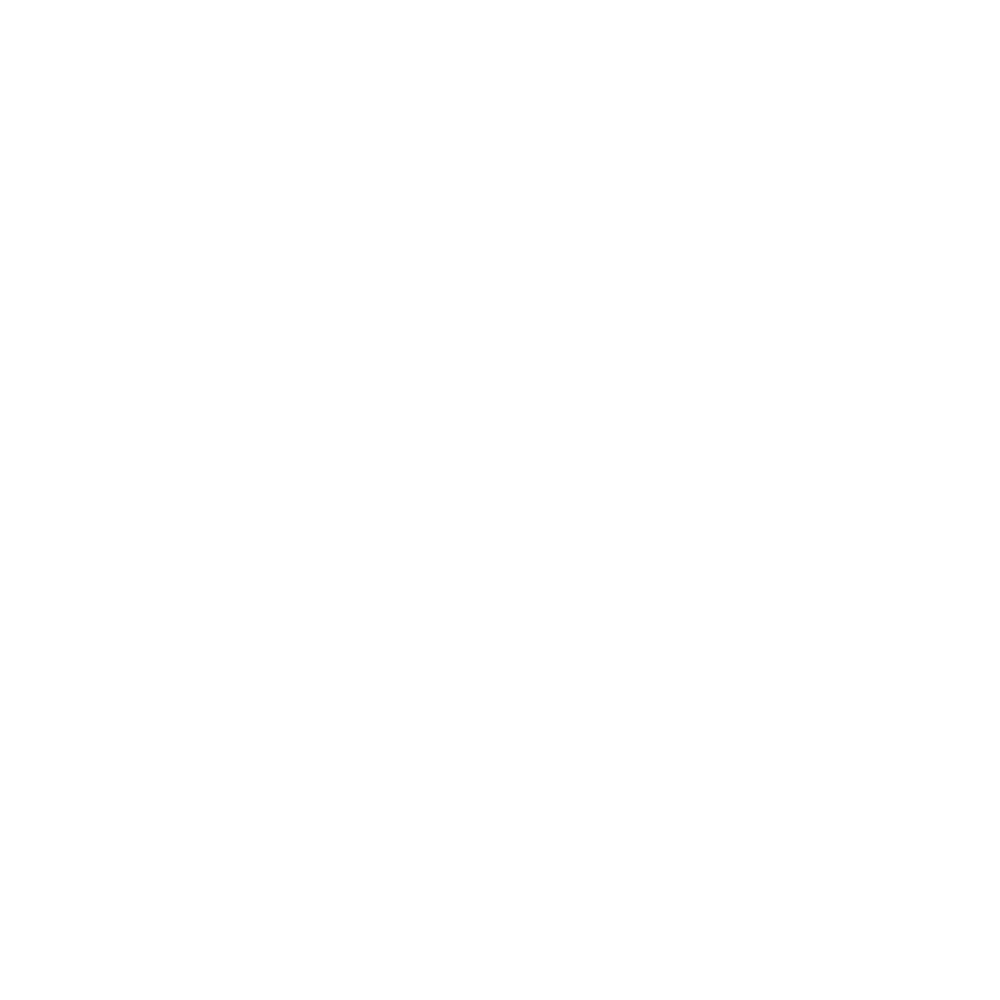

<IPython.core.display.Javascript object>


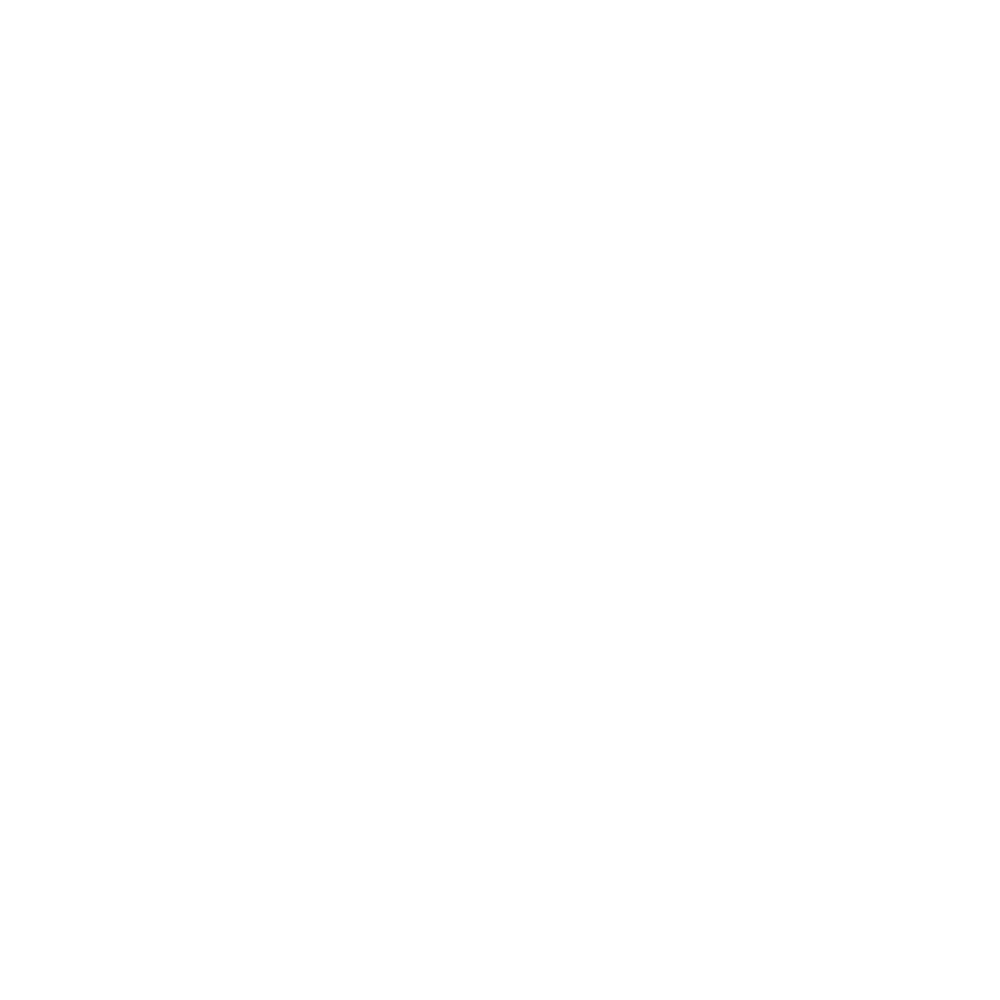

<IPython.core.display.Javascript object>


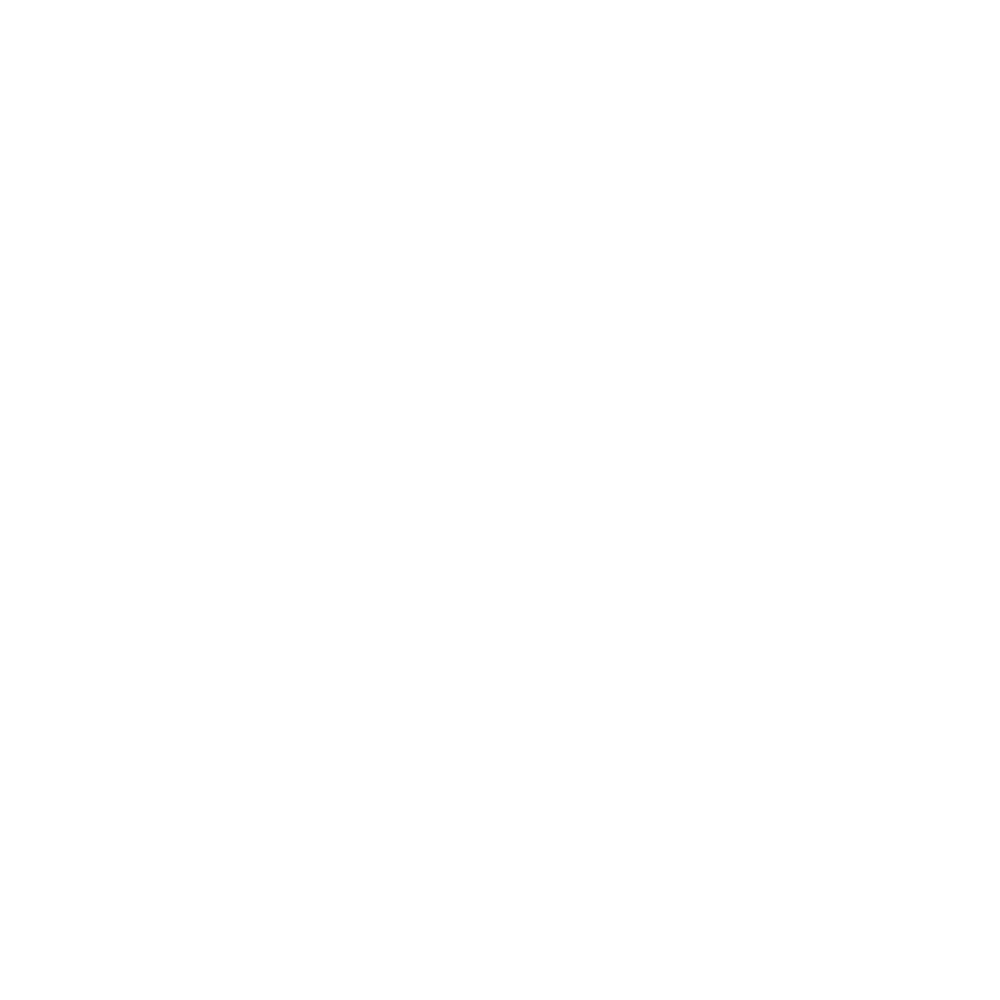

<IPython.core.display.Javascript object>


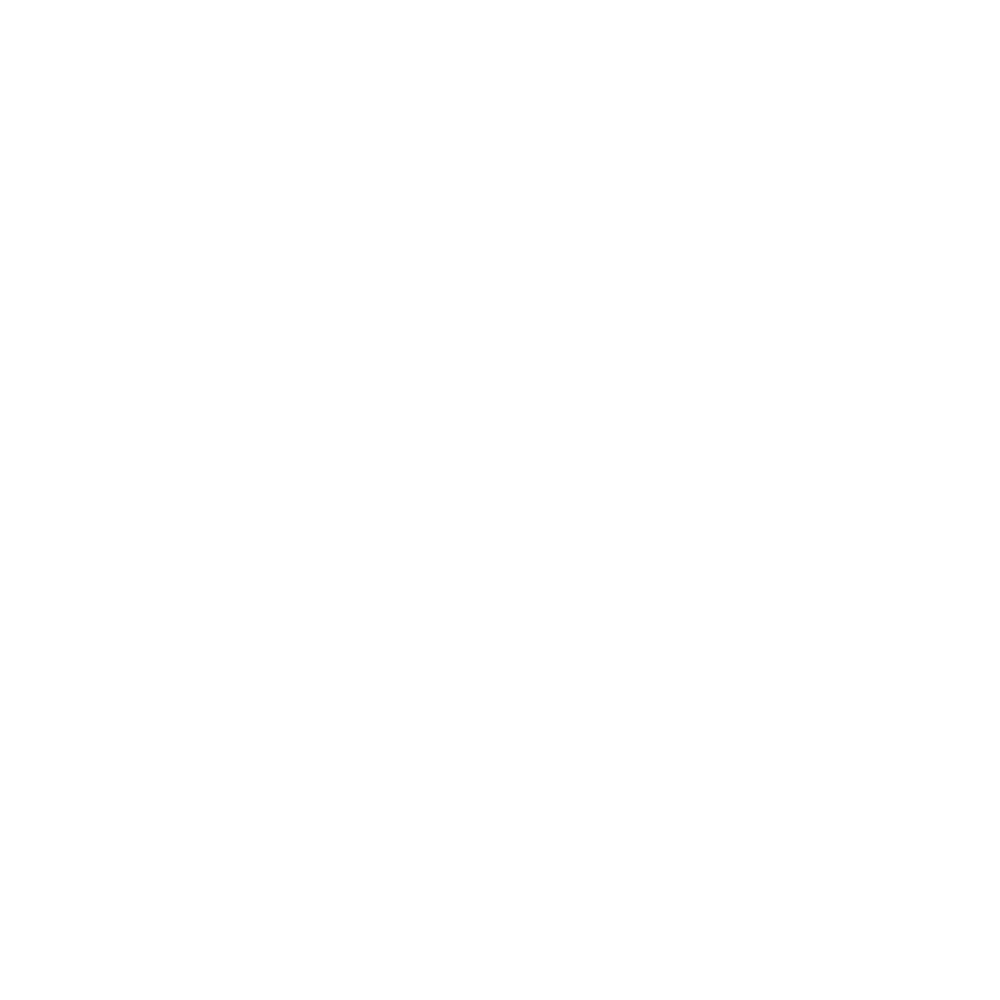

<IPython.core.display.Javascript object>


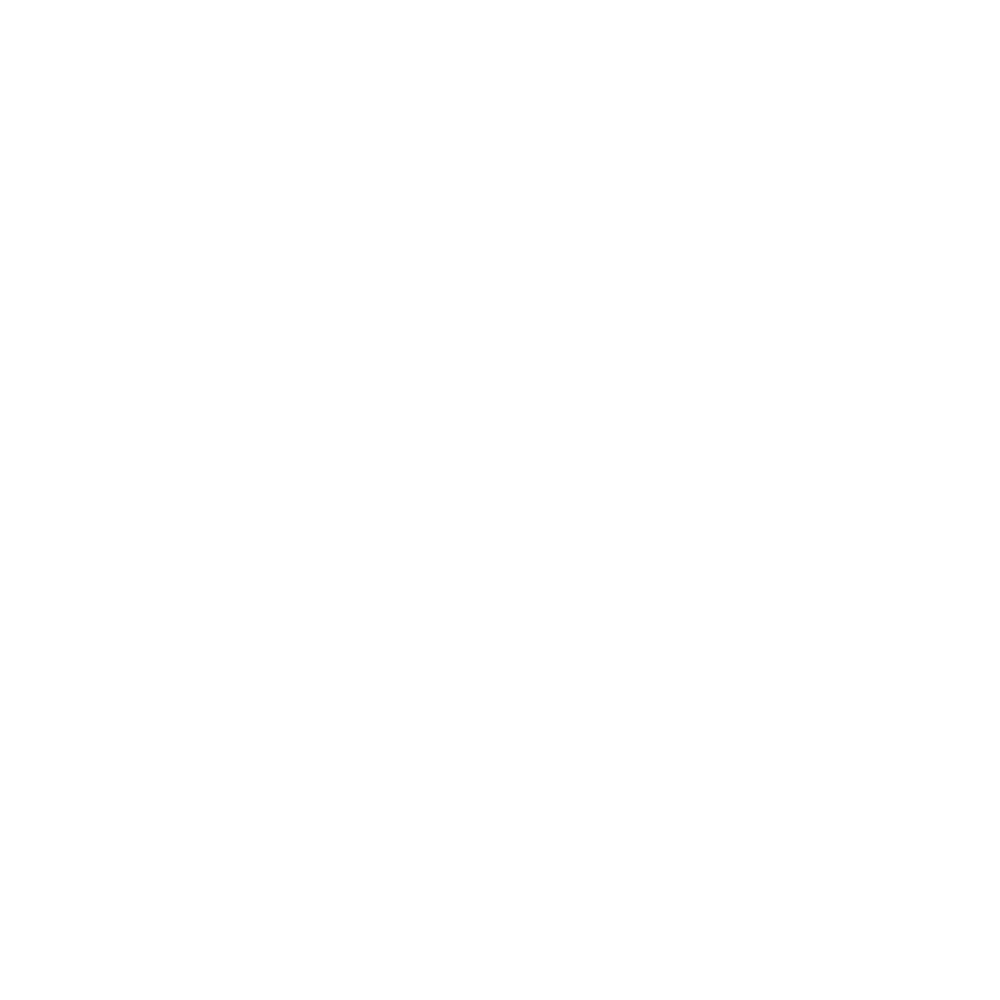

<IPython.core.display.Javascript object>


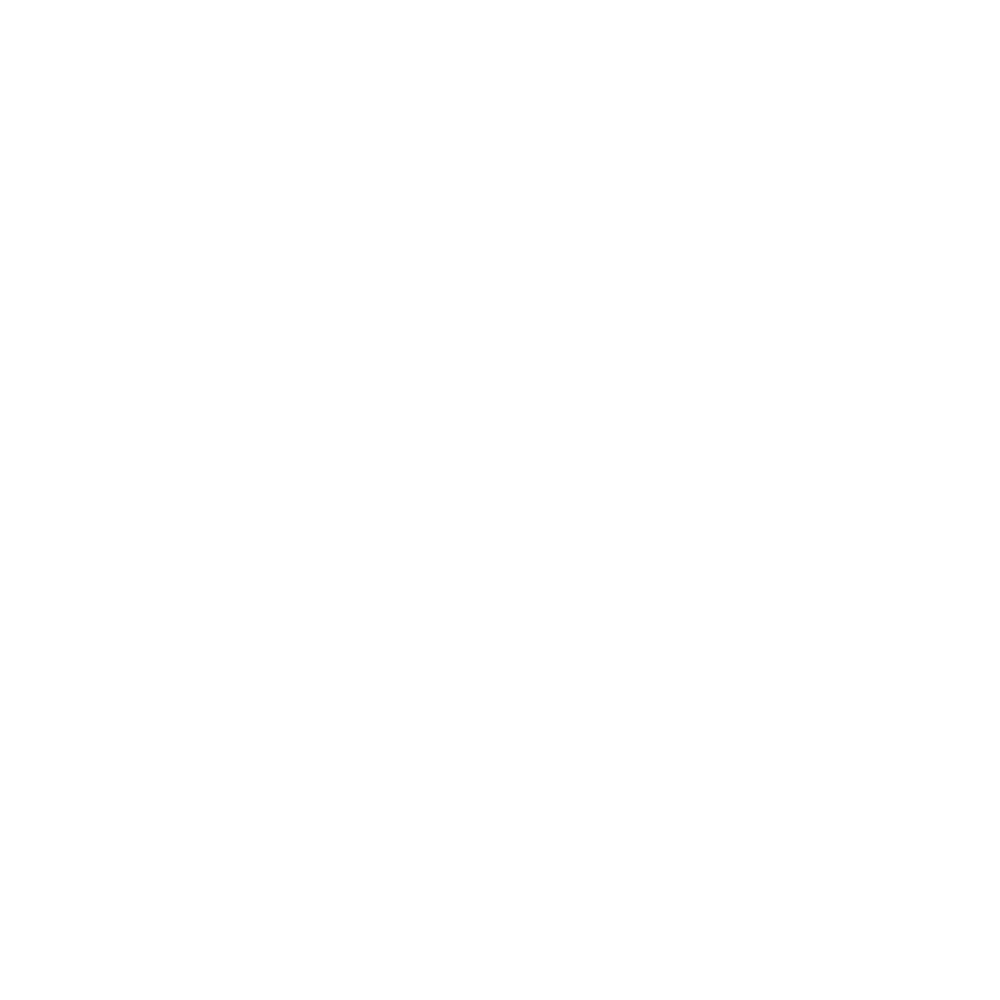

<IPython.core.display.Javascript object>


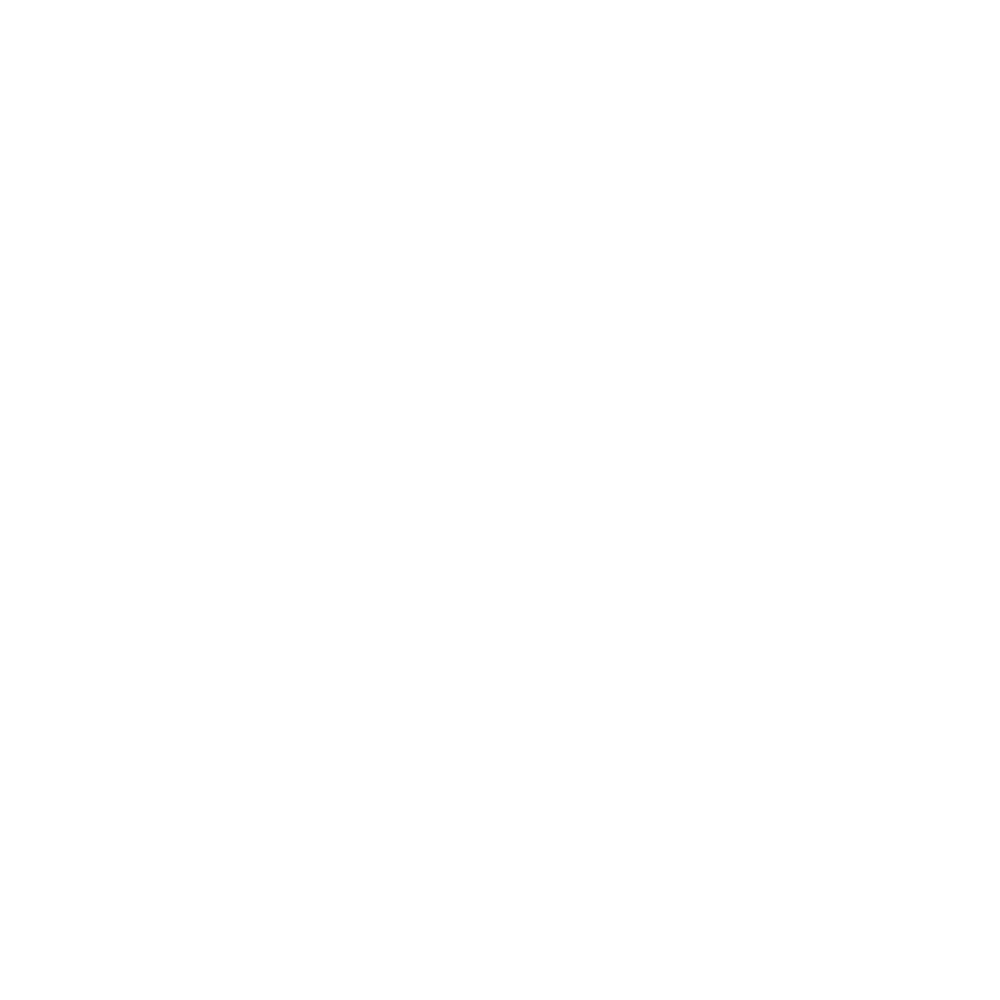

<IPython.core.display.Javascript object>


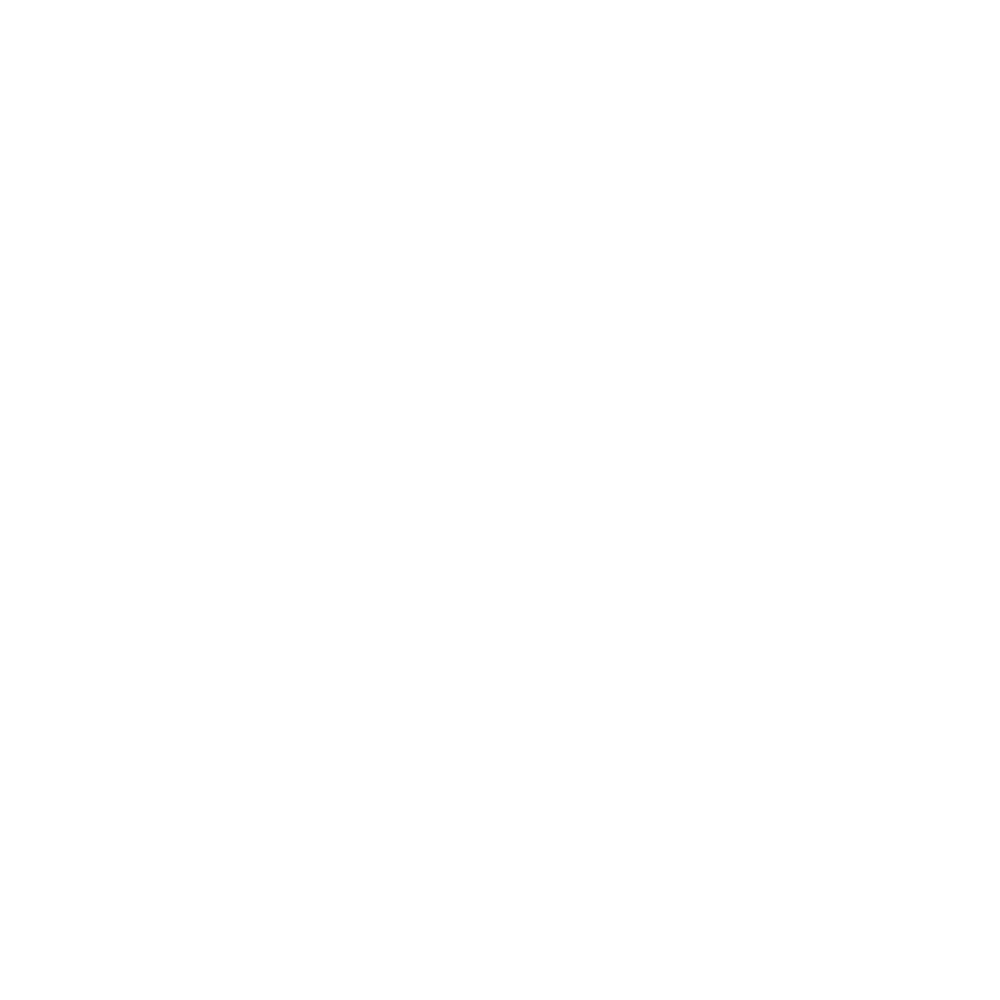

<IPython.core.display.Javascript object>


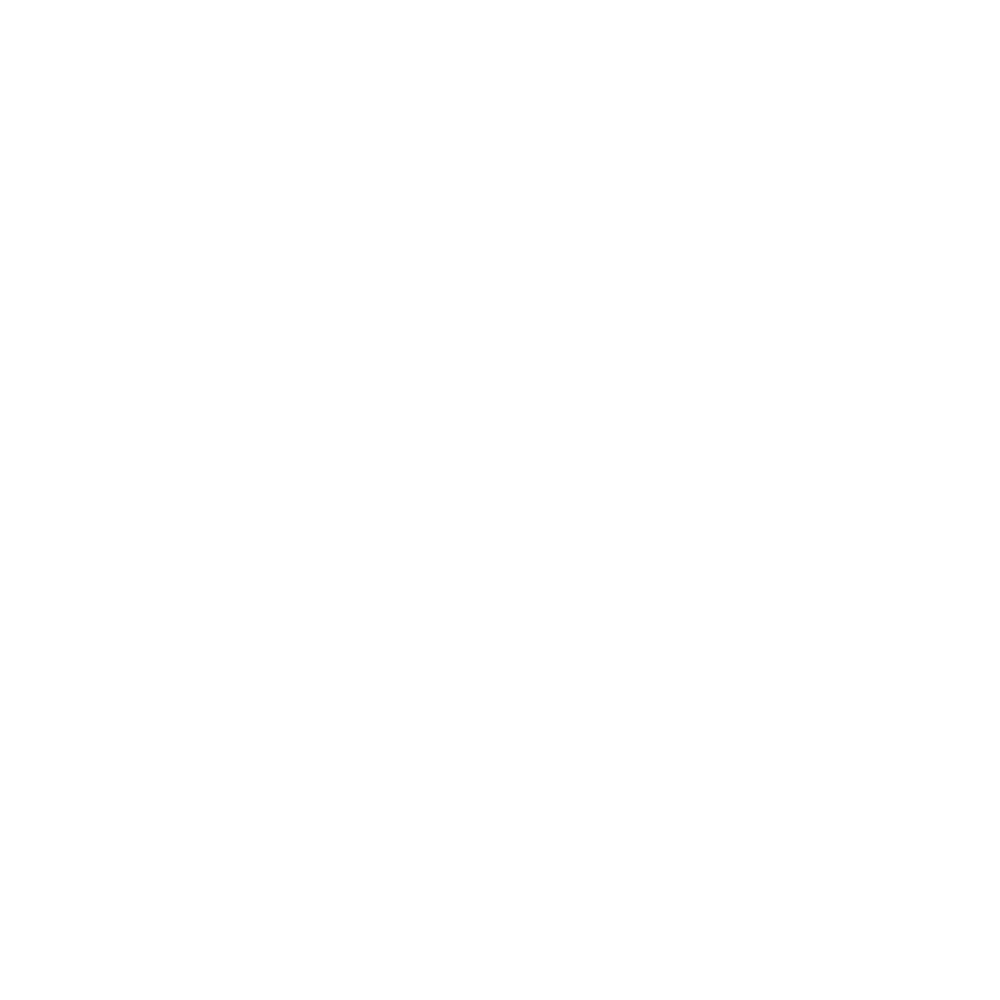

<IPython.core.display.Javascript object>


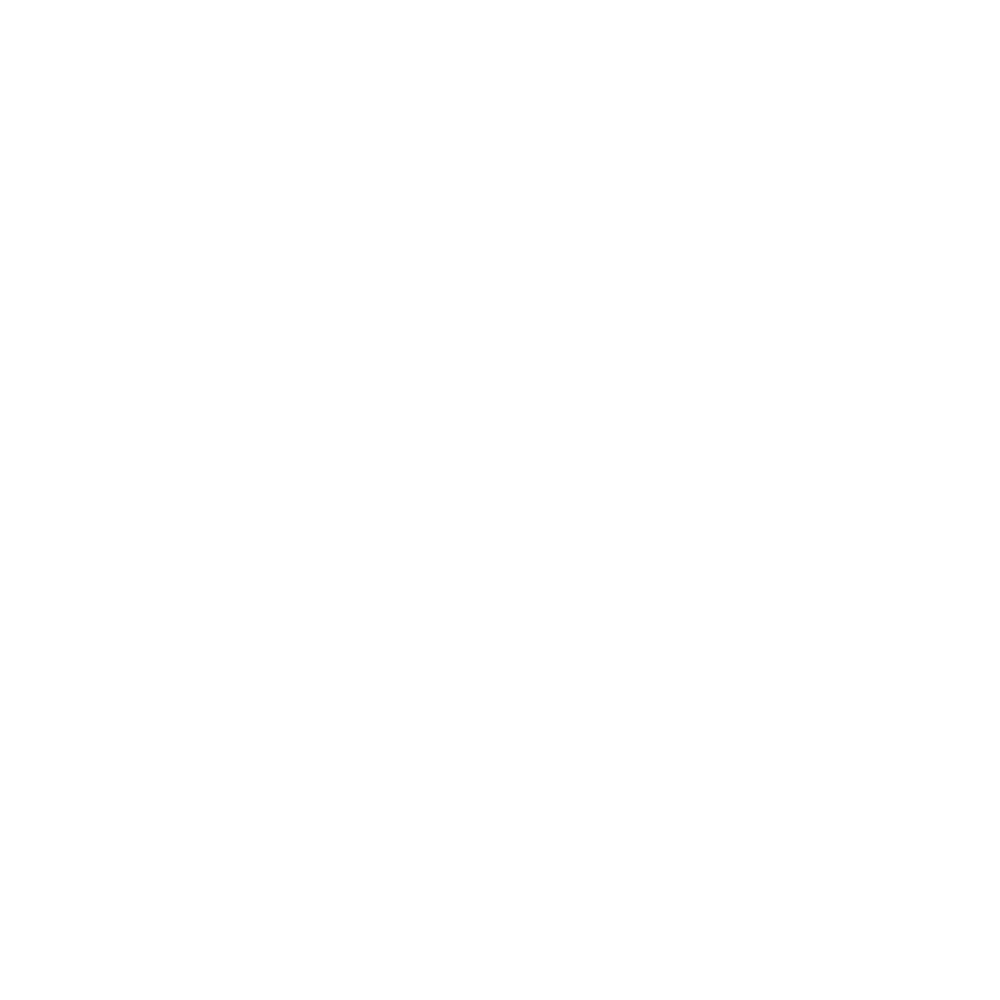

<IPython.core.display.Javascript object>


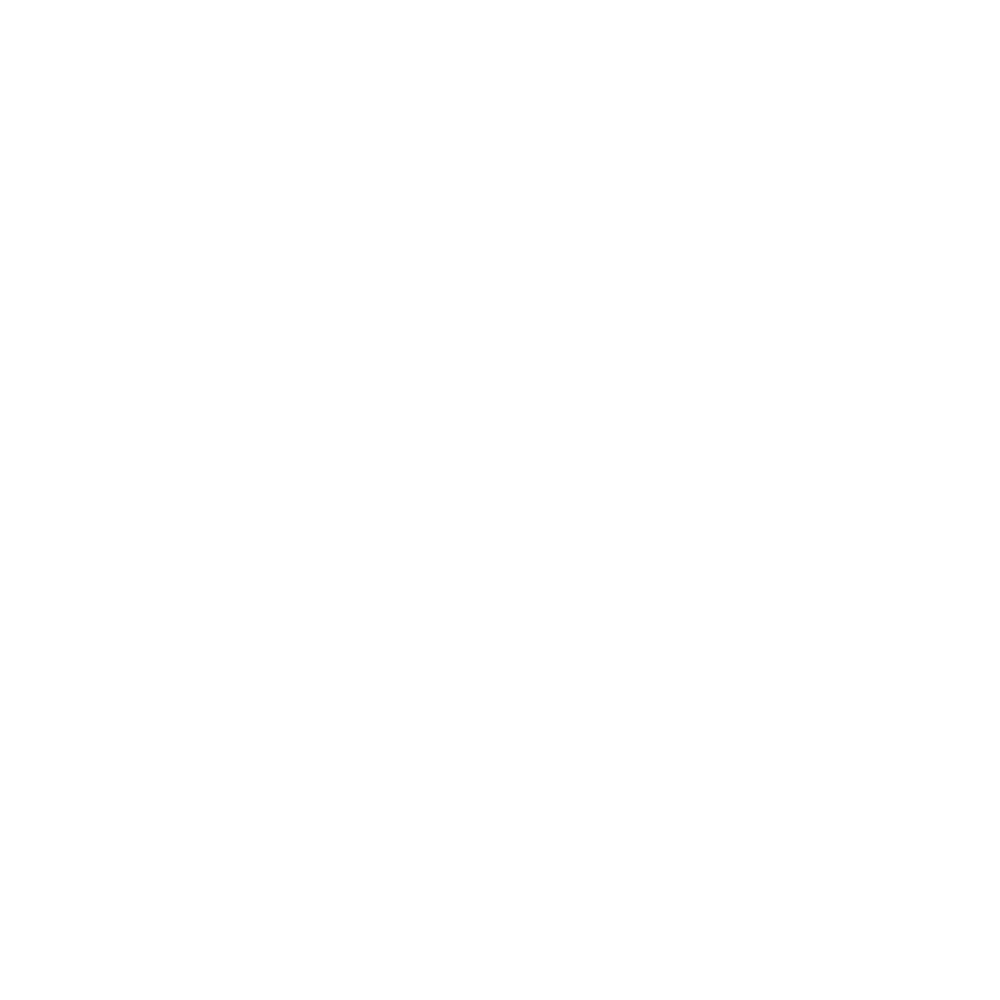

<IPython.core.display.Javascript object>


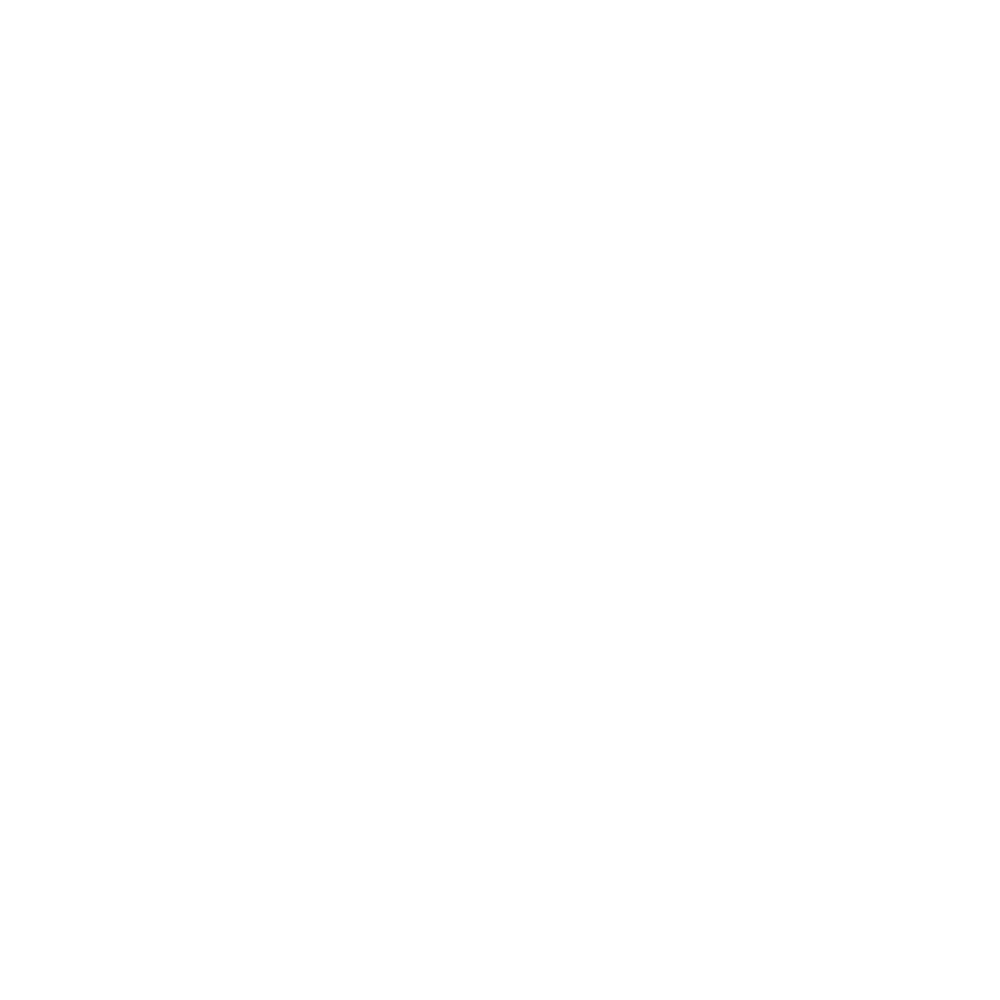

<IPython.core.display.Javascript object>


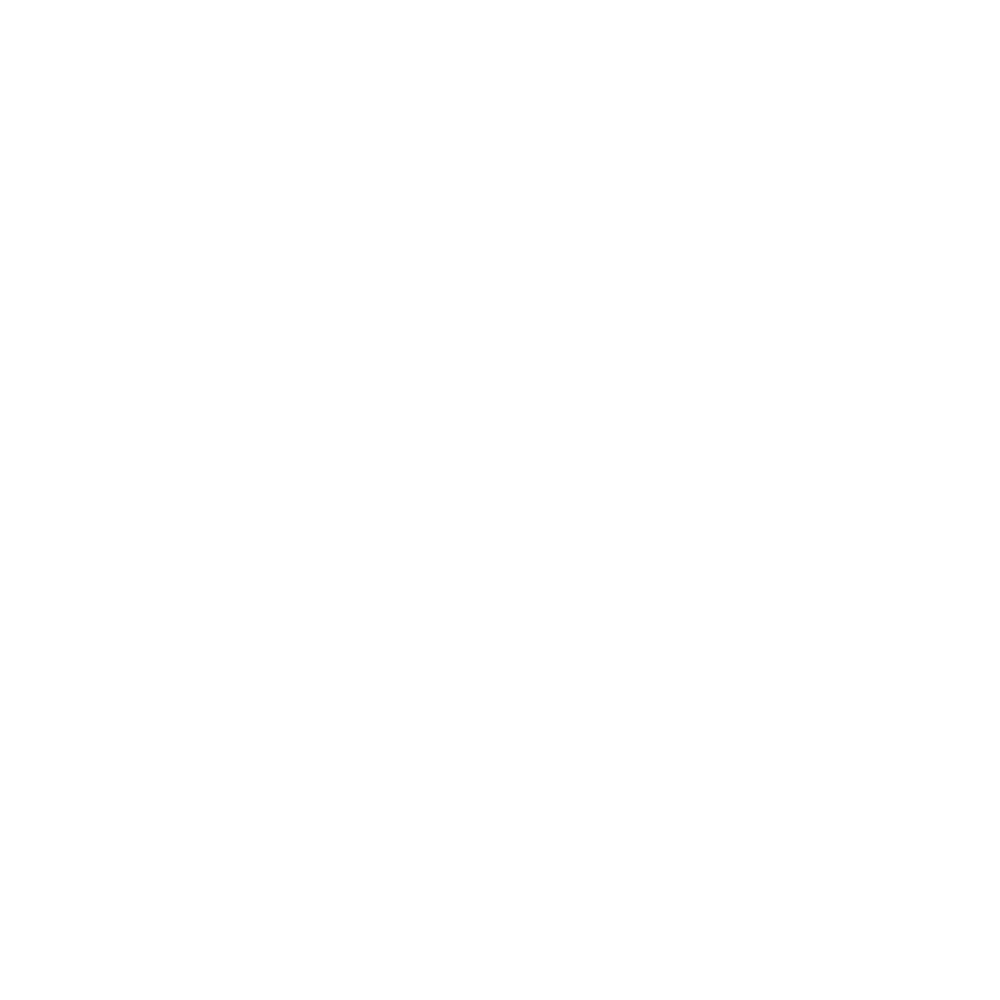

<IPython.core.display.Javascript object>


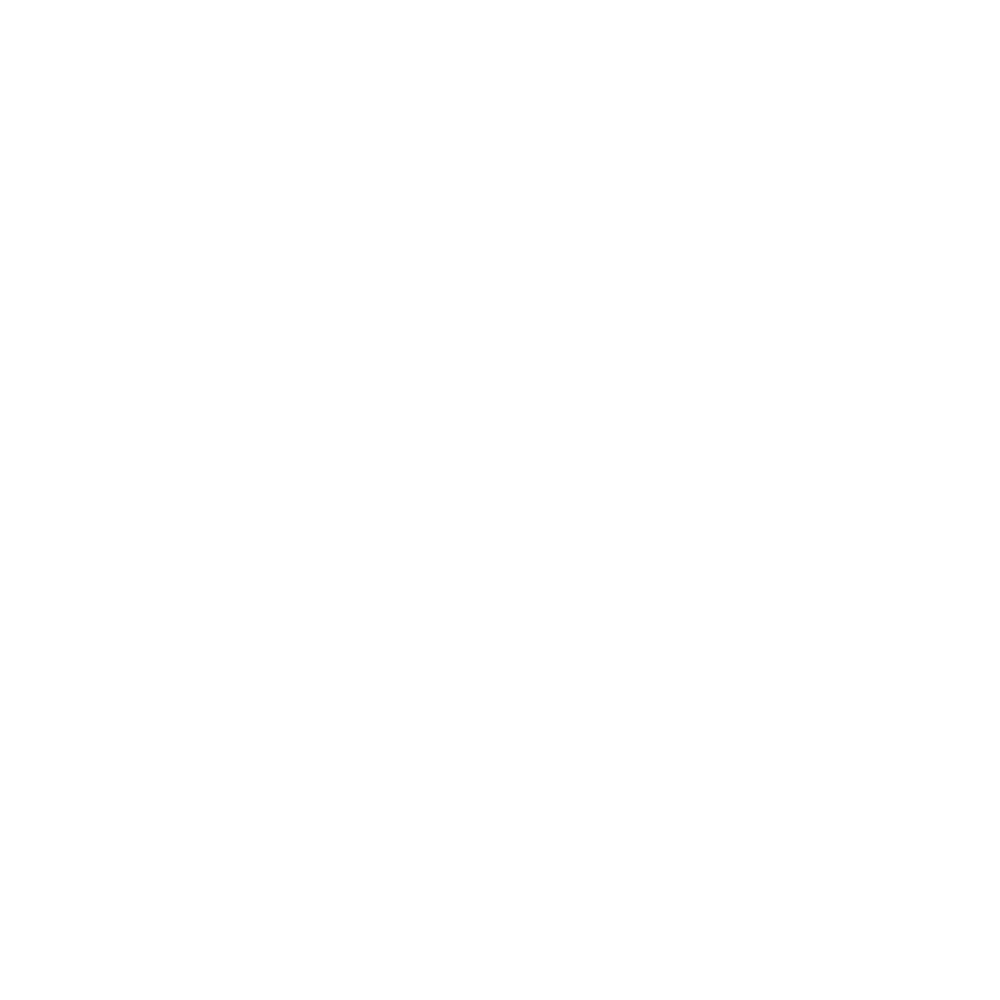

<IPython.core.display.Javascript object>


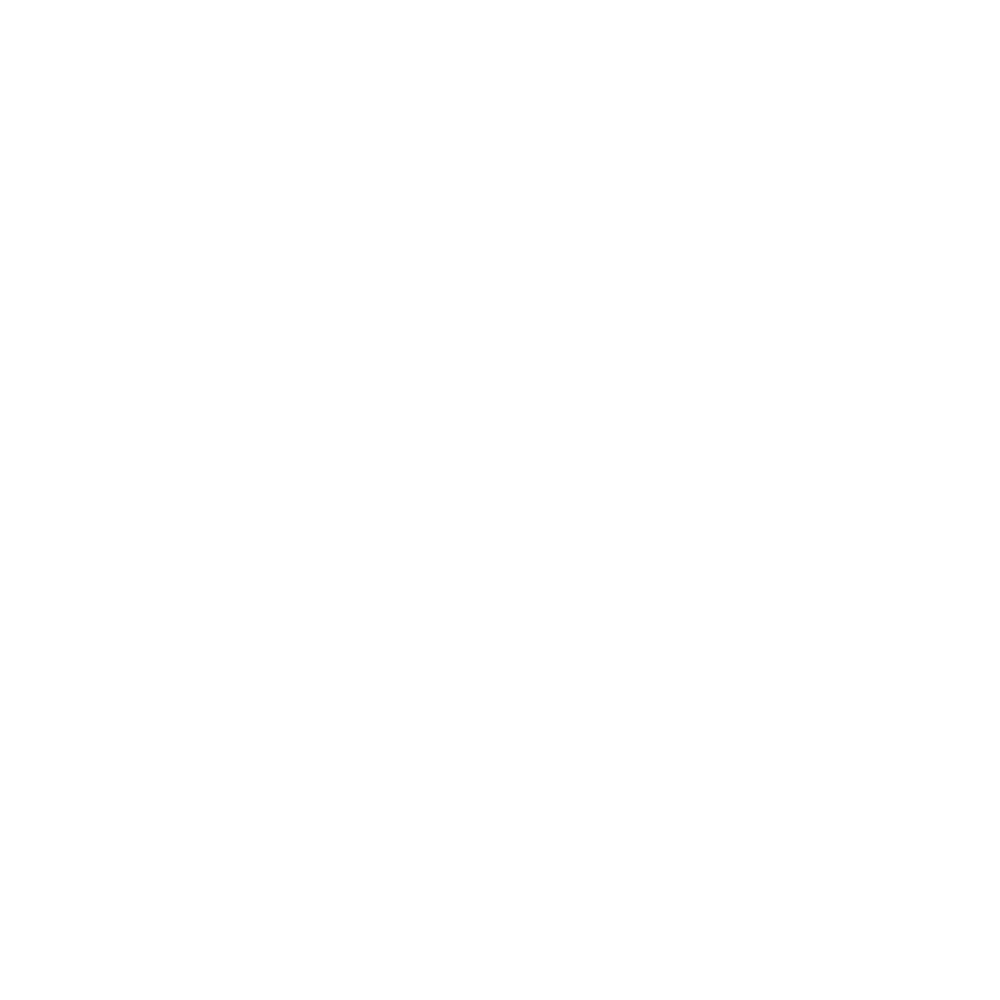

<IPython.core.display.Javascript object>


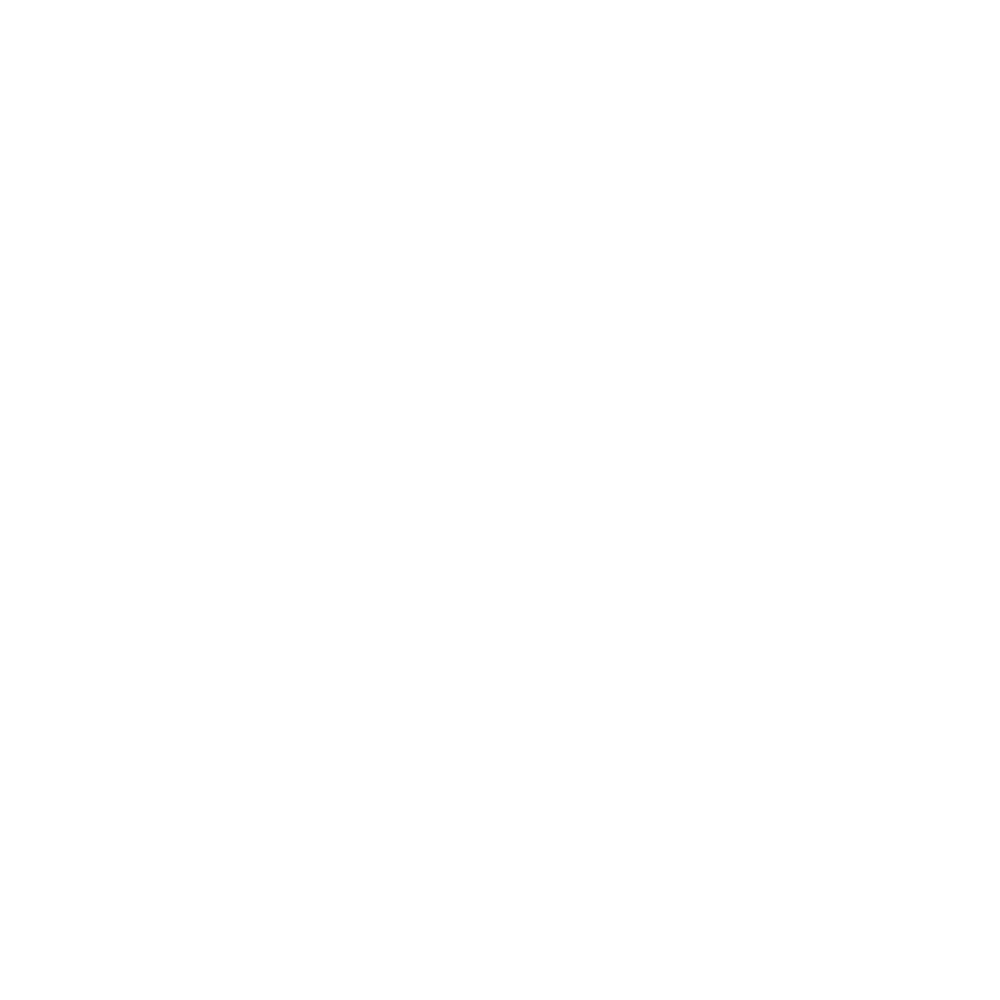

<IPython.core.display.Javascript object>


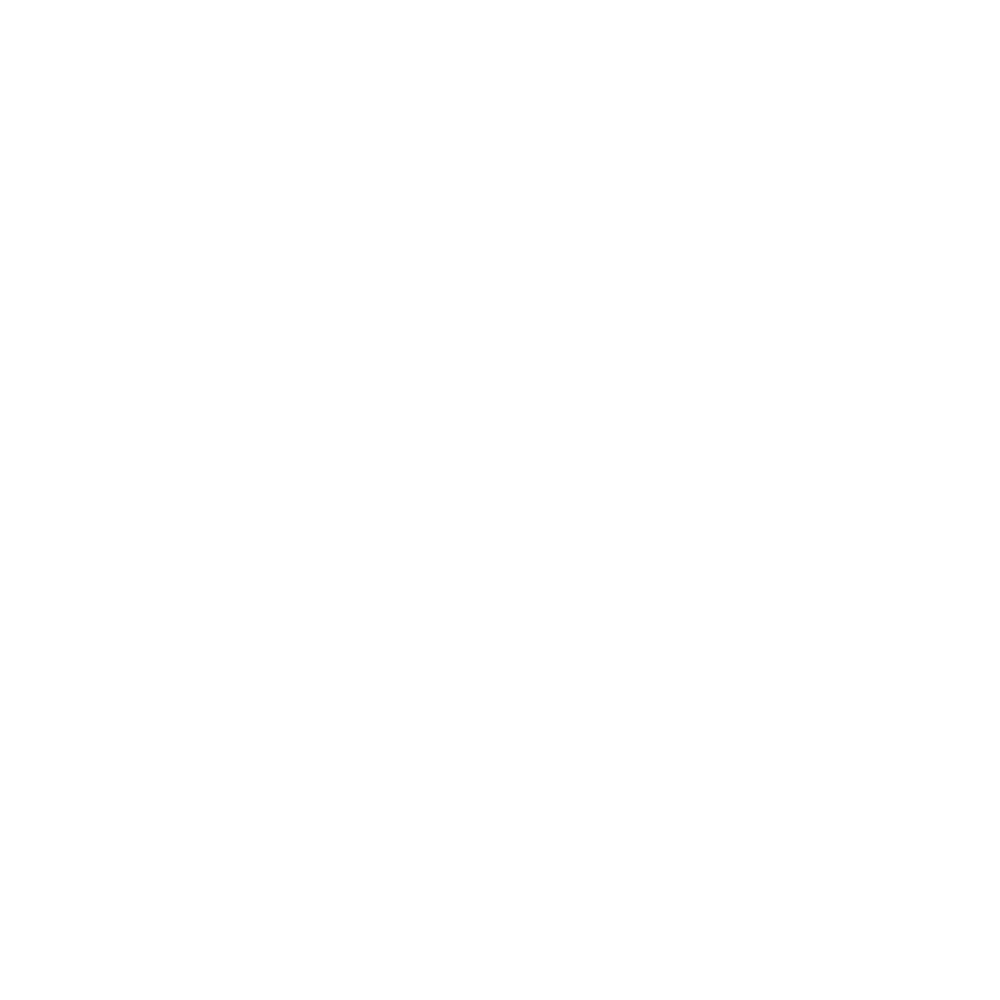

<IPython.core.display.Javascript object>


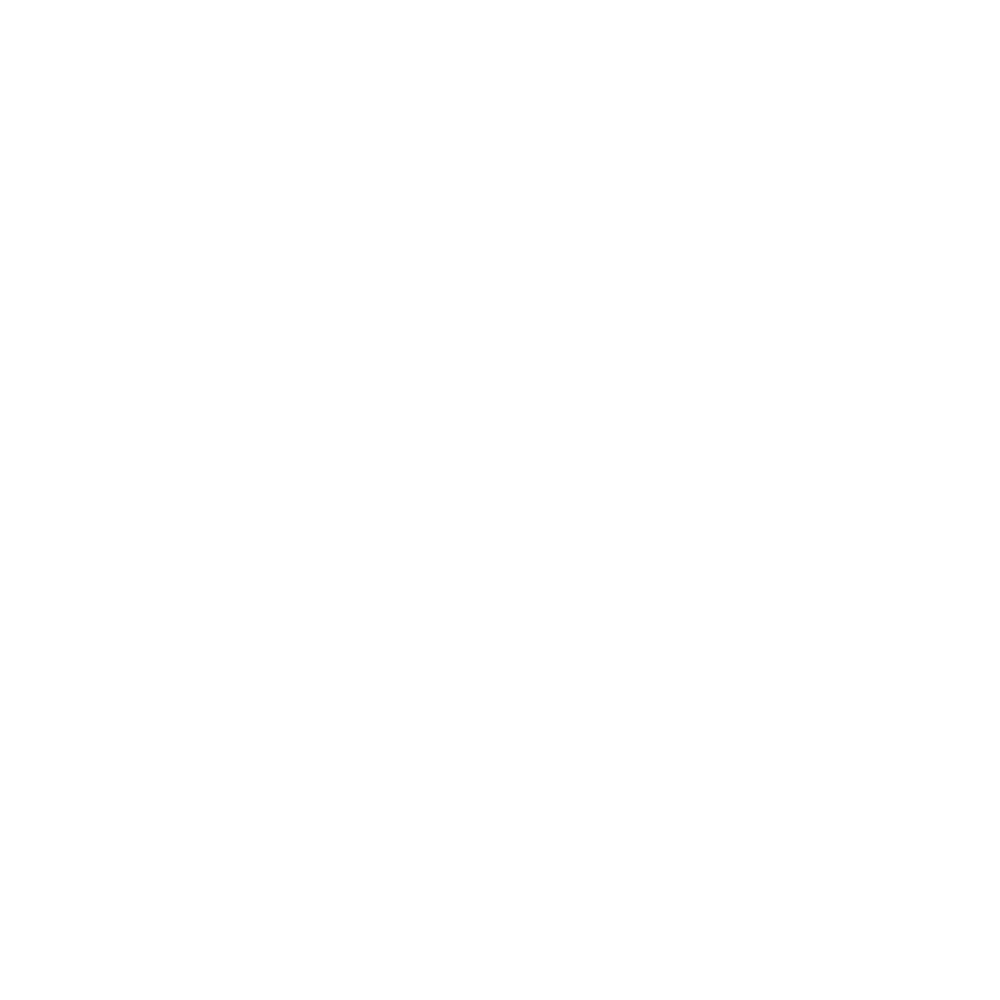

<IPython.core.display.Javascript object>


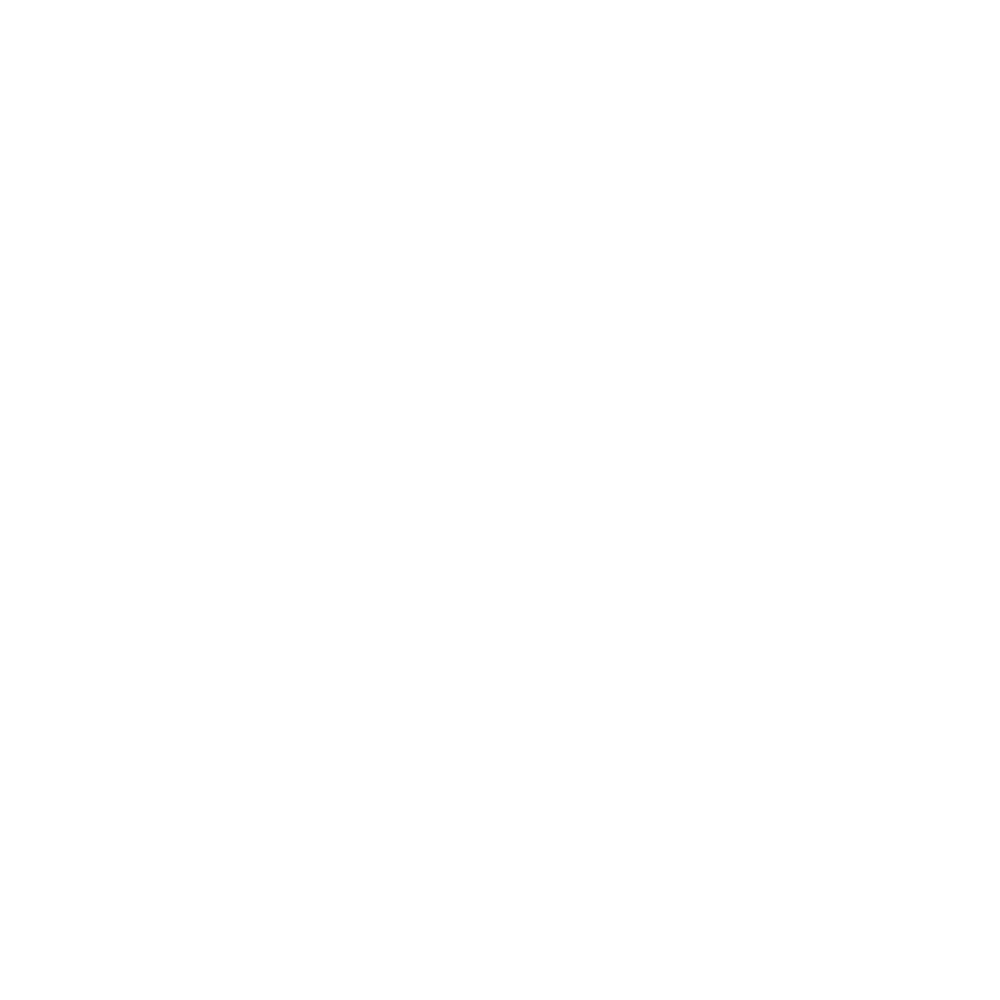

<IPython.core.display.Javascript object>


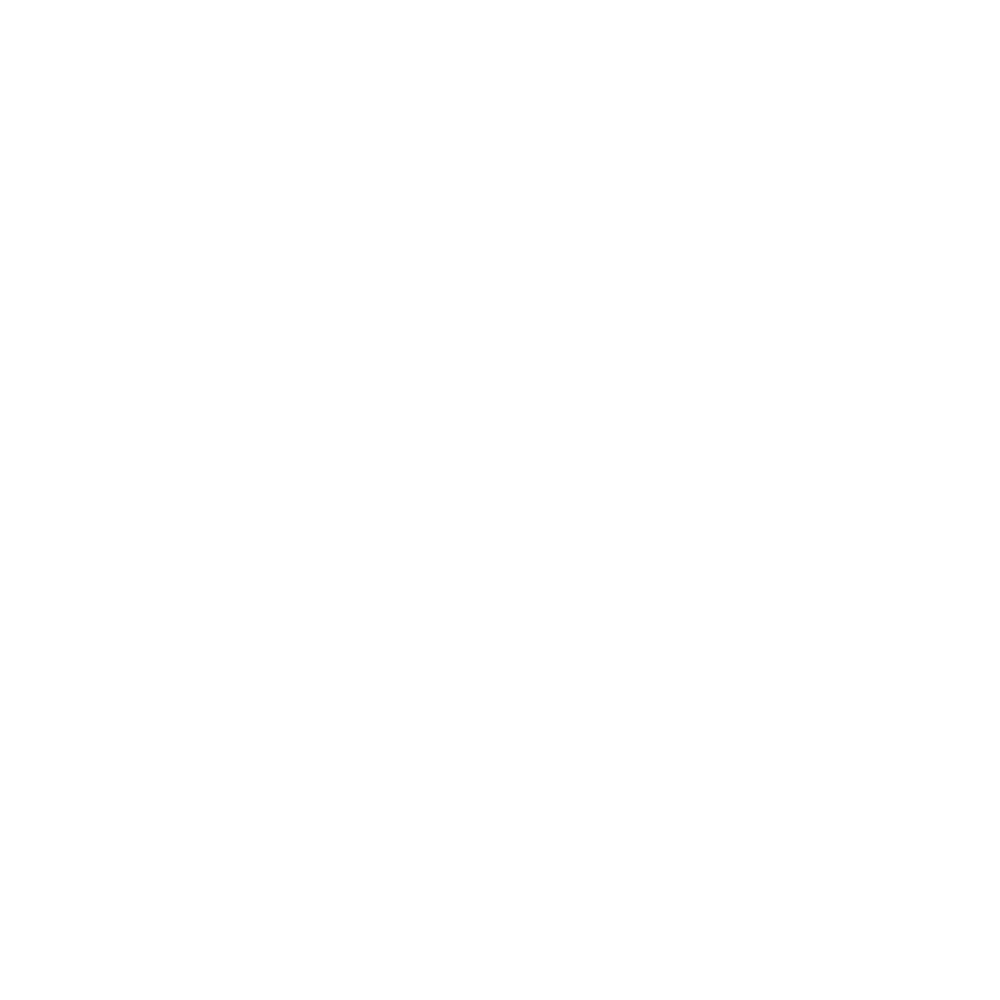

<IPython.core.display.Javascript object>


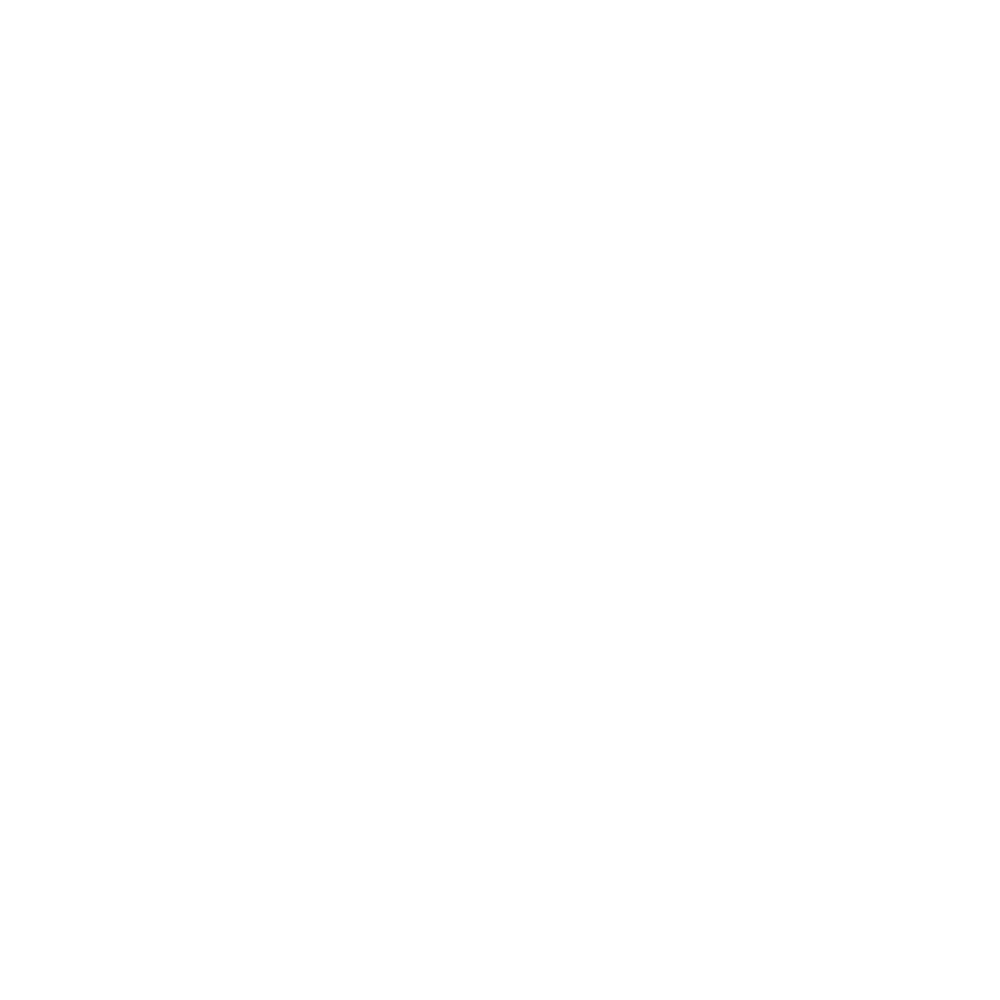

<IPython.core.display.Javascript object>


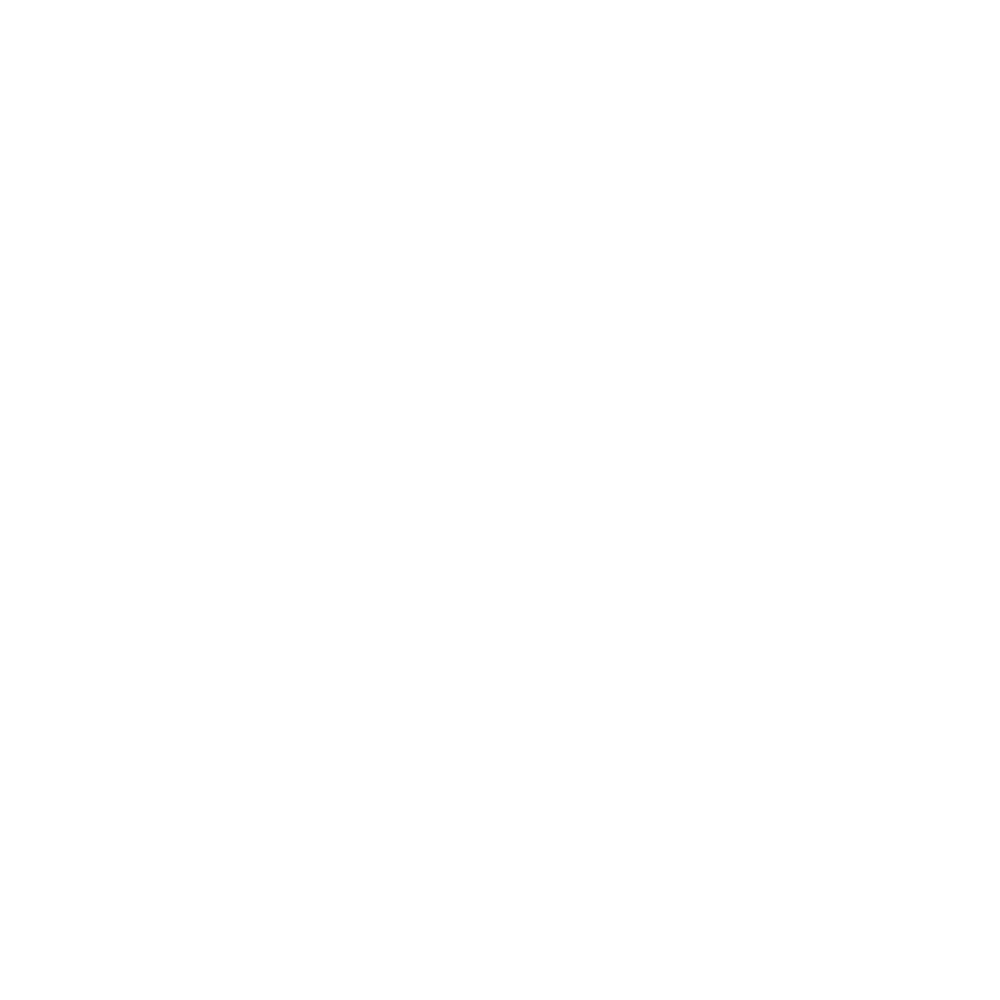

<IPython.core.display.Javascript object>


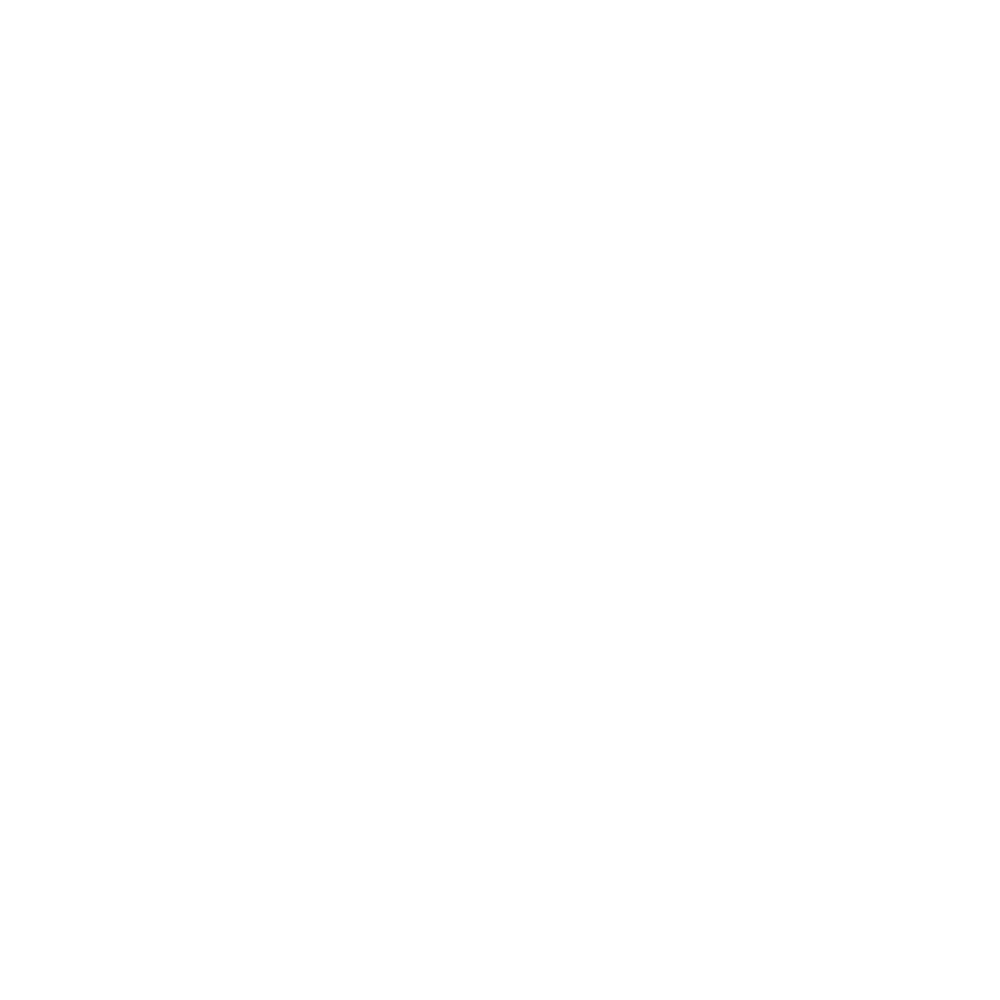

<IPython.core.display.Javascript object>


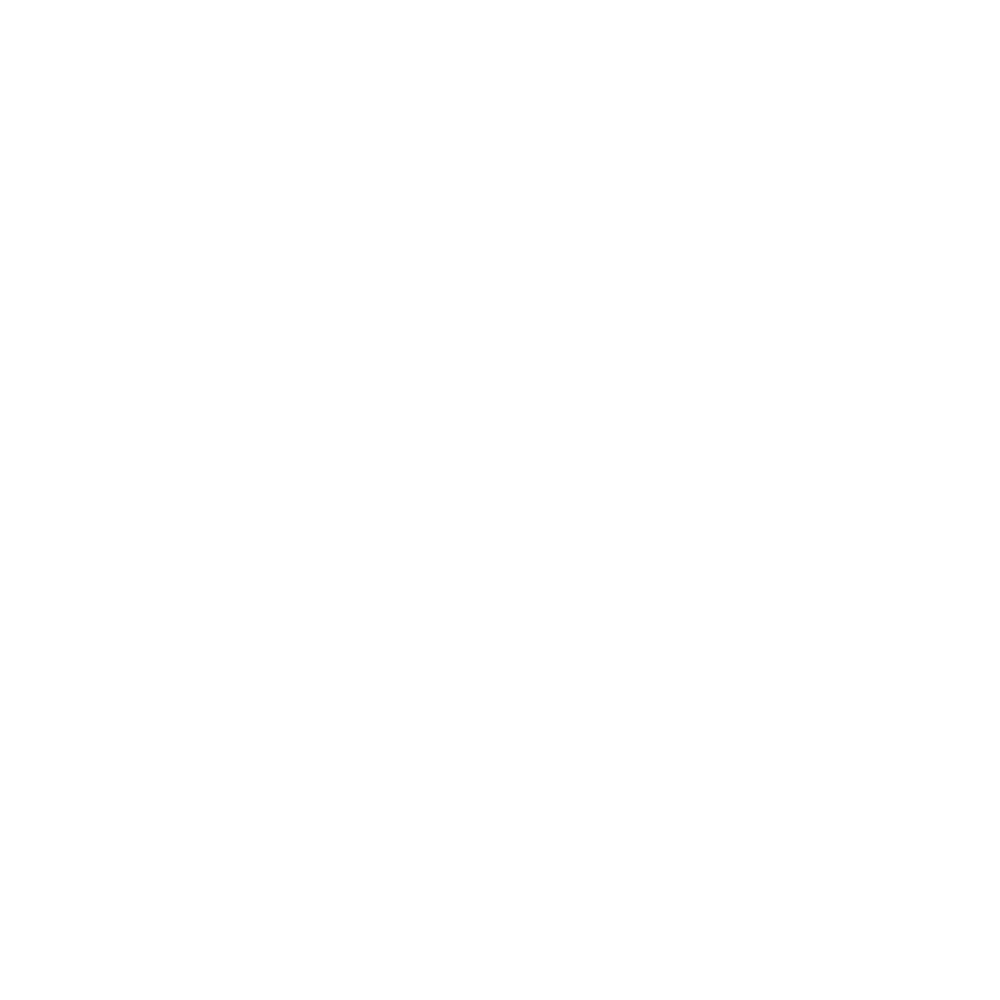

<IPython.core.display.Javascript object>


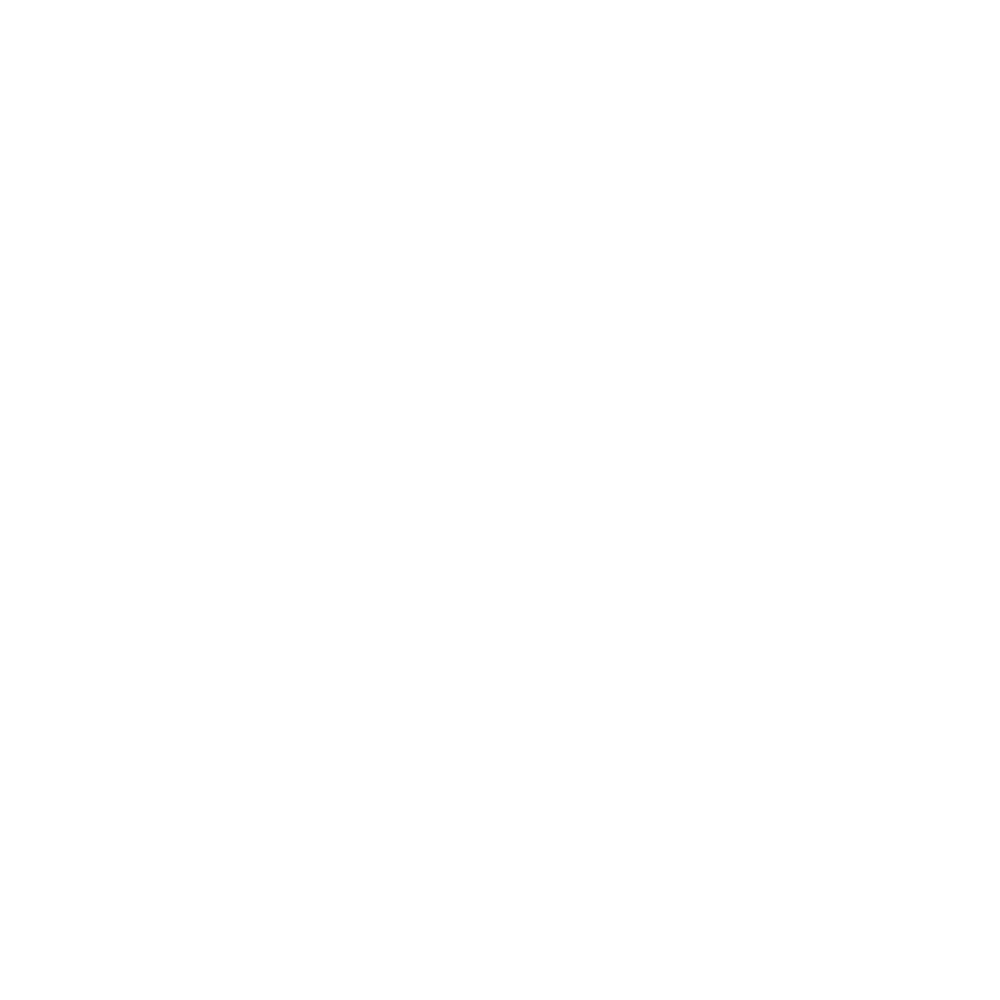

<IPython.core.display.Javascript object>


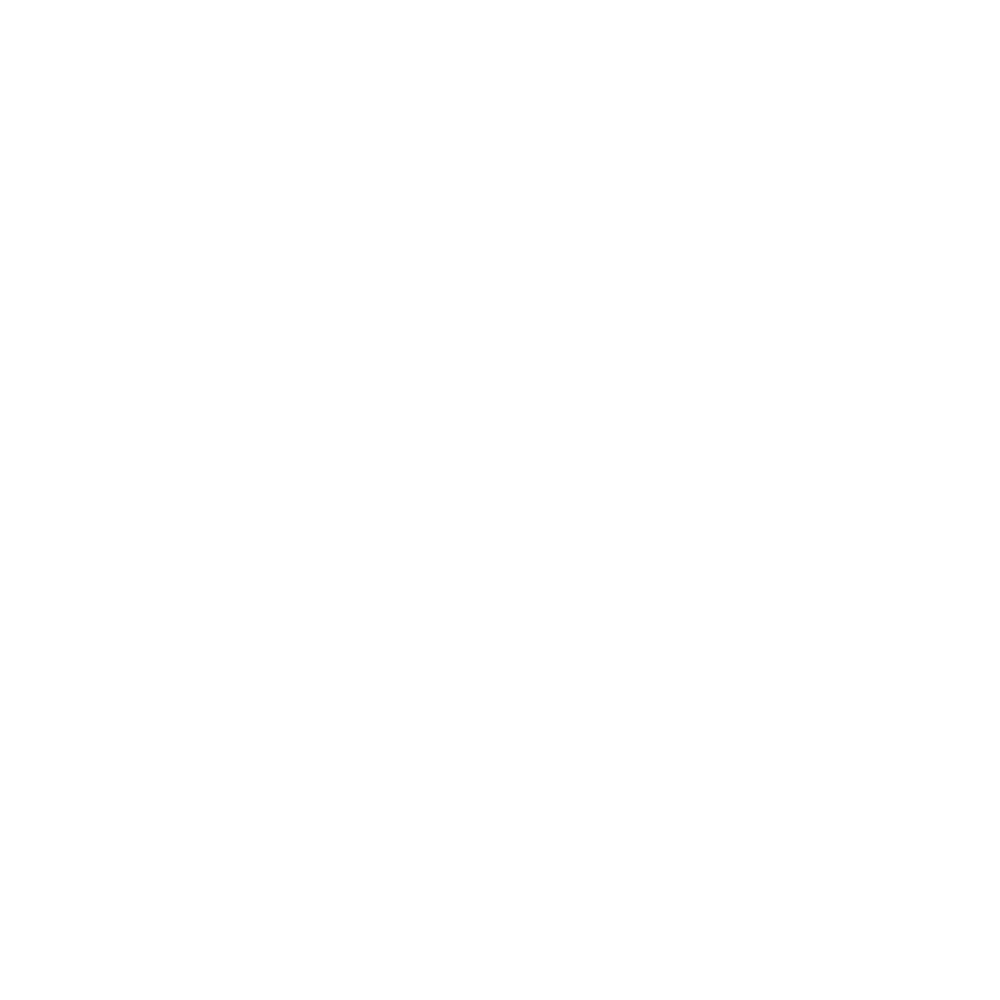

<IPython.core.display.Javascript object>


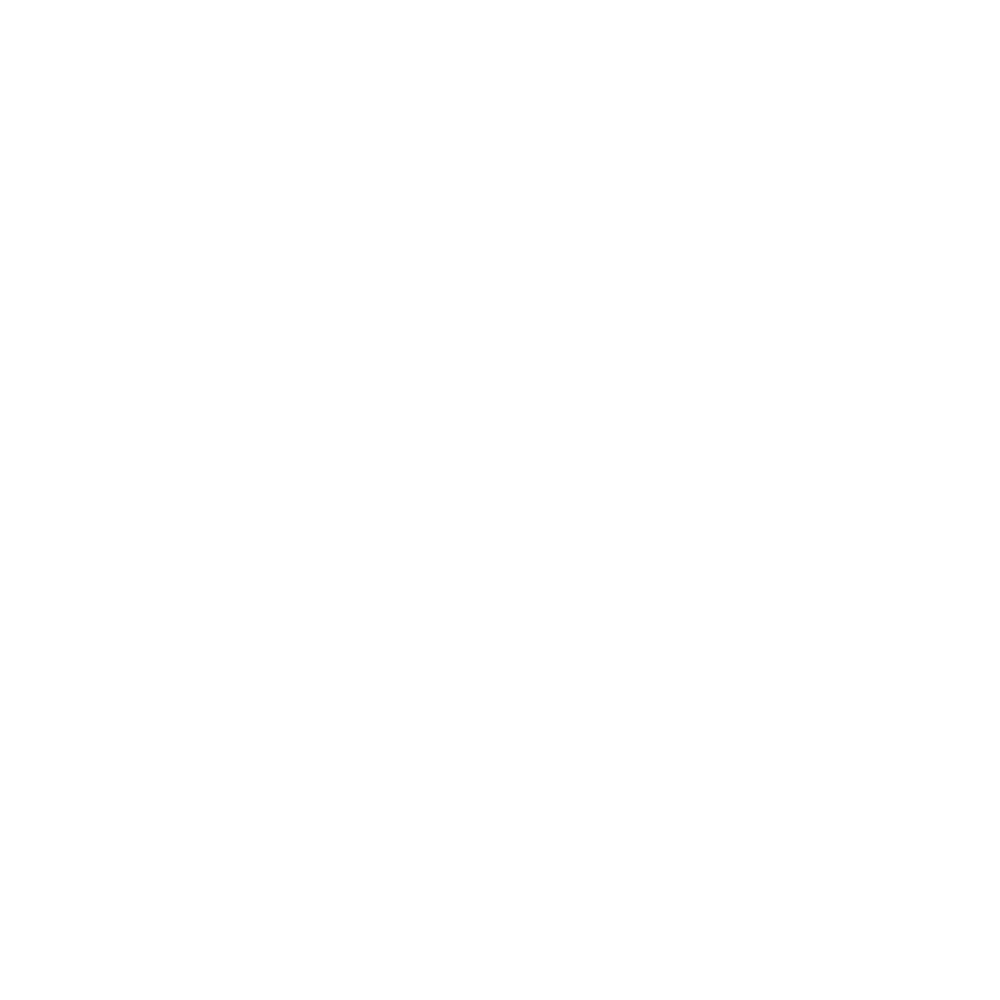

<IPython.core.display.Javascript object>


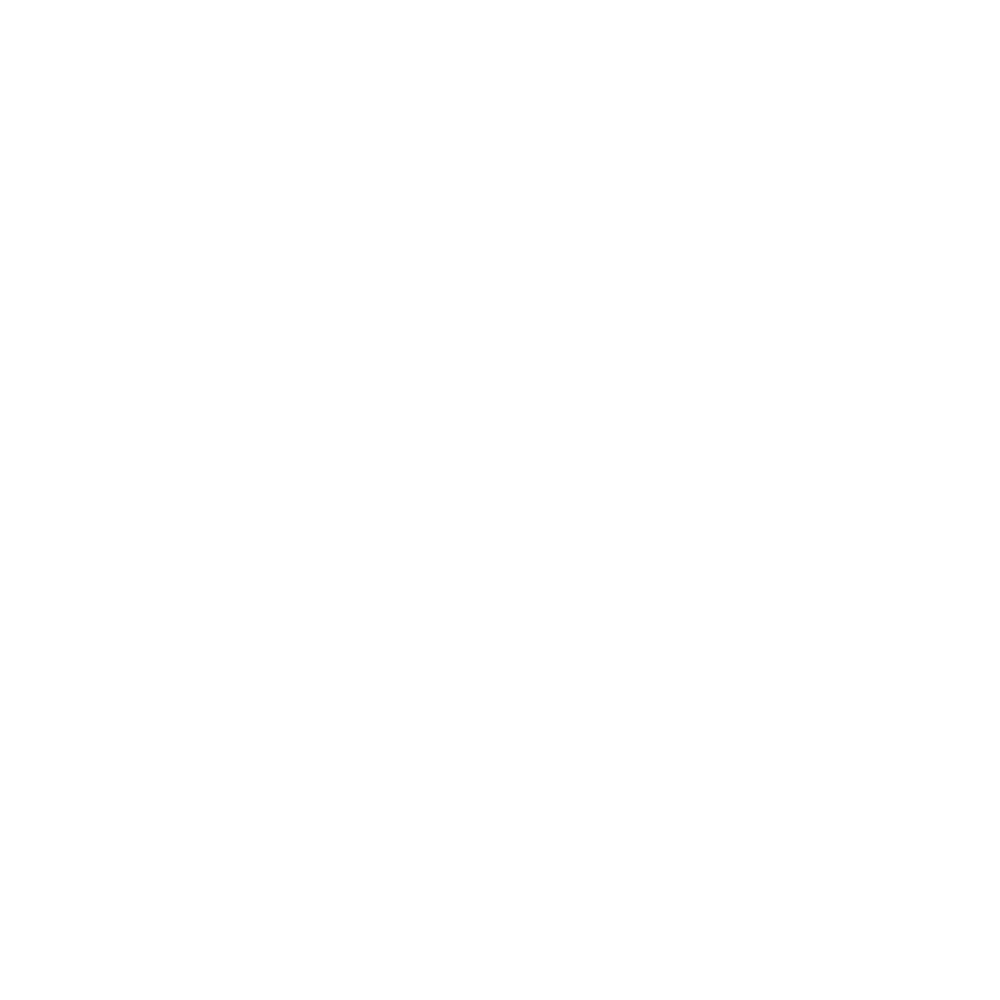

<IPython.core.display.Javascript object>


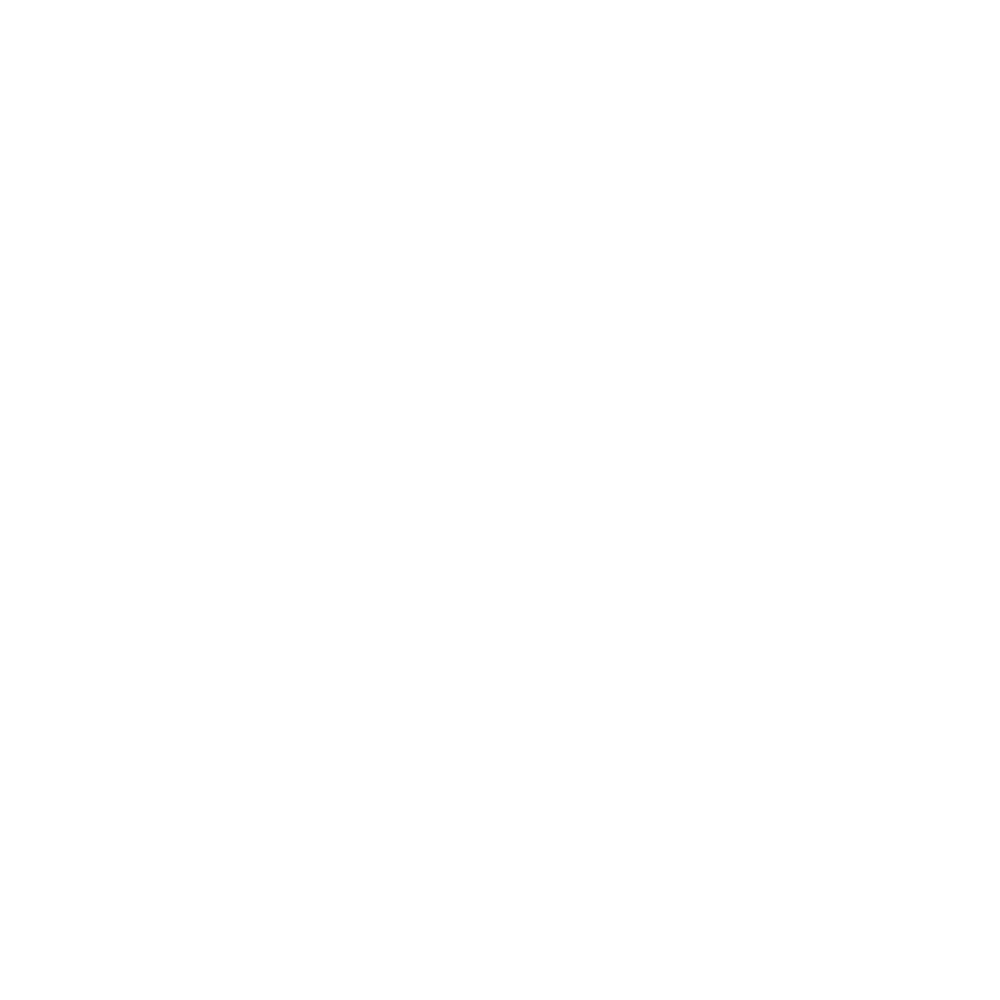

<IPython.core.display.Javascript object>


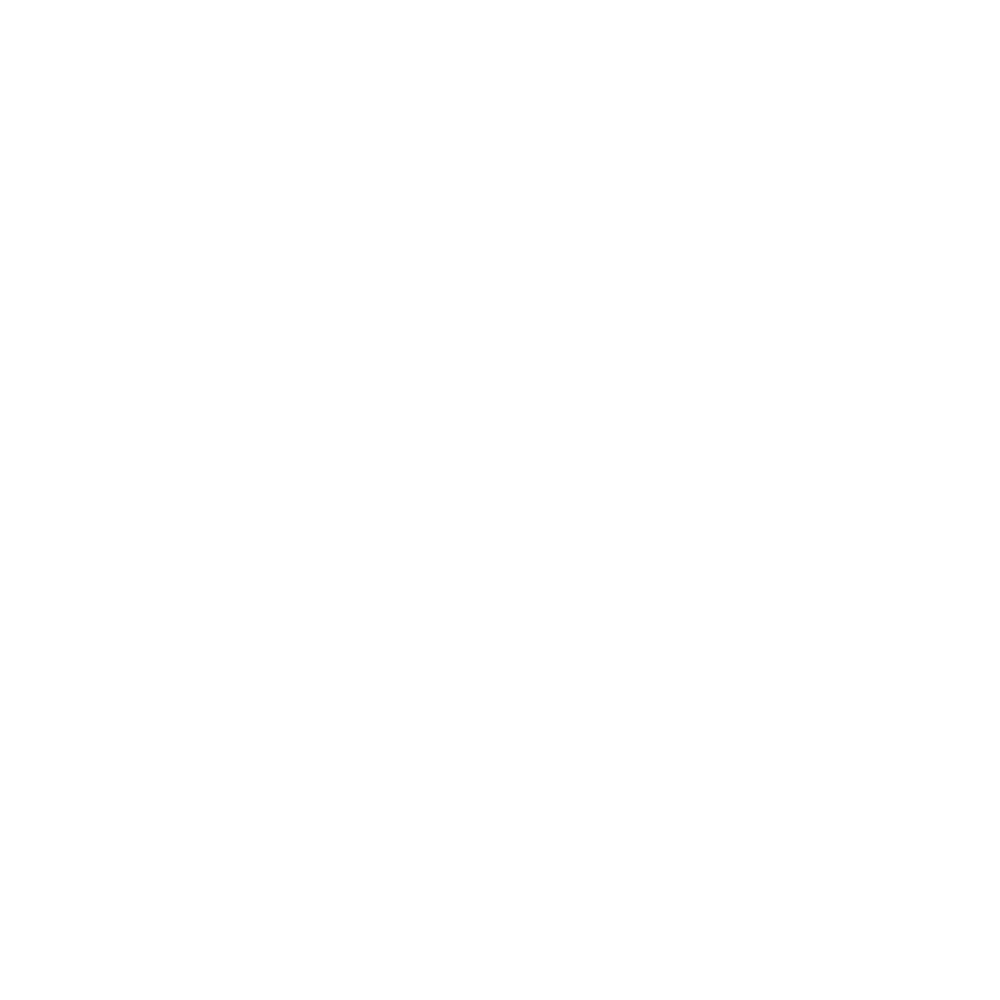

<IPython.core.display.Javascript object>


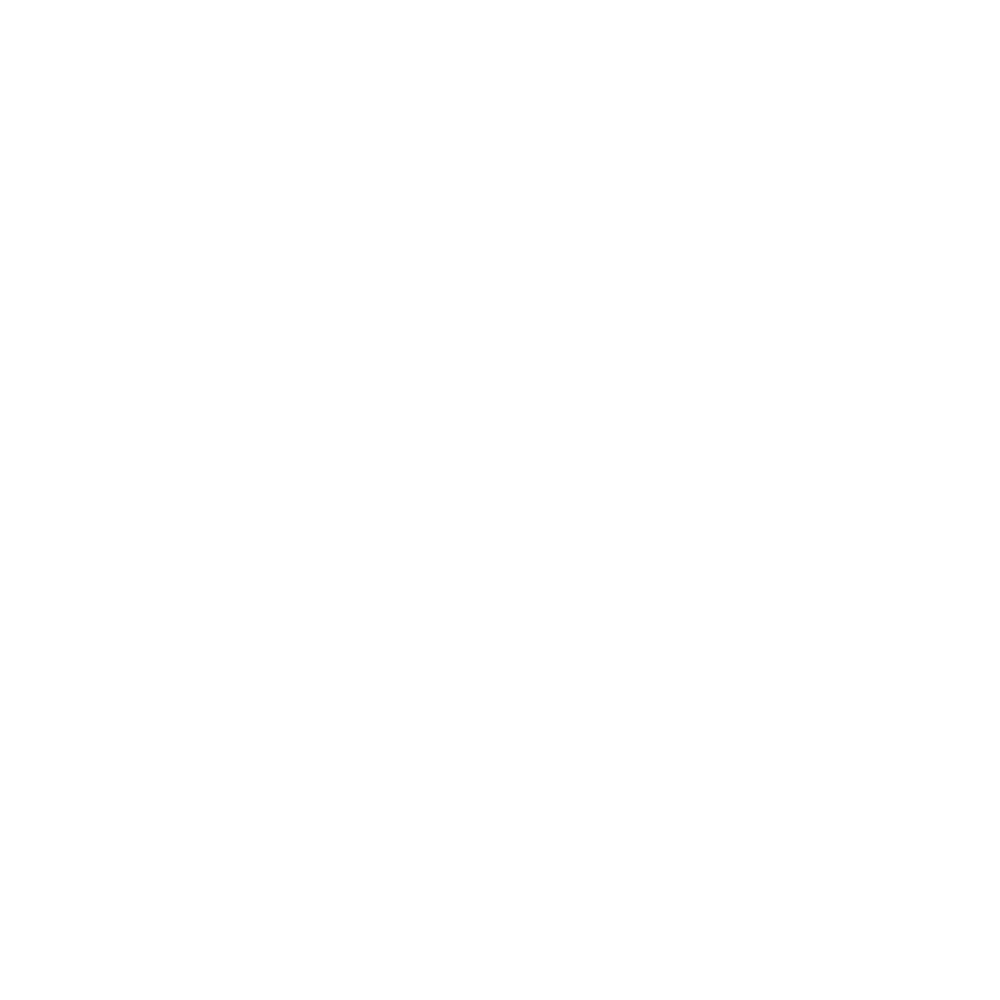

<IPython.core.display.Javascript object>


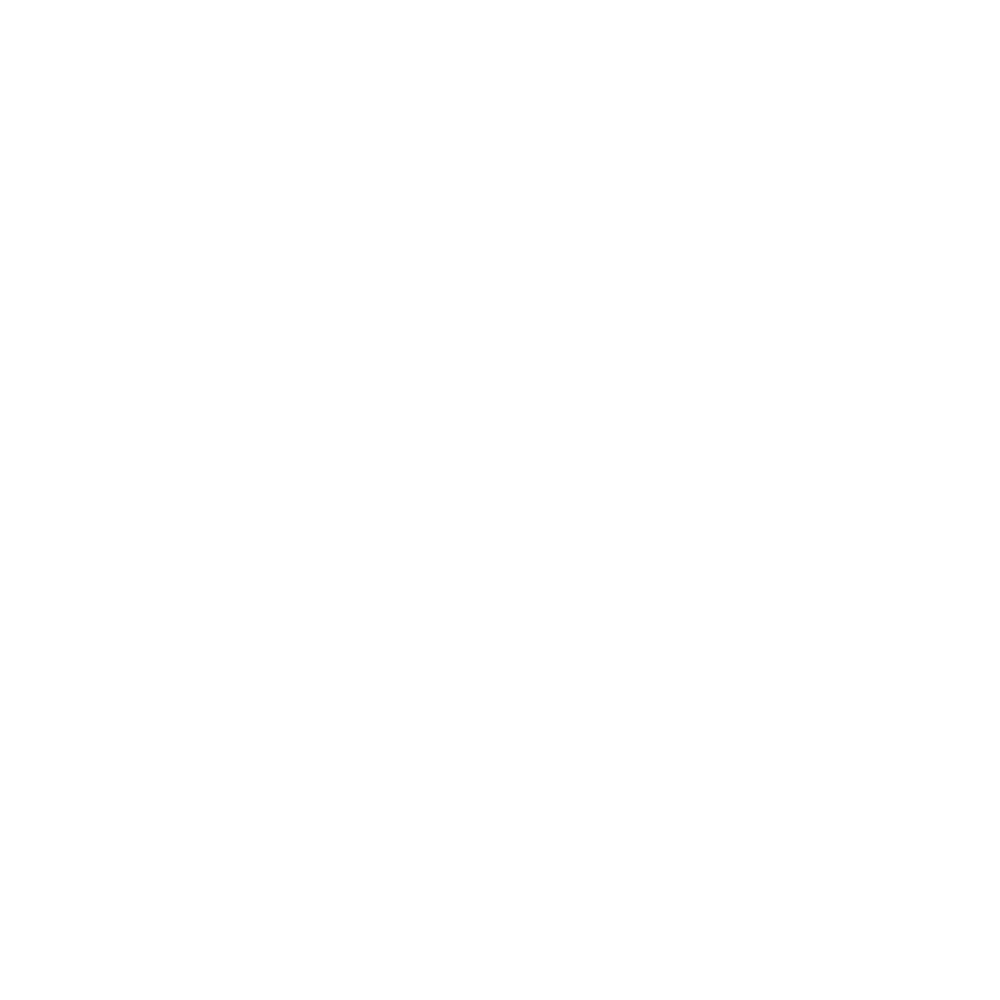

<IPython.core.display.Javascript object>


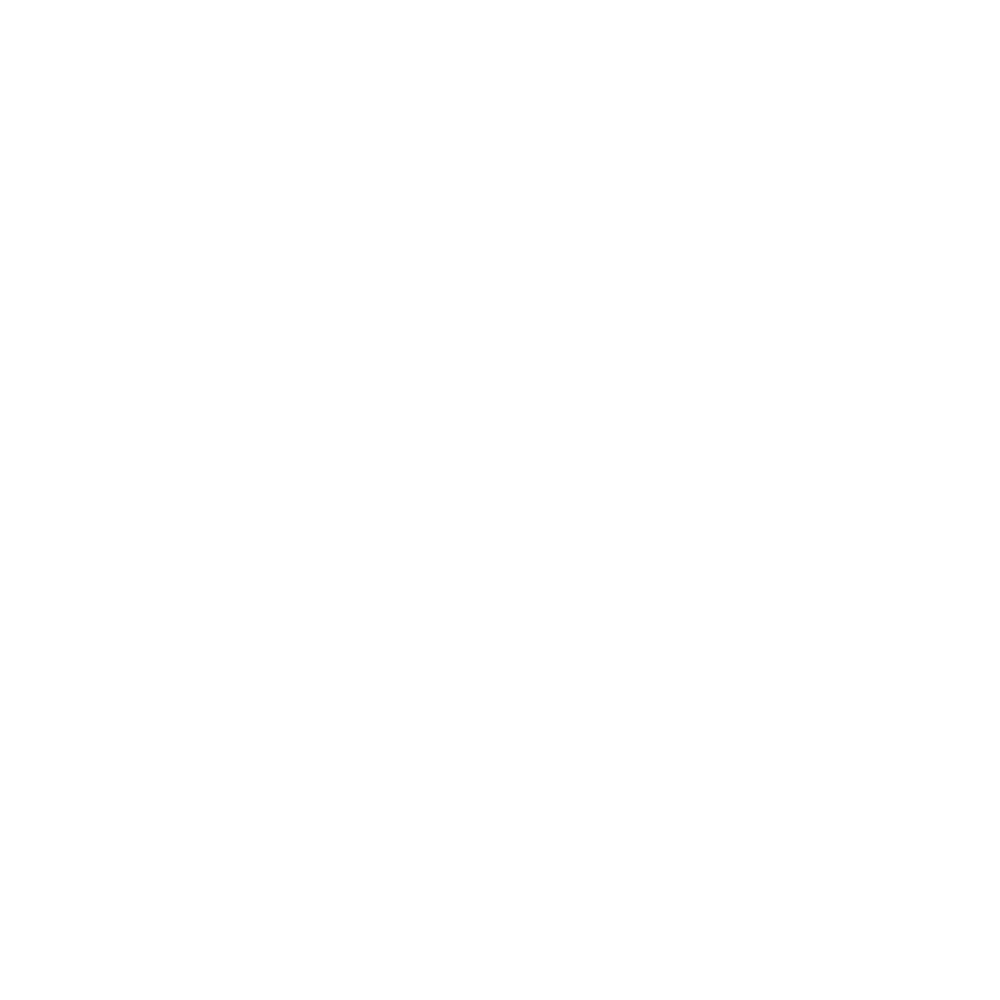

<IPython.core.display.Javascript object>


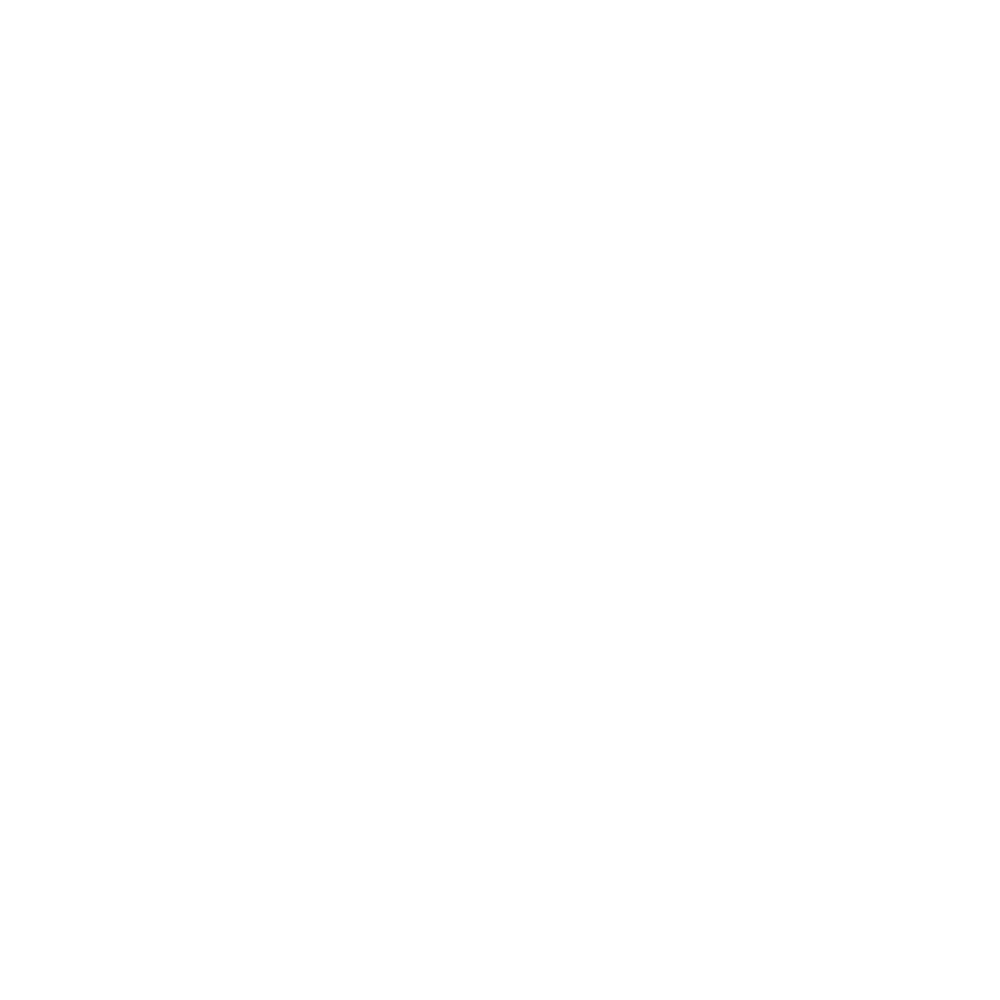

<IPython.core.display.Javascript object>


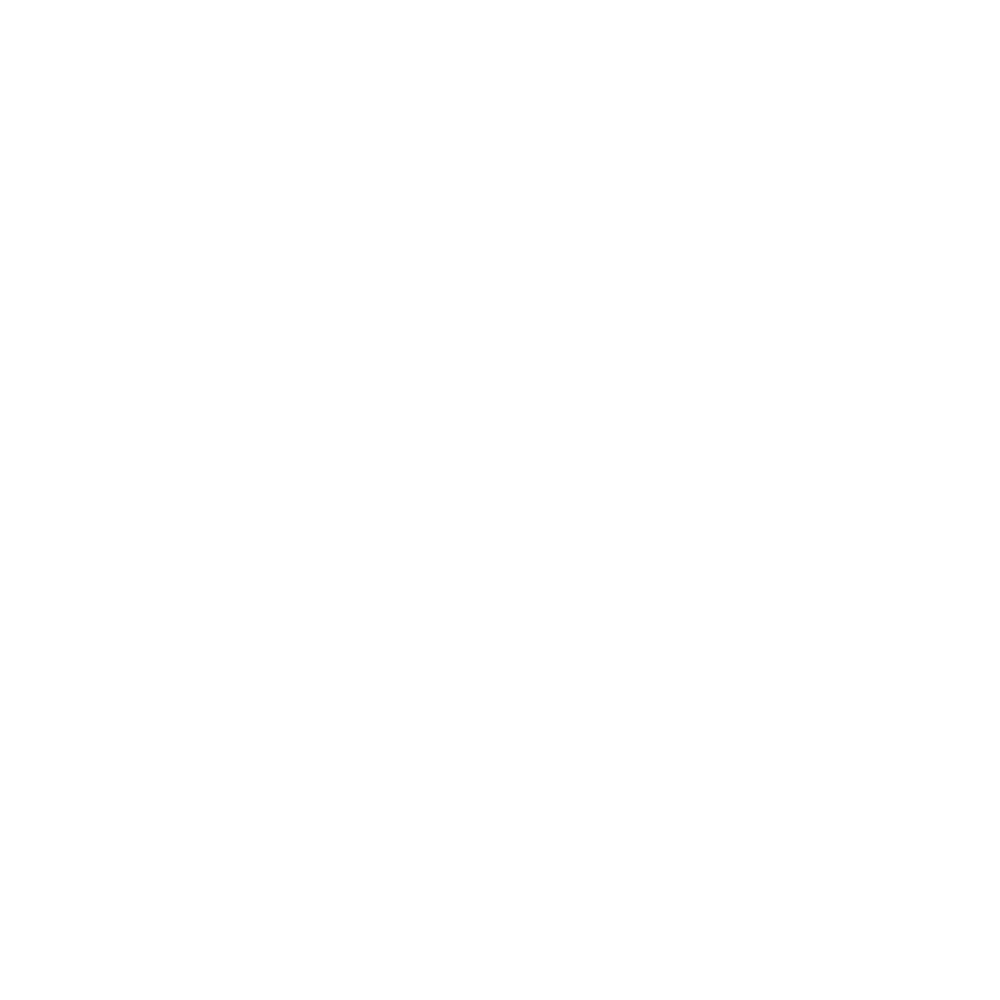

<IPython.core.display.Javascript object>


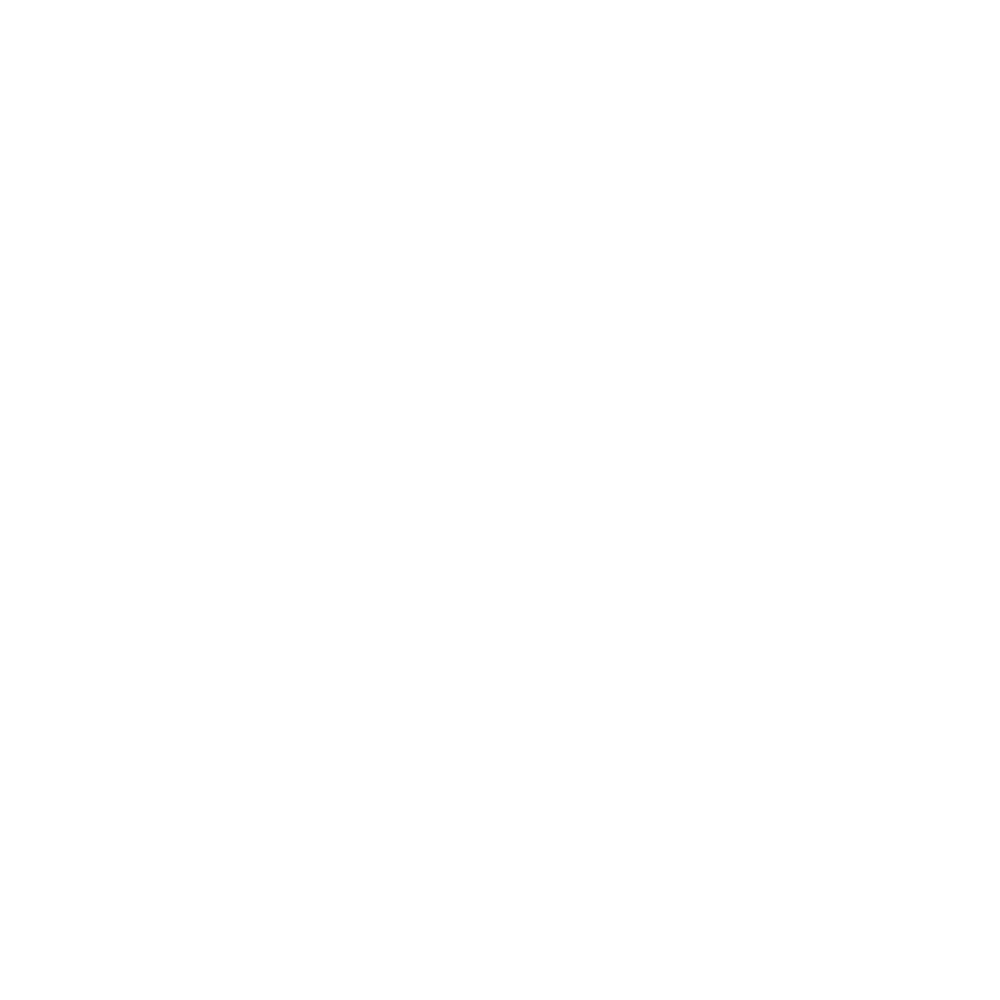

<IPython.core.display.Javascript object>


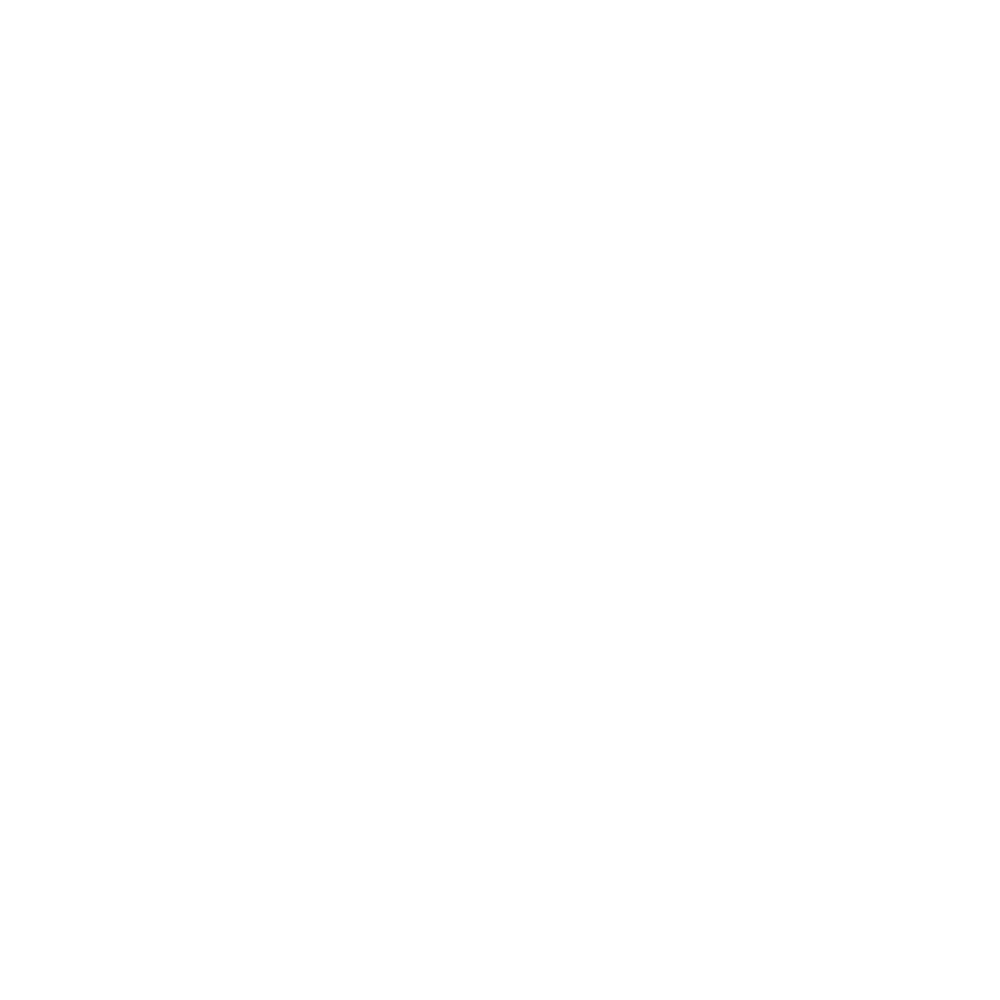

<IPython.core.display.Javascript object>


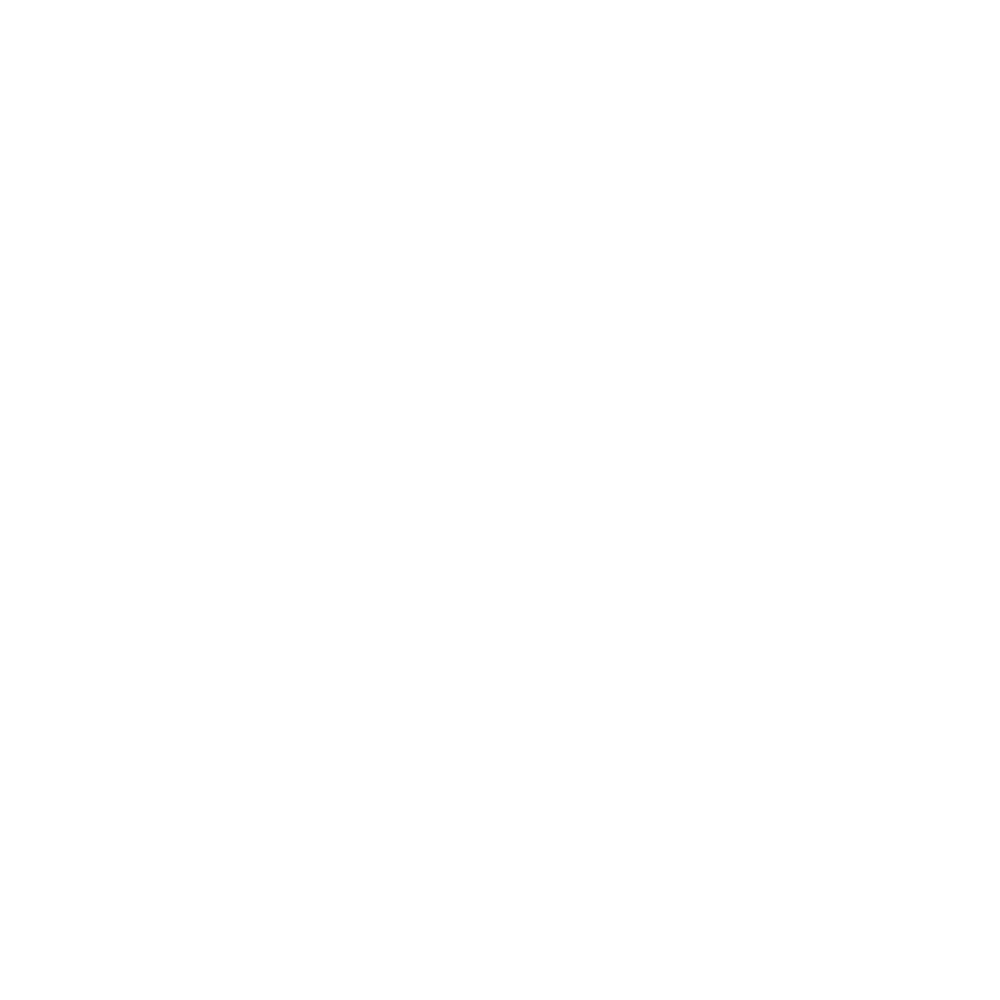

<IPython.core.display.Javascript object>


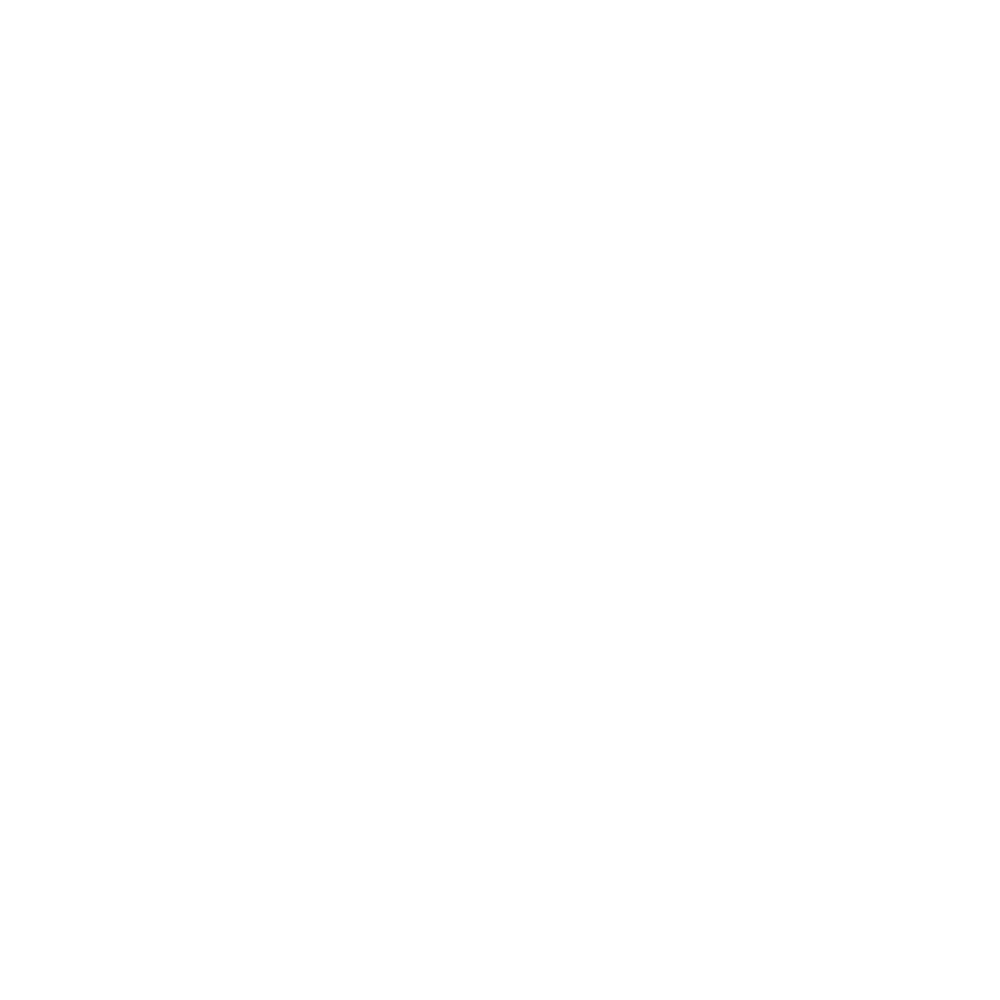

<IPython.core.display.Javascript object>


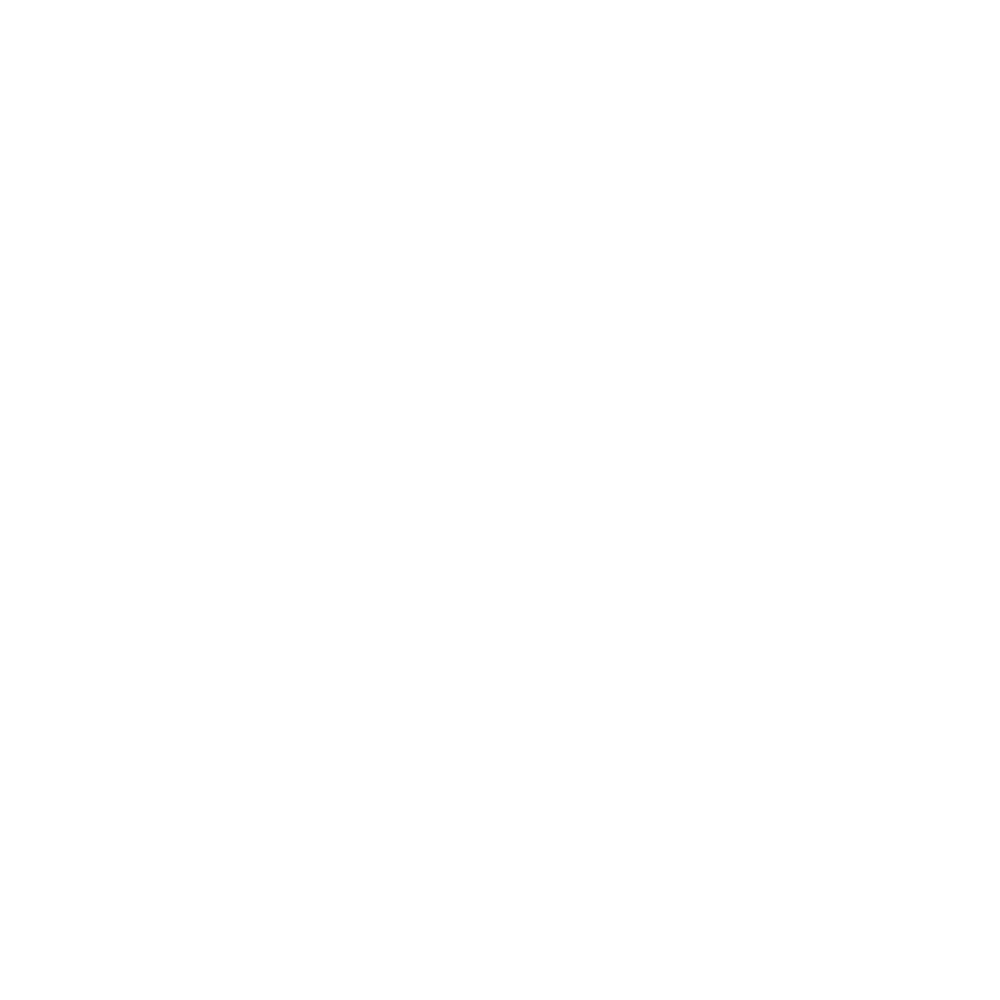

<IPython.core.display.Javascript object>


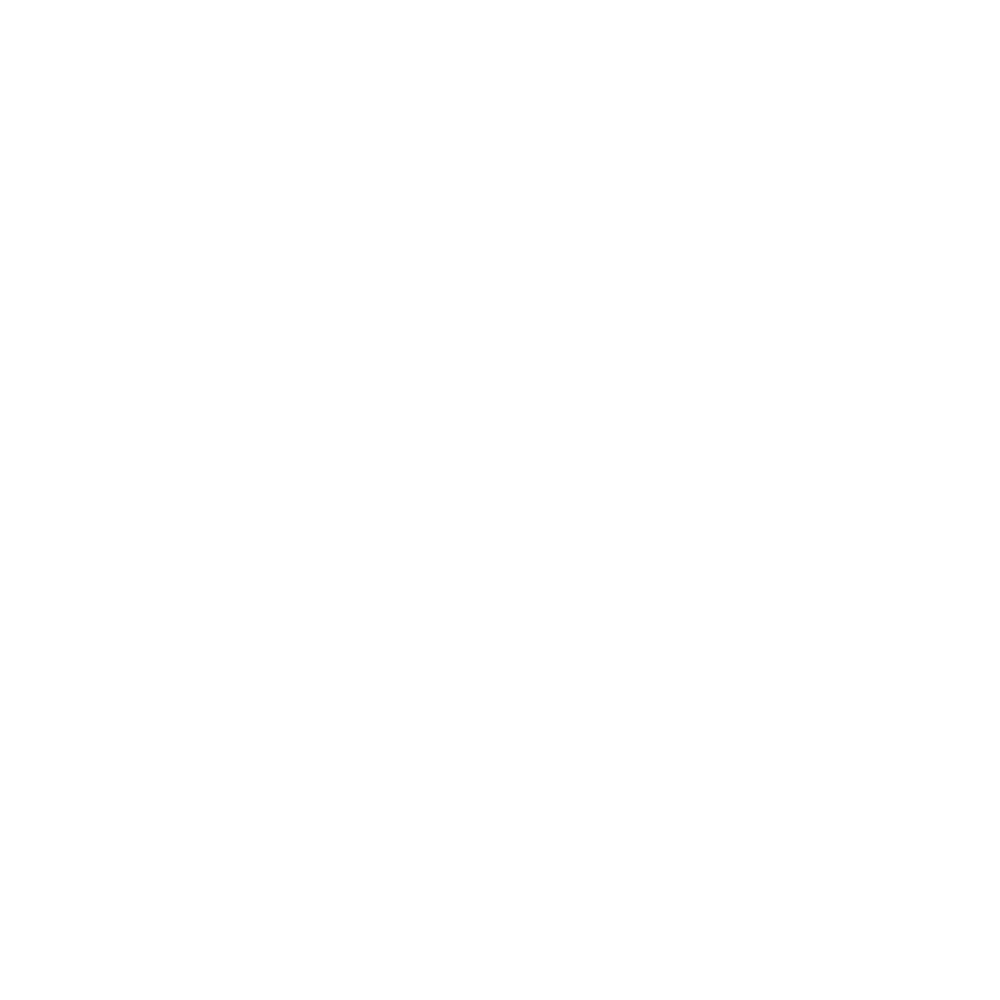

<IPython.core.display.Javascript object>


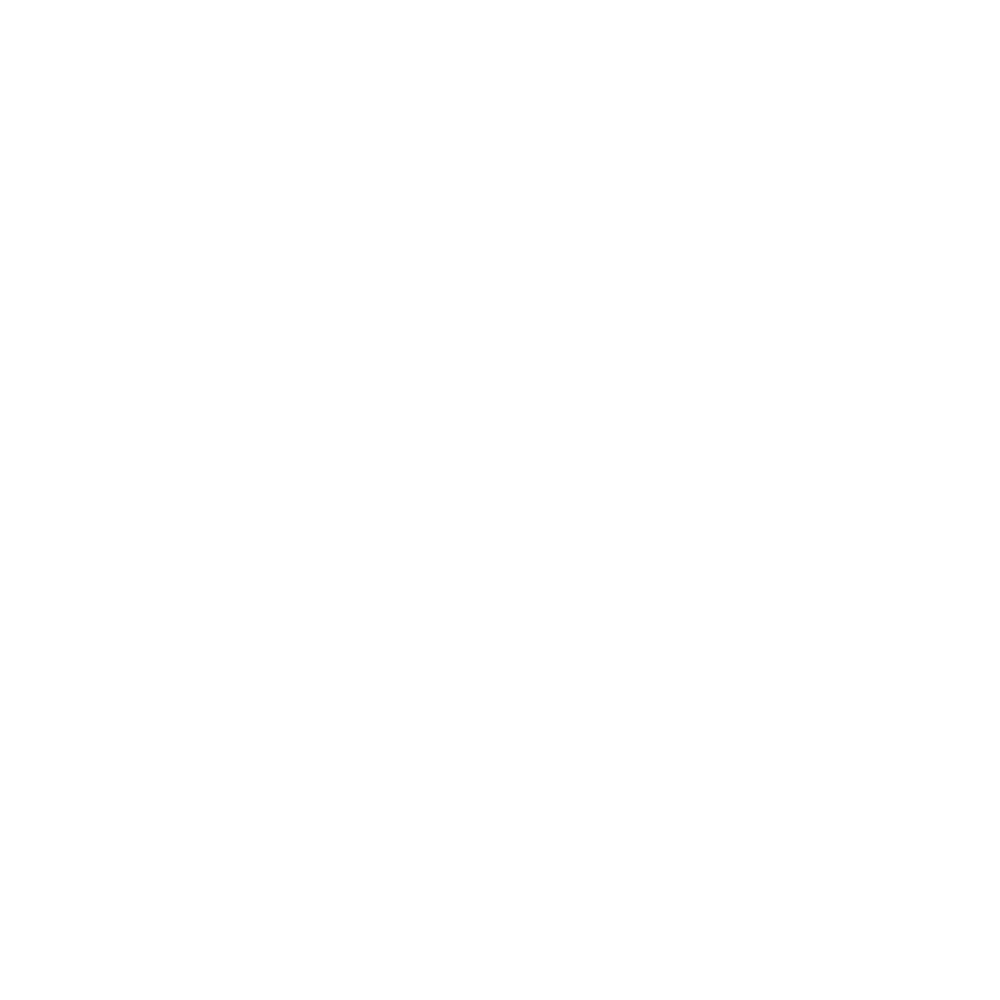

<IPython.core.display.Javascript object>


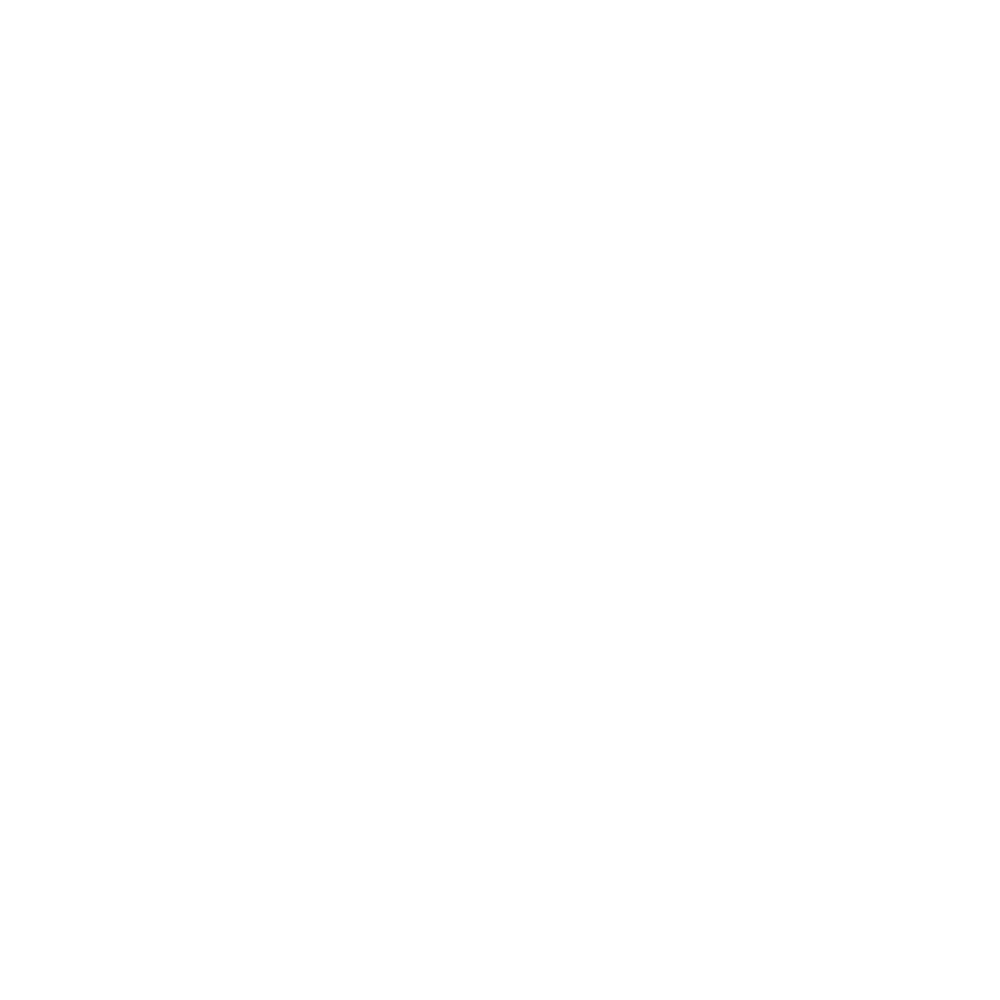

<IPython.core.display.Javascript object>


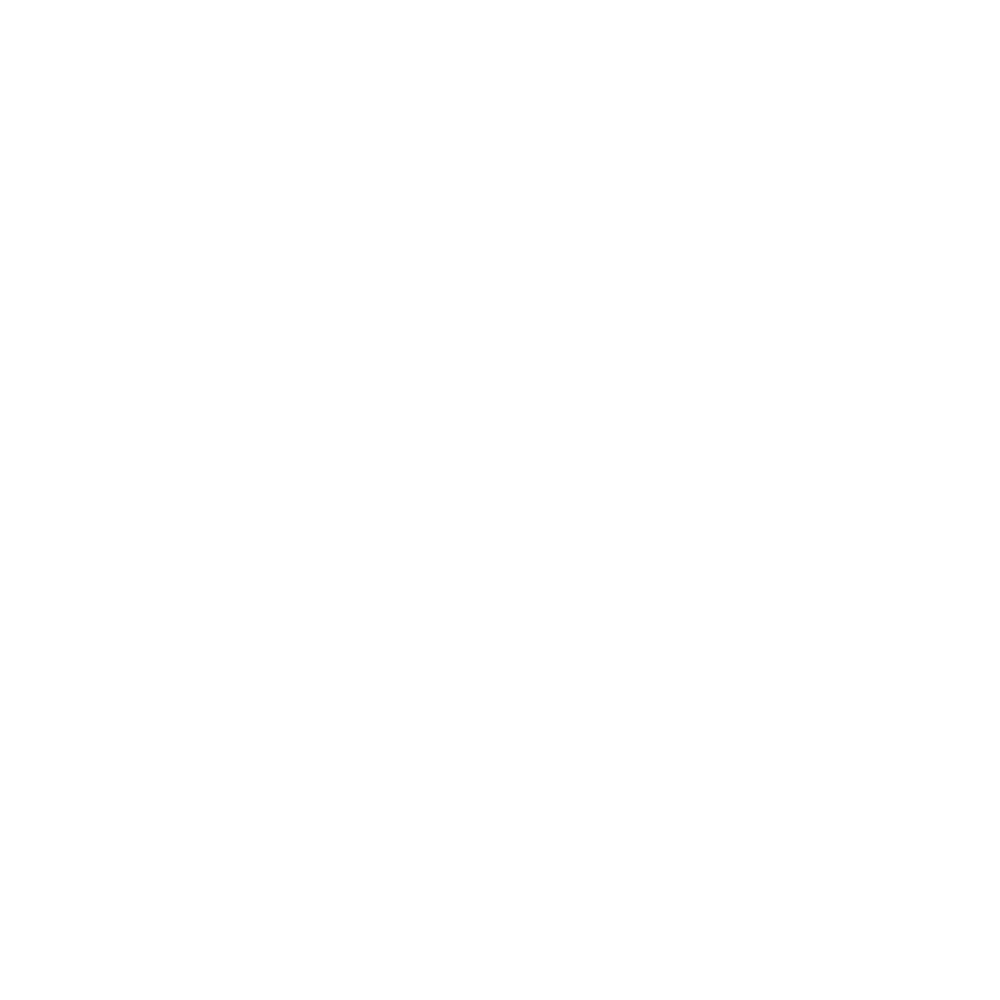

<IPython.core.display.Javascript object>


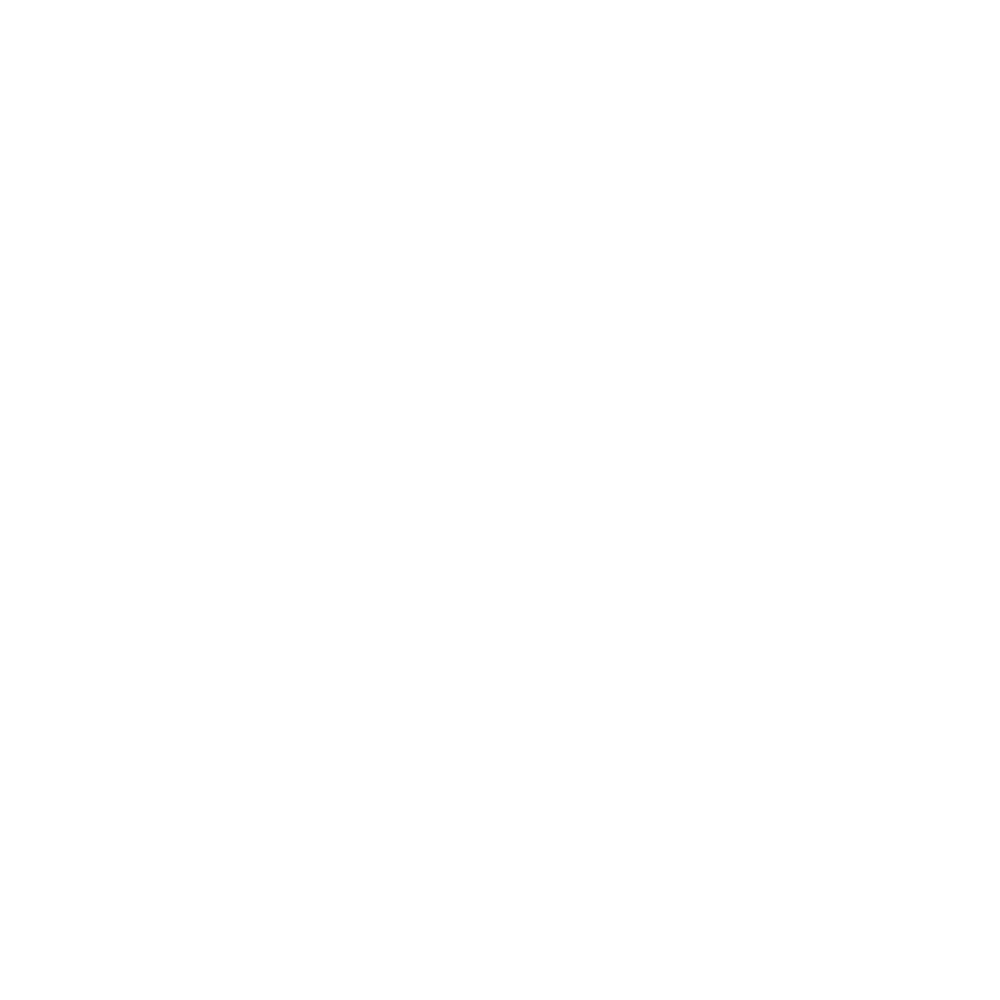

<IPython.core.display.Javascript object>


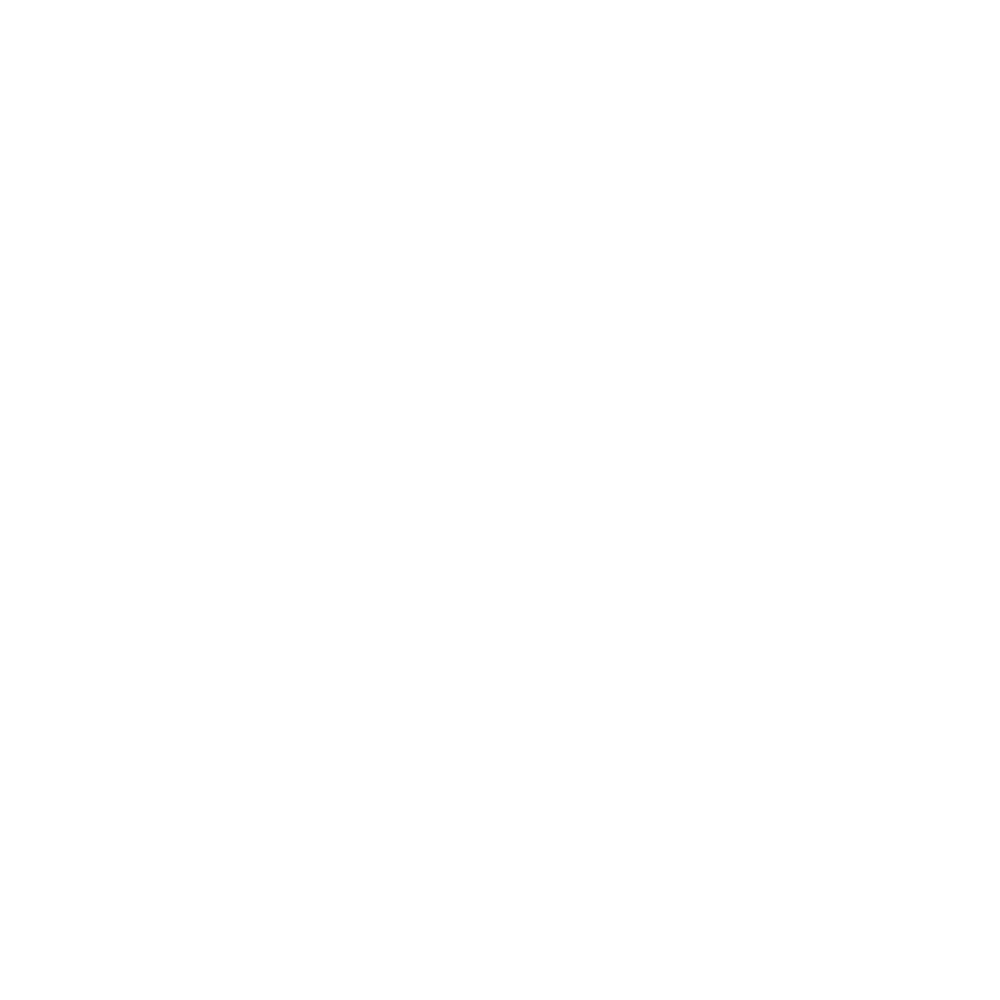

<IPython.core.display.Javascript object>


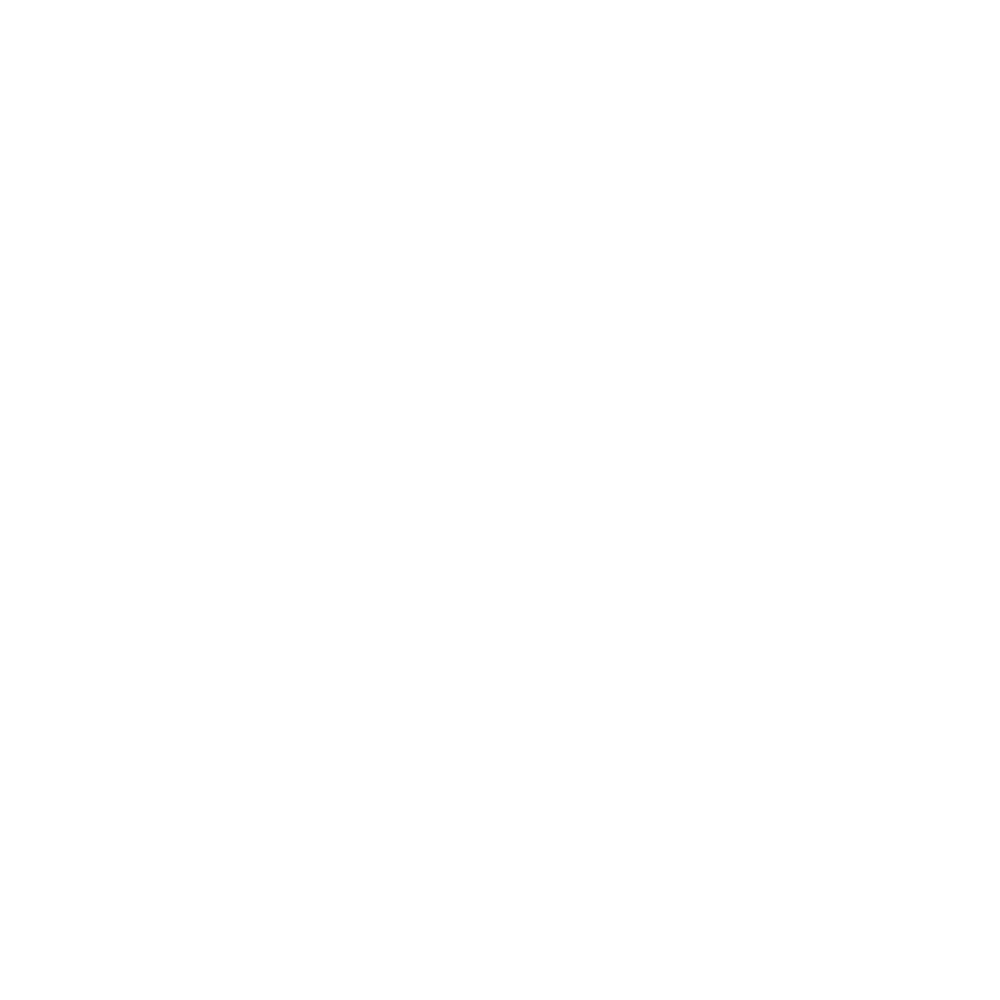

<IPython.core.display.Javascript object>


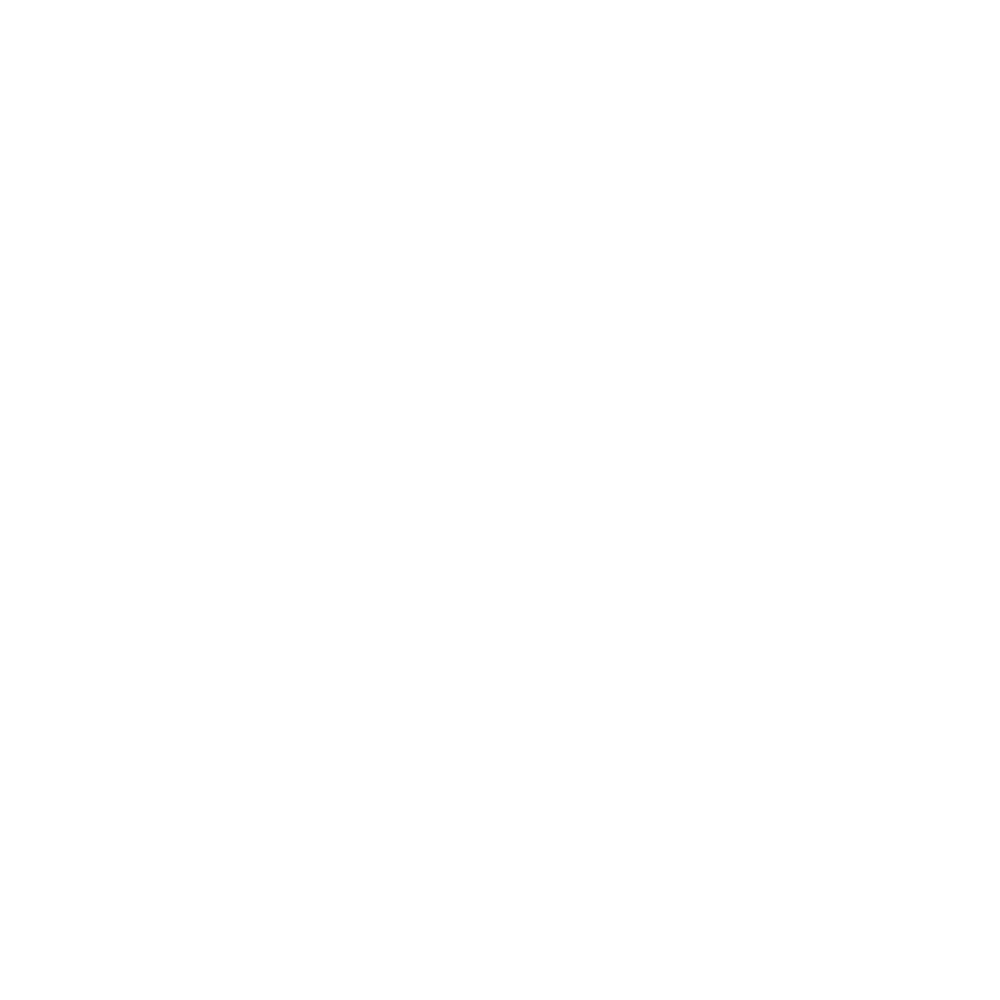

<IPython.core.display.Javascript object>


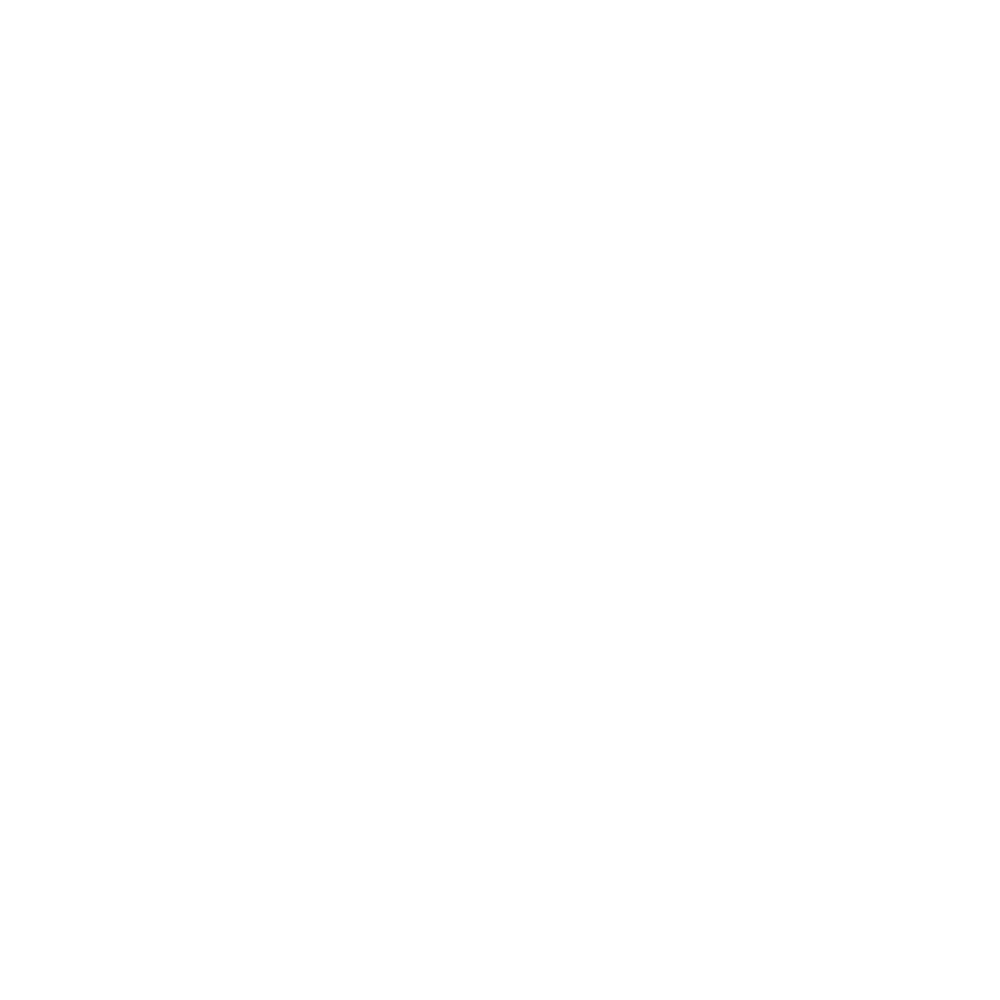

<IPython.core.display.Javascript object>


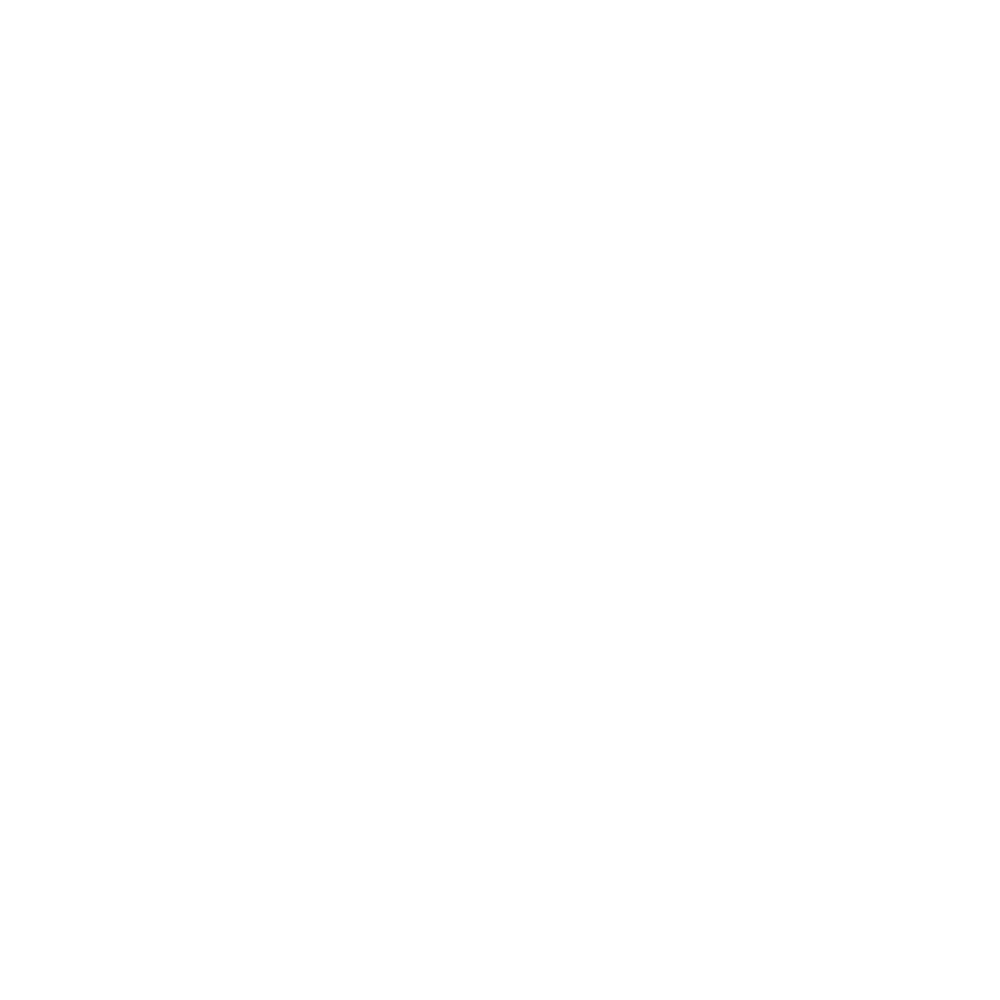

<IPython.core.display.Javascript object>


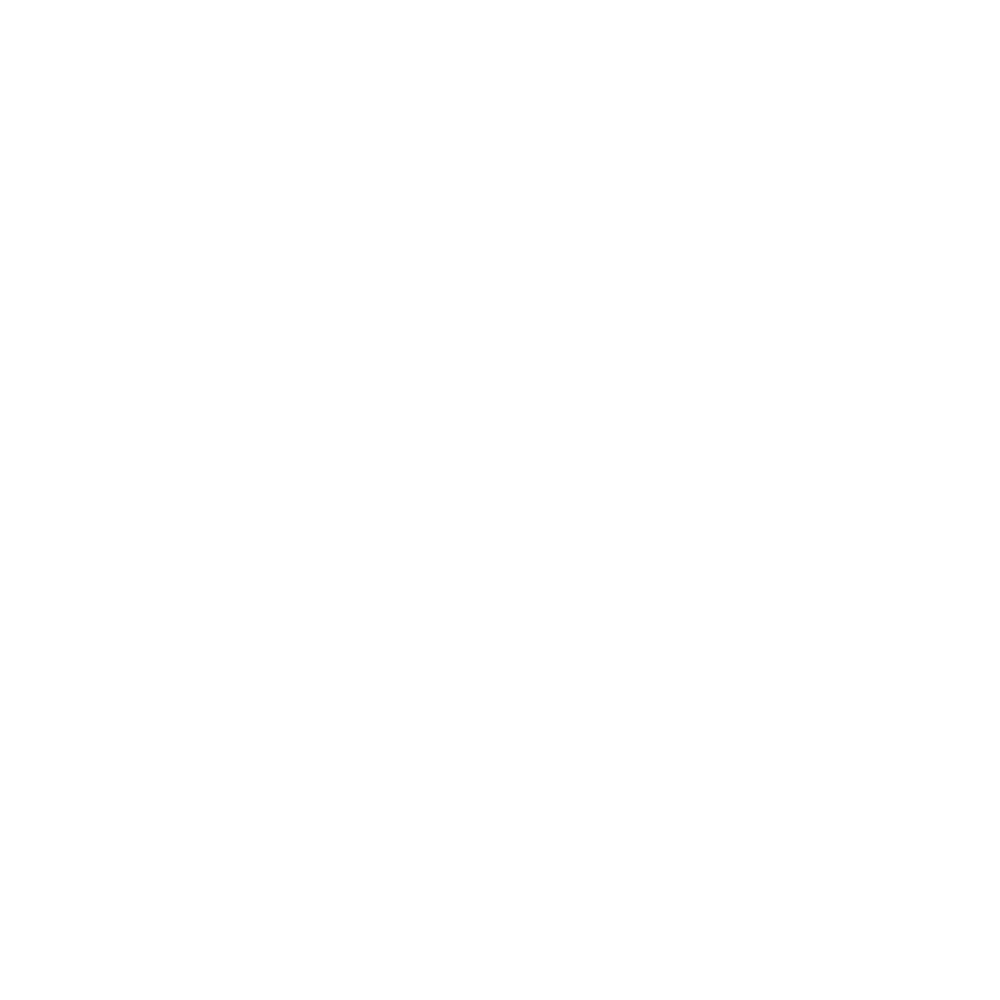

<IPython.core.display.Javascript object>


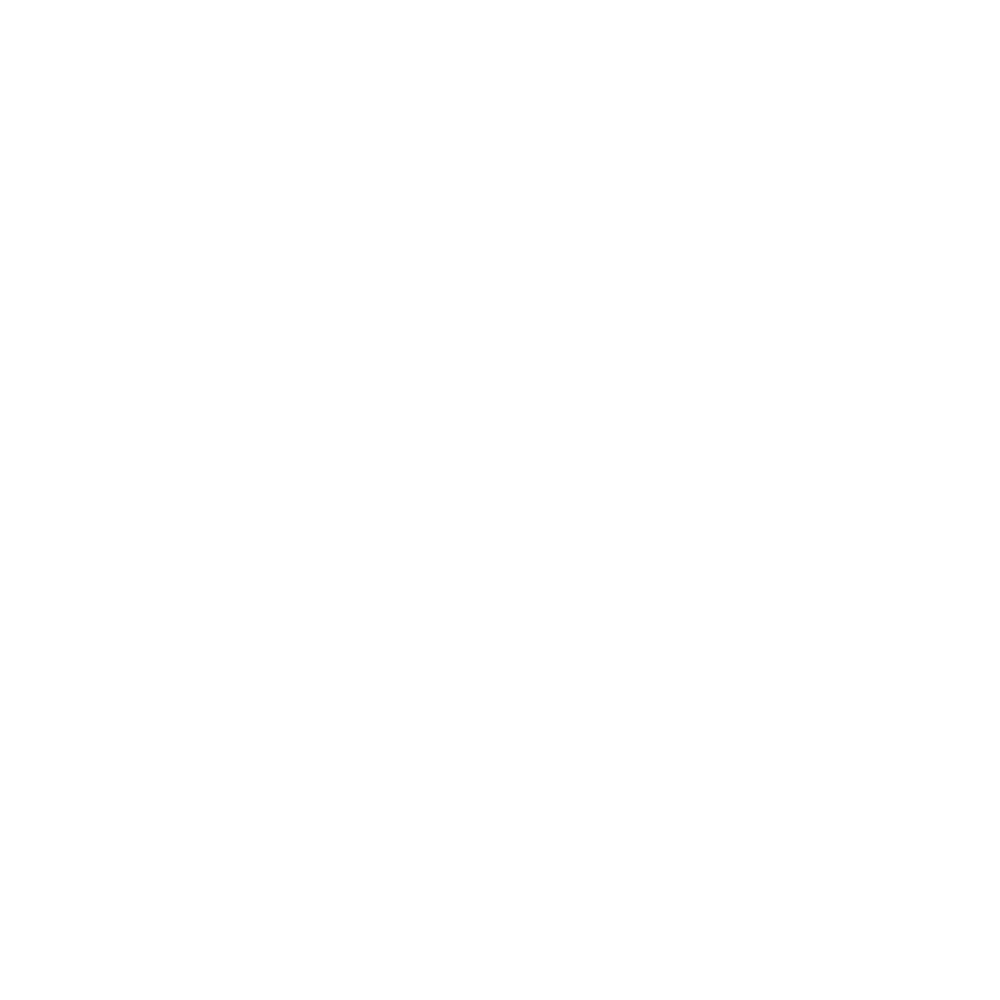

<IPython.core.display.Javascript object>


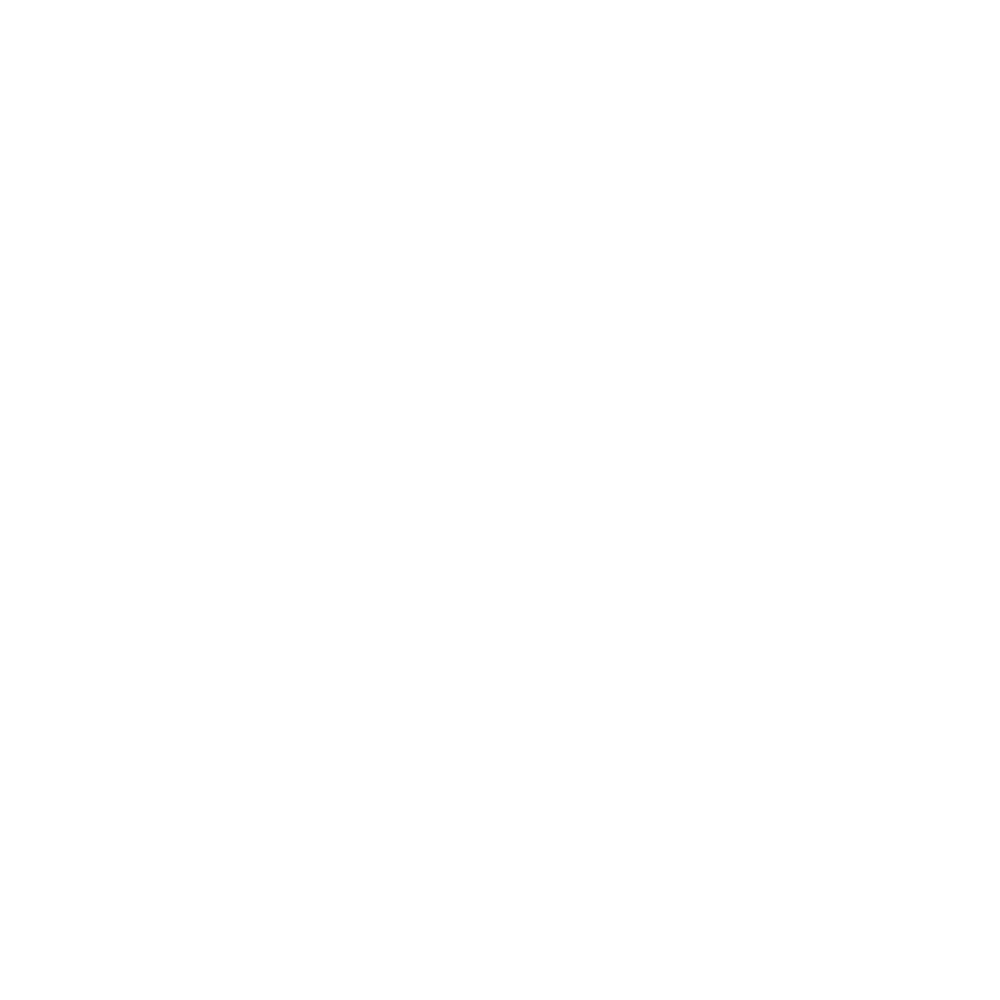

<IPython.core.display.Javascript object>


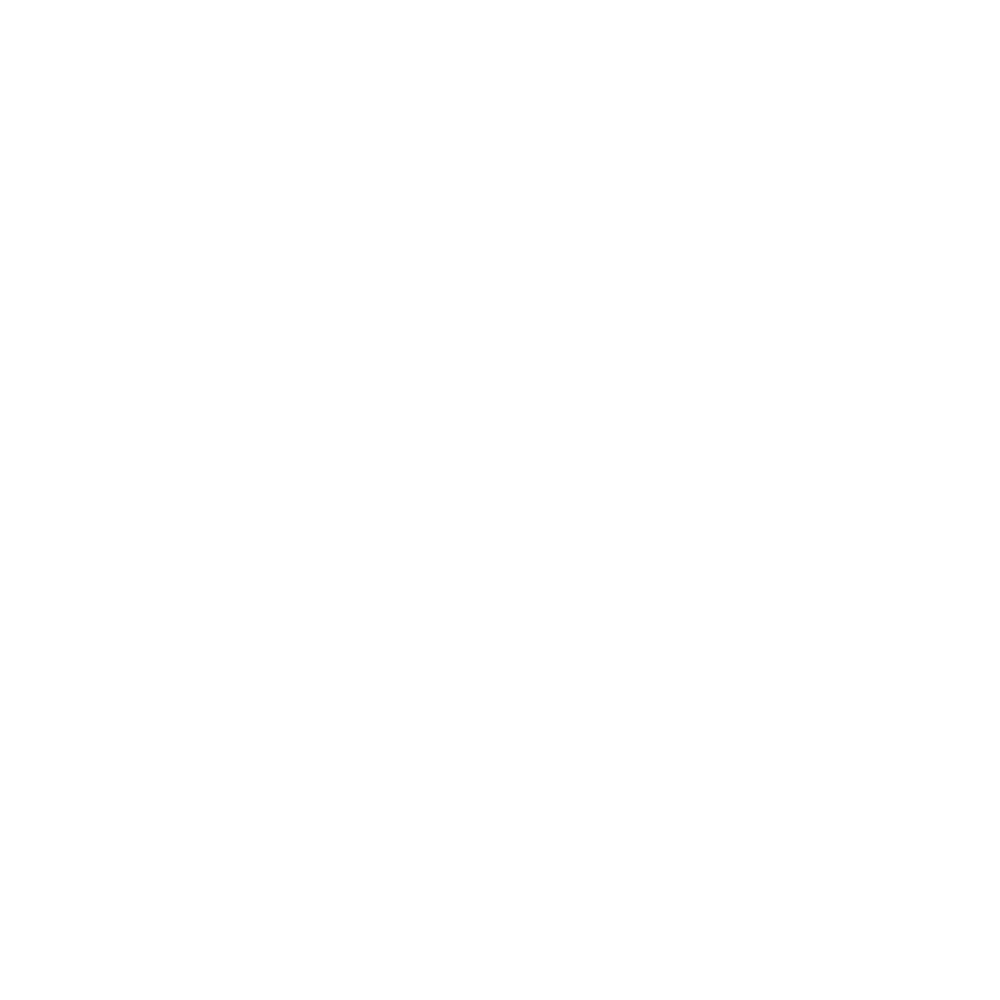

<IPython.core.display.Javascript object>


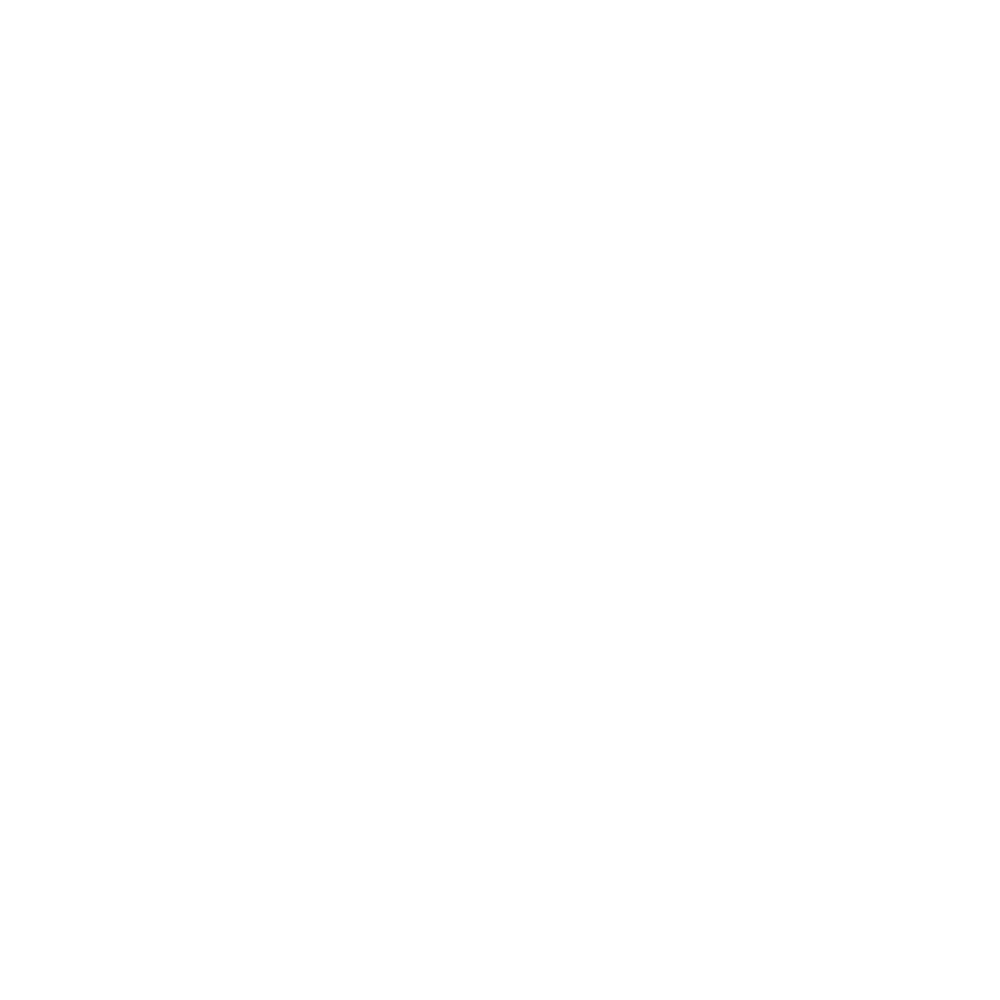

<IPython.core.display.Javascript object>


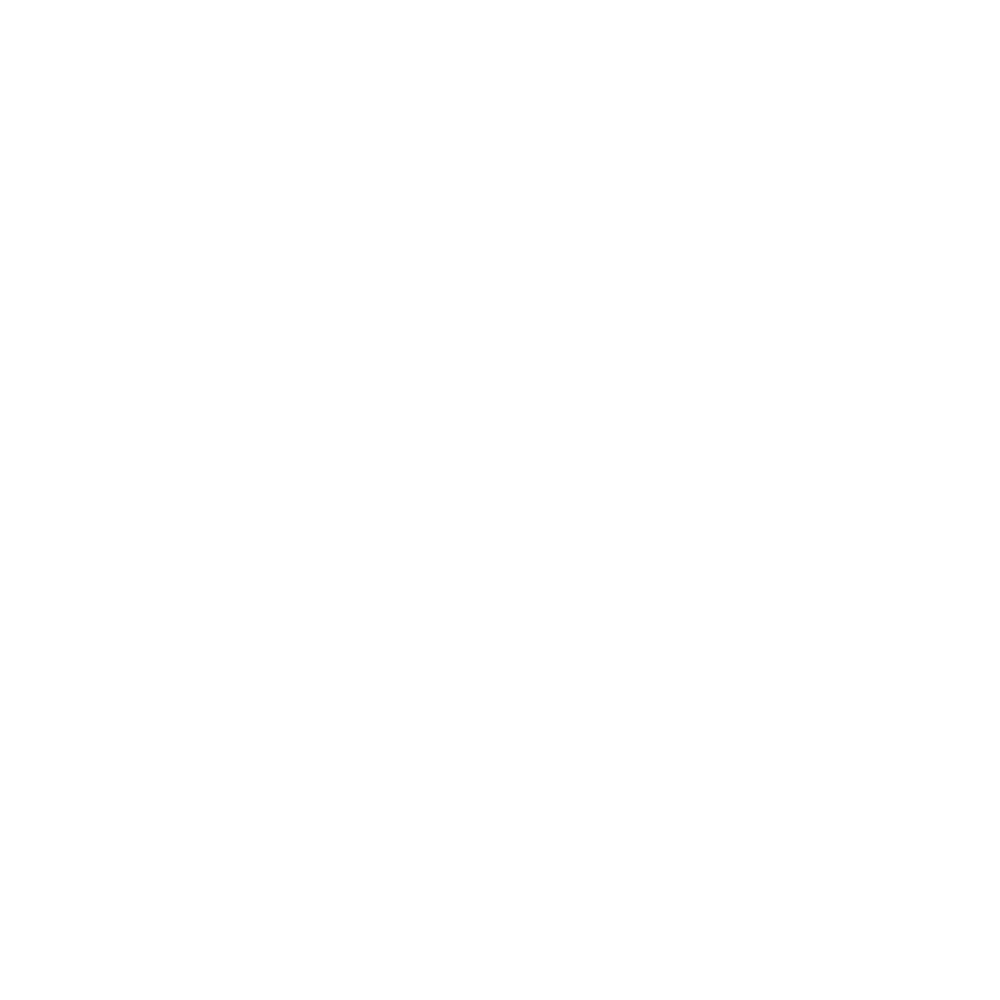

<IPython.core.display.Javascript object>


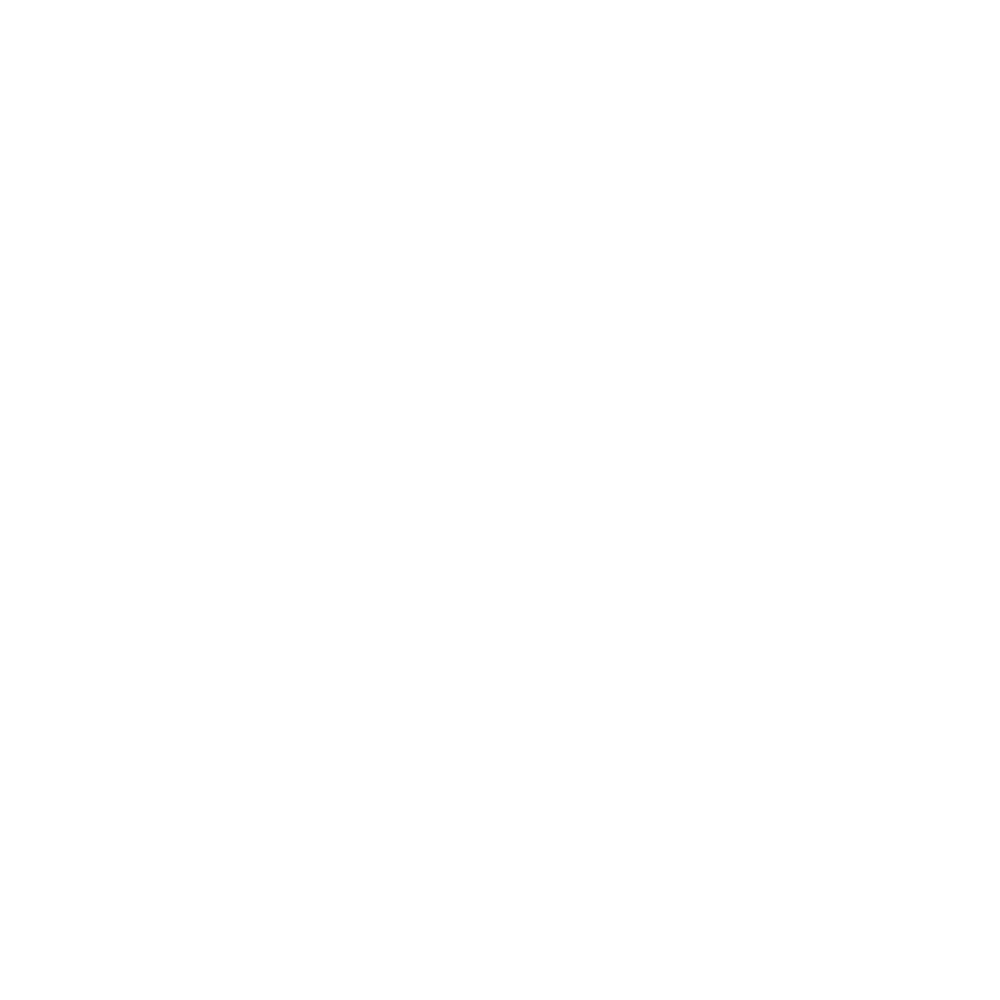

<IPython.core.display.Javascript object>


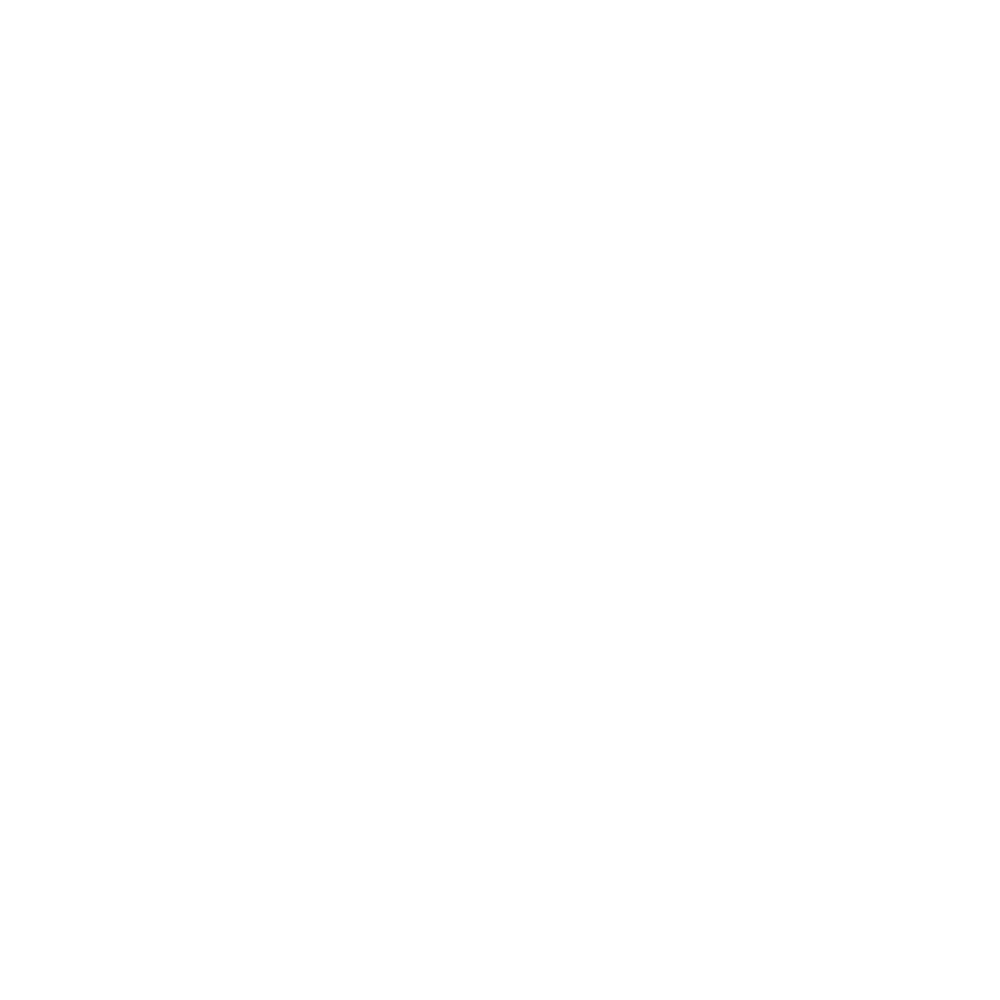

<IPython.core.display.Javascript object>


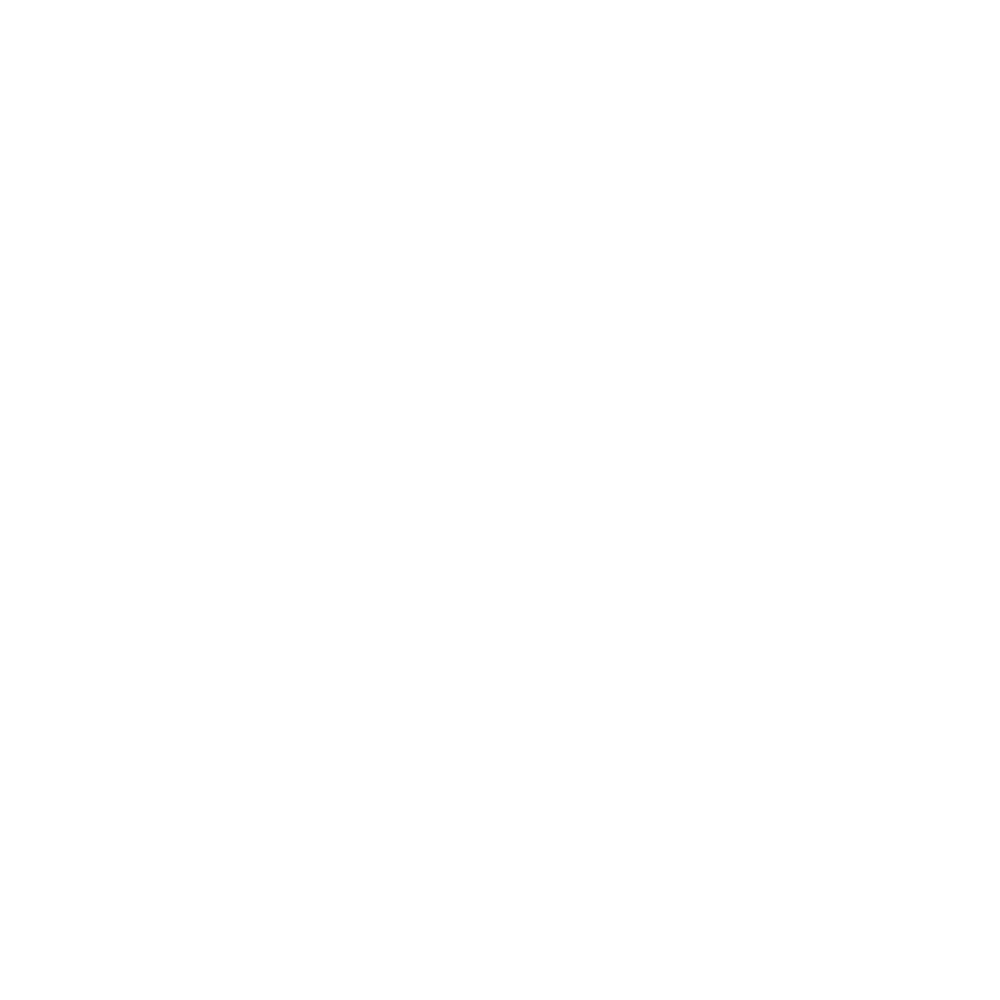

<IPython.core.display.Javascript object>


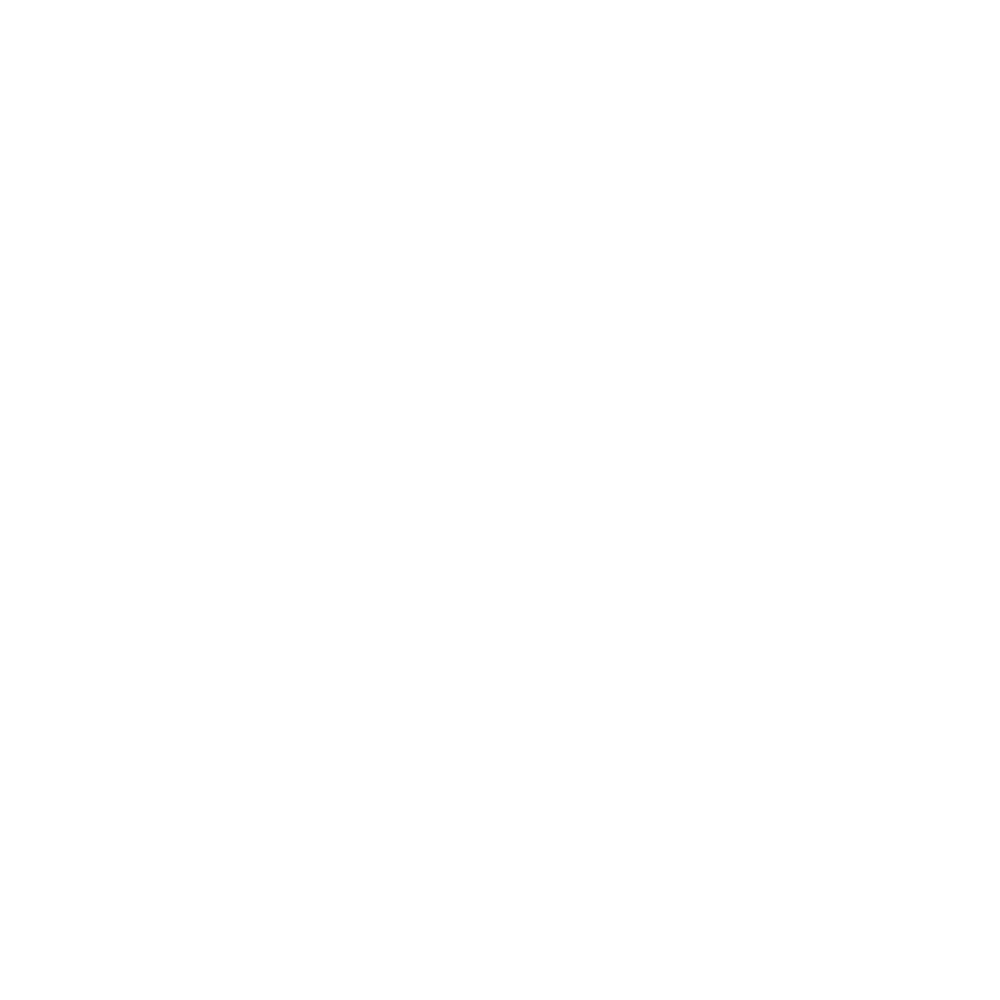

<IPython.core.display.Javascript object>


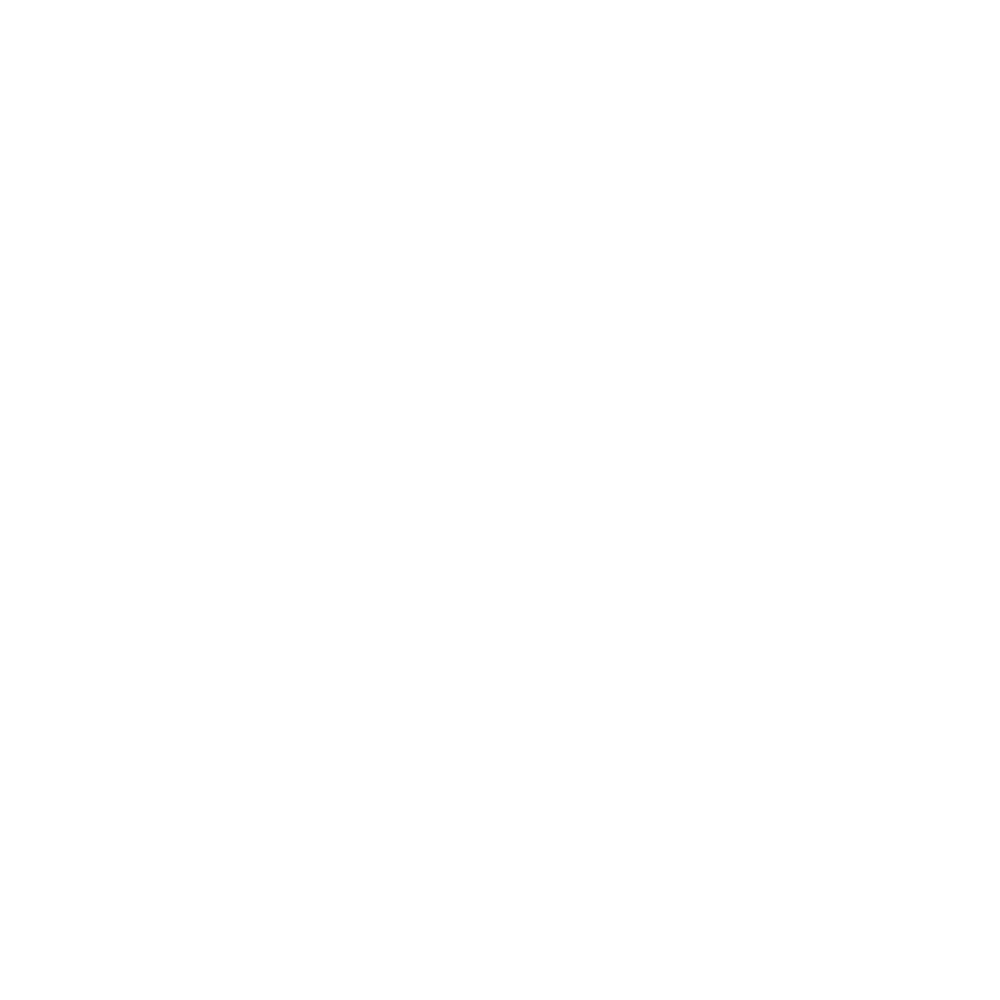

<IPython.core.display.Javascript object>


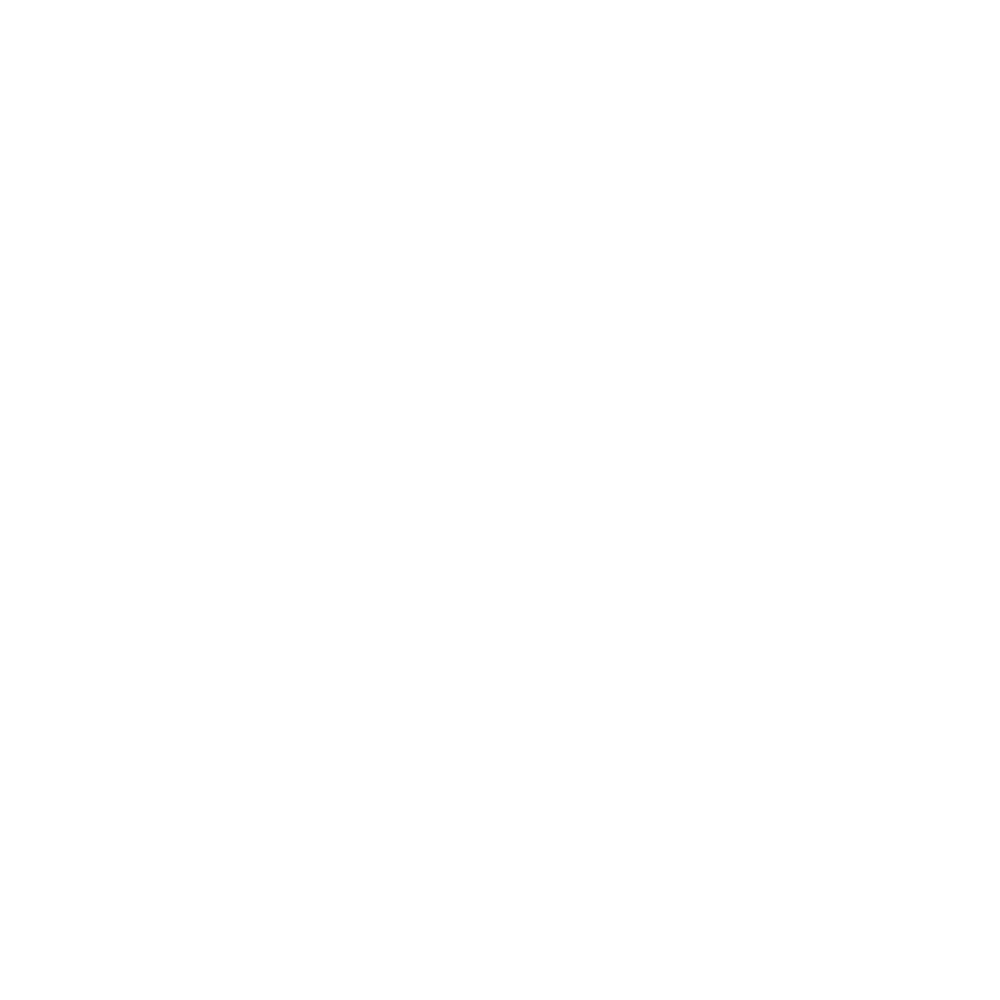

<IPython.core.display.Javascript object>


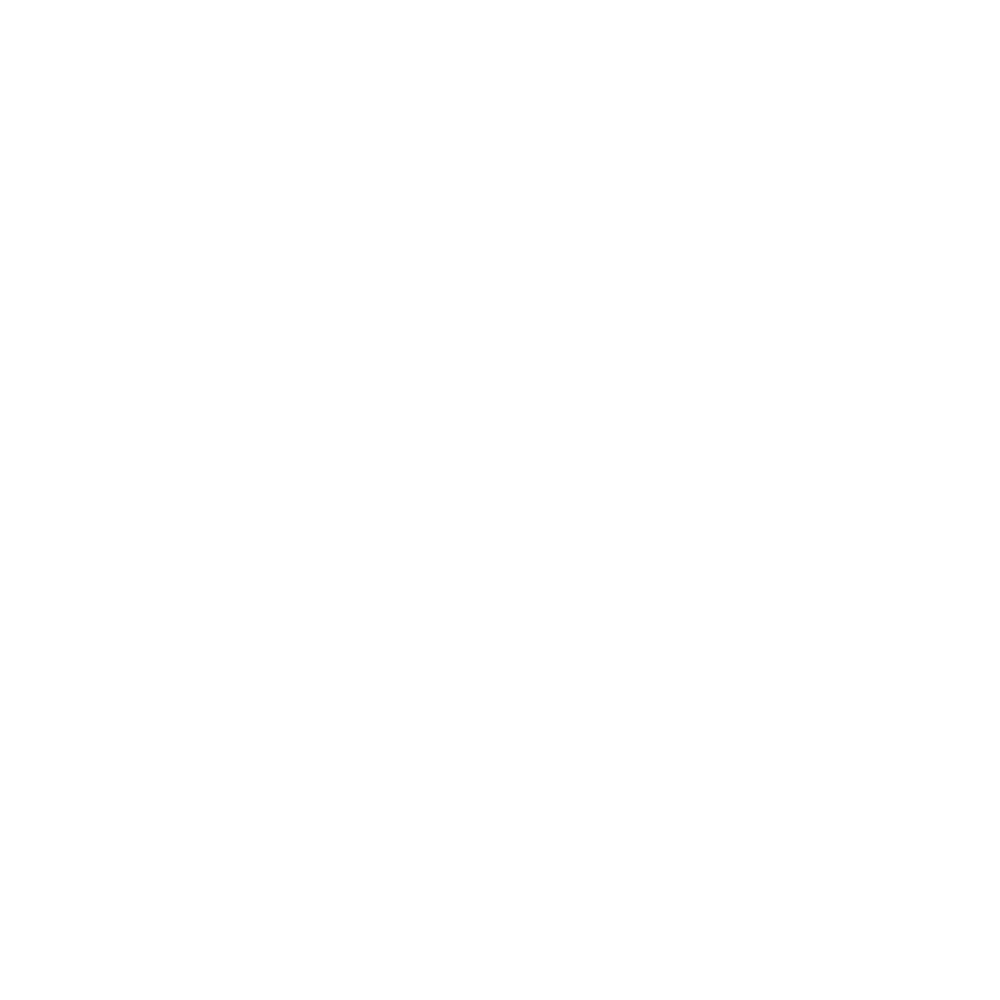

<IPython.core.display.Javascript object>


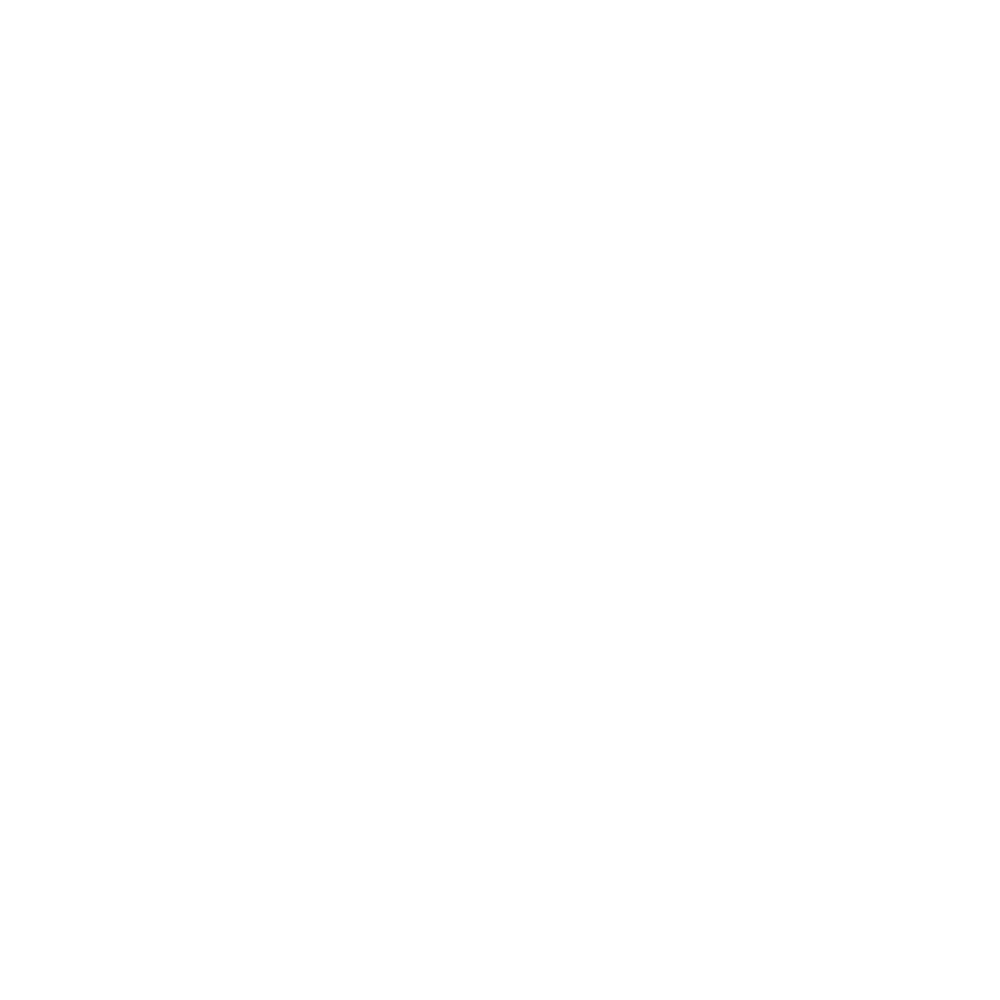

<IPython.core.display.Javascript object>


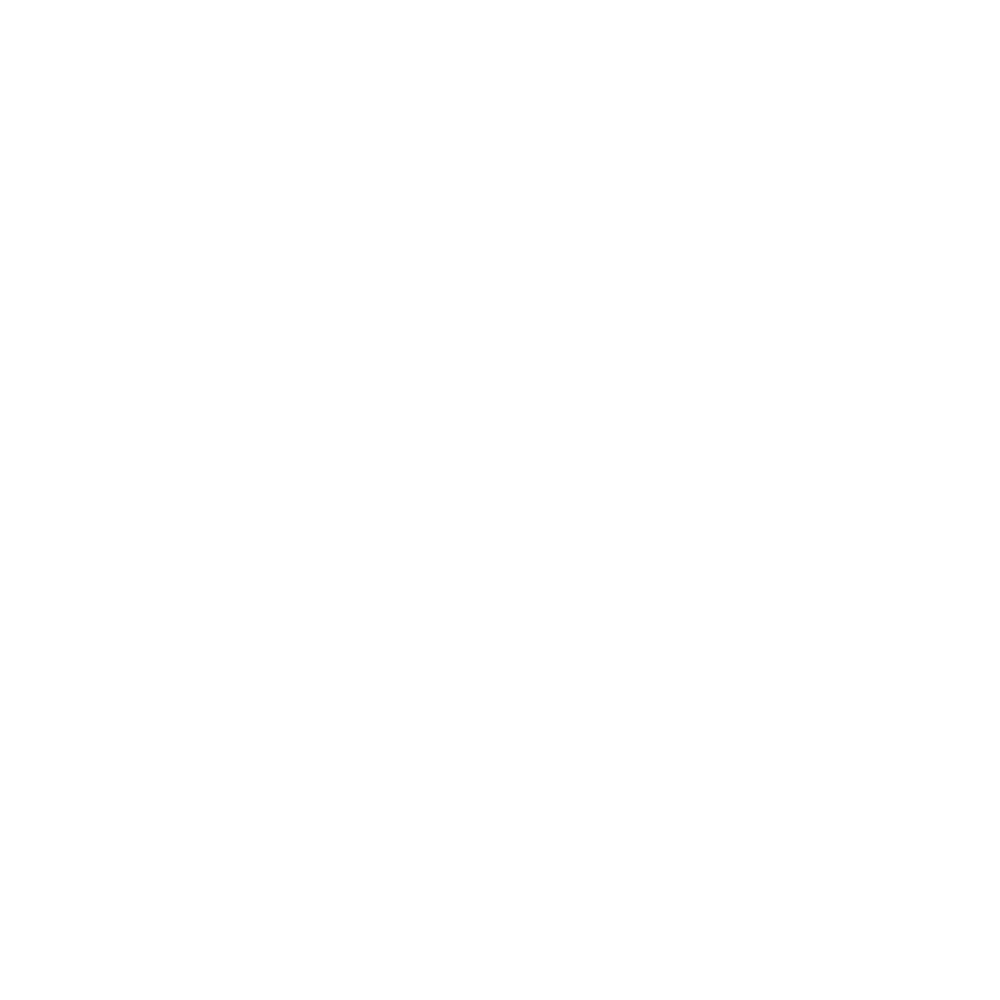

<IPython.core.display.Javascript object>


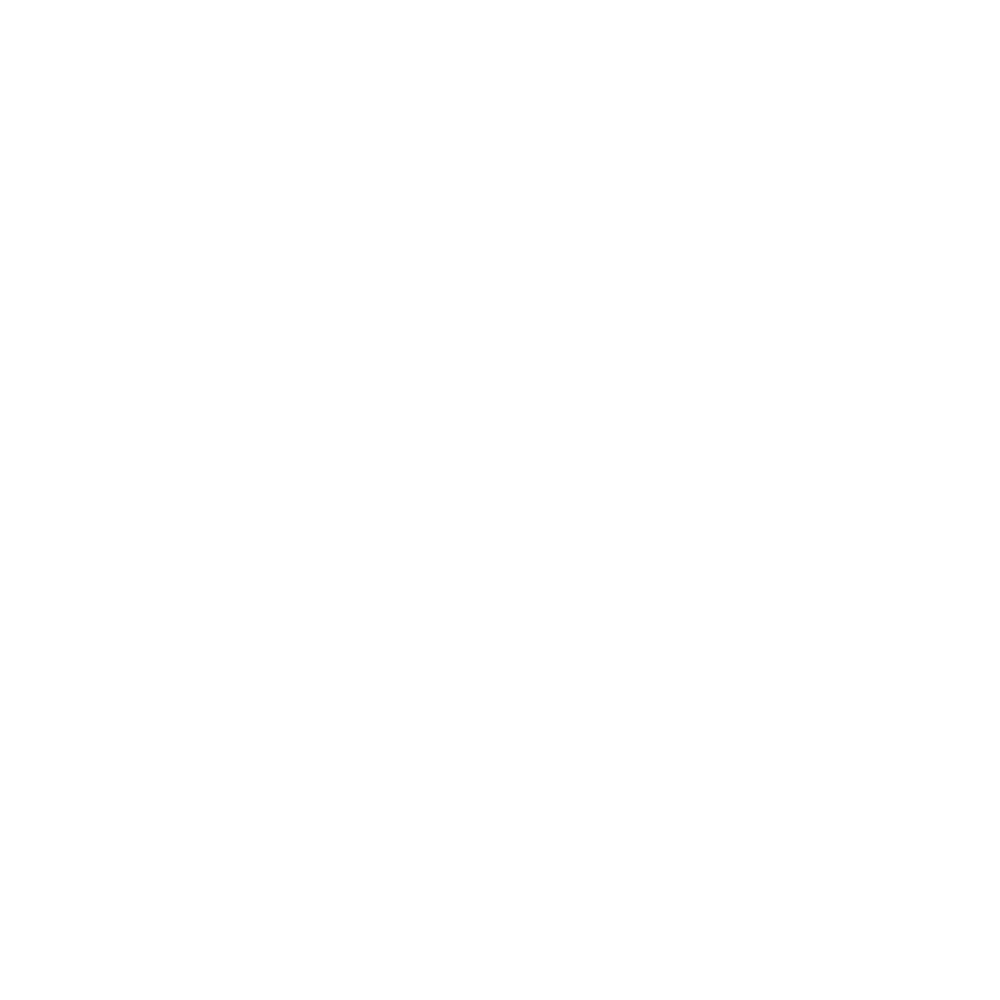

<IPython.core.display.Javascript object>


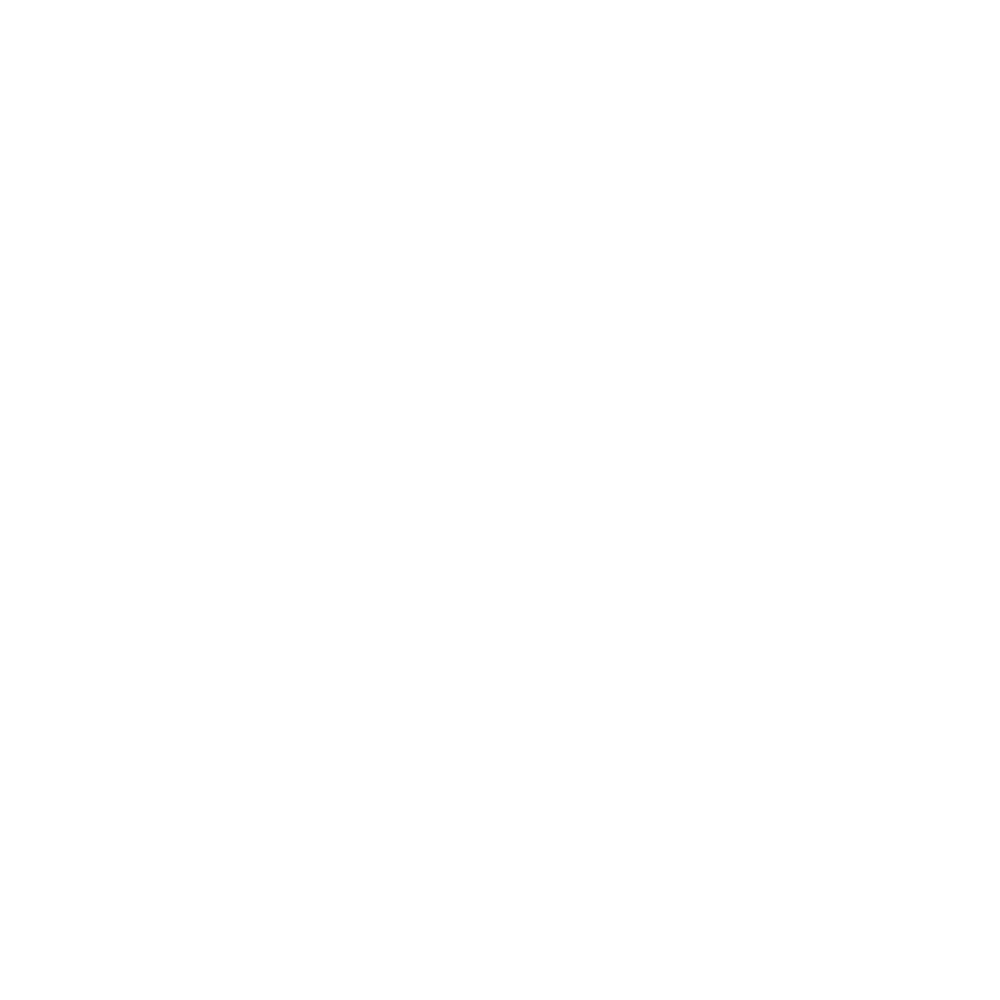

<IPython.core.display.Javascript object>


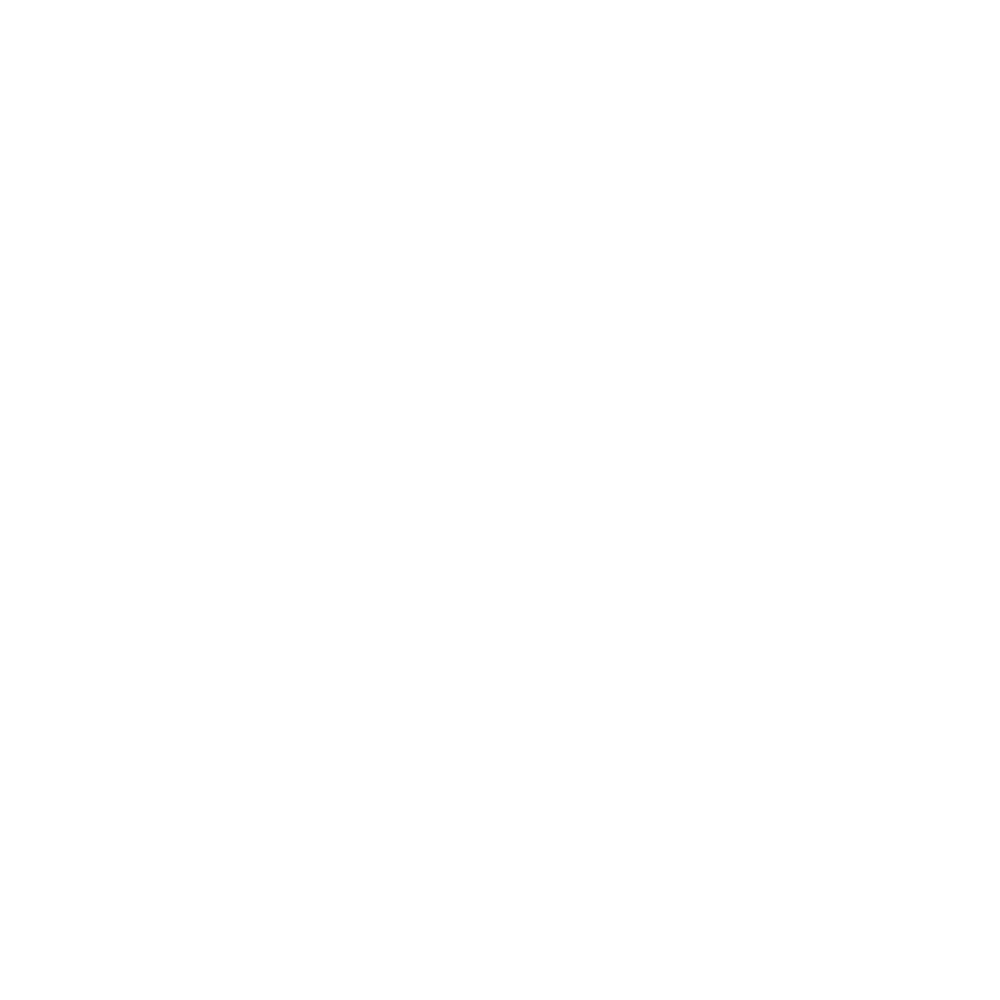

<IPython.core.display.Javascript object>


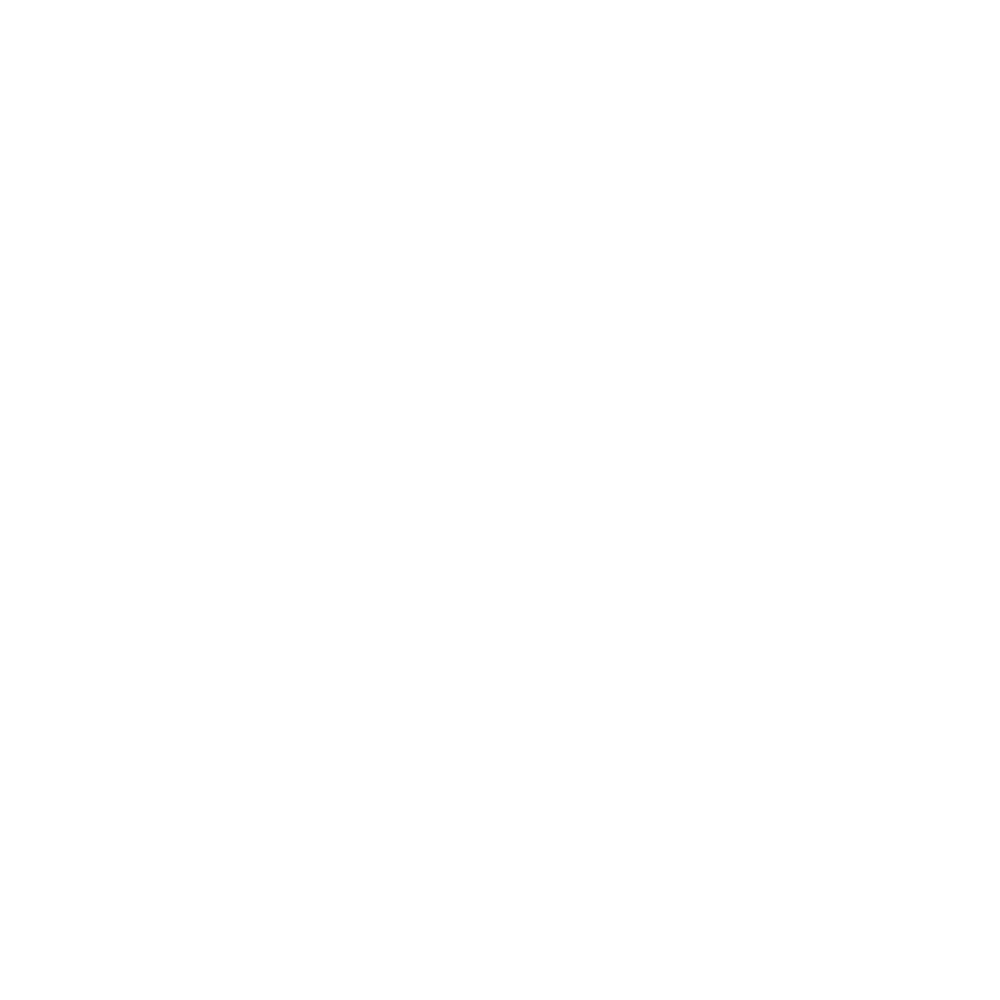

<IPython.core.display.Javascript object>


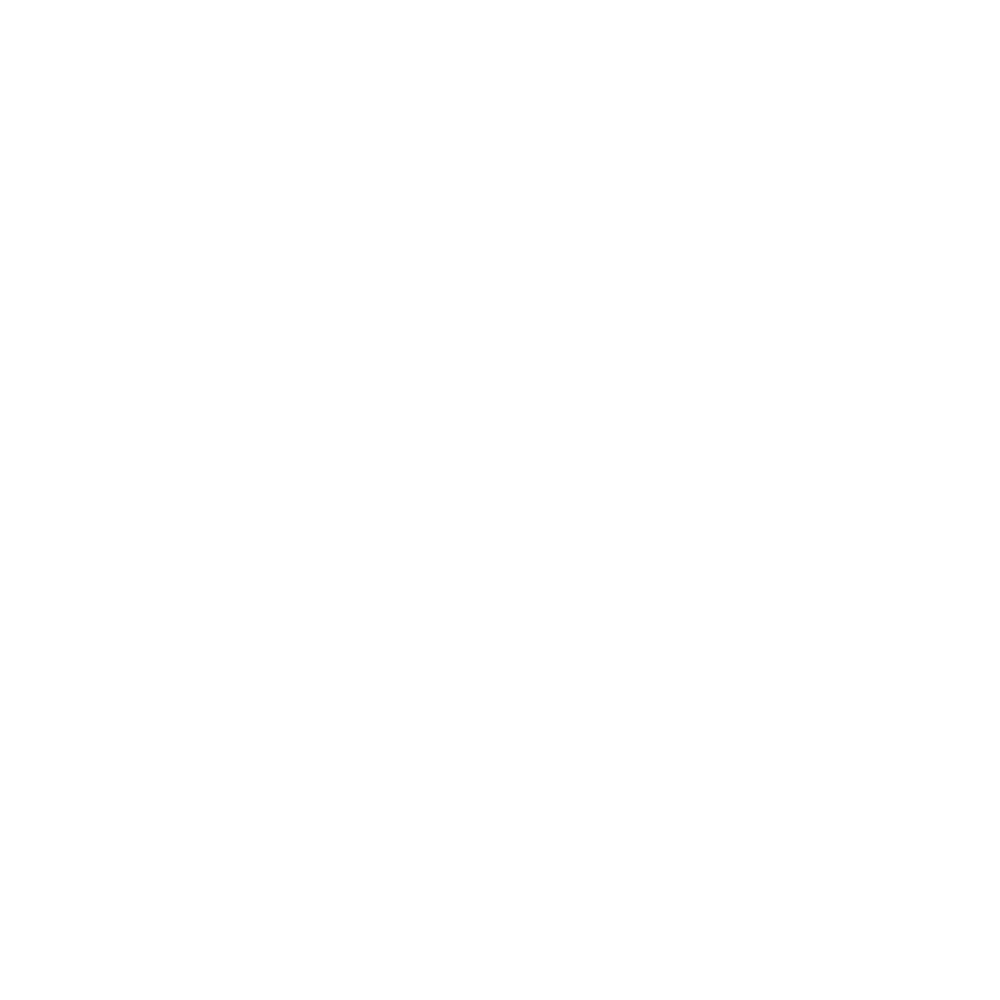

<IPython.core.display.Javascript object>


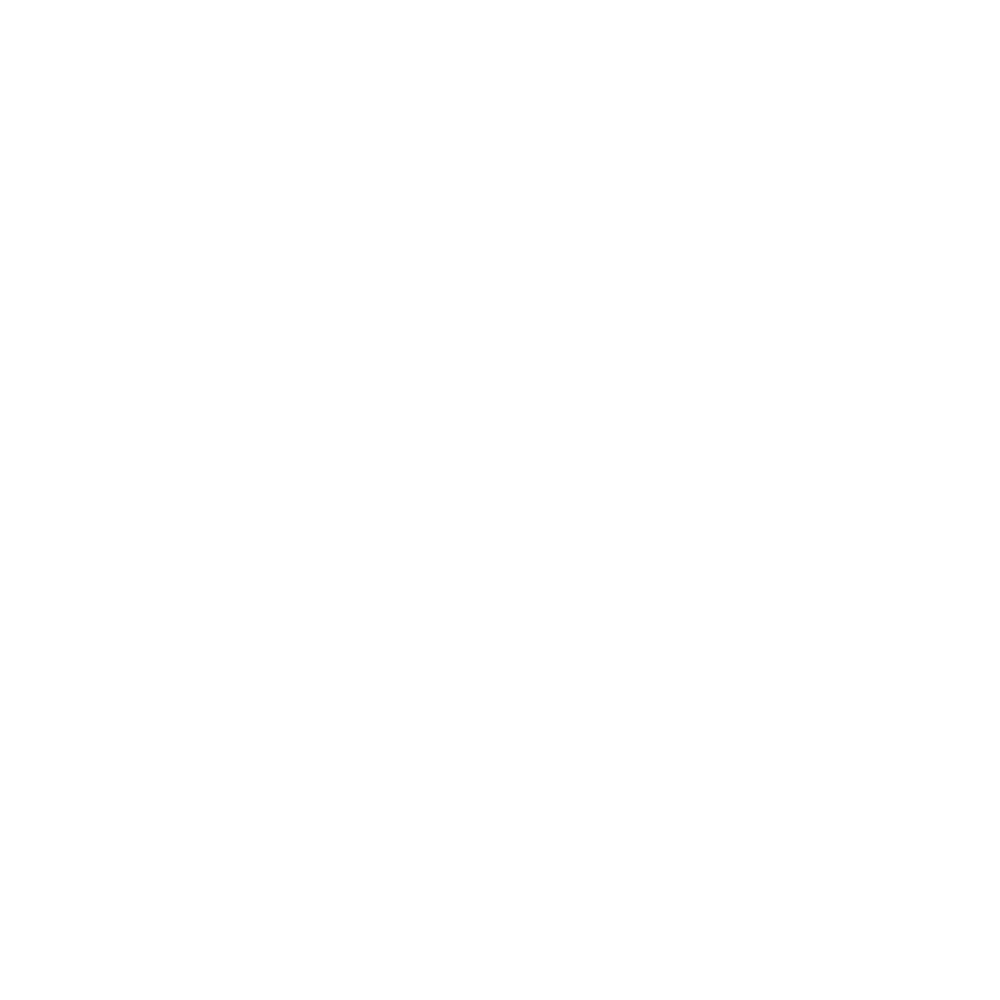

<IPython.core.display.Javascript object>


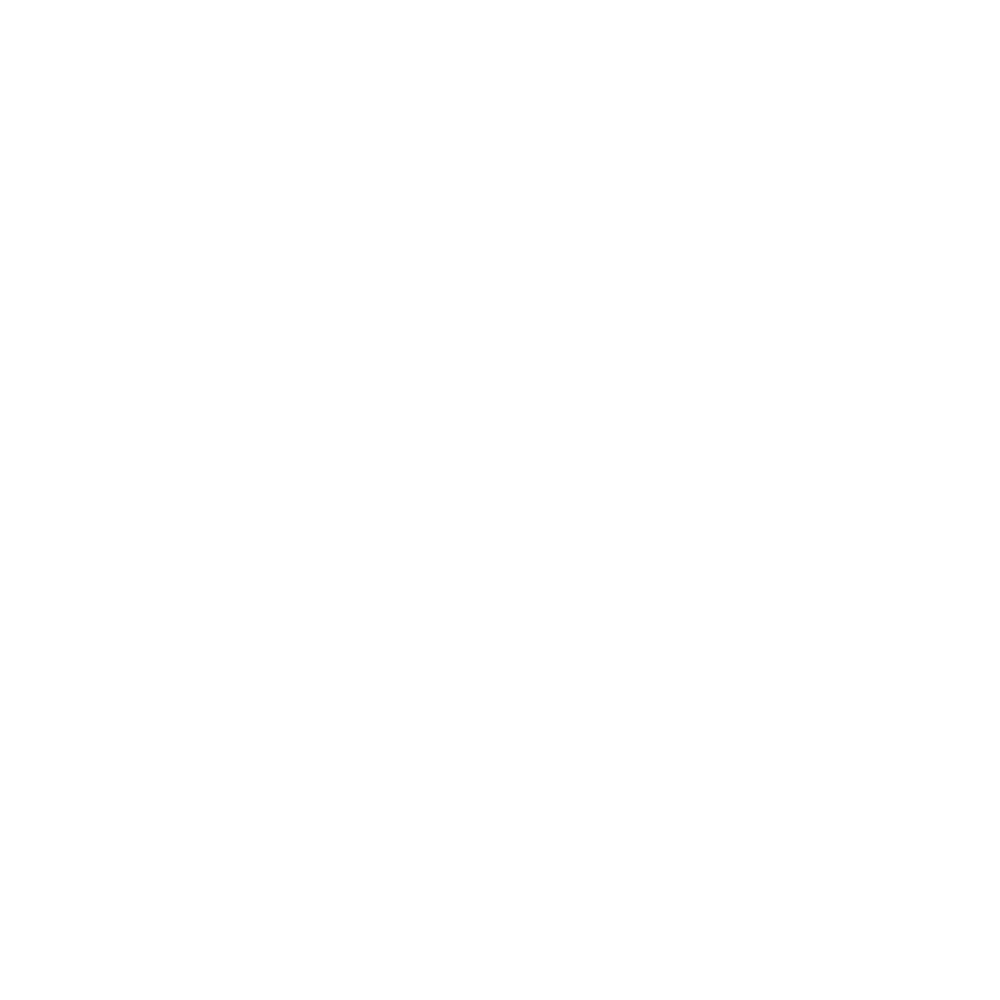

<IPython.core.display.Javascript object>


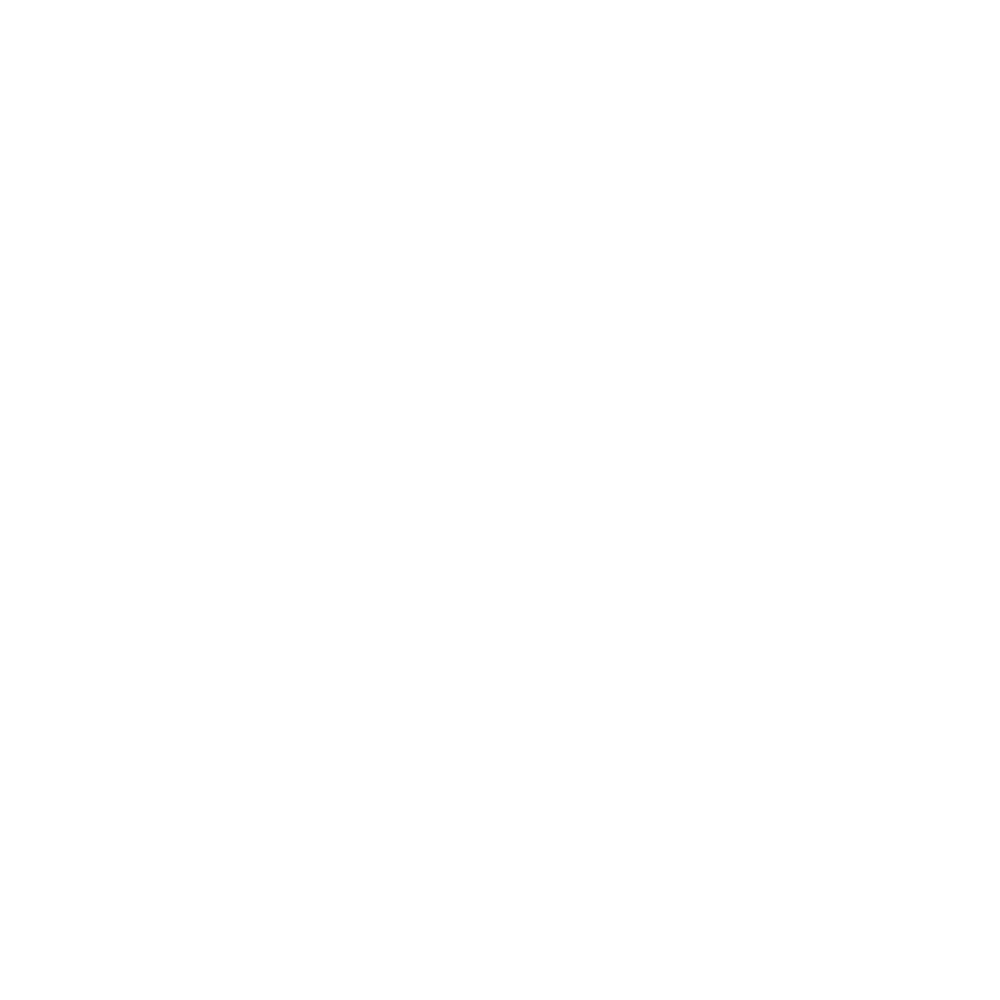

<IPython.core.display.Javascript object>


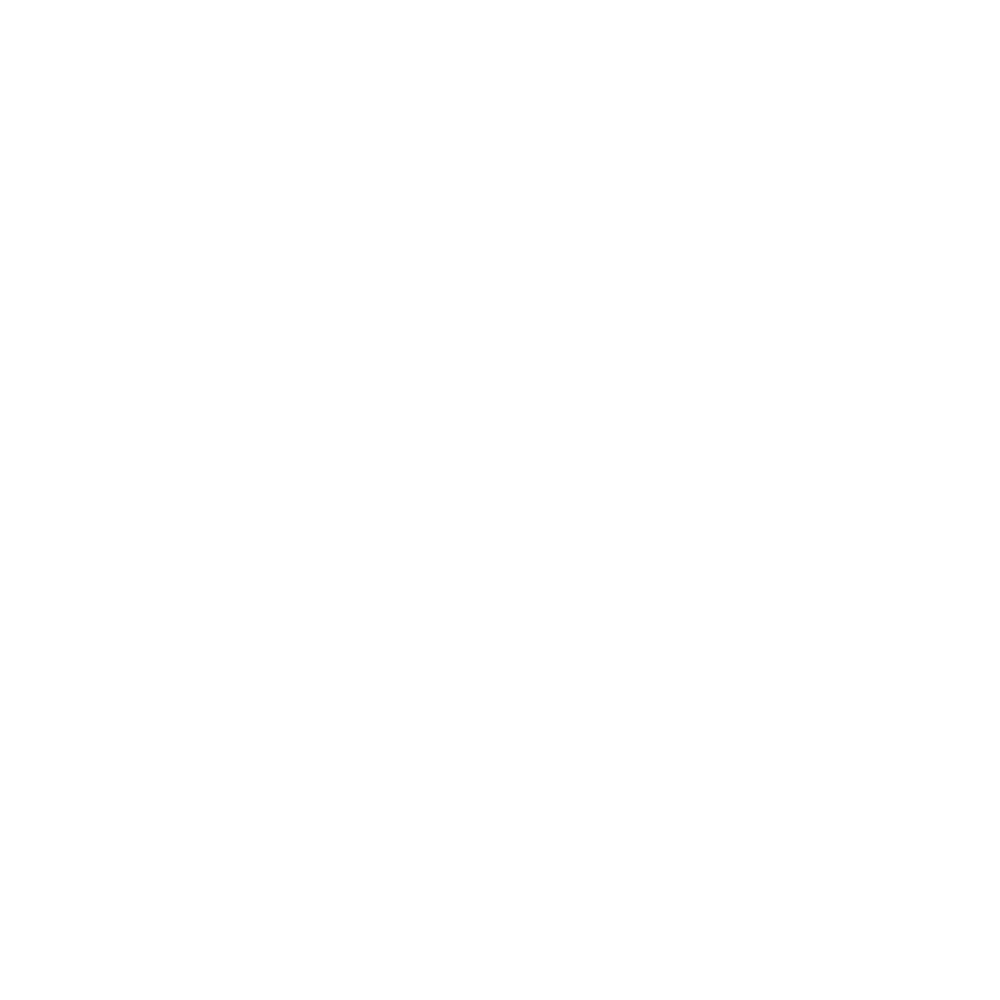

<IPython.core.display.Javascript object>


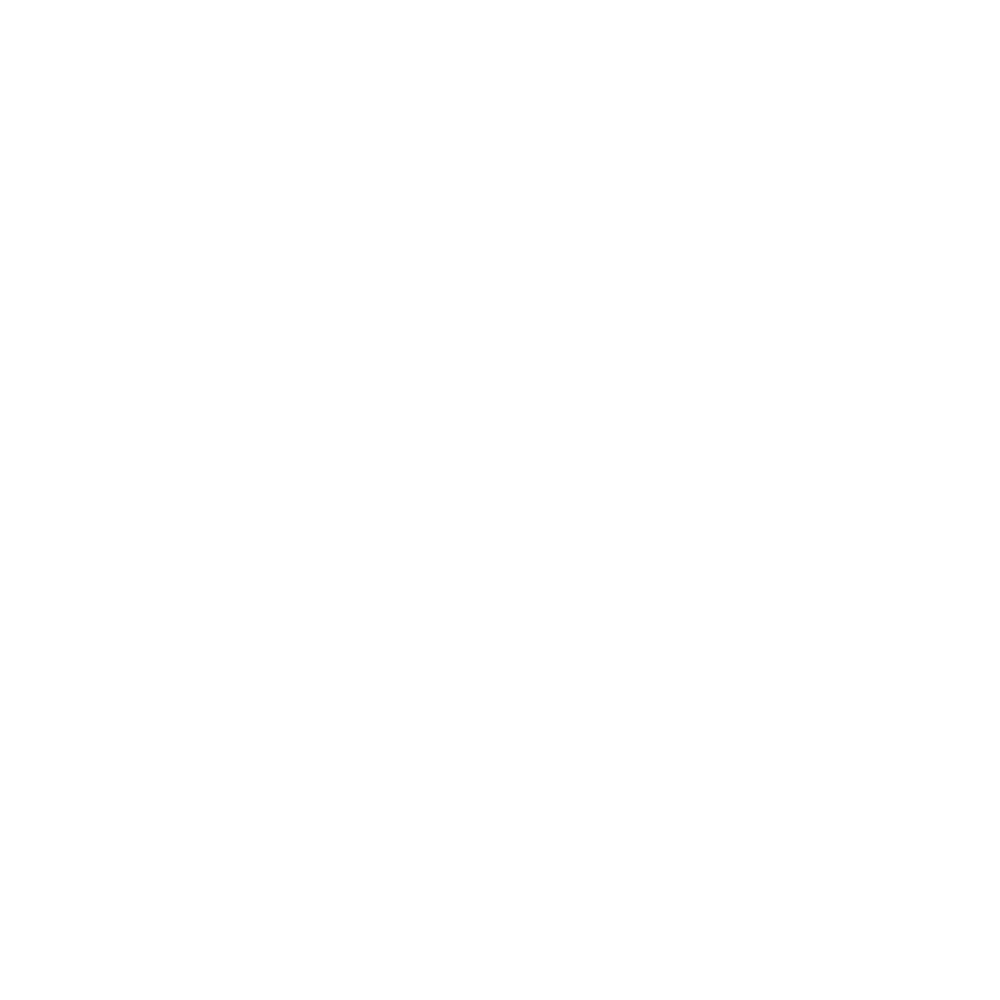

<IPython.core.display.Javascript object>


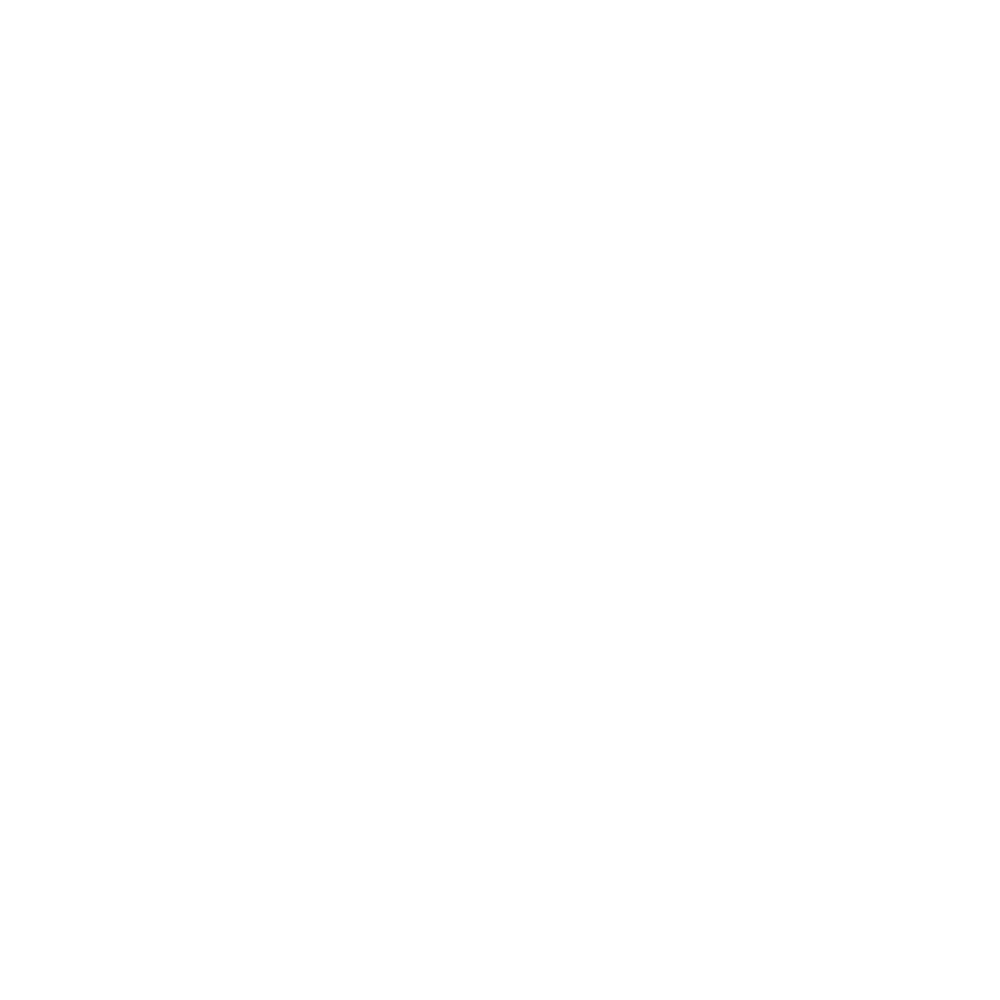

<IPython.core.display.Javascript object>


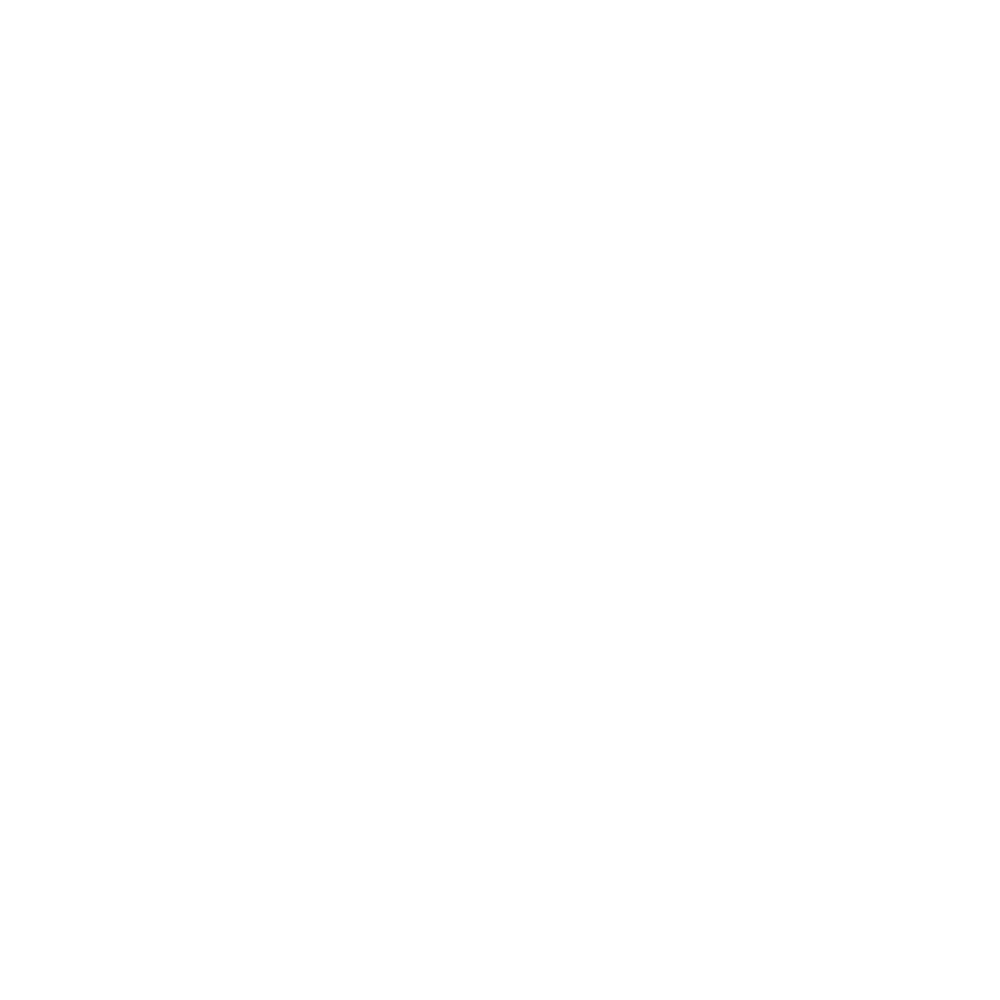

<IPython.core.display.Javascript object>


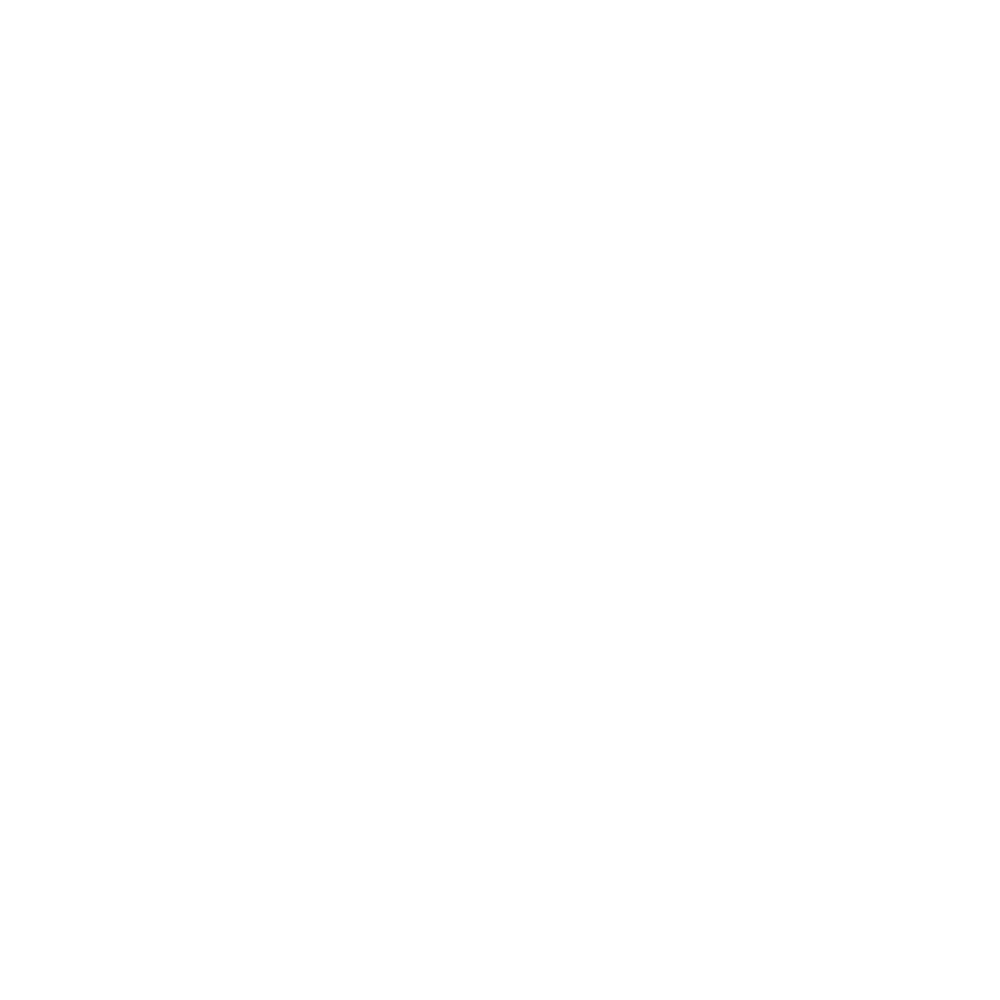

<IPython.core.display.Javascript object>


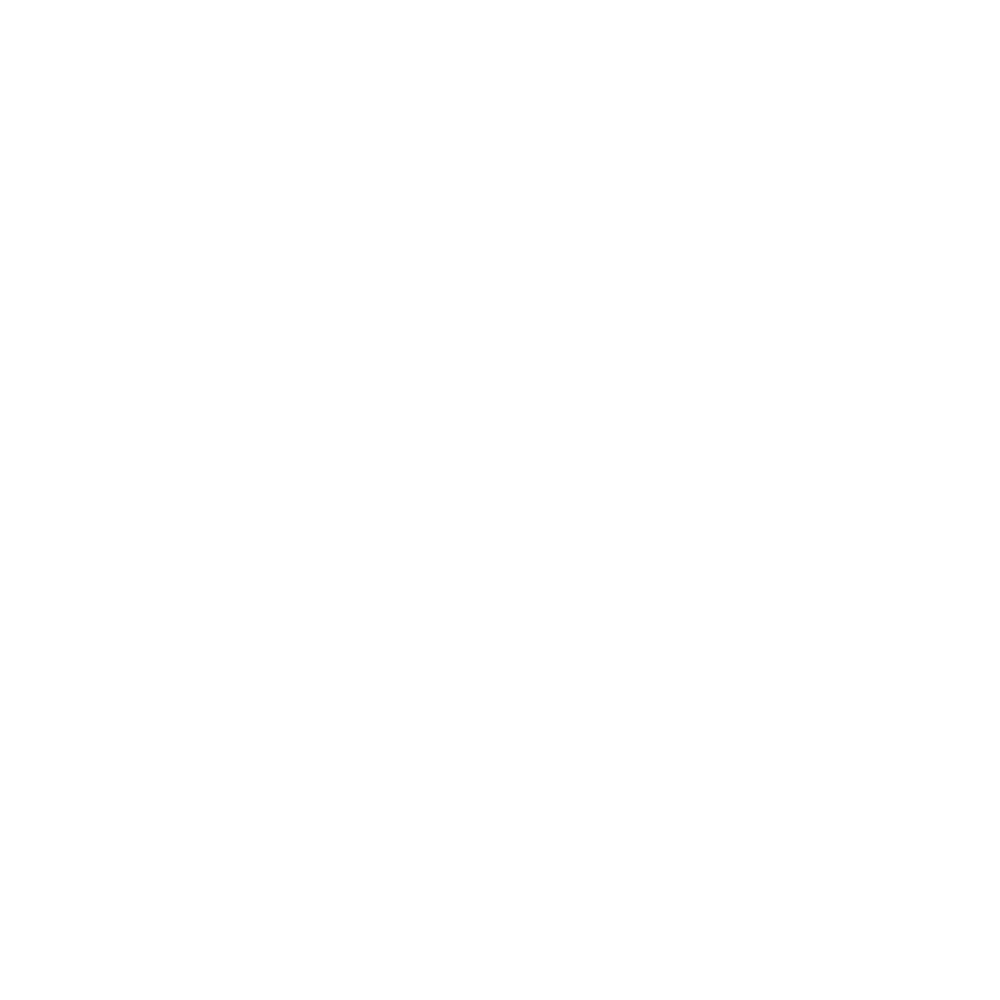

<IPython.core.display.Javascript object>


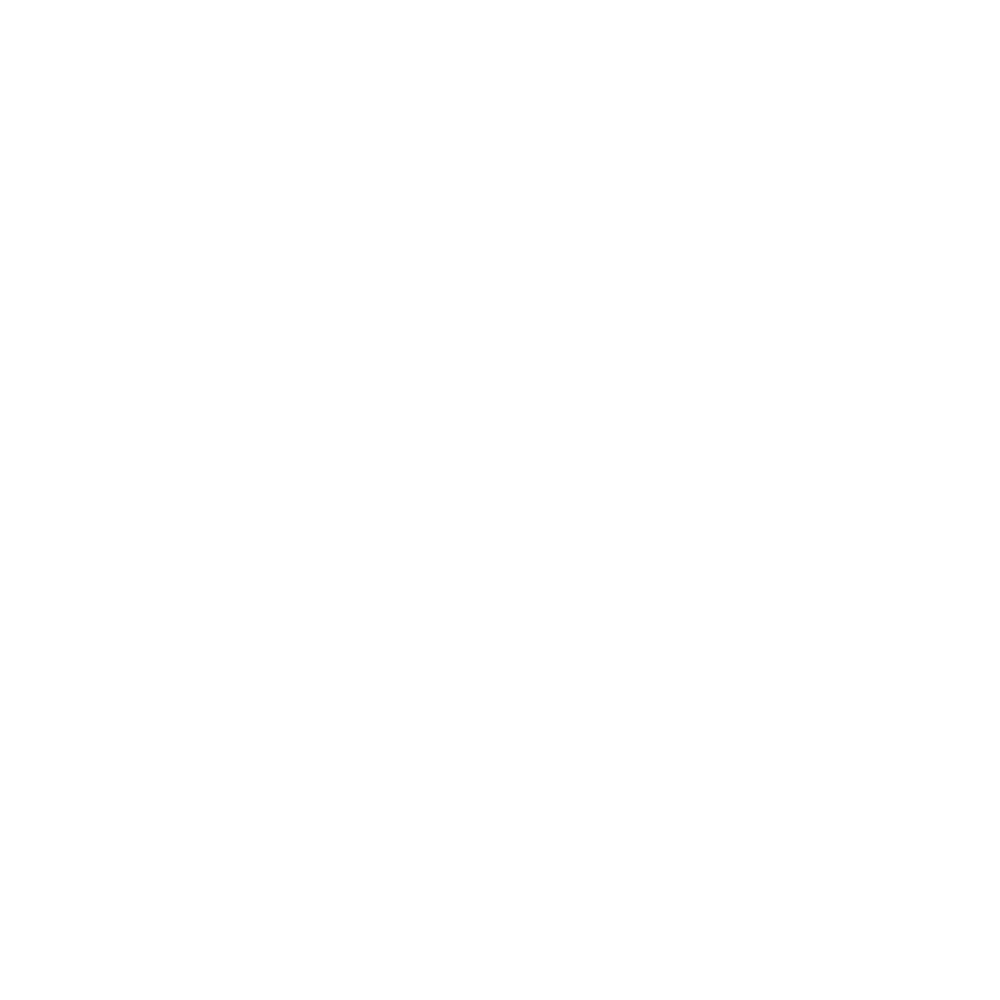

<IPython.core.display.Javascript object>


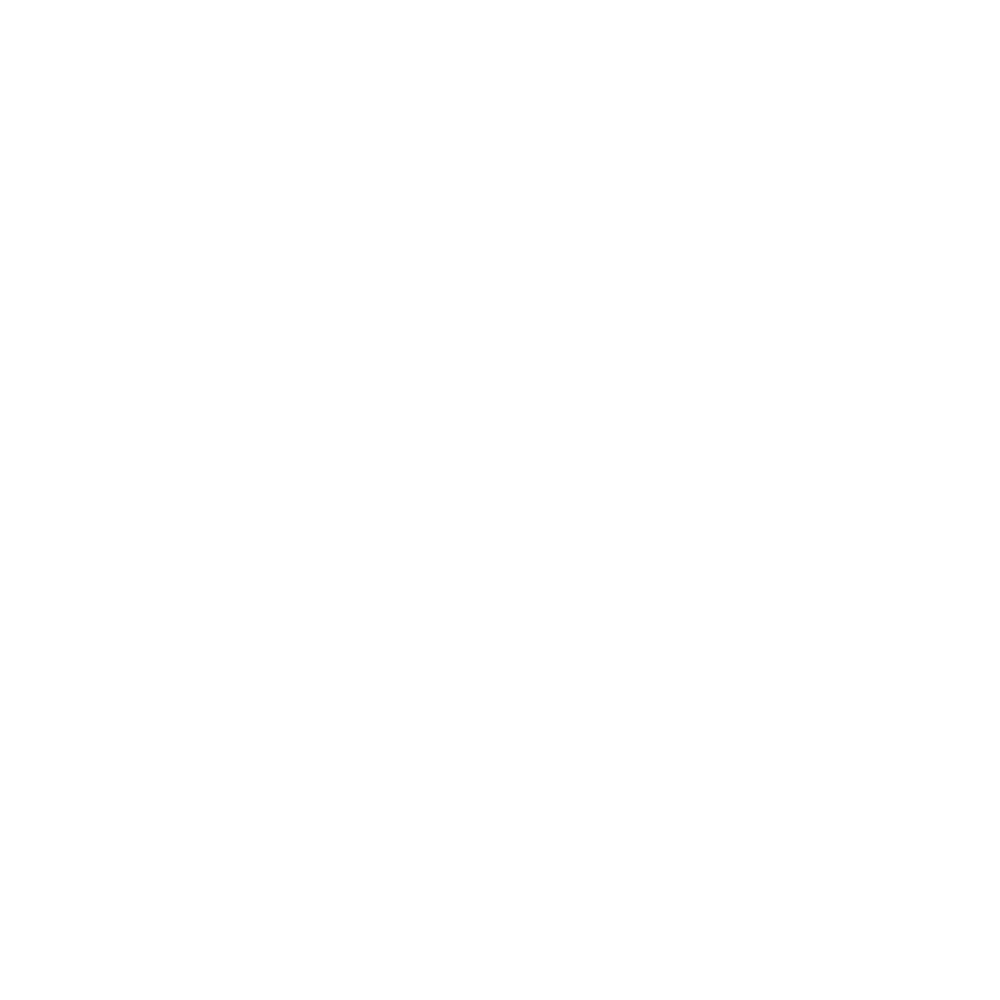

<IPython.core.display.Javascript object>


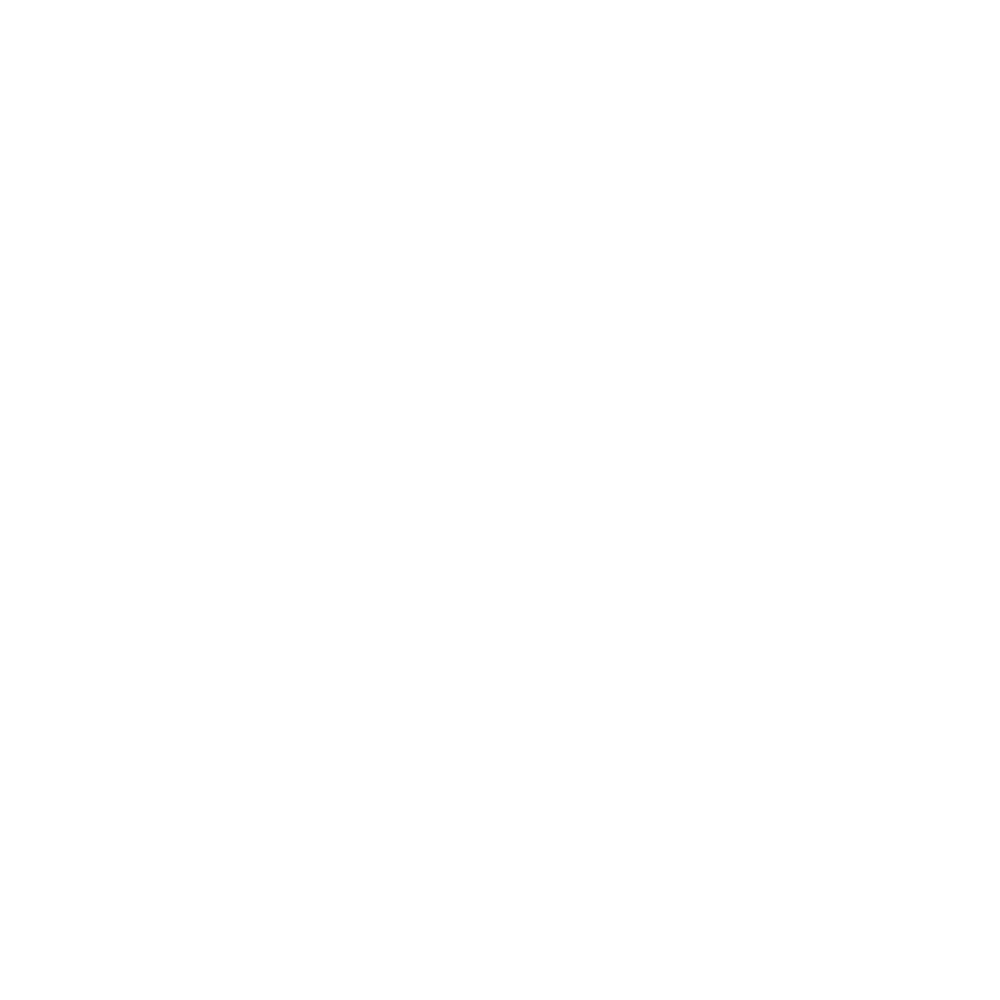

<IPython.core.display.Javascript object>


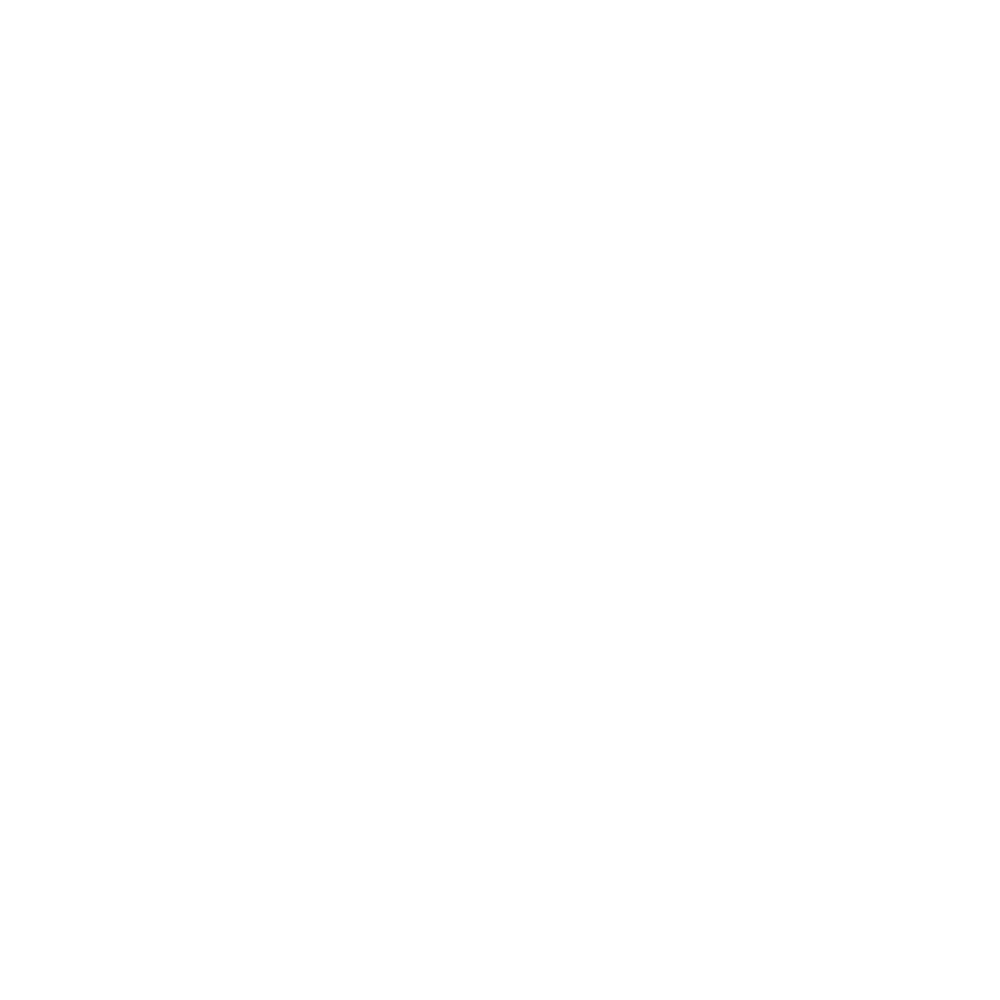

<IPython.core.display.Javascript object>


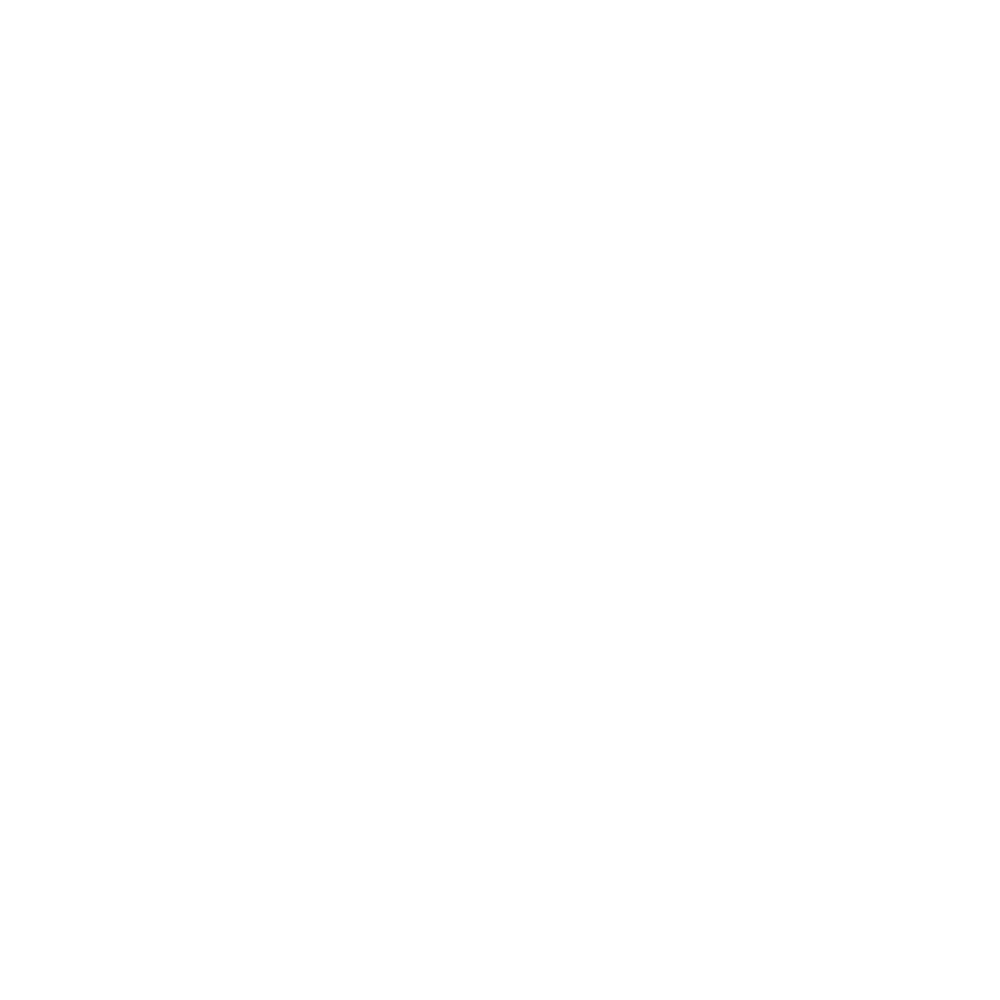

<IPython.core.display.Javascript object>


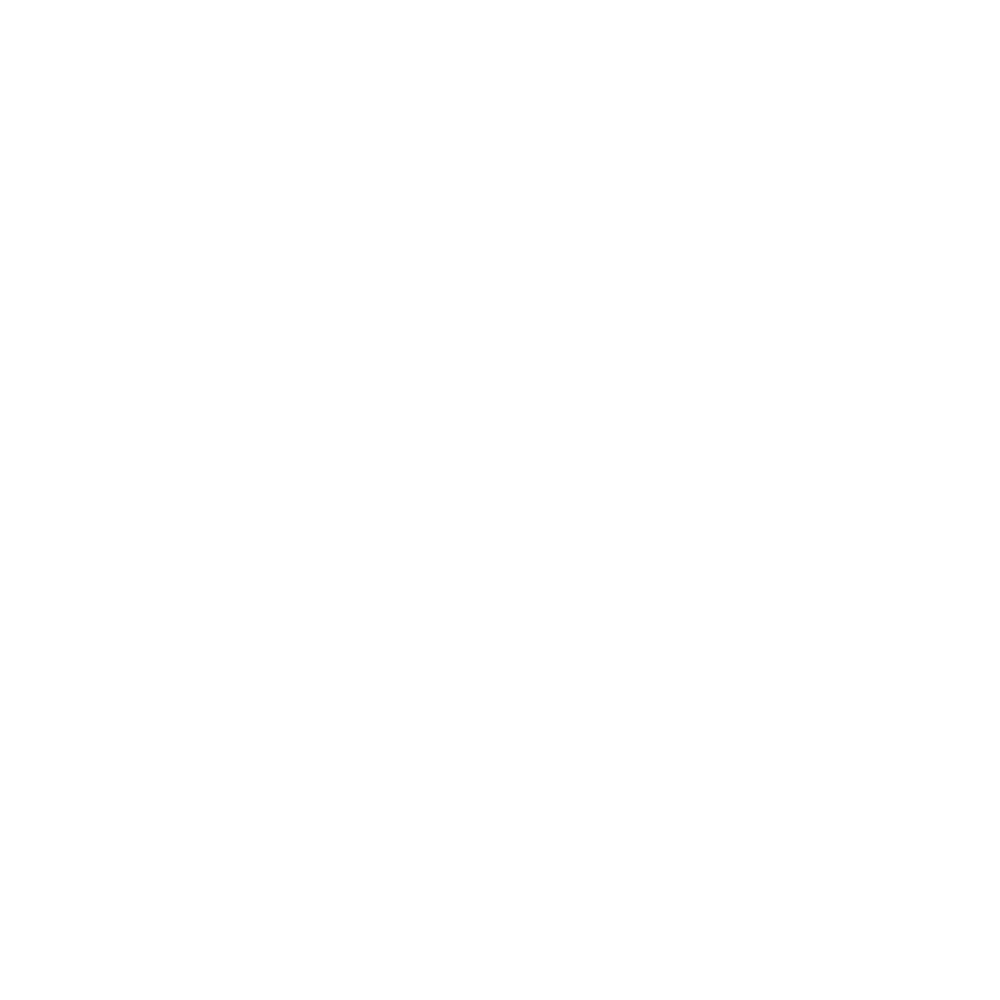

<IPython.core.display.Javascript object>


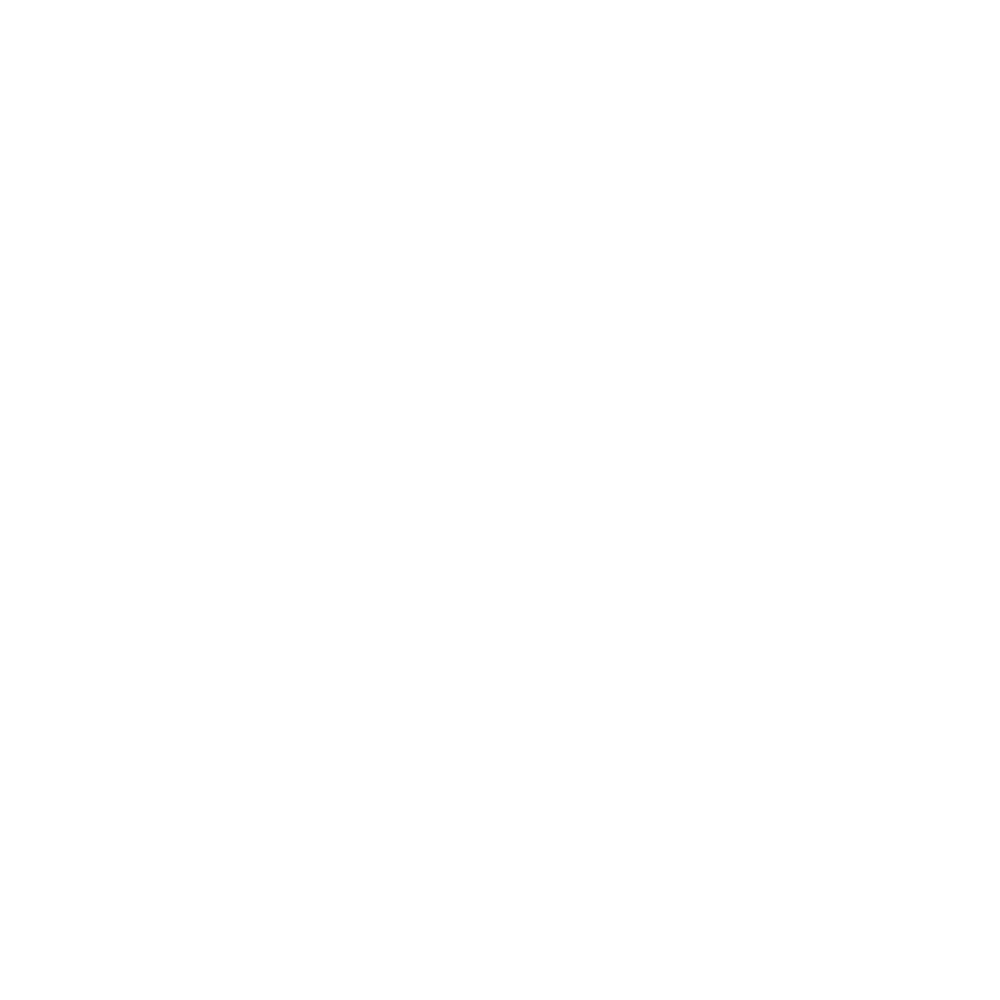

<IPython.core.display.Javascript object>


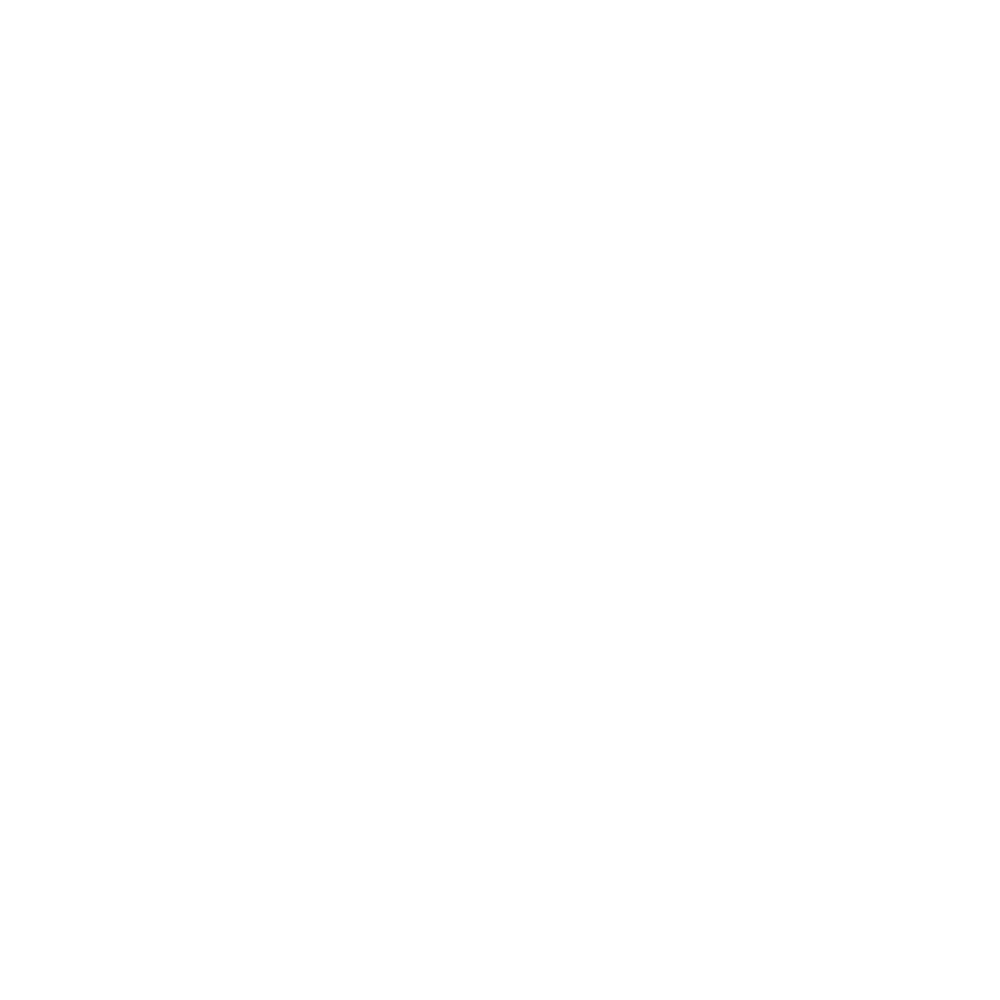

<IPython.core.display.Javascript object>


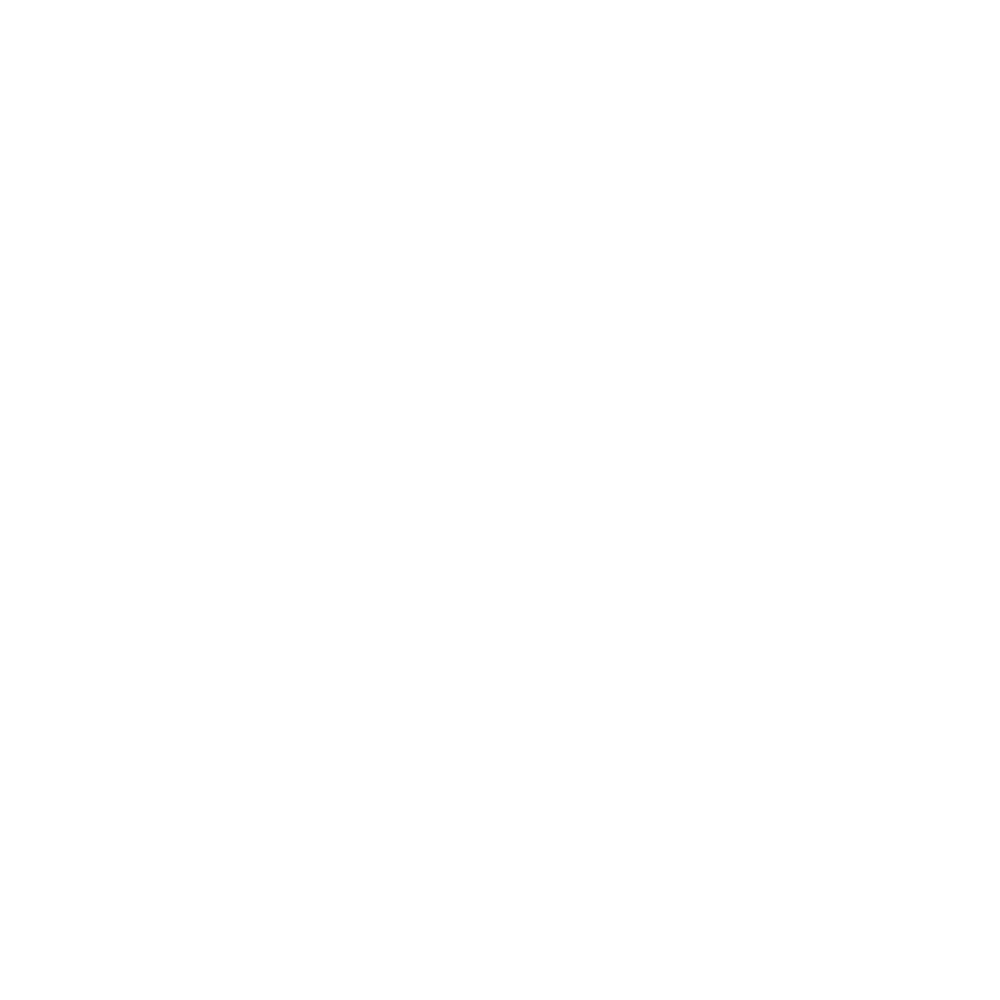

<IPython.core.display.Javascript object>


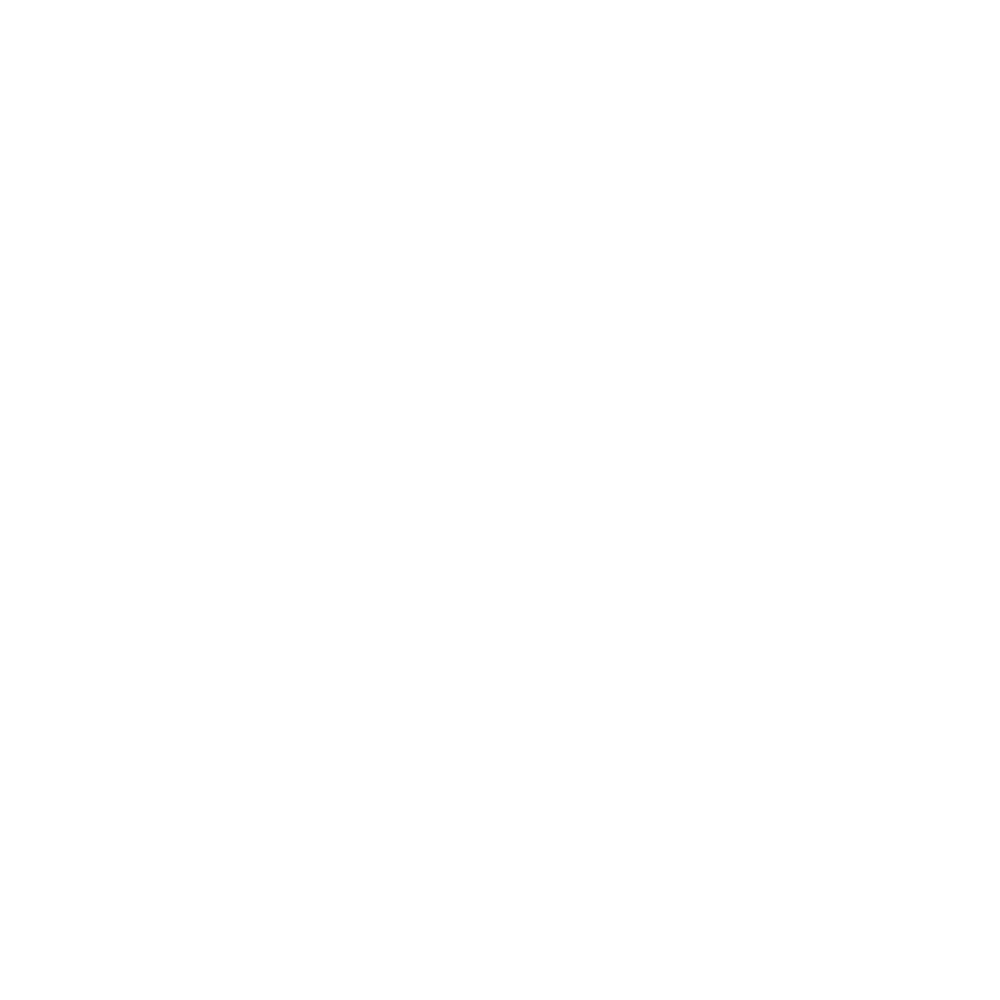

<IPython.core.display.Javascript object>


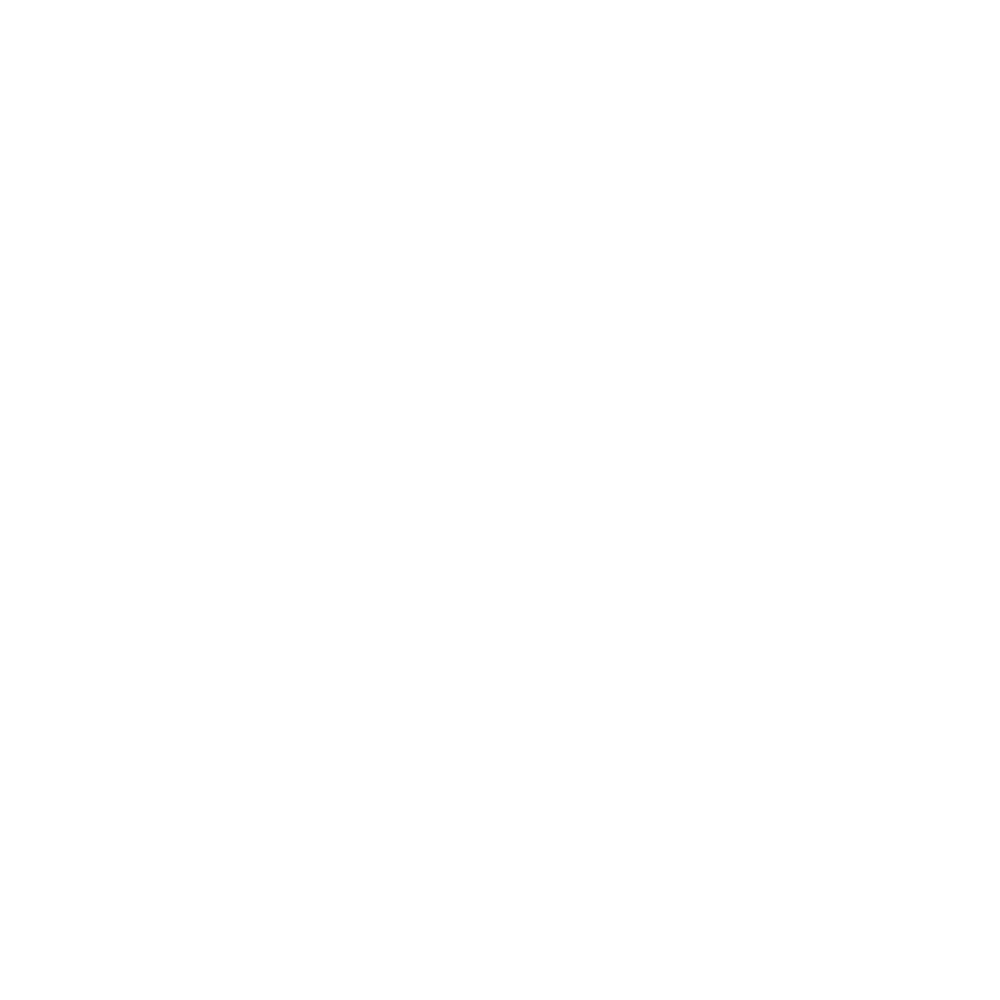

<IPython.core.display.Javascript object>


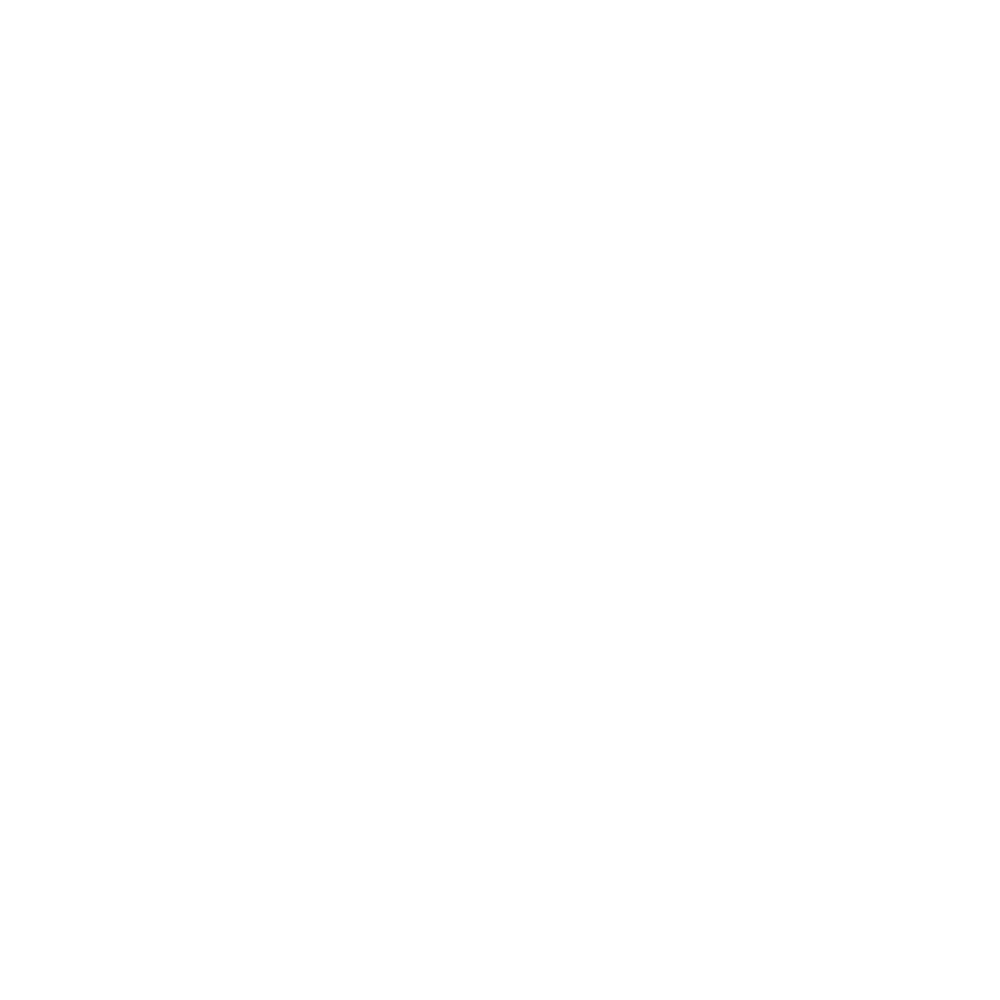

<IPython.core.display.Javascript object>


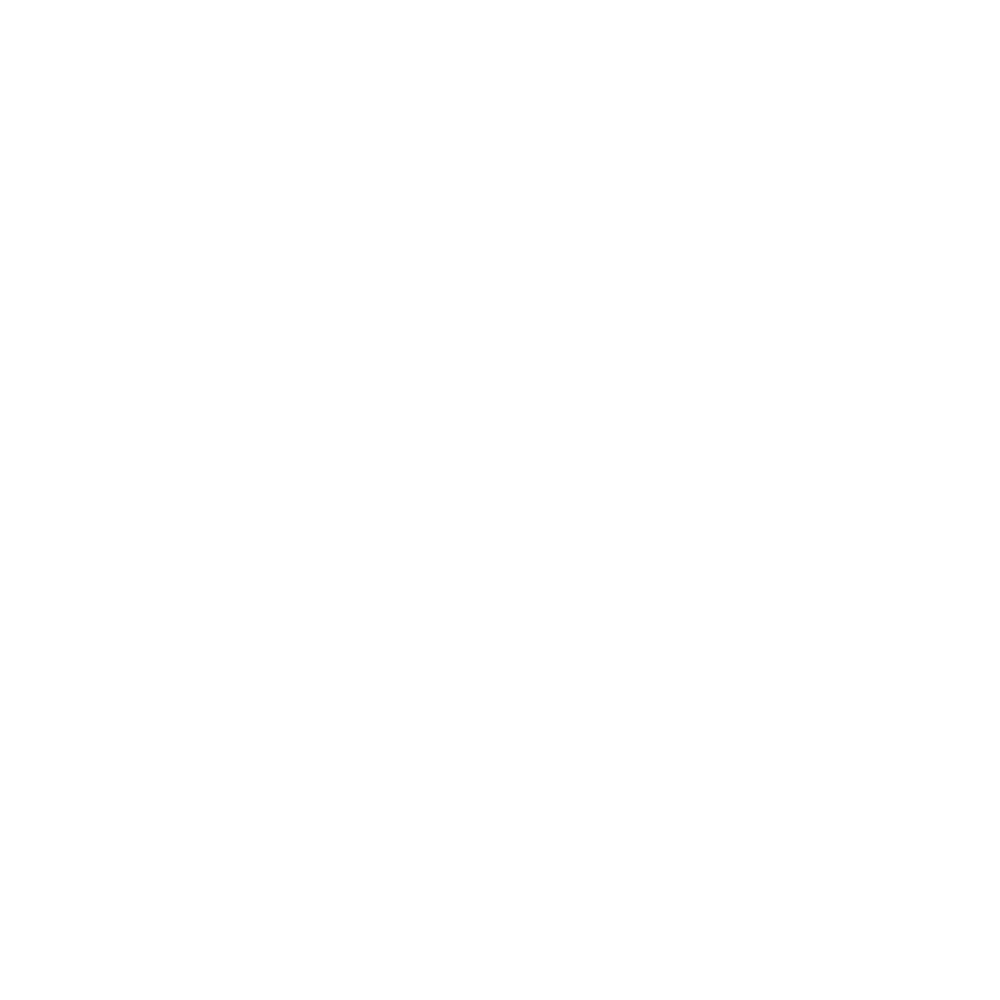

<IPython.core.display.Javascript object>


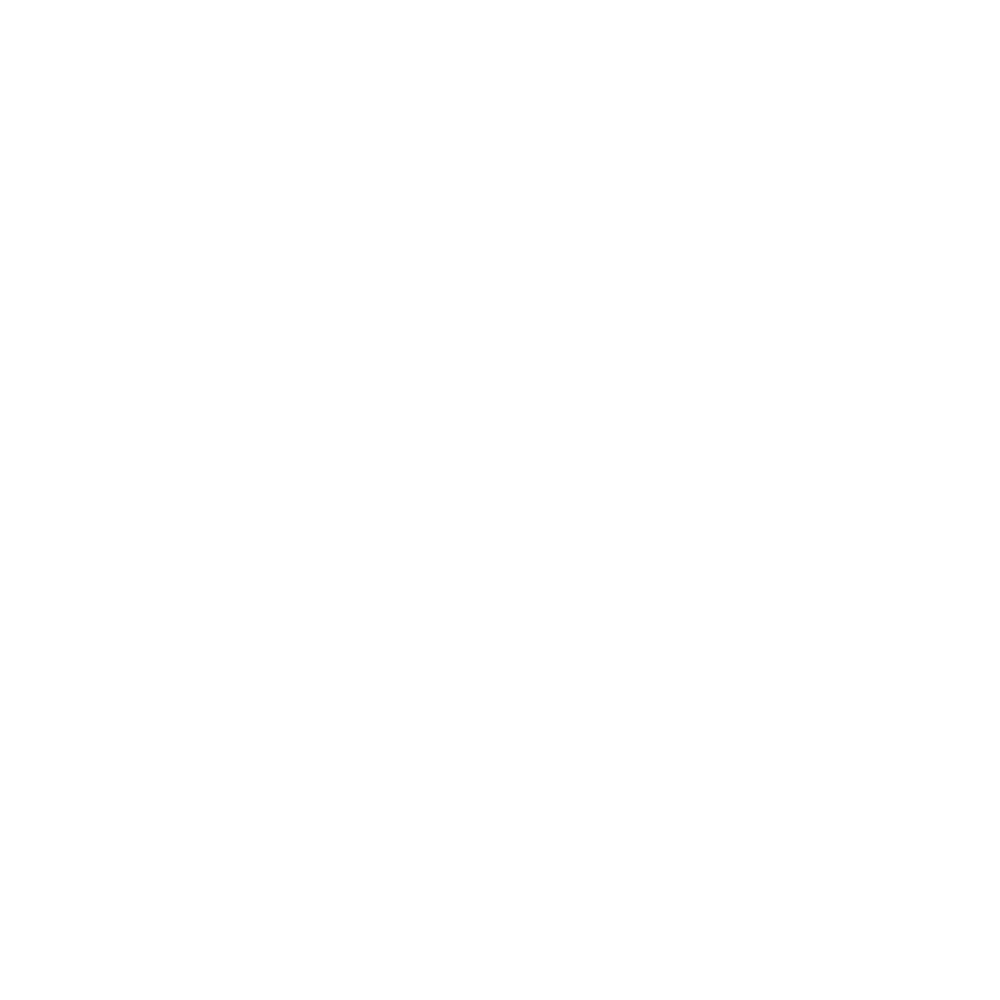

<IPython.core.display.Javascript object>


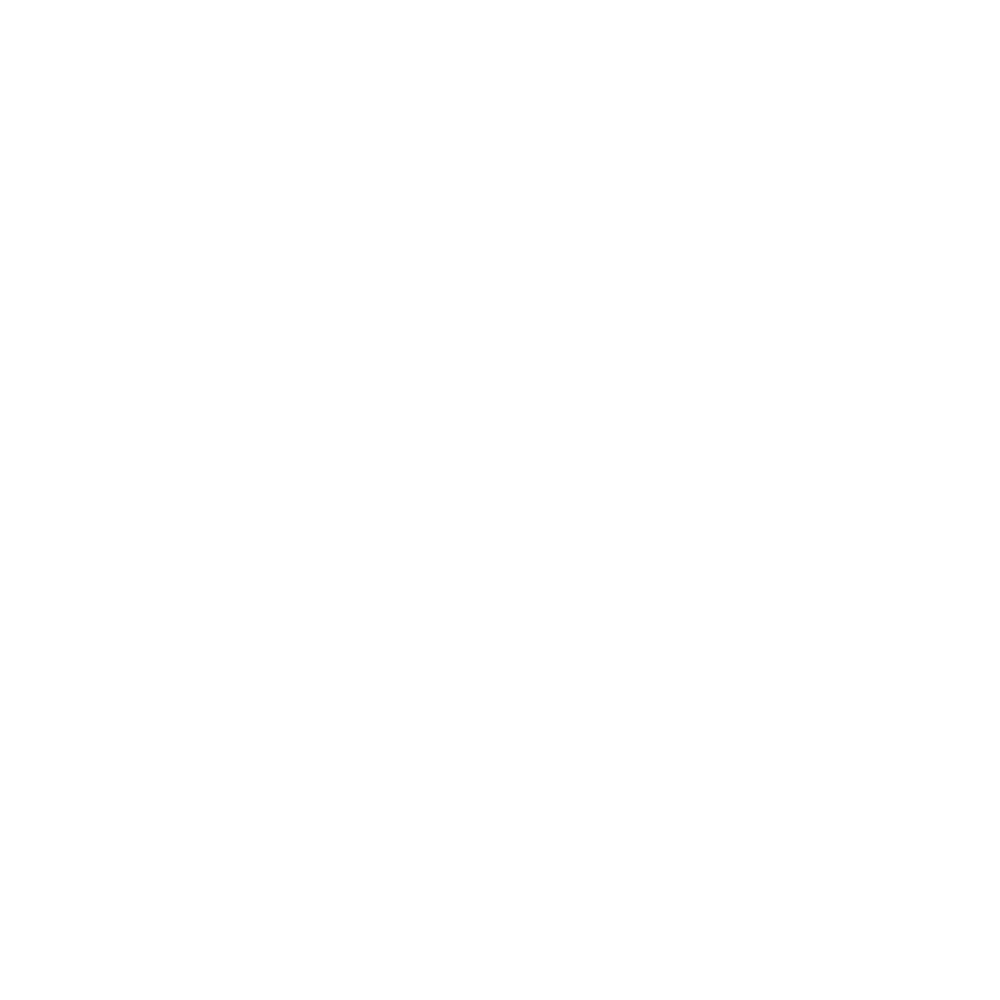

In [77]:
for iI in range( NumPlotTypes ):
    cVar = PlotColumnsList[iI]
    cCMapr = PlotCmapsList[iI]
    # do a plot for each month
    Monther = "Jan"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOJanDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCJanDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCJanDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Feb"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOFebDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOFebDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCFebDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCFebDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Mar"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOMarDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOMarDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCMarDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCMarDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Apr"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOAprDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOAprDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCAprDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCAprDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "May"
    cFigName = "DP_LOCA%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOMayDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOMayDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCMayDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCMayDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Jun"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOJunDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOJunDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCJunDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCJunDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Jul"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOJulDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOJulDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCJulDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCJulDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Aug"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOAugDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOAugDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCAugDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCAugDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Sep"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOSepDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOSepDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCSepDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCSepDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Oct"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLOOctDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLOOctDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCOctDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCOctDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Nov"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLONovDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLONovDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCNovDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCNovDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    Monther = "Dec"
    cFigName = "DP_LOCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdLODecDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdLODecDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s LOCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
    cFigName = "DP_BCCA_%s_%s.png" % (cVar, Monther)
    FigPath = os.path.normpath( os.path.join( OUT_DIR, 'Plots', cFigName ) )
    Fig1 = plt.figure()
    Fig1.set_size_inches(10.0, 10.0)
    ax11 = Fig1.add_subplot(111)
    DCWS.plot( ax=ax11, facecolor='none', edgecolor='xkcd:orange', 
               linewidth=2, label="Watershed" )
    gplt.cartogram( gpdBCDecDF, scale=cVar, hue=cVar, cmap=cCMapr, ax=ax11,
                    legend=True, legend_var='hue', k=NumK )
    gplt.polyplot( gpdBCDecDF, ax=ax11, facecolor='lightgray', edgecolor='white' )
    ax11.set_xlim( ( 286500, 348800 ) )
    ax11.set_ylim( ( 3289800, 3355800 ) )
    ax11.set_title("%s BCCA Grid Cell Precip. %s" % (Monther, cVar), fontsize=16 )
    Fig1.savefig( FigPath )
    plt.close( Fig1 )
    Fig1.clf()
# end of plot for